# Prepare Data

In [1]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
import lightgbm as lgb
import copy
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from datetime import datetime,timedelta

In [2]:
file_suffix = '.csv' # format of target data file
path = '../data/dataSets/training/' # path to target data file
filename = 'volume(table 6)_training' # target data file name

In [3]:
# Aggregate valume data into 20 minutes time window
# Reference from: https://github.com/chenzeyuczy/KDD2017/blob/master/scripts/aggregate_volume.py
# output: .csv file at current directory

def avgVolume(in_file):

    out_suffix = '_20min_avg_volume'
    in_file_name = in_file + file_suffix
    out_file_name = in_file.split('_')[1] + out_suffix + file_suffix

    # Step 1: Load volume data
    fr = open(path + in_file_name, 'r')
    fr.readline()  # skip the header
    vol_data = fr.readlines()
    fr.close()

    # Step 2: Create a dictionary to caculate and store volume per time window
    volumes = {}  # key: time window value: dictionary
    for i in range(len(vol_data)):
        each_pass = vol_data[i].replace('"', '').split(',')
        tollgate_id = each_pass[1]
        direction = each_pass[2]

        pass_time = each_pass[0]
        pass_time = datetime.strptime(pass_time, "%Y-%m-%d %H:%M:%S")
        time_window_minute = int(math.floor(pass_time.minute / 20) * 20)
        #print pass_time
        start_time_window = datetime(pass_time.year, pass_time.month, pass_time.day,
                                     pass_time.hour, time_window_minute, 0)

        if start_time_window not in volumes:
            volumes[start_time_window] = {}
        if tollgate_id not in volumes[start_time_window]:
            volumes[start_time_window][tollgate_id] = {}
        if direction not in volumes[start_time_window][tollgate_id]:
            volumes[start_time_window][tollgate_id][direction] = 1
        else:
            volumes[start_time_window][tollgate_id][direction] += 1

    # Step 3: format output for tollgate and direction per time window
    fw = open(out_file_name, 'w')
    fw.writelines(','.join(['"tollgate_id"', '"time_window"', '"direction"', '"volume"']) + '\n')
    time_windows = list(volumes.keys())
    time_windows.sort()
    for time_window_start in time_windows:
        time_window_end = time_window_start + timedelta(minutes=20)
        for tollgate_id in volumes[time_window_start]:
            for direction in volumes[time_window_start][tollgate_id]:
               out_line = ','.join(['"' + str(tollgate_id) + '"', 
                                 '"[' + str(time_window_start) + ',' + str(time_window_end) + ')"',
                                 '"' + str(direction) + '"',
                                 '"' + str(volumes[time_window_start][tollgate_id][direction]) + '"',
                               ]) + '\n'
               fw.writelines(out_line)
    fw.close()

In [4]:
# Load and convert phase 1 training data and save into training_20min_avg_volume.csv

avgVolume(filename)

In [5]:
df = pd.read_csv('training_20min_avg_volume.csv')
df.shape

(10063, 4)

In [6]:
df.head() # Start date/time of training data set

,tollgate_id,time_window,direction,volume
0,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,17
1,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,181
2,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,13
3,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,140
4,2,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,2


In [7]:
df.tail() # End date/time of training data set

,tollgate_id,time_window,direction,volume
10058,2,"[2016-10-17 23:40:00,2016-10-18 00:00:00)",0,18
10059,3,"[2016-10-17 23:40:00,2016-10-18 00:00:00)",0,15
10060,3,"[2016-10-17 23:40:00,2016-10-18 00:00:00)",1,22
10061,1,"[2016-10-17 23:40:00,2016-10-18 00:00:00)",0,2
10062,1,"[2016-10-17 23:40:00,2016-10-18 00:00:00)",1,10


# Study Data

In [8]:
tollgate_1_direction_0 = df[df['tollgate_id'] == 1][df['direction'] == 0]
tollgate_1_direction_0.shape

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


(2084, 4)

In [9]:
tollgate_1_direction_0.head()

,tollgate_id,time_window,direction,volume
2,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,13
5,1,"[2016-09-19 00:20:00,2016-09-19 00:40:00)",0,6
11,1,"[2016-09-19 00:40:00,2016-09-19 01:00:00)",0,9
16,1,"[2016-09-19 01:00:00,2016-09-19 01:20:00)",0,10
18,1,"[2016-09-19 01:20:00,2016-09-19 01:40:00)",0,14


In [10]:
tollgate_1_direction_1 = df[df['tollgate_id'] == 1][df['direction'] == 1]
tollgate_1_direction_1.shape

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


(2084, 4)

In [11]:
tollgate_1_direction_1.head()

,tollgate_id,time_window,direction,volume
3,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,140
6,1,"[2016-09-19 00:20:00,2016-09-19 00:40:00)",1,56
12,1,"[2016-09-19 00:40:00,2016-09-19 01:00:00)",1,31
17,1,"[2016-09-19 01:00:00,2016-09-19 01:20:00)",1,4
19,1,"[2016-09-19 01:20:00,2016-09-19 01:40:00)",1,14


In [12]:
tollgate_2_direction_0 = df[df['tollgate_id'] == 2][df['direction'] == 0]
tollgate_2_direction_0.shape

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


(1724, 4)

In [13]:
tollgate_2_direction_0.head()

,tollgate_id,time_window,direction,volume
4,2,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,2
15,2,"[2016-09-19 01:00:00,2016-09-19 01:20:00)",0,1
22,2,"[2016-09-19 01:40:00,2016-09-19 02:00:00)",0,2
64,2,"[2016-09-19 05:00:00,2016-09-19 05:20:00)",0,14
71,2,"[2016-09-19 05:20:00,2016-09-19 05:40:00)",0,12


In [14]:
tollgate_3_direction_0 = df[df['tollgate_id'] == 3][df['direction'] == 0]
tollgate_3_direction_0.shape

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


(2086, 4)

In [15]:
tollgate_3_direction_0.head()

,tollgate_id,time_window,direction,volume
0,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,17
7,3,"[2016-09-19 00:20:00,2016-09-19 00:40:00)",0,16
9,3,"[2016-09-19 00:40:00,2016-09-19 01:00:00)",0,16
13,3,"[2016-09-19 01:00:00,2016-09-19 01:20:00)",0,17
20,3,"[2016-09-19 01:20:00,2016-09-19 01:40:00)",0,17


In [16]:
tollgate_3_direction_1 = df[df['tollgate_id'] == 3][df['direction'] == 1]
tollgate_3_direction_1.shape

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


(2085, 4)

In [17]:
tollgate_3_direction_1.head()

,tollgate_id,time_window,direction,volume
1,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,181
8,3,"[2016-09-19 00:20:00,2016-09-19 00:40:00)",1,112
10,3,"[2016-09-19 00:40:00,2016-09-19 01:00:00)",1,93
14,3,"[2016-09-19 01:00:00,2016-09-19 01:20:00)",1,4
21,3,"[2016-09-19 01:20:00,2016-09-19 01:40:00)",1,5


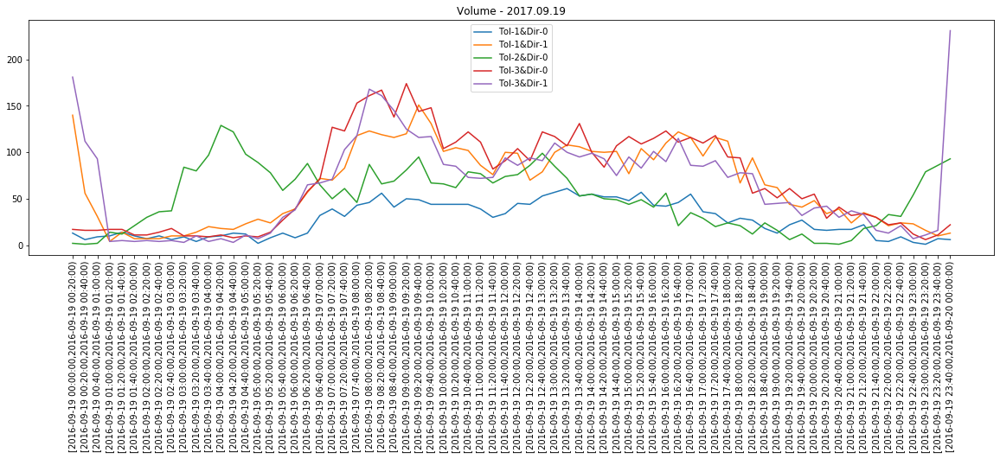

In [18]:
# Vosualize data pattern
plt.figure(figsize=(20,5))

xticks = tollgate_1_direction_0['time_window'].values
plt.plot(xticks[:72], tollgate_1_direction_0['volume'][:72], label='Tol-1&Dir-0')
plt.plot(xticks[:72], tollgate_1_direction_1['volume'][:72], label='Tol-1&Dir-1')
plt.plot(xticks[:72], tollgate_2_direction_0['volume'][:72], label='Tol-2&Dir-0')
plt.plot(xticks[:72], tollgate_3_direction_0['volume'][:72], label='Tol-3&Dir-0')
plt.plot(xticks[:72], tollgate_3_direction_1['volume'][:72], label='Tol-3&Dir-1')
plt.xticks(xticks[:72], xticks[:72], rotation='vertical')
plt.title('Volume - 2017.09.19')
plt.legend()
plt.show()

In [19]:
# Study the raw data
df_raw = pd.read_csv(path + filename + file_suffix)
df_raw.head()

,time,tollgate_id,direction,vehicle_model,has_etc,vehicle_type
0,2016-09-19 23:09:25,2,0,1,0,NaN
1,2016-09-19 23:11:53,2,0,1,0,NaN
2,2016-09-19 23:13:54,2,0,1,0,NaN
3,2016-09-19 23:17:48,1,0,1,1,NaN
4,2016-09-19 23:16:07,2,0,1,0,NaN


In [20]:
df_raw['date_time'] = pd.to_datetime(df_raw['time'], format="%Y-%m-%d %H:%M:%S")
df_raw['month'] = df_raw['date_time'].apply(lambda x: x.month)
df_raw['day'] = df_raw['date_time'].apply(lambda x: x.day)
df_raw['weekday'] = df_raw['date_time'].apply(lambda x: x.dayofweek)
df_raw['hour'] = df_raw['date_time'].apply(lambda x: x.hour)
df_raw['minute'] = df_raw['date_time'].apply(lambda x: x.minute)

df_raw['vehicle_type'] = df_raw['vehicle_type'].where((pd.notnull(df_raw['vehicle_type'])), 'Unknown')
df_raw.head()

,time,tollgate_id,direction,vehicle_model,has_etc,vehicle_type,date_time,month,day,weekday,hour,minute
0,2016-09-19 23:09:25,2,0,1,0,Unknown,2016-09-19 23:09:25,9,19,0,23,9
1,2016-09-19 23:11:53,2,0,1,0,Unknown,2016-09-19 23:11:53,9,19,0,23,11
2,2016-09-19 23:13:54,2,0,1,0,Unknown,2016-09-19 23:13:54,9,19,0,23,13
3,2016-09-19 23:17:48,1,0,1,1,Unknown,2016-09-19 23:17:48,9,19,0,23,17
4,2016-09-19 23:16:07,2,0,1,0,Unknown,2016-09-19 23:16:07,9,19,0,23,16


In [21]:
# Study Vehicles pass at midnight
df_test = df_raw.copy()
df_test = df_test[(df_test['hour'] == 23) | (df_test['hour'] == 0)]
df_test = df_test[df_test['month'] == 9][df_test['day'] == 19]
df_test.head() 

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


,time,tollgate_id,direction,vehicle_model,has_etc,vehicle_type,date_time,month,day,weekday,hour,minute
0,2016-09-19 23:09:25,2,0,1,0,Unknown,2016-09-19 23:09:25,9,19,0,23,9
1,2016-09-19 23:11:53,2,0,1,0,Unknown,2016-09-19 23:11:53,9,19,0,23,11
2,2016-09-19 23:13:54,2,0,1,0,Unknown,2016-09-19 23:13:54,9,19,0,23,13
3,2016-09-19 23:17:48,1,0,1,1,Unknown,2016-09-19 23:17:48,9,19,0,23,17
4,2016-09-19 23:16:07,2,0,1,0,Unknown,2016-09-19 23:16:07,9,19,0,23,16


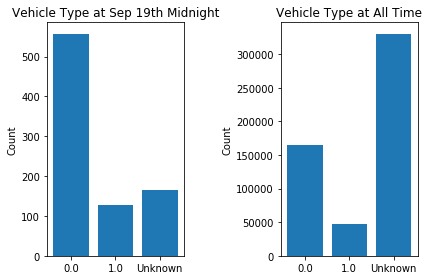

In [22]:
plt.subplot(1, 2, 1)
df_test_grouped = df_test.groupby('vehicle_type').count()
x_ticks = df_test_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_test_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Type at Sep 19th Midnight')

plt.subplot(1, 2, 2)
df_raw_grouped = df_raw.groupby('vehicle_type').count()
x_ticks = df_raw_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_raw_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Type at All Time')

plt.tight_layout()
plt.show()

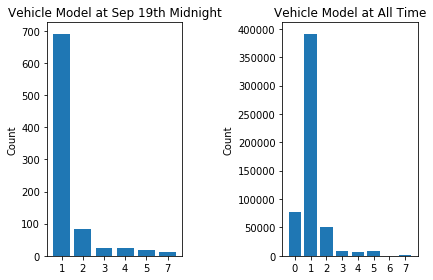

In [23]:
plt.subplot(1, 2, 1)
df_test_grouped = df_test.groupby('vehicle_model').count()
x_ticks = df_test_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_test_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Model at Sep 19th Midnight')

plt.subplot(1, 2, 2)
df_raw_grouped = df_raw.groupby('vehicle_model').count()
x_ticks = df_raw_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_raw_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Model at All Time')

plt.tight_layout()
plt.show()

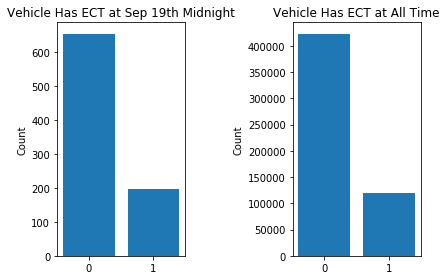

In [24]:
plt.subplot(1, 2, 1)
df_test_grouped = df_test.groupby('has_etc').count()
x_ticks = df_test_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_test_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Has ECT at Sep 19th Midnight')

plt.subplot(1, 2, 2)
df_raw_grouped = df_raw.groupby('has_etc').count()
x_ticks = df_raw_grouped.index.values
x_pos = np.arange(len(x_ticks))
plt.bar(x_pos, df_raw_grouped['time'].values)
plt.xticks(x_pos, x_ticks)
plt.ylabel('Count')
plt.title('Vehicle Has ECT at All Time')

plt.tight_layout()
plt.show()

In [25]:
# Get month and day
df['month'] = df['time_window'].str.slice(6,8)
df['day'] = df['time_window'].str.slice(9,11)
df.head()

,tollgate_id,time_window,direction,volume,month,day
0,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,17,09,19
1,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,181,09,19
2,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,13,09,19
3,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,140,09,19
4,2,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,2,09,19


In [26]:
# Aggregate on Volume based on date
v_day = df.groupby(['month','day','tollgate_id','direction'], as_index=False).sum()
v_day['date'] = v_day['month'].map(str) + '-' + v_day['day'].map(str) 
v_day.head()

,month,day,tollgate_id,direction,volume,date
0,09,19,1,0,1969,09-19
1,09,19,1,1,4732,09-19
2,09,19,2,0,3297,09-19
3,09,19,3,0,5037,09-19
4,09,19,3,1,4529,09-19


D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


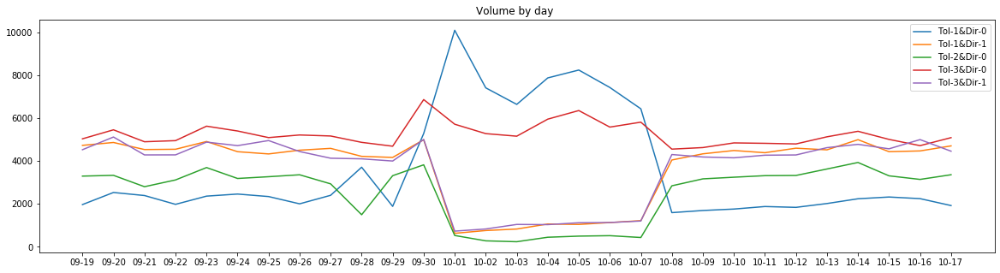

In [27]:
# Visualize volume change throughout the training period
# Observed significant inregularity int the National Day Holiday period

v_day_tollgate_1_direction_0 = v_day[v_day['tollgate_id'] == 1][v_day['direction'] == 0]
v_day_tollgate_1_direction_1 = v_day[v_day['tollgate_id'] == 1][v_day['direction'] == 1]
v_day_tollgate_2_direction_0 = v_day[v_day['tollgate_id'] == 2][v_day['direction'] == 0]
v_day_tollgate_3_direction_0 = v_day[v_day['tollgate_id'] == 3][v_day['direction'] == 0]
v_day_tollgate_3_direction_1 = v_day[v_day['tollgate_id'] == 3][v_day['direction'] == 1]

plt.figure(figsize=(20,5))
xticks = v_day_tollgate_1_direction_0['date'].values

plt.plot(xticks, v_day_tollgate_1_direction_0['volume'], label='Tol-1&Dir-0')
plt.plot(xticks, v_day_tollgate_1_direction_1['volume'], label='Tol-1&Dir-1')
plt.plot(xticks, v_day_tollgate_2_direction_0['volume'], label='Tol-2&Dir-0')
plt.plot(xticks, v_day_tollgate_3_direction_0['volume'], label='Tol-3&Dir-0')
plt.plot(xticks, v_day_tollgate_3_direction_1['volume'], label='Tol-3&Dir-1')

plt.title('Volume by day ')
plt.legend()
plt.show()

In [28]:
# Study the vehicle commute pattern
file_suffix = '.csv' # format of target data file
path = '../data/dataSets/training/' # path to target data file
filename = 'trajectories(table 5)_training' # target data file name

In [29]:
df_vehicles = pd.read_csv(path + filename + file_suffix)
df_vehicles.head()

,intersection_id,tollgate_id,vehicle_id,starting_time,travel_seq,travel_time
0,B,3,1065642,7/19/2016 0:14,105#2016-07-19 00:14:24#9.56;100#2016-07-19 00...,70.85
1,B,3,1047198,7/19/2016 0:35,105#2016-07-19 00:35:56#11.58;100#2016-07-19 0...,148.79
2,B,1,1086390,7/19/2016 0:37,105#2016-07-19 00:37:15#5.26;100#2016-07-19 00...,79.76
3,A,2,1071181,7/19/2016 0:37,110#2016-07-19 00:37:59#13.74;123#2016-07-19 0...,58.05
4,B,1,1065807,7/19/2016 0:56,105#2016-07-19 00:56:21#16.08;100#2016-07-19 0...,137.98


In [30]:
df_vehicles['date_time'] = pd.to_datetime(df_vehicles['starting_time'], format="%m/%d/%Y %H:%M")
df_vehicles['month'] = df_vehicles['date_time'].apply(lambda x: x.month)
df_vehicles['day'] = df_vehicles['date_time'].apply(lambda x: x.day)
df_vehicles['weekday'] = df_vehicles['date_time'].apply(lambda x: x.dayofweek)
df_vehicles['hour'] = df_vehicles['date_time'].apply(lambda x: x.hour)
df_vehicles['minute'] = df_vehicles['date_time'].apply(lambda x: x.minute)

df_vehicles.head()

,intersection_id,tollgate_id,vehicle_id,starting_time,travel_seq,travel_time,date_time,month,day,weekday,hour,minute
0,B,3,1065642,7/19/2016 0:14,105#2016-07-19 00:14:24#9.56;100#2016-07-19 00...,70.85,2016-07-19 00:14:00,7,19,1,0,14
1,B,3,1047198,7/19/2016 0:35,105#2016-07-19 00:35:56#11.58;100#2016-07-19 0...,148.79,2016-07-19 00:35:00,7,19,1,0,35
2,B,1,1086390,7/19/2016 0:37,105#2016-07-19 00:37:15#5.26;100#2016-07-19 00...,79.76,2016-07-19 00:37:00,7,19,1,0,37
3,A,2,1071181,7/19/2016 0:37,110#2016-07-19 00:37:59#13.74;123#2016-07-19 0...,58.05,2016-07-19 00:37:00,7,19,1,0,37
4,B,1,1065807,7/19/2016 0:56,105#2016-07-19 00:56:21#16.08;100#2016-07-19 0...,137.98,2016-07-19 00:56:00,7,19,1,0,56


In [31]:
df_vehicles_grouped = df_vehicles.groupby(['vehicle_id']).count()
df_vehicles_grouped.sort_values(by=['starting_time'], ascending=False).head(5)

,intersection_id,tollgate_id,starting_time,travel_seq,travel_time,date_time,month,day,weekday,hour,minute
vehicle_id,,,,,,,,,,,
1001157,96,96,96,96,96,96,96,96,96,96,96
1000688,88,88,88,88,88,88,88,88,88,88,88
1000626,76,76,76,76,76,76,76,76,76,76,76
1007050,65,65,65,65,65,65,65,65,65,65,65
1000324,65,65,65,65,65,65,65,65,65,65,65


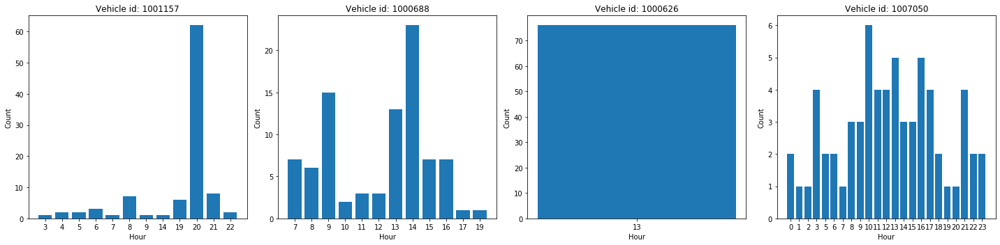

In [32]:
vehicles = [1001157, 1000688, 1000626, 1007050]
plt.figure(figsize=(20,5))

for v in range(len(vehicles)):
    plt.subplot(1, 4, v+1)
    df_vehicles_test = df_vehicles[df_vehicles['vehicle_id'] == vehicles[v]]
    df_vehicles_test = df_vehicles_test.groupby('hour').count()

    x_ticks = df_vehicles_test.index.values
    x_pos = np.arange(len(x_ticks))
    plt.bar(x_pos, df_vehicles_test['starting_time'].values)
    plt.xticks(x_pos, x_ticks)
    plt.ylabel('Count')
    plt.xlabel('Hour')
    plt.title('Vehicle id: ' + str(vehicles[v]))

plt.tight_layout()
plt.show()

# Predict and Evaluate

In [33]:
# Split time window field and format it to YYYY-mm-dd HH:MM:SS
# Reference from: https://github.com/chenzeyuczy/KDD2017/blob/master/code/load_data.py

def parse_avg_volume(filename):
    df = pd.read_csv(filename)

    # Convert data format.
    df['time_window'] = df['time_window'].apply(lambda x: x.split(',')[0].strip('['))
    df['time_window'] = pd.to_datetime(df['time_window'], format="%Y-%m-%d %H:%M:%S")

    return df

In [34]:
# Load Testing Dataset
file_suffix = '.csv'
path = '../data/dataSet_phase2/'
filename = 'volume(table 6)_training2'

avgVolume(filename)

In [35]:
avg_volume_train = parse_avg_volume('training_20min_avg_volume.csv')
avg_volume_train.head()

,tollgate_id,time_window,direction,volume
0,3,2016-09-19,0,17
1,3,2016-09-19,1,181
2,1,2016-09-19,0,13
3,1,2016-09-19,1,140
4,2,2016-09-19,0,2


In [36]:
avg_volume_test = parse_avg_volume('training2_20min_avg_volume.csv')
avg_volume_test.head()

,tollgate_id,time_window,direction,volume
0,3,2016-10-18 00:00:00,0,12
1,3,2016-10-18 00:00:00,1,148
2,1,2016-10-18 00:00:00,0,11
3,1,2016-10-18 00:00:00,1,105
4,3,2016-10-18 00:20:00,0,12


In [37]:
# Extract month/day/dayofweek/hour/minute/holiday features from time window
# Reference from: https://github.com/chenzeyuczy/KDD2017/blob/master/code/train_xgb.py

def convert_dataframe(dataframe):
    df = dataframe.copy()

    # Process date field.
    df['month'] = df['time_window'].apply(lambda x: x.month)
    df['day'] = df['time_window'].apply(lambda x: x.day)
    df['weekday'] = df['time_window'].apply(lambda x: x.dayofweek)
    df['hour'] = df['time_window'].apply(lambda x: x.hour)
    df['minute'] = df['time_window'].apply(lambda x: x.minute)
    df['holiday'] = df['time_window'].apply(lambda x: is_holiday(x))

    # Drop unused field.
    df.drop(['time_window'], axis=1, inplace=True)
    return df

In [38]:
# Check if the day is holiday
# https://github.com/chenzeyuczy/KDD2017/blob/master/code/tools.py

def is_holiday(date_time):

    # Mid-Autumn Festival.
    if date_time.month == 9 and date_time.day >= 15 and date_time.day <= 17:
        return 1
    # National Day.
    elif date_time.month == 10 and date_time.day >= 1 and date_time.day <= 7:
        return 1
    return 0

In [39]:
train_df = avg_volume_train.copy()
train_df = convert_dataframe(train_df)
train_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday
0,3,0,17,9,19,0,0,0,0
1,3,1,181,9,19,0,0,0,0
2,1,0,13,9,19,0,0,0,0
3,1,1,140,9,19,0,0,0,0
4,2,0,2,9,19,0,0,0,0


In [40]:
train_label = train_df['volume'].values
train_df.drop(['volume'], axis=1, inplace=True)

In [41]:
train_label.shape

(10063,)

In [42]:
train_df.head()

,tollgate_id,direction,month,day,weekday,hour,minute,holiday
0,3,0,9,19,0,0,0,0
1,3,1,9,19,0,0,0,0
2,1,0,9,19,0,0,0,0
3,1,1,9,19,0,0,0,0
4,2,0,9,19,0,0,0,0


In [43]:
X_train, X_test, y_train, y_test = train_test_split(train_df, train_label, test_size=0.2, random_state=123)

### XGBoost

In [44]:
data_dmatrix = xgb.DMatrix(data=train_df,label=train_label)

# Paramsters Reference: https://github.com/chenzeyuczy/KDD2017/blob/master/code/tuning.log
xg_reg = xgb.XGBRegressor(objective ='reg:linear', eta = 0.02, min_child_weight = 8,
                subsample = 0.9, colsample_bytree = 0.8, max_depth = 8,
                seed=1, silent=1)

In [45]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

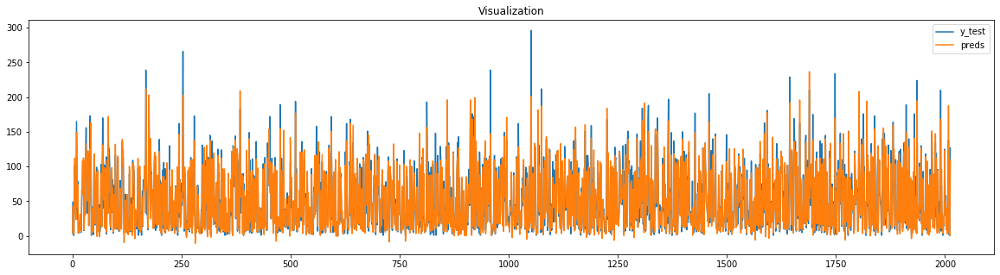

In [46]:
plt.figure(figsize=(20,5))

plt.plot(y_test, label='y_test')
plt.plot(preds, label='preds')
plt.title('Visualization')
plt.legend()
plt.show()

In [47]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 11.853444


In [48]:
def mape(label, pred):

    return np.mean(np.abs(label - pred).astype(np.float64) / label)

In [49]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.364782


### LightGBM

In [50]:
train_data = lgb.Dataset(X_train, label=y_train)

In [51]:
params = {}
params['learning_rate'] = 0.1
params['boosting_type'] = 'gbdt'

num_round = 1000
lgb_reg = lgb.train(params, train_data, num_round)

In [52]:
preds = lgb_reg.predict(X_test)

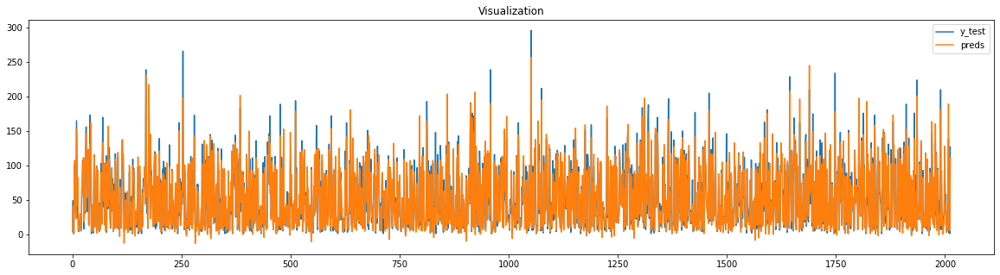

In [53]:
plt.figure(figsize=(20,5))

plt.plot(y_test, label='y_test')
plt.plot(preds, label='preds')
plt.title('Visualization')
plt.legend()
plt.show()

In [54]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 10.809516


In [55]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.341133


In [56]:
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)
test_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday
0,3,0,12,10,18,1,0,0,0
1,3,1,148,10,18,1,0,0,0
2,1,0,11,10,18,1,0,0,0
3,1,1,105,10,18,1,0,0,0
4,3,0,12,10,18,1,0,20,0


In [57]:
test_label = test_df['volume'].values
test_df.drop(['volume'], axis=1, inplace=True)

In [58]:
test_label.shape

(2445,)

In [59]:
test_df.head()

,tollgate_id,direction,month,day,weekday,hour,minute,holiday
0,3,0,10,18,1,0,0,0
1,3,1,10,18,1,0,0,0
2,1,0,10,18,1,0,0,0
3,1,1,10,18,1,0,0,0
4,3,0,10,18,1,0,20,0


### XGBoost

In [60]:
test_preds = xg_reg.predict(test_df)

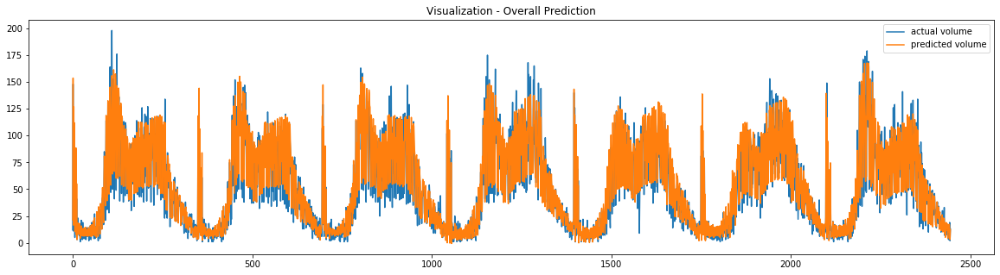

In [61]:
plt.figure(figsize=(20,5))

plt.plot(test_label, label='actual volume')
plt.plot(test_preds, label='predicted volume')
plt.title('Visualization - Overall Prediction')
plt.legend()
plt.show()

In [62]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.280261


### LightGBM

In [63]:
test_preds = lgb_reg.predict(test_df)

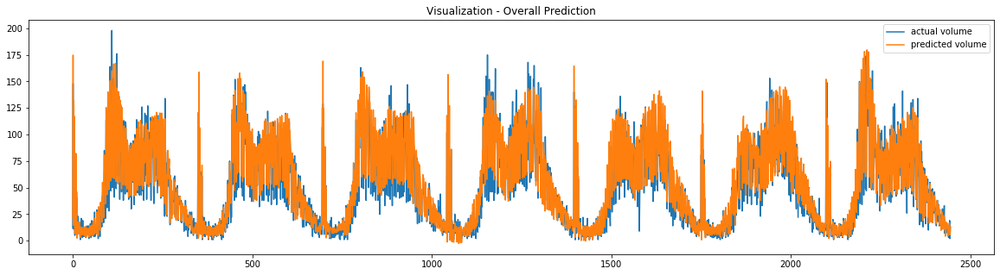

In [64]:
plt.figure(figsize=(20,5))

plt.plot(test_label, label='actual volume')
plt.plot(test_preds, label='predicted volume')
plt.title('Visualization - Overall Prediction')
plt.legend()
plt.show()

In [65]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.297343


In [66]:
# Excluding Holiday data from training set
train_df = avg_volume_train.copy()
train_df = convert_dataframe(train_df)
train_df.shape

(10063, 9)

In [67]:
train_df_exclude_holiday = train_df[train_df.holiday == 0]
train_df_exclude_holiday.shape

(7684, 9)

In [68]:
train_df_exclude_holiday_label = train_df_exclude_holiday['volume'].values
train_df_exclude_holiday.drop(['volume'], axis=1, inplace=True)

D:\anaconda\conda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [69]:
X_train, X_test, y_train, y_test = train_test_split(train_df_exclude_holiday, train_df_exclude_holiday_label, test_size=0.2, random_state=123)

### XGBoost

In [70]:
data_dmatrix = xgb.DMatrix(data=train_df_exclude_holiday,label=train_df_exclude_holiday_label)

xg_reg = xgb.XGBRegressor(objective ='reg:linear', eta = 0.02, min_child_weight = 8,
                subsample = 0.9, colsample_bytree = 0.8, max_depth = 8,
                seed=1, silent=1)

In [71]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

In [72]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.253194


In [73]:
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)

test_label = test_df['volume'].values
test_df.drop(['volume'], axis=1, inplace=True)

In [74]:
test_preds = xg_reg.predict(test_df)

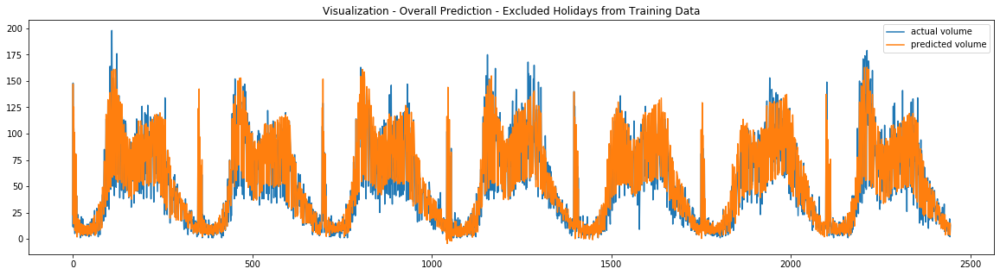

In [75]:
plt.figure(figsize=(20,5))

plt.plot(test_label, label='actual volume')
plt.plot(test_preds, label='predicted volume')
plt.title('Visualization - Overall Prediction - Excluded Holidays from Training Data')
plt.legend()
plt.show()

In [76]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.268922


In [77]:
# Checking on the rush hour periods
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)
test_df['preds'] = test_preds

test_df_rush_hour = test_df[((test_df['hour'] >= 8) & (test_df['hour'] < 10)) | ((test_df['hour'] >= 17) & (test_df['hour'] < 19))]
test_df_rush_hour.shape

(420, 10)

In [78]:
test_df_rush_hour.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,preds
108,2,0,120,10,18,1,8,0,0,118.855659
109,3,0,198,10,18,1,8,0,0,159.437332
110,3,1,119,10,18,1,8,0,0,134.190079
111,1,0,50,10,18,1,8,0,0,58.568413
112,1,1,93,10,18,1,8,0,0,125.772942


In [79]:
test_df_rush_hour.tail()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,preds
2365,3,0,49,10,24,0,18,40,0,72.389885
2366,3,1,74,10,24,0,18,40,0,72.746925
2367,2,0,37,10,24,0,18,40,0,54.163578
2368,1,0,13,10,24,0,18,40,0,23.533079
2369,1,1,69,10,24,0,18,40,0,73.871742


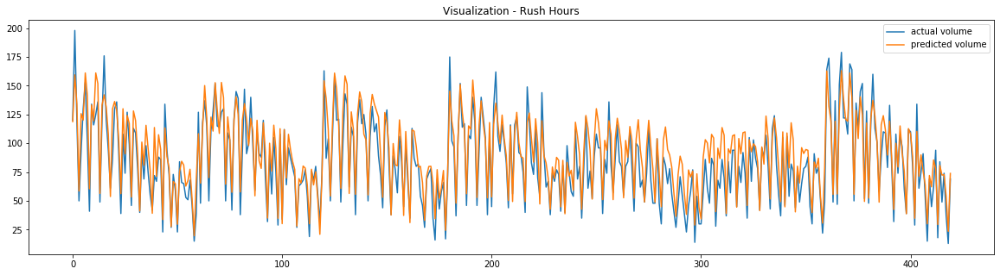

In [80]:
plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour['preds'].values, label='predicted volume')
plt.title('Visualization - Rush Hours')
plt.legend()
plt.show()

In [81]:
test_err = mape(test_df_rush_hour['volume'].values, test_df_rush_hour['preds'].values)
print ("MAPE: %f" % (test_err))

MAPE: 0.191247


### LightGBM

In [82]:
train_data = lgb.Dataset(X_train, label=y_train)

In [83]:
params = {}
params['learning_rate'] = 0.1
params['boosting_type'] = 'gbdt'

num_round = 1000
lgb_reg = lgb.train(params, train_data, num_round)

preds = lgb_reg.predict(X_test)

In [84]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.244130


In [85]:
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)

test_label = test_df['volume'].values
test_df.drop(['volume'], axis=1, inplace=True)

In [86]:
test_preds = lgb_reg.predict(test_df)

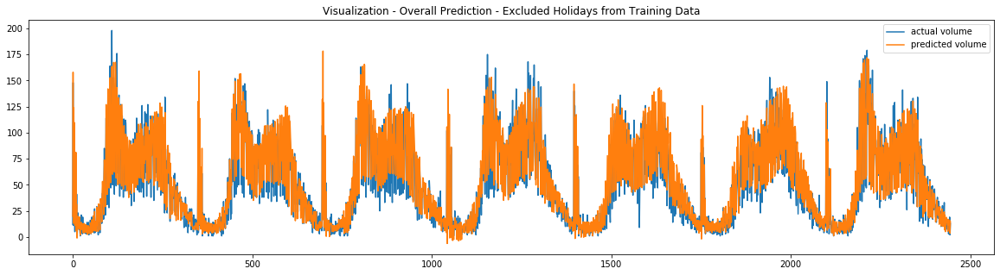

In [87]:
plt.figure(figsize=(20,5))

plt.plot(test_label, label='actual volume')
plt.plot(test_preds, label='predicted volume')
plt.title('Visualization - Overall Prediction - Excluded Holidays from Training Data')
plt.legend()
plt.show()

In [88]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.301489


In [89]:
# Checking on the rush hour periods
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)
test_df['preds'] = test_preds

test_df_rush_hour = test_df[((test_df['hour'] >= 8) & (test_df['hour'] < 10)) | ((test_df['hour'] >= 17) & (test_df['hour'] < 19))]
test_df_rush_hour.shape

(420, 10)

In [90]:
test_df_rush_hour.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,preds
108,2,0,120,10,18,1,8,0,0,120.184563
109,3,0,198,10,18,1,8,0,0,163.401229
110,3,1,119,10,18,1,8,0,0,131.818150
111,1,0,50,10,18,1,8,0,0,60.087688
112,1,1,93,10,18,1,8,0,0,121.737617


In [91]:
test_df_rush_hour.tail()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,preds
2365,3,0,49,10,24,0,18,40,0,69.269470
2366,3,1,74,10,24,0,18,40,0,66.954606
2367,2,0,37,10,24,0,18,40,0,47.117508
2368,1,0,13,10,24,0,18,40,0,19.184102
2369,1,1,69,10,24,0,18,40,0,68.194103


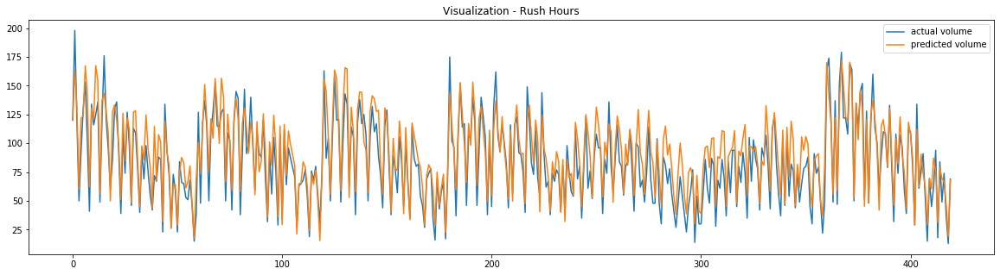

In [92]:
plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour['preds'].values, label='predicted volume')
plt.title('Visualization - Rush Hours')
plt.legend()
plt.show()

In [93]:
test_err = mape(test_df_rush_hour['volume'].values, test_df_rush_hour['preds'].values)
print ("MAPE: %f" % (test_err))

MAPE: 0.197756


# Incorporate with Weather Data

In [94]:
# Extract month/day/dayofweek/hour/minute/holiday features from time window
# Reference from: https://github.com/chenzeyuczy/KDD2017/blob/master/code/load_data.py

def parse_weather_data(filename):
    df = pd.read_csv(filename)

    df['time_window'] = pd.to_datetime(df.apply(lambda x: "{} {:02}".format(x.date, x.hour), axis=1))
    # Fix errors at wind_direction.
    df['wind_direction'] = df['wind_direction'].apply(lambda x: x % 360)
    df.drop(['date', 'hour'], axis=1, inplace=True)
    df.set_index('time_window', inplace=True)

    return df

In [95]:
# Load Weather Training Dataset
file_suffix = '.csv'
path = '../data/dataSets/training/'
filename = 'weather (table 7)_training'

weather_file = path + filename + file_suffix
weather_training = parse_weather_data(weather_file)
weather_training.head()

,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
time_window,,,,,,,
2016-07-01 00:00:00,1000.4,1005.3,225.0,2.1,26.4,94.0,0.0
2016-07-01 03:00:00,1000.5,1005.3,187.0,2.7,29.0,76.0,0.0
2016-07-01 06:00:00,998.9,1003.7,212.0,2.9,31.7,67.0,0.0
2016-07-01 09:00:00,998.7,1003.5,244.0,2.7,31.6,59.0,0.0
2016-07-01 12:00:00,999.7,1004.5,222.0,1.3,29.9,68.0,0.0


In [96]:
# Load Weather Testing Dataset
file_suffix = '.csv'
path = '../data/dataSets/testing_phase1/'
filename = 'weather (table 7)_test1'

weather_file = path + filename + file_suffix
weather_testing = parse_weather_data(weather_file)
weather_testing.head()

,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
time_window,,,,,,,
2016-10-18 00:00:00,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
2016-10-18 03:00:00,1014.5,1019.5,37.0,2.5,23.3,73.0,0.0
2016-10-18 06:00:00,1012.5,1017.5,128.0,1.6,23.4,73.0,0.0
2016-10-18 09:00:00,1013.0,1018.0,205.0,0.6,20.9,94.0,1.8
2016-10-18 12:00:00,1013.8,1018.8,106.0,1.5,20.5,94.0,0.5


In [97]:
def get_mean_data(weather_data):
    mean_data = {}
    keys = ['pressure', 'sea_pressure', 'wind_direction', 'wind_speed',
        'temperature', 'rel_humidity', 'precipitation']
    for key in keys:
        mean_data[key] = weather_data[key].mean()
    return mean_data

In [98]:
# Calculate Mean Weather Data to fill NaN values

weather_data = pd.concat([weather_training, weather_testing])
mean_weather = get_mean_data(weather_data)

In [99]:
train_df = avg_volume_train.copy()
time_window = train_df['time_window'].values
train_df = convert_dataframe(train_df)
train_df['time_window'] = time_window # Use time window to join with weather data
train_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window
0,3,0,17,9,19,0,0,0,0,2016-09-19
1,3,1,181,9,19,0,0,0,0,2016-09-19
2,1,0,13,9,19,0,0,0,0,2016-09-19
3,1,1,140,9,19,0,0,0,0,2016-09-19
4,2,0,2,9,19,0,0,0,0,2016-09-19


In [100]:
# Weather data has time window = 3 hours
train_df['date_time'] = train_df.time_window.apply(lambda x: x - pd.Timedelta(hours=x.hour % 3, minutes=x.minute))
train_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window,date_time
0,3,0,17,9,19,0,0,0,0,2016-09-19,2016-09-19
1,3,1,181,9,19,0,0,0,0,2016-09-19,2016-09-19
2,1,0,13,9,19,0,0,0,0,2016-09-19,2016-09-19
3,1,1,140,9,19,0,0,0,0,2016-09-19,2016-09-19
4,2,0,2,9,19,0,0,0,0,2016-09-19,2016-09-19


In [101]:
train_df = train_df.join(weather_training, on='date_time', how='left')
train_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window,date_time,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
0,3,0,17,9,19,0,0,0,0,2016-09-19,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
1,3,1,181,9,19,0,0,0,0,2016-09-19,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
2,1,0,13,9,19,0,0,0,0,2016-09-19,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
3,1,1,140,9,19,0,0,0,0,2016-09-19,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
4,2,0,2,9,19,0,0,0,0,2016-09-19,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0


In [102]:
# Fill nan in dataframe.
weather_columns = ['pressure', 'sea_pressure', 'precipitation', 'rel_humidity', 'temperature', 'wind_direction', 'wind_speed']
for column in weather_columns:
    train_df[column].fillna(mean_weather[column], inplace=True)

In [103]:
# Remove joint points
train_df = train_df.drop(columns=['time_window','date_time'])

In [104]:
train_df.shape

(10063, 16)

In [105]:
train_label = train_df['volume'].values
train_df.drop(['volume'], axis=1, inplace=True)

In [106]:
train_df_exclude_holiday = train_df[train_df.holiday == 0]
train_df_exclude_holiday.shape

(7684, 15)

In [107]:
X_train, X_test, y_train, y_test = train_test_split(train_df_exclude_holiday, train_df_exclude_holiday_label, test_size=0.2, random_state=123)

### XGBoost

In [108]:
data_dmatrix = xgb.DMatrix(data=train_df_exclude_holiday,label=train_df_exclude_holiday_label)

xg_reg = xgb.XGBRegressor(objective ='reg:linear', eta = 0.02, min_child_weight = 8,
                subsample = 0.9, colsample_bytree = 0.8, max_depth = 8,
                seed=1, silent=1)

xg_reg.fit(X_train,y_train)
preds = xg_reg.predict(X_test)

In [109]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.260500


### LightGBM

In [110]:
train_data = lgb.Dataset(X_train, label=y_train)

params = {}
params['learning_rate'] = 0.1
params['boosting_type'] = 'gbdt'

num_round = 1000
lgb_reg = lgb.train(params, train_data, num_round)

preds = lgb_reg.predict(X_test)

In [111]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.264776


In [112]:
test_df = avg_volume_test.copy()
time_window = test_df['time_window'].values
test_df = convert_dataframe(test_df)
test_df['time_window'] = time_window # Use time window to join with weather data
test_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window
0,3,0,12,10,18,1,0,0,0,2016-10-18 00:00:00
1,3,1,148,10,18,1,0,0,0,2016-10-18 00:00:00
2,1,0,11,10,18,1,0,0,0,2016-10-18 00:00:00
3,1,1,105,10,18,1,0,0,0,2016-10-18 00:00:00
4,3,0,12,10,18,1,0,20,0,2016-10-18 00:20:00


In [113]:
test_df['date_time'] = test_df.time_window.apply(lambda x: x - pd.Timedelta(hours=x.hour % 3, minutes=x.minute))
test_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window,date_time
0,3,0,12,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18
1,3,1,148,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18
2,1,0,11,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18
3,1,1,105,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18
4,3,0,12,10,18,1,0,20,0,2016-10-18 00:20:00,2016-10-18


In [114]:
test_df = test_df.join(weather_testing, on='date_time', how='left')
test_df.head()

,tollgate_id,direction,volume,month,day,weekday,hour,minute,holiday,time_window,date_time,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
0,3,0,12,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
1,3,1,148,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
2,1,0,11,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
3,1,1,105,10,18,1,0,0,0,2016-10-18 00:00:00,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
4,3,0,12,10,18,1,0,20,0,2016-10-18 00:20:00,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0


In [115]:
test_label = test_df['volume'].values
test_df.drop(['volume'], axis=1, inplace=True)

In [116]:
# Fill nan in dataframe.
weather_columns = ['pressure', 'sea_pressure', 'precipitation', 'rel_humidity', 'temperature', 'wind_direction', 'wind_speed']
for column in weather_columns:
    test_df[column].fillna(mean_weather[column], inplace=True)

In [117]:
# Remove joint points
test_df = test_df.drop(columns=['time_window','date_time'])

In [118]:
test_df.shape

(2445, 15)

In [119]:
test_df_lgb = copy.deepcopy(test_df)

### XGBoost

In [120]:
test_preds = xg_reg.predict(test_df)

In [121]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.429293


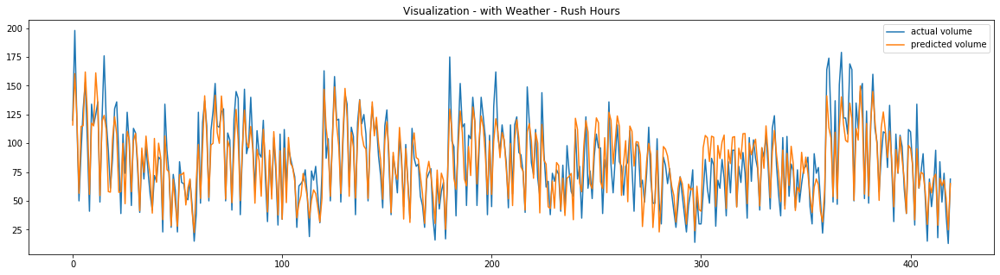

In [122]:
# Checking on the rush hour periods
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)
test_df['preds'] = test_preds

test_df_rush_hour = test_df[((test_df['hour'] >= 8) & (test_df['hour'] < 10)) | ((test_df['hour'] >= 17) & (test_df['hour'] < 19))]

plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour['preds'].values, label='predicted volume')
plt.title('Visualization - with Weather - Rush Hours')
plt.legend()
plt.show()

In [123]:
test_err = mape(test_df_rush_hour['volume'].values, test_df_rush_hour['preds'].values)
print ("MAPE: %f" % (test_err))

MAPE: 0.187615


### LightGBM

In [124]:
test_preds_lgb = lgb_reg.predict(test_df_lgb)

In [125]:
test_err_lgb = mape(test_label, test_preds_lgb)
print ("MAPE: %f" % (test_err_lgb))

MAPE: 0.346839


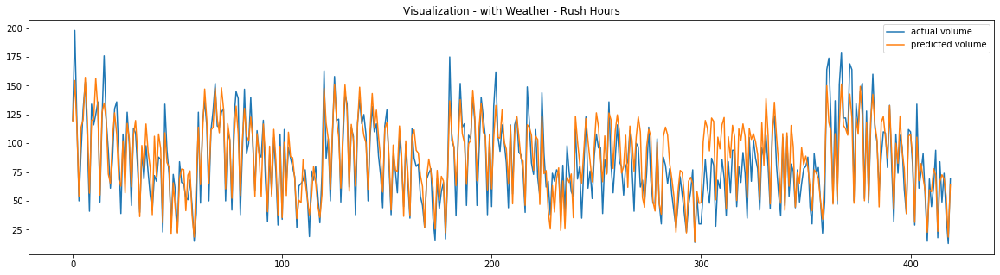

In [126]:
# Checking on the rush hour periods
test_df_lgb = avg_volume_test.copy()
test_df_lgb = convert_dataframe(test_df_lgb)
test_df_lgb['preds'] = test_preds_lgb

test_df_rush_hour_lgb = test_df_lgb[((test_df_lgb['hour'] >= 8) & (test_df_lgb['hour'] < 10)) | ((test_df_lgb['hour'] >= 17) & (test_df_lgb['hour'] < 19))]

plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour_lgb['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour_lgb['preds'].values, label='predicted volume')
plt.title('Visualization - with Weather - Rush Hours')
plt.legend()
plt.show()

In [127]:
test_err_lgb = mape(test_df_rush_hour_lgb['volume'].values, test_df_rush_hour_lgb['preds'].values)
print ("MAPE: %f" % (test_err_lgb))

MAPE: 0.197364


# Reference Approach

In [128]:
# Modified based on avgVolume function to include number of vehicles that have ETC

def avgVolume_etc(in_file):

    out_suffix = '_20min_avg_volume_etc'
    in_file_name = in_file + file_suffix
    out_file_name = in_file.split('_')[1] + out_suffix + file_suffix

    # Step 1: Load volume data
    fr = open(path + in_file_name, 'r')
    fr.readline()  # skip the header
    vol_data = fr.readlines()
    fr.close()

    # Step 2: Create a dictionary to caculate and store volume per time window
    volumes = {}  # key: time window value: dictionary
    etcs = {}  # key: number of vehicles the has etc, value: dictionary
    for i in range(len(vol_data)):
        each_pass = vol_data[i].replace('"', '').split(',')
        tollgate_id = each_pass[1]
        direction = each_pass[2]
        has_etc = each_pass[4]

        pass_time = each_pass[0]
        pass_time = datetime.strptime(pass_time, "%Y-%m-%d %H:%M:%S")
        time_window_minute = int(math.floor(pass_time.minute / 20) * 20)
        #print pass_time
        start_time_window = datetime(pass_time.year, pass_time.month, pass_time.day,
                                     pass_time.hour, time_window_minute, 0)

        if start_time_window not in volumes:
            volumes[start_time_window] = {}
            etcs[start_time_window] = {}
        if tollgate_id not in volumes[start_time_window]:
            volumes[start_time_window][tollgate_id] = {}
            etcs[start_time_window][tollgate_id] = {}
        if direction not in volumes[start_time_window][tollgate_id]:
            volumes[start_time_window][tollgate_id][direction] = 1
            etcs[start_time_window][tollgate_id][direction] = int(has_etc) # Initiate etc
        else:
            volumes[start_time_window][tollgate_id][direction] += 1
            etcs[start_time_window][tollgate_id][direction] += int(has_etc) # Stack up the etc counts for this time window

    # Step 3: format output for tollgate and direction per time window
    fw = open(out_file_name, 'w')
    fw.writelines(','.join(['"tollgate_id"', '"time_window"', '"direction"', '"volume"', '"etcs"']) + '\n') # write etc counts
    time_windows = list(volumes.keys())
    time_windows.sort()
    for time_window_start in time_windows:
        time_window_end = time_window_start + timedelta(minutes=20)
        for tollgate_id in volumes[time_window_start]:
            for direction in volumes[time_window_start][tollgate_id]:
               out_line = ','.join(['"' + str(tollgate_id) + '"', 
                                 '"[' + str(time_window_start) + ',' + str(time_window_end) + ')"',
                                 '"' + str(direction) + '"',
                                 '"' + str(volumes[time_window_start][tollgate_id][direction]) + '"',
                                 '"' + str(etcs[time_window_start][tollgate_id][direction]) + '"', # write etc counts
                               ]) + '\n'
               fw.writelines(out_line)
    fw.close()

In [129]:
# Calculate mean volume values for past %day_range days for %dataframe
# This function can significantly affect performance

def get_mean_time_window(dataframe, day_range):
    mean_time_window = []
    for index, row in dataframe.iterrows():
        tollgate_id = row['tollgate_id']
        direction = row['direction']
        time_window = row['time_window']
        volume = row['volume']
        print("Checking tollgate_id %s, direction %s, time_window %s" % (tollgate_id, direction, time_window))
        sum = 0
        for i in range(1, (day_range+1)):
            check_date = time_window - timedelta(days=i)
            print("In this row: checking day: %s" % check_date)
            check_volume = dataframe[dataframe['tollgate_id'] == tollgate_id][dataframe['direction'] == direction][dataframe['time_window'] == check_date]['volume']
            if len(check_volume) == 1:
                sum += float(check_volume)
                print("Adding volume to sum: %s" % sum)
            else:
                sum += volume # Add itself to approximate
                print("Volume not found, used volume of self: %s" % sum)
        mean_time_window.append(sum/day_range)
        print("calculated mean value for this time window: %s" % (sum/day_range))
    dataframe['mean_time_window'] = mean_time_window
    return dataframe

In [130]:
file_suffix = '.csv' # format of target data file
path = '../data/dataSets/training/' # path to target data file
filename = 'volume(table 6)_training' # target data file name

In [131]:
avgVolume_etc(filename)

In [132]:
df = pd.read_csv('training_20min_avg_volume_etc.csv')
df.shape

(10063, 5)

In [133]:
df.head()

,tollgate_id,time_window,direction,volume,etcs
0,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,17,0
1,3,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,181,46
2,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,13,4
3,1,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",1,140,33
4,2,"[2016-09-19 00:00:00,2016-09-19 00:20:00)",0,2,0


In [134]:
avg_volume_train_etc = parse_avg_volume('training_20min_avg_volume_etc.csv')
avg_volume_train_etc.head()

,tollgate_id,time_window,direction,volume,etcs
0,3,2016-09-19,0,17,0
1,3,2016-09-19,1,181,46
2,1,2016-09-19,0,13,4
3,1,2016-09-19,1,140,33
4,2,2016-09-19,0,2,0


In [135]:
train_df = avg_volume_train_etc.copy()
# train_df['volume'] = train_df['volume'].map(lambda x: np.log(x)) # Use log to reduce influence of outliers, will convert back when calculate MAPE
time_window = train_df['time_window'].values
train_df = convert_dataframe(train_df)
train_df['time_window'] = time_window # Use time window to join with weather data
get_mean_time_window(train_df,5) # Populate mean of same time window for previous 5 days
train_df.head()

Checking tollgate_id 3, direction 0, time_window 2016-09-19 00:00:00
In this row: checking day: 2016-09-18 00:00:00
Volume not found, used volume of self: 17
In this row: checking day: 2016-09-17 00:00:00
Volume not found, used volume of self: 34
In this row: checking day: 2016-09-16 00:00:00
Volume not found, used volume of self: 51
In this row: checking day: 2016-09-15 00:00:00
Volume not found, used volume of self: 68
In this row: checking day: 2016-09-14 00:00:00
Volume not found, used volume of self: 85
calculated mean value for this time window: 17.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 00:00:00
In this row: checking day: 2016-09-18 00:00:00
Volume not found, used volume of self: 181
In this row: checking day: 2016-09-17 00:00:00
Volume not found, used volume of self: 362
In this row: checking day: 2016-09-16 00:00:00
Volume not found, used volume of self: 543
In this row: checking day: 2016-09-15 00:00:00
Volume not found, used volume of self: 724
In this 

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()



In this row: checking day: 2016-09-17 00:40:00
Volume not found, used volume of self: 32
In this row: checking day: 2016-09-16 00:40:00
Volume not found, used volume of self: 48
In this row: checking day: 2016-09-15 00:40:00
Volume not found, used volume of self: 64
In this row: checking day: 2016-09-14 00:40:00
Volume not found, used volume of self: 80
calculated mean value for this time window: 16.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 00:40:00
In this row: checking day: 2016-09-18 00:40:00
Volume not found, used volume of self: 93
In this row: checking day: 2016-09-17 00:40:00
Volume not found, used volume of self: 186
In this row: checking day: 2016-09-16 00:40:00
Volume not found, used volume of self: 279
In this row: checking day: 2016-09-15 00:40:00
Volume not found, used volume of self: 372
In this row: checking day: 2016-09-14 00:40:00
Volume not found, used volume of self: 465
calculated mean value for this time window: 93.0
Checking tollgate_id 1, dir

Volume not found, used volume of self: 21
In this row: checking day: 2016-09-15 02:00:00
Volume not found, used volume of self: 28
In this row: checking day: 2016-09-14 02:00:00
Volume not found, used volume of self: 35
calculated mean value for this time window: 7.0
Checking tollgate_id 1, direction 1, time_window 2016-09-19 02:00:00
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 7
In this row: checking day: 2016-09-17 02:00:00
Volume not found, used volume of self: 14
In this row: checking day: 2016-09-16 02:00:00
Volume not found, used volume of self: 21
In this row: checking day: 2016-09-15 02:00:00
Volume not found, used volume of self: 28
In this row: checking day: 2016-09-14 02:00:00
Volume not found, used volume of self: 35
calculated mean value for this time window: 7.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 02:00:00
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 11
In this row: 

Volume not found, used volume of self: 10
In this row: checking day: 2016-09-17 03:40:00
Volume not found, used volume of self: 20
In this row: checking day: 2016-09-16 03:40:00
Volume not found, used volume of self: 30
In this row: checking day: 2016-09-15 03:40:00
Volume not found, used volume of self: 40
In this row: checking day: 2016-09-14 03:40:00
Volume not found, used volume of self: 50
calculated mean value for this time window: 10.0
Checking tollgate_id 1, direction 0, time_window 2016-09-19 03:40:00
In this row: checking day: 2016-09-18 03:40:00
Volume not found, used volume of self: 9
In this row: checking day: 2016-09-17 03:40:00
Volume not found, used volume of self: 18
In this row: checking day: 2016-09-16 03:40:00
Volume not found, used volume of self: 27
In this row: checking day: 2016-09-15 03:40:00
Volume not found, used volume of self: 36
In this row: checking day: 2016-09-14 03:40:00
Volume not found, used volume of self: 45
calculated mean value for this time wind

Volume not found, used volume of self: 42
In this row: checking day: 2016-09-15 05:00:00
Volume not found, used volume of self: 56
In this row: checking day: 2016-09-14 05:00:00
Volume not found, used volume of self: 70
calculated mean value for this time window: 14.0
Checking tollgate_id 1, direction 0, time_window 2016-09-19 05:00:00
In this row: checking day: 2016-09-18 05:00:00
Volume not found, used volume of self: 2
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 4
In this row: checking day: 2016-09-16 05:00:00
Volume not found, used volume of self: 6
In this row: checking day: 2016-09-15 05:00:00
Volume not found, used volume of self: 8
In this row: checking day: 2016-09-14 05:00:00
Volume not found, used volume of self: 10
calculated mean value for this time window: 2.0
Checking tollgate_id 1, direction 1, time_window 2016-09-19 05:00:00
In this row: checking day: 2016-09-18 05:00:00
Volume not found, used volume of self: 28
In this row: ch

Volume not found, used volume of self: 40
calculated mean value for this time window: 8.0
Checking tollgate_id 1, direction 1, time_window 2016-09-19 06:00:00
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 39
In this row: checking day: 2016-09-17 06:00:00
Volume not found, used volume of self: 78
In this row: checking day: 2016-09-16 06:00:00
Volume not found, used volume of self: 117
In this row: checking day: 2016-09-15 06:00:00
Volume not found, used volume of self: 156
In this row: checking day: 2016-09-14 06:00:00
Volume not found, used volume of self: 195
calculated mean value for this time window: 39.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 06:20:00
In this row: checking day: 2016-09-18 06:20:00
Volume not found, used volume of self: 58
In this row: checking day: 2016-09-17 06:20:00
Volume not found, used volume of self: 116
In this row: checking day: 2016-09-16 06:20:00
Volume not found, used volume of self: 174
In thi

Volume not found, used volume of self: 415
calculated mean value for this time window: 83.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 07:40:00
In this row: checking day: 2016-09-18 07:40:00
Volume not found, used volume of self: 97
In this row: checking day: 2016-09-17 07:40:00
Volume not found, used volume of self: 194
In this row: checking day: 2016-09-16 07:40:00
Volume not found, used volume of self: 291
In this row: checking day: 2016-09-15 07:40:00
Volume not found, used volume of self: 388
In this row: checking day: 2016-09-14 07:40:00
Volume not found, used volume of self: 485
calculated mean value for this time window: 97.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 07:40:00
In this row: checking day: 2016-09-18 07:40:00
Volume not found, used volume of self: 153
In this row: checking day: 2016-09-17 07:40:00
Volume not found, used volume of self: 306
In this row: checking day: 2016-09-16 07:40:00
Volume not found, used volume of self: 459
In

Volume not found, used volume of self: 696
In this row: checking day: 2016-09-14 09:00:00
Volume not found, used volume of self: 870
calculated mean value for this time window: 174.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 09:00:00
In this row: checking day: 2016-09-18 09:00:00
Volume not found, used volume of self: 145
In this row: checking day: 2016-09-17 09:00:00
Volume not found, used volume of self: 290
In this row: checking day: 2016-09-16 09:00:00
Volume not found, used volume of self: 435
In this row: checking day: 2016-09-15 09:00:00
Volume not found, used volume of self: 580
In this row: checking day: 2016-09-14 09:00:00
Volume not found, used volume of self: 725
calculated mean value for this time window: 145.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 09:00:00
In this row: checking day: 2016-09-18 09:00:00
Volume not found, used volume of self: 89
In this row: checking day: 2016-09-17 09:00:00
Volume not found, used volume of self: 178


Volume not found, used volume of self: 555
calculated mean value for this time window: 111.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 10:20:00
In this row: checking day: 2016-09-18 10:20:00
Volume not found, used volume of self: 87
In this row: checking day: 2016-09-17 10:20:00
Volume not found, used volume of self: 174
In this row: checking day: 2016-09-16 10:20:00
Volume not found, used volume of self: 261
In this row: checking day: 2016-09-15 10:20:00
Volume not found, used volume of self: 348
In this row: checking day: 2016-09-14 10:20:00
Volume not found, used volume of self: 435
calculated mean value for this time window: 87.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 10:20:00
In this row: checking day: 2016-09-18 10:20:00
Volume not found, used volume of self: 88
In this row: checking day: 2016-09-17 10:20:00
Volume not found, used volume of self: 176
In this row: checking day: 2016-09-16 10:20:00
Volume not found, used volume of self: 264
In

Volume not found, used volume of self: 152
In this row: checking day: 2016-09-16 11:20:00
Volume not found, used volume of self: 228
In this row: checking day: 2016-09-15 11:20:00
Volume not found, used volume of self: 304
In this row: checking day: 2016-09-14 11:20:00
Volume not found, used volume of self: 380
calculated mean value for this time window: 76.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 11:20:00
In this row: checking day: 2016-09-18 11:20:00
Volume not found, used volume of self: 82
In this row: checking day: 2016-09-17 11:20:00
Volume not found, used volume of self: 164
In this row: checking day: 2016-09-16 11:20:00
Volume not found, used volume of self: 246
In this row: checking day: 2016-09-15 11:20:00
Volume not found, used volume of self: 328
In this row: checking day: 2016-09-14 11:20:00
Volume not found, used volume of self: 410
calculated mean value for this time window: 82.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 11:20:00
In

Volume not found, used volume of self: 244
In this row: checking day: 2016-09-16 12:40:00
Volume not found, used volume of self: 366
In this row: checking day: 2016-09-15 12:40:00
Volume not found, used volume of self: 488
In this row: checking day: 2016-09-14 12:40:00
Volume not found, used volume of self: 610
calculated mean value for this time window: 122.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 12:40:00
In this row: checking day: 2016-09-18 12:40:00
Volume not found, used volume of self: 94
In this row: checking day: 2016-09-17 12:40:00
Volume not found, used volume of self: 188
In this row: checking day: 2016-09-16 12:40:00
Volume not found, used volume of self: 282
In this row: checking day: 2016-09-15 12:40:00
Volume not found, used volume of self: 376
In this row: checking day: 2016-09-14 12:40:00
Volume not found, used volume of self: 470
calculated mean value for this time window: 94.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 12:40:00
I

Volume not found, used volume of self: 500
calculated mean value for this time window: 100.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 13:40:00
In this row: checking day: 2016-09-18 13:40:00
Volume not found, used volume of self: 67
In this row: checking day: 2016-09-17 13:40:00
Volume not found, used volume of self: 134
In this row: checking day: 2016-09-16 13:40:00
Volume not found, used volume of self: 201
In this row: checking day: 2016-09-15 13:40:00
Volume not found, used volume of self: 268
In this row: checking day: 2016-09-14 13:40:00
Volume not found, used volume of self: 335
calculated mean value for this time window: 67.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 14:00:00
In this row: checking day: 2016-09-18 14:00:00
Volume not found, used volume of self: 100
In this row: checking day: 2016-09-17 14:00:00
Volume not found, used volume of self: 200
In this row: checking day: 2016-09-16 14:00:00
Volume not found, used volume of self: 300
I

Volume not found, used volume of self: 385
calculated mean value for this time window: 77.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 15:00:00
In this row: checking day: 2016-09-18 15:00:00
Volume not found, used volume of self: 117
In this row: checking day: 2016-09-17 15:00:00
Volume not found, used volume of self: 234
In this row: checking day: 2016-09-16 15:00:00
Volume not found, used volume of self: 351
In this row: checking day: 2016-09-15 15:00:00
Volume not found, used volume of self: 468
In this row: checking day: 2016-09-14 15:00:00
Volume not found, used volume of self: 585
calculated mean value for this time window: 117.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 15:00:00
In this row: checking day: 2016-09-18 15:00:00
Volume not found, used volume of self: 75
In this row: checking day: 2016-09-17 15:00:00
Volume not found, used volume of self: 150
In this row: checking day: 2016-09-16 15:00:00
Volume not found, used volume of self: 225
I

Volume not found, used volume of self: 488
In this row: checking day: 2016-09-14 16:20:00
Volume not found, used volume of self: 610
calculated mean value for this time window: 122.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 16:20:00
In this row: checking day: 2016-09-18 16:20:00
Volume not found, used volume of self: 111
In this row: checking day: 2016-09-17 16:20:00
Volume not found, used volume of self: 222
In this row: checking day: 2016-09-16 16:20:00
Volume not found, used volume of self: 333
In this row: checking day: 2016-09-15 16:20:00
Volume not found, used volume of self: 444
In this row: checking day: 2016-09-14 16:20:00
Volume not found, used volume of self: 555
calculated mean value for this time window: 111.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 16:20:00
In this row: checking day: 2016-09-18 16:20:00
Volume not found, used volume of self: 90
In this row: checking day: 2016-09-17 16:20:00
Volume not found, used volume of self: 180


Volume not found, used volume of self: 190
In this row: checking day: 2016-09-16 17:40:00
Volume not found, used volume of self: 285
In this row: checking day: 2016-09-15 17:40:00
Volume not found, used volume of self: 380
In this row: checking day: 2016-09-14 17:40:00
Volume not found, used volume of self: 475
calculated mean value for this time window: 95.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 17:40:00
In this row: checking day: 2016-09-18 17:40:00
Volume not found, used volume of self: 91
In this row: checking day: 2016-09-17 17:40:00
Volume not found, used volume of self: 182
In this row: checking day: 2016-09-16 17:40:00
Volume not found, used volume of self: 273
In this row: checking day: 2016-09-15 17:40:00
Volume not found, used volume of self: 364
In this row: checking day: 2016-09-14 17:40:00
Volume not found, used volume of self: 455
calculated mean value for this time window: 91.0
Checking tollgate_id 1, direction 0, time_window 2016-09-19 17:40:00
In

Volume not found, used volume of self: 130
In this row: checking day: 2016-09-16 18:40:00
Volume not found, used volume of self: 195
In this row: checking day: 2016-09-15 18:40:00
Volume not found, used volume of self: 260
In this row: checking day: 2016-09-14 18:40:00
Volume not found, used volume of self: 325
calculated mean value for this time window: 65.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 19:00:00
In this row: checking day: 2016-09-18 19:00:00
Volume not found, used volume of self: 51
In this row: checking day: 2016-09-17 19:00:00
Volume not found, used volume of self: 102
In this row: checking day: 2016-09-16 19:00:00
Volume not found, used volume of self: 153
In this row: checking day: 2016-09-15 19:00:00
Volume not found, used volume of self: 204
In this row: checking day: 2016-09-14 19:00:00
Volume not found, used volume of self: 255
calculated mean value for this time window: 51.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 19:00:00
In

Volume not found, used volume of self: 56
In this row: checking day: 2016-09-17 20:00:00
Volume not found, used volume of self: 112
In this row: checking day: 2016-09-16 20:00:00
Volume not found, used volume of self: 168
In this row: checking day: 2016-09-15 20:00:00
Volume not found, used volume of self: 224
In this row: checking day: 2016-09-14 20:00:00
Volume not found, used volume of self: 280
calculated mean value for this time window: 56.0
Checking tollgate_id 2, direction 0, time_window 2016-09-19 20:20:00
In this row: checking day: 2016-09-18 20:20:00
Volume not found, used volume of self: 21
In this row: checking day: 2016-09-17 20:20:00
Volume not found, used volume of self: 42
In this row: checking day: 2016-09-16 20:20:00
Volume not found, used volume of self: 63
In this row: checking day: 2016-09-15 20:20:00
Volume not found, used volume of self: 84
In this row: checking day: 2016-09-14 20:20:00
Volume not found, used volume of self: 105
calculated mean value for this tim

Volume not found, used volume of self: 100
calculated mean value for this time window: 20.0
Checking tollgate_id 3, direction 0, time_window 2016-09-19 21:40:00
In this row: checking day: 2016-09-18 21:40:00
Volume not found, used volume of self: 30
In this row: checking day: 2016-09-17 21:40:00
Volume not found, used volume of self: 60
In this row: checking day: 2016-09-16 21:40:00
Volume not found, used volume of self: 90
In this row: checking day: 2016-09-15 21:40:00
Volume not found, used volume of self: 120
In this row: checking day: 2016-09-14 21:40:00
Volume not found, used volume of self: 150
calculated mean value for this time window: 30.0
Checking tollgate_id 3, direction 1, time_window 2016-09-19 21:40:00
In this row: checking day: 2016-09-18 21:40:00
Volume not found, used volume of self: 33
In this row: checking day: 2016-09-17 21:40:00
Volume not found, used volume of self: 66
In this row: checking day: 2016-09-16 21:40:00
Volume not found, used volume of self: 99
In this

In this row: checking day: 2016-09-15 23:00:00
Volume not found, used volume of self: 64
In this row: checking day: 2016-09-14 23:00:00
Volume not found, used volume of self: 80
calculated mean value for this time window: 16.0
Checking tollgate_id 1, direction 0, time_window 2016-09-19 23:00:00
In this row: checking day: 2016-09-18 23:00:00
Volume not found, used volume of self: 1
In this row: checking day: 2016-09-17 23:00:00
Volume not found, used volume of self: 2
In this row: checking day: 2016-09-16 23:00:00
Volume not found, used volume of self: 3
In this row: checking day: 2016-09-15 23:00:00
Volume not found, used volume of self: 4
In this row: checking day: 2016-09-14 23:00:00
Volume not found, used volume of self: 5
calculated mean value for this time window: 1.0
Checking tollgate_id 1, direction 1, time_window 2016-09-19 23:00:00
In this row: checking day: 2016-09-18 23:00:00
Volume not found, used volume of self: 16
In this row: checking day: 2016-09-17 23:00:00
Volume not 

Adding volume to sum: 6.0
In this row: checking day: 2016-09-18 00:20:00
Volume not found, used volume of self: 19.0
In this row: checking day: 2016-09-17 00:20:00
Volume not found, used volume of self: 32.0
In this row: checking day: 2016-09-16 00:20:00
Volume not found, used volume of self: 45.0
In this row: checking day: 2016-09-15 00:20:00
Volume not found, used volume of self: 58.0
calculated mean value for this time window: 11.6
Checking tollgate_id 1, direction 1, time_window 2016-09-20 00:20:00
In this row: checking day: 2016-09-19 00:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-18 00:20:00
Volume not found, used volume of self: 136.0
In this row: checking day: 2016-09-17 00:20:00
Volume not found, used volume of self: 216.0
In this row: checking day: 2016-09-16 00:20:00
Volume not found, used volume of self: 296.0
In this row: checking day: 2016-09-15 00:20:00
Volume not found, used volume of self: 376.0
calculated mean value for this time window: 75.2
C

Adding volume to sum: 7.0
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 13.0
In this row: checking day: 2016-09-17 02:00:00
Volume not found, used volume of self: 19.0
In this row: checking day: 2016-09-16 02:00:00
Volume not found, used volume of self: 25.0
In this row: checking day: 2016-09-15 02:00:00
Volume not found, used volume of self: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 1, direction 1, time_window 2016-09-20 02:00:00
In this row: checking day: 2016-09-19 02:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 15.0
In this row: checking day: 2016-09-17 02:00:00
Volume not found, used volume of self: 23.0
In this row: checking day: 2016-09-16 02:00:00
Volume not found, used volume of self: 31.0
In this row: checking day: 2016-09-15 02:00:00
Volume not found, used volume of self: 39.0
calculated mean value for this time window: 7.8
Checking

Volume not found, used volume of self: 28.0
In this row: checking day: 2016-09-15 03:20:00
Volume not found, used volume of self: 36.0
calculated mean value for this time window: 7.2
Checking tollgate_id 1, direction 1, time_window 2016-09-20 03:20:00
In this row: checking day: 2016-09-19 03:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-18 03:20:00
Volume not found, used volume of self: 27.0
In this row: checking day: 2016-09-17 03:20:00
Volume not found, used volume of self: 40.0
In this row: checking day: 2016-09-16 03:20:00
Volume not found, used volume of self: 53.0
In this row: checking day: 2016-09-15 03:20:00
Volume not found, used volume of self: 66.0
calculated mean value for this time window: 13.2
Checking tollgate_id 3, direction 0, time_window 2016-09-20 03:40:00
In this row: checking day: 2016-09-19 03:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-18 03:40:00
Volume not found, used volume of self: 20.0
In this row: checking day: 2

Volume not found, used volume of self: 21.0
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 33.0
In this row: checking day: 2016-09-16 05:00:00
Volume not found, used volume of self: 45.0
In this row: checking day: 2016-09-15 05:00:00
Volume not found, used volume of self: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id 3, direction 1, time_window 2016-09-20 05:00:00
In this row: checking day: 2016-09-19 05:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-18 05:00:00
Volume not found, used volume of self: 23.0
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 35.0
In this row: checking day: 2016-09-16 05:00:00
Volume not found, used volume of self: 47.0
In this row: checking day: 2016-09-15 05:00:00
Volume not found, used volume of self: 59.0
calculated mean value for this time window: 11.8
Checking tollgate_id 1, direction 0, time_window 2016-09-20 05:00:00
In this r

Volume not found, used volume of self: 21.0
In this row: checking day: 2016-09-17 06:00:00
Volume not found, used volume of self: 34.0
In this row: checking day: 2016-09-16 06:00:00
Volume not found, used volume of self: 47.0
In this row: checking day: 2016-09-15 06:00:00
Volume not found, used volume of self: 60.0
calculated mean value for this time window: 12.0
Checking tollgate_id 1, direction 1, time_window 2016-09-20 06:00:00
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 86.0
In this row: checking day: 2016-09-17 06:00:00
Volume not found, used volume of self: 133.0
In this row: checking day: 2016-09-16 06:00:00
Volume not found, used volume of self: 180.0
In this row: checking day: 2016-09-15 06:00:00
Volume not found, used volume of self: 227.0
calculated mean value for this time window: 45.4
Checking tollgate_id 1, direction 0, time_window 2016-09-20 06:20:00
In thi

Adding volume to sum: 31.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 61.0
In this row: checking day: 2016-09-17 07:20:00
Volume not found, used volume of self: 91.0
In this row: checking day: 2016-09-16 07:20:00
Volume not found, used volume of self: 121.0
In this row: checking day: 2016-09-15 07:20:00
Volume not found, used volume of self: 151.0
calculated mean value for this time window: 30.2
Checking tollgate_id 1, direction 1, time_window 2016-09-20 07:20:00
In this row: checking day: 2016-09-19 07:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 209.0
In this row: checking day: 2016-09-17 07:20:00
Volume not found, used volume of self: 335.0
In this row: checking day: 2016-09-16 07:20:00
Volume not found, used volume of self: 461.0
In this row: checking day: 2016-09-15 07:20:00
Volume not found, used volume of self: 587.0
calculated mean value for this time window: 117

Volume not found, used volume of self: 754.0
calculated mean value for this time window: 150.8
Checking tollgate_id 3, direction 1, time_window 2016-09-20 08:40:00
In this row: checking day: 2016-09-19 08:40:00
Adding volume to sum: 161.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 371.0
In this row: checking day: 2016-09-17 08:40:00
Volume not found, used volume of self: 581.0
In this row: checking day: 2016-09-16 08:40:00
Volume not found, used volume of self: 791.0
In this row: checking day: 2016-09-15 08:40:00
Volume not found, used volume of self: 1001.0
calculated mean value for this time window: 200.2
Checking tollgate_id 1, direction 0, time_window 2016-09-20 08:40:00
In this row: checking day: 2016-09-19 08:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 86.0
In this row: checking day: 2016-09-17 08:40:00
Volume not found, used volume of self: 131.0
In this row: che

Volume not found, used volume of self: 441.0
calculated mean value for this time window: 88.2
Checking tollgate_id 2, direction 0, time_window 2016-09-20 10:00:00
In this row: checking day: 2016-09-19 10:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-09-18 10:00:00
Volume not found, used volume of self: 156.0
In this row: checking day: 2016-09-17 10:00:00
Volume not found, used volume of self: 241.0
In this row: checking day: 2016-09-16 10:00:00
Volume not found, used volume of self: 326.0
In this row: checking day: 2016-09-15 10:00:00
Volume not found, used volume of self: 411.0
calculated mean value for this time window: 82.2
Checking tollgate_id 1, direction 0, time_window 2016-09-20 10:00:00
In this row: checking day: 2016-09-19 10:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-18 10:00:00
Volume not found, used volume of self: 100.0
In this row: checking day: 2016-09-17 10:00:00
Volume not found, used volume of self: 156.0
In this row: checki

Volume not found, used volume of self: 318.0
In this row: checking day: 2016-09-15 11:20:00
Volume not found, used volume of self: 400.0
calculated mean value for this time window: 80.0
Checking tollgate_id 1, direction 0, time_window 2016-09-20 11:20:00
In this row: checking day: 2016-09-19 11:20:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-18 11:20:00
Volume not found, used volume of self: 94.0
In this row: checking day: 2016-09-17 11:20:00
Volume not found, used volume of self: 158.0
In this row: checking day: 2016-09-16 11:20:00
Volume not found, used volume of self: 222.0
In this row: checking day: 2016-09-15 11:20:00
Volume not found, used volume of self: 286.0
calculated mean value for this time window: 57.2
Checking tollgate_id 1, direction 1, time_window 2016-09-20 11:20:00
In this row: checking day: 2016-09-19 11:20:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-18 11:20:00
Volume not found, used volume of self: 174.0
In this row: checkin

Volume not found, used volume of self: 289.0
In this row: checking day: 2016-09-15 12:40:00
Volume not found, used volume of self: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 2, direction 0, time_window 2016-09-20 12:40:00
In this row: checking day: 2016-09-19 12:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-18 12:40:00
Volume not found, used volume of self: 149.0
In this row: checking day: 2016-09-17 12:40:00
Volume not found, used volume of self: 229.0
In this row: checking day: 2016-09-16 12:40:00
Volume not found, used volume of self: 309.0
In this row: checking day: 2016-09-15 12:40:00
Volume not found, used volume of self: 389.0
calculated mean value for this time window: 77.8
Checking tollgate_id 3, direction 0, time_window 2016-09-20 12:40:00
In this row: checking day: 2016-09-19 12:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-18 12:40:00
Volume not found, used volume of self: 255.0
In this row: check

Volume not found, used volume of self: 390.0
calculated mean value for this time window: 78.0
Checking tollgate_id 1, direction 0, time_window 2016-09-20 14:00:00
In this row: checking day: 2016-09-19 14:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-18 14:00:00
Volume not found, used volume of self: 136.0
In this row: checking day: 2016-09-17 14:00:00
Volume not found, used volume of self: 217.0
In this row: checking day: 2016-09-16 14:00:00
Volume not found, used volume of self: 298.0
In this row: checking day: 2016-09-15 14:00:00
Volume not found, used volume of self: 379.0
calculated mean value for this time window: 75.8
Checking tollgate_id 1, direction 1, time_window 2016-09-20 14:00:00
In this row: checking day: 2016-09-19 14:00:00
Adding volume to sum: 101.0
In this row: checking day: 2016-09-18 14:00:00
Volume not found, used volume of self: 206.0
In this row: checking day: 2016-09-17 14:00:00
Volume not found, used volume of self: 311.0
In this row: check

Volume not found, used volume of self: 395.0
calculated mean value for this time window: 79.0
Checking tollgate_id 3, direction 0, time_window 2016-09-20 15:20:00
In this row: checking day: 2016-09-19 15:20:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-18 15:20:00
Volume not found, used volume of self: 241.0
In this row: checking day: 2016-09-17 15:20:00
Volume not found, used volume of self: 373.0
In this row: checking day: 2016-09-16 15:20:00
Volume not found, used volume of self: 505.0
In this row: checking day: 2016-09-15 15:20:00
Volume not found, used volume of self: 637.0
calculated mean value for this time window: 127.4
Checking tollgate_id 3, direction 1, time_window 2016-09-20 15:20:00
In this row: checking day: 2016-09-19 15:20:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-18 15:20:00
Volume not found, used volume of self: 168.0
In this row: checking day: 2016-09-17 15:20:00
Volume not found, used volume of self: 241.0
In this row: chec

Volume not found, used volume of self: 187.0
In this row: checking day: 2016-09-17 16:20:00
Volume not found, used volume of self: 284.0
In this row: checking day: 2016-09-16 16:20:00
Volume not found, used volume of self: 381.0
In this row: checking day: 2016-09-15 16:20:00
Volume not found, used volume of self: 478.0
calculated mean value for this time window: 95.6
Checking tollgate_id 1, direction 0, time_window 2016-09-20 16:20:00
In this row: checking day: 2016-09-19 16:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-18 16:20:00
Volume not found, used volume of self: 103.0
In this row: checking day: 2016-09-17 16:20:00
Volume not found, used volume of self: 160.0
In this row: checking day: 2016-09-16 16:20:00
Volume not found, used volume of self: 217.0
In this row: checking day: 2016-09-15 16:20:00
Volume not found, used volume of self: 274.0
calculated mean value for this time window: 54.8
Checking tollgate_id 1, direction 1, time_window 2016-09-20 16:20:00
I

Volume not found, used volume of self: 245.0
In this row: checking day: 2016-09-17 17:40:00
Volume not found, used volume of self: 378.0
In this row: checking day: 2016-09-16 17:40:00
Volume not found, used volume of self: 511.0
In this row: checking day: 2016-09-15 17:40:00
Volume not found, used volume of self: 644.0
calculated mean value for this time window: 128.8
Checking tollgate_id 2, direction 0, time_window 2016-09-20 18:00:00
In this row: checking day: 2016-09-19 18:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-18 18:00:00
Volume not found, used volume of self: 132.0
In this row: checking day: 2016-09-17 18:00:00
Volume not found, used volume of self: 209.0
In this row: checking day: 2016-09-16 18:00:00
Volume not found, used volume of self: 286.0
In this row: checking day: 2016-09-15 18:00:00
Volume not found, used volume of self: 363.0
calculated mean value for this time window: 72.6
Checking tollgate_id 3, direction 0, time_window 2016-09-20 18:00:00


Volume not found, used volume of self: 150.0
In this row: checking day: 2016-09-16 19:00:00
Volume not found, used volume of self: 194.0
In this row: checking day: 2016-09-15 19:00:00
Volume not found, used volume of self: 238.0
calculated mean value for this time window: 47.6
Checking tollgate_id 3, direction 0, time_window 2016-09-20 19:00:00
In this row: checking day: 2016-09-19 19:00:00
Adding volume to sum: 51.0
In this row: checking day: 2016-09-18 19:00:00
Volume not found, used volume of self: 110.0
In this row: checking day: 2016-09-17 19:00:00
Volume not found, used volume of self: 169.0
In this row: checking day: 2016-09-16 19:00:00
Volume not found, used volume of self: 228.0
In this row: checking day: 2016-09-15 19:00:00
Volume not found, used volume of self: 287.0
calculated mean value for this time window: 57.4
Checking tollgate_id 3, direction 1, time_window 2016-09-20 19:00:00
In this row: checking day: 2016-09-19 19:00:00
Adding volume to sum: 44.0
In this row: checki

Volume not found, used volume of self: 249.0
calculated mean value for this time window: 49.8
Checking tollgate_id 3, direction 1, time_window 2016-09-20 20:20:00
In this row: checking day: 2016-09-19 20:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-18 20:20:00
Volume not found, used volume of self: 88.0
In this row: checking day: 2016-09-17 20:20:00
Volume not found, used volume of self: 136.0
In this row: checking day: 2016-09-16 20:20:00
Volume not found, used volume of self: 184.0
In this row: checking day: 2016-09-15 20:20:00
Volume not found, used volume of self: 232.0
calculated mean value for this time window: 46.4
Checking tollgate_id 1, direction 0, time_window 2016-09-20 20:20:00
In this row: checking day: 2016-09-19 20:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-18 20:20:00
Volume not found, used volume of self: 32.0
In this row: checking day: 2016-09-17 20:20:00
Volume not found, used volume of self: 48.0
In this row: checking 

Volume not found, used volume of self: 42.0
In this row: checking day: 2016-09-17 21:40:00
Volume not found, used volume of self: 79.0
In this row: checking day: 2016-09-16 21:40:00
Volume not found, used volume of self: 116.0
In this row: checking day: 2016-09-15 21:40:00
Volume not found, used volume of self: 153.0
calculated mean value for this time window: 30.6
Checking tollgate_id 1, direction 1, time_window 2016-09-20 21:40:00
In this row: checking day: 2016-09-19 21:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-18 21:40:00
Volume not found, used volume of self: 69.0
In this row: checking day: 2016-09-17 21:40:00
Volume not found, used volume of self: 108.0
In this row: checking day: 2016-09-16 21:40:00
Volume not found, used volume of self: 147.0
In this row: checking day: 2016-09-15 21:40:00
Volume not found, used volume of self: 186.0
calculated mean value for this time window: 37.2
Checking tollgate_id 2, direction 0, time_window 2016-09-20 21:40:00
In t

Volume not found, used volume of self: 28.0
In this row: checking day: 2016-09-17 23:00:00
Volume not found, used volume of self: 40.0
In this row: checking day: 2016-09-16 23:00:00
Volume not found, used volume of self: 52.0
In this row: checking day: 2016-09-15 23:00:00
Volume not found, used volume of self: 64.0
calculated mean value for this time window: 12.8
Checking tollgate_id 2, direction 0, time_window 2016-09-20 23:00:00
In this row: checking day: 2016-09-19 23:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-18 23:00:00
Volume not found, used volume of self: 21.0
In this row: checking day: 2016-09-17 23:00:00
Volume not found, used volume of self: 26.0
In this row: checking day: 2016-09-16 23:00:00
Volume not found, used volume of self: 31.0
In this row: checking day: 2016-09-15 23:00:00
Volume not found, used volume of self: 36.0
calculated mean value for this time window: 7.2
Checking tollgate_id 3, direction 0, time_window 2016-09-20 23:20:00
In this ro

Adding volume to sum: 80.0
In this row: checking day: 2016-09-19 00:20:00
Adding volume to sum: 136.0
In this row: checking day: 2016-09-18 00:20:00
Volume not found, used volume of self: 200.0
In this row: checking day: 2016-09-17 00:20:00
Volume not found, used volume of self: 264.0
In this row: checking day: 2016-09-16 00:20:00
Volume not found, used volume of self: 328.0
calculated mean value for this time window: 65.6
Checking tollgate_id 2, direction 0, time_window 2016-09-21 00:20:00
In this row: checking day: 2016-09-20 00:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-09-19 00:20:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-09-18 00:20:00
Volume not found, used volume of self: 6.0
In this row: checking day: 2016-09-17 00:20:00
Volume not found, used volume of self: 8.0
In this row: checking day: 2016-09-16 00:20:00
Volume not found, used volume of self: 10.0
calculated mean value for this time window: 2.0
Checking tollgate_id 3

Volume not found, used volume of self: 31.0
In this row: checking day: 2016-09-17 01:40:00
Volume not found, used volume of self: 44.0
In this row: checking day: 2016-09-16 01:40:00
Volume not found, used volume of self: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id 2, direction 0, time_window 2016-09-21 01:40:00
In this row: checking day: 2016-09-20 01:40:00
Volume not found, used volume of self: 1
In this row: checking day: 2016-09-19 01:40:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-18 01:40:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-09-17 01:40:00
Volume not found, used volume of self: 5.0
In this row: checking day: 2016-09-16 01:40:00
Volume not found, used volume of self: 6.0
calculated mean value for this time window: 1.2
Checking tollgate_id 3, direction 0, time_window 2016-09-21 02:00:00
In this row: checking day: 2016-09-20 02:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09

Adding volume to sum: 12.0
In this row: checking day: 2016-09-18 03:20:00
Volume not found, used volume of self: 18.0
In this row: checking day: 2016-09-17 03:20:00
Volume not found, used volume of self: 24.0
In this row: checking day: 2016-09-16 03:20:00
Volume not found, used volume of self: 30.0
calculated mean value for this time window: 6.0
Checking tollgate_id 1, direction 1, time_window 2016-09-21 03:20:00
In this row: checking day: 2016-09-20 03:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-19 03:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-18 03:20:00
Volume not found, used volume of self: 42.0
In this row: checking day: 2016-09-17 03:20:00
Volume not found, used volume of self: 57.0
In this row: checking day: 2016-09-16 03:20:00
Volume not found, used volume of self: 72.0
calculated mean value for this time window: 14.4
Checking tollgate_id 3, direction 0, time_window 2016-09-21 03:40:00
In this row: checking day: 2016-09-20 03:40:

Volume not found, used volume of self: 117.0
In this row: checking day: 2016-09-16 05:00:00
Volume not found, used volume of self: 148.0
calculated mean value for this time window: 29.6
Checking tollgate_id 2, direction 0, time_window 2016-09-21 05:00:00
In this row: checking day: 2016-09-20 05:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-19 05:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-18 05:00:00
Volume not found, used volume of self: 20.0
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 21.0
In this row: checking day: 2016-09-16 05:00:00
Volume not found, used volume of self: 22.0
calculated mean value for this time window: 4.4
Checking tollgate_id 3, direction 0, time_window 2016-09-21 05:00:00
In this row: checking day: 2016-09-20 05:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-19 05:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-18 05:00:00
Volume not fo

Volume not found, used volume of self: 207.0
calculated mean value for this time window: 41.4
Checking tollgate_id 1, direction 0, time_window 2016-09-21 06:20:00
In this row: checking day: 2016-09-20 06:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-19 06:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-18 06:20:00
Volume not found, used volume of self: 74.0
In this row: checking day: 2016-09-17 06:20:00
Volume not found, used volume of self: 115.0
In this row: checking day: 2016-09-16 06:20:00
Volume not found, used volume of self: 156.0
calculated mean value for this time window: 31.2
Checking tollgate_id 1, direction 1, time_window 2016-09-21 06:20:00
In this row: checking day: 2016-09-20 06:20:00
Adding volume to sum: 59.0
In this row: checking day: 2016-09-19 06:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-18 06:20:00
Volume not found, used volume of self: 166.0
In this row: checking day: 2016-09-17 06:20:00
Volume n

Adding volume to sum: 190.0
In this row: checking day: 2016-09-18 07:40:00
Volume not found, used volume of self: 234.0
In this row: checking day: 2016-09-17 07:40:00
Volume not found, used volume of self: 278.0
In this row: checking day: 2016-09-16 07:40:00
Volume not found, used volume of self: 322.0
calculated mean value for this time window: 64.4
Checking tollgate_id 1, direction 0, time_window 2016-09-21 07:40:00
In this row: checking day: 2016-09-20 07:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-19 07:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-09-18 07:40:00
Volume not found, used volume of self: 169.0
In this row: checking day: 2016-09-17 07:40:00
Volume not found, used volume of self: 264.0
In this row: checking day: 2016-09-16 07:40:00
Volume not found, used volume of self: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 1, direction 1, time_window 2016-09-21 07:40:00
In this row: checking day: 2016-09-2

Adding volume to sum: 105.0
In this row: checking day: 2016-09-19 09:00:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-18 09:00:00
Volume not found, used volume of self: 298.0
In this row: checking day: 2016-09-17 09:00:00
Volume not found, used volume of self: 402.0
In this row: checking day: 2016-09-16 09:00:00
Volume not found, used volume of self: 506.0
calculated mean value for this time window: 101.2
Checking tollgate_id 3, direction 0, time_window 2016-09-21 09:00:00
In this row: checking day: 2016-09-20 09:00:00
Adding volume to sum: 144.0
In this row: checking day: 2016-09-19 09:00:00
Adding volume to sum: 318.0
In this row: checking day: 2016-09-18 09:00:00
Volume not found, used volume of self: 457.0
In this row: checking day: 2016-09-17 09:00:00
Volume not found, used volume of self: 596.0
In this row: checking day: 2016-09-16 09:00:00
Volume not found, used volume of self: 735.0
calculated mean value for this time window: 147.0
Checking tollgate_id 3, di

Volume not found, used volume of self: 275.0
calculated mean value for this time window: 55.0
Checking tollgate_id 1, direction 1, time_window 2016-09-21 10:20:00
In this row: checking day: 2016-09-20 10:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-19 10:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-09-18 10:20:00
Volume not found, used volume of self: 295.0
In this row: checking day: 2016-09-17 10:20:00
Volume not found, used volume of self: 393.0
In this row: checking day: 2016-09-16 10:20:00
Volume not found, used volume of self: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 3, direction 0, time_window 2016-09-21 10:20:00
In this row: checking day: 2016-09-20 10:20:00
Adding volume to sum: 137.0
In this row: checking day: 2016-09-19 10:20:00
Adding volume to sum: 248.0
In this row: checking day: 2016-09-18 10:20:00
Volume not found, used volume of self: 363.0
In this row: checking day: 2016-09-17 10:20:00
Volum

Volume not found, used volume of self: 396.0
In this row: checking day: 2016-09-16 11:40:00
Volume not found, used volume of self: 493.0
calculated mean value for this time window: 98.6
Checking tollgate_id 3, direction 1, time_window 2016-09-21 11:40:00
In this row: checking day: 2016-09-20 11:40:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-19 11:40:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-18 11:40:00
Volume not found, used volume of self: 238.0
In this row: checking day: 2016-09-17 11:40:00
Volume not found, used volume of self: 320.0
In this row: checking day: 2016-09-16 11:40:00
Volume not found, used volume of self: 402.0
calculated mean value for this time window: 80.4
Checking tollgate_id 2, direction 0, time_window 2016-09-21 11:40:00
In this row: checking day: 2016-09-20 11:40:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-19 11:40:00
Adding volume to sum: 101.0
In this row: checking day: 2016-09-18 11:40:00
Volume

Adding volume to sum: 130.0
In this row: checking day: 2016-09-19 13:00:00
Adding volume to sum: 247.0
In this row: checking day: 2016-09-18 13:00:00
Volume not found, used volume of self: 346.0
In this row: checking day: 2016-09-17 13:00:00
Volume not found, used volume of self: 445.0
In this row: checking day: 2016-09-16 13:00:00
Volume not found, used volume of self: 544.0
calculated mean value for this time window: 108.8
Checking tollgate_id 3, direction 1, time_window 2016-09-21 13:00:00
In this row: checking day: 2016-09-20 13:00:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-19 13:00:00
Adding volume to sum: 185.0
In this row: checking day: 2016-09-18 13:00:00
Volume not found, used volume of self: 285.0
In this row: checking day: 2016-09-17 13:00:00
Volume not found, used volume of self: 385.0
In this row: checking day: 2016-09-16 13:00:00
Volume not found, used volume of self: 485.0
calculated mean value for this time window: 97.0
Checking tollgate_id 1, dire

Volume not found, used volume of self: 185.0
In this row: checking day: 2016-09-17 14:20:00
Volume not found, used volume of self: 228.0
In this row: checking day: 2016-09-16 14:20:00
Volume not found, used volume of self: 271.0
calculated mean value for this time window: 54.2
Checking tollgate_id 1, direction 1, time_window 2016-09-21 14:20:00
In this row: checking day: 2016-09-20 14:20:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-19 14:20:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-18 14:20:00
Volume not found, used volume of self: 287.0
In this row: checking day: 2016-09-17 14:20:00
Volume not found, used volume of self: 380.0
In this row: checking day: 2016-09-16 14:20:00
Volume not found, used volume of self: 473.0
calculated mean value for this time window: 94.6
Checking tollgate_id 3, direction 0, time_window 2016-09-21 14:20:00
In this row: checking day: 2016-09-20 14:20:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-

Adding volume to sum: 73.0
In this row: checking day: 2016-09-19 15:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-09-18 15:20:00
Volume not found, used volume of self: 276.0
In this row: checking day: 2016-09-17 15:20:00
Volume not found, used volume of self: 384.0
In this row: checking day: 2016-09-16 15:20:00
Volume not found, used volume of self: 492.0
calculated mean value for this time window: 98.4
Checking tollgate_id 2, direction 0, time_window 2016-09-21 15:40:00
In this row: checking day: 2016-09-20 15:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-19 15:40:00
Adding volume to sum: 143.0
In this row: checking day: 2016-09-18 15:40:00
Volume not found, used volume of self: 220.0
In this row: checking day: 2016-09-17 15:40:00
Volume not found, used volume of self: 297.0
In this row: checking day: 2016-09-16 15:40:00
Volume not found, used volume of self: 374.0
calculated mean value for this time window: 74.8
Checking tollgate_id 1, direct

Volume not found, used volume of self: 411.0
In this row: checking day: 2016-09-16 16:40:00
Volume not found, used volume of self: 511.0
calculated mean value for this time window: 102.2
Checking tollgate_id 1, direction 0, time_window 2016-09-21 16:40:00
In this row: checking day: 2016-09-20 16:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-09-19 16:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-09-18 16:40:00
Volume not found, used volume of self: 149.0
In this row: checking day: 2016-09-17 16:40:00
Volume not found, used volume of self: 195.0
In this row: checking day: 2016-09-16 16:40:00
Volume not found, used volume of self: 241.0
calculated mean value for this time window: 48.2
Checking tollgate_id 1, direction 1, time_window 2016-09-21 16:40:00
In this row: checking day: 2016-09-20 16:40:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-19 16:40:00
Adding volume to sum: 211.0
In this row: checking day: 2016-09-18 16:40:00
Volum

Adding volume to sum: 81.0
In this row: checking day: 2016-09-19 18:00:00
Adding volume to sum: 175.0
In this row: checking day: 2016-09-18 18:00:00
Volume not found, used volume of self: 265.0
In this row: checking day: 2016-09-17 18:00:00
Volume not found, used volume of self: 355.0
In this row: checking day: 2016-09-16 18:00:00
Volume not found, used volume of self: 445.0
calculated mean value for this time window: 89.0
Checking tollgate_id 3, direction 1, time_window 2016-09-21 18:00:00
In this row: checking day: 2016-09-20 18:00:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-19 18:00:00
Adding volume to sum: 163.0
In this row: checking day: 2016-09-18 18:00:00
Volume not found, used volume of self: 230.0
In this row: checking day: 2016-09-17 18:00:00
Volume not found, used volume of self: 297.0
In this row: checking day: 2016-09-16 18:00:00
Volume not found, used volume of self: 364.0
calculated mean value for this time window: 72.8
Checking tollgate_id 1, direct

Adding volume to sum: 52.0
In this row: checking day: 2016-09-19 19:20:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-18 19:20:00
Volume not found, used volume of self: 149.0
In this row: checking day: 2016-09-17 19:20:00
Volume not found, used volume of self: 201.0
In this row: checking day: 2016-09-16 19:20:00
Volume not found, used volume of self: 253.0
calculated mean value for this time window: 50.6
Checking tollgate_id 1, direction 0, time_window 2016-09-21 19:20:00
In this row: checking day: 2016-09-20 19:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-19 19:20:00
Adding volume to sum: 51.0
In this row: checking day: 2016-09-18 19:20:00
Volume not found, used volume of self: 70.0
In this row: checking day: 2016-09-17 19:20:00
Volume not found, used volume of self: 89.0
In this row: checking day: 2016-09-16 19:20:00
Volume not found, used volume of self: 108.0
calculated mean value for this time window: 21.6
Checking tollgate_id 1, direction 

Volume not found, used volume of self: 154.0
calculated mean value for this time window: 30.8
Checking tollgate_id 2, direction 0, time_window 2016-09-21 20:40:00
In this row: checking day: 2016-09-20 20:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-19 20:40:00
Adding volume to sum: 65.0
In this row: checking day: 2016-09-18 20:40:00
Volume not found, used volume of self: 89.0
In this row: checking day: 2016-09-17 20:40:00
Volume not found, used volume of self: 113.0
In this row: checking day: 2016-09-16 20:40:00
Volume not found, used volume of self: 137.0
calculated mean value for this time window: 27.4
Checking tollgate_id 3, direction 0, time_window 2016-09-21 20:40:00
In this row: checking day: 2016-09-20 20:40:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-19 20:40:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-18 20:40:00
Volume not found, used volume of self: 128.0
In this row: checking day: 2016-09-17 20:40:00
Volume no

Volume not found, used volume of self: 67.0
calculated mean value for this time window: 13.4
Checking tollgate_id 1, direction 1, time_window 2016-09-21 22:00:00
In this row: checking day: 2016-09-20 22:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-19 22:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-18 22:00:00
Volume not found, used volume of self: 79.0
In this row: checking day: 2016-09-17 22:00:00
Volume not found, used volume of self: 105.0
In this row: checking day: 2016-09-16 22:00:00
Volume not found, used volume of self: 131.0
calculated mean value for this time window: 26.2
Checking tollgate_id 2, direction 0, time_window 2016-09-21 22:00:00
In this row: checking day: 2016-09-20 22:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-19 22:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-18 22:00:00
Volume not found, used volume of self: 50.0
In this row: checking day: 2016-09-17 22:00:00
Volume not f

Adding volume to sum: 22.0
In this row: checking day: 2016-09-19 23:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-18 23:20:00
Volume not found, used volume of self: 53.0
In this row: checking day: 2016-09-17 23:20:00
Volume not found, used volume of self: 74.0
In this row: checking day: 2016-09-16 23:20:00
Volume not found, used volume of self: 95.0
calculated mean value for this time window: 19.0
Checking tollgate_id 3, direction 0, time_window 2016-09-21 23:20:00
In this row: checking day: 2016-09-20 23:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-19 23:20:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-18 23:20:00
Volume not found, used volume of self: 62.0
In this row: checking day: 2016-09-17 23:20:00
Volume not found, used volume of self: 86.0
In this row: checking day: 2016-09-16 23:20:00
Volume not found, used volume of self: 110.0
calculated mean value for this time window: 22.0
Checking tollgate_id 3, direction 1, 

Volume not found, used volume of self: 588.0
calculated mean value for this time window: 117.6
Checking tollgate_id 2, direction 0, time_window 2016-09-22 00:20:00
In this row: checking day: 2016-09-21 00:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-09-20 00:20:00
Adding volume to sum: 4.0
In this row: checking day: 2016-09-19 00:20:00
Volume not found, used volume of self: 5.0
In this row: checking day: 2016-09-18 00:20:00
Volume not found, used volume of self: 6.0
In this row: checking day: 2016-09-17 00:20:00
Volume not found, used volume of self: 7.0
calculated mean value for this time window: 1.4
Checking tollgate_id 1, direction 0, time_window 2016-09-22 00:40:00
In this row: checking day: 2016-09-21 00:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-20 00:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-19 00:40:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-18 00:40:00
Volume not found, used volume of se

Volume not found, used volume of self: 62.0
calculated mean value for this time window: 12.4
Checking tollgate_id 3, direction 1, time_window 2016-09-22 02:00:00
In this row: checking day: 2016-09-21 02:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-20 02:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-19 02:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 21.0
In this row: checking day: 2016-09-17 02:00:00
Volume not found, used volume of self: 26.0
calculated mean value for this time window: 5.2
Checking tollgate_id 1, direction 0, time_window 2016-09-22 02:00:00
In this row: checking day: 2016-09-21 02:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-20 02:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-19 02:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-18 02:00:00
Volume not found, used volume of self: 23.0
In thi

Adding volume to sum: 11.0
In this row: checking day: 2016-09-20 03:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-19 03:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-18 03:40:00
Volume not found, used volume of self: 43.0
In this row: checking day: 2016-09-17 03:40:00
Volume not found, used volume of self: 55.0
calculated mean value for this time window: 11.0
Checking tollgate_id 3, direction 1, time_window 2016-09-22 03:40:00
In this row: checking day: 2016-09-21 03:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-20 03:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-19 03:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-18 03:40:00
Volume not found, used volume of self: 24.0
In this row: checking day: 2016-09-17 03:40:00
Volume not found, used volume of self: 26.0
calculated mean value for this time window: 5.2
Checking tollgate_id 1, direction 0, time_window 2016-09-22 03:40:00
In th

Volume not found, used volume of self: 53.0
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 3, direction 1, time_window 2016-09-22 05:00:00
In this row: checking day: 2016-09-21 05:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-20 05:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-19 05:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-18 05:00:00
Volume not found, used volume of self: 43.0
In this row: checking day: 2016-09-17 05:00:00
Volume not found, used volume of self: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id 1, direction 0, time_window 2016-09-22 05:00:00
In this row: checking day: 2016-09-21 05:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-20 05:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-19 05:00:00
Adding volume to sum: 21.0
In t

Volume not found, used volume of self: 129.0
calculated mean value for this time window: 25.8
Checking tollgate_id 3, direction 0, time_window 2016-09-22 06:00:00
In this row: checking day: 2016-09-21 06:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-20 06:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 102.0
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 128.0
In this row: checking day: 2016-09-17 06:00:00
Volume not found, used volume of self: 154.0
calculated mean value for this time window: 30.8
Checking tollgate_id 3, direction 1, time_window 2016-09-22 06:00:00
In this row: checking day: 2016-09-21 06:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-20 06:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 74.0
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 107.

In this row: checking day: 2016-09-19 07:20:00
Adding volume to sum: 203.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 282.0
In this row: checking day: 2016-09-17 07:20:00
Volume not found, used volume of self: 361.0
calculated mean value for this time window: 72.2
Checking tollgate_id 3, direction 0, time_window 2016-09-22 07:20:00
In this row: checking day: 2016-09-21 07:20:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-20 07:20:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-19 07:20:00
Adding volume to sum: 397.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 509.0
In this row: checking day: 2016-09-17 07:20:00
Volume not found, used volume of self: 621.0
calculated mean value for this time window: 124.2
Checking tollgate_id 3, direction 1, time_window 2016-09-22 07:20:00
In this row: checking day: 2016-09-21 07:20:00
Adding volume to sum: 92.0
In this row: checking

Adding volume to sum: 66.0
In this row: checking day: 2016-09-20 08:40:00
Adding volume to sum: 178.0
In this row: checking day: 2016-09-19 08:40:00
Adding volume to sum: 276.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 377.0
In this row: checking day: 2016-09-17 08:40:00
Volume not found, used volume of self: 478.0
calculated mean value for this time window: 95.6
Checking tollgate_id 1, direction 0, time_window 2016-09-22 08:40:00
In this row: checking day: 2016-09-21 08:40:00
Adding volume to sum: 77.0
In this row: checking day: 2016-09-20 08:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-19 08:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 214.0
In this row: checking day: 2016-09-17 08:40:00
Volume not found, used volume of self: 265.0
calculated mean value for this time window: 53.0
Checking tollgate_id 1, direction 1, time_window 2016-09-22 08:4

Adding volume to sum: 130.0
In this row: checking day: 2016-09-20 09:40:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-19 09:40:00
Adding volume to sum: 422.0
In this row: checking day: 2016-09-18 09:40:00
Volume not found, used volume of self: 523.0
In this row: checking day: 2016-09-17 09:40:00
Volume not found, used volume of self: 624.0
calculated mean value for this time window: 124.8
Checking tollgate_id 3, direction 1, time_window 2016-09-22 09:40:00
In this row: checking day: 2016-09-21 09:40:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-20 09:40:00
Adding volume to sum: 252.0
In this row: checking day: 2016-09-19 09:40:00
Adding volume to sum: 368.0
In this row: checking day: 2016-09-18 09:40:00
Volume not found, used volume of self: 464.0
In this row: checking day: 2016-09-17 09:40:00
Volume not found, used volume of self: 560.0
calculated mean value for this time window: 112.0
Checking tollgate_id 2, direction 0, time_window 2016-09-22 1

Adding volume to sum: 181.0
In this row: checking day: 2016-09-19 10:40:00
Adding volume to sum: 283.0
In this row: checking day: 2016-09-18 10:40:00
Volume not found, used volume of self: 368.0
In this row: checking day: 2016-09-17 10:40:00
Volume not found, used volume of self: 453.0
calculated mean value for this time window: 90.6
Checking tollgate_id 3, direction 0, time_window 2016-09-22 11:00:00
In this row: checking day: 2016-09-21 11:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-20 11:00:00
Adding volume to sum: 196.0
In this row: checking day: 2016-09-19 11:00:00
Adding volume to sum: 307.0
In this row: checking day: 2016-09-18 11:00:00
Volume not found, used volume of self: 394.0
In this row: checking day: 2016-09-17 11:00:00
Volume not found, used volume of self: 481.0
calculated mean value for this time window: 96.2
Checking tollgate_id 3, direction 1, time_window 2016-09-22 11:00:00
In this row: checking day: 2016-09-21 11:00:00
Adding volume to sum: 

Volume not found, used volume of self: 374.0
In this row: checking day: 2016-09-17 12:00:00
Volume not found, used volume of self: 479.0
calculated mean value for this time window: 95.8
Checking tollgate_id 3, direction 0, time_window 2016-09-22 12:00:00
In this row: checking day: 2016-09-21 12:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-20 12:00:00
Adding volume to sum: 169.0
In this row: checking day: 2016-09-19 12:00:00
Adding volume to sum: 273.0
In this row: checking day: 2016-09-18 12:00:00
Volume not found, used volume of self: 348.0
In this row: checking day: 2016-09-17 12:00:00
Volume not found, used volume of self: 423.0
calculated mean value for this time window: 84.6
Checking tollgate_id 3, direction 1, time_window 2016-09-22 12:00:00
In this row: checking day: 2016-09-21 12:00:00
Adding volume to sum: 88.0
In this row: checking day: 2016-09-20 12:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-09-19 12:00:00
Adding volume to sum: 2

Volume not found, used volume of self: 502.0
calculated mean value for this time window: 100.4
Checking tollgate_id 1, direction 0, time_window 2016-09-22 13:20:00
In this row: checking day: 2016-09-21 13:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-20 13:20:00
Adding volume to sum: 123.0
In this row: checking day: 2016-09-19 13:20:00
Adding volume to sum: 184.0
In this row: checking day: 2016-09-18 13:20:00
Volume not found, used volume of self: 248.0
In this row: checking day: 2016-09-17 13:20:00
Volume not found, used volume of self: 312.0
calculated mean value for this time window: 62.4
Checking tollgate_id 1, direction 1, time_window 2016-09-22 13:20:00
In this row: checking day: 2016-09-21 13:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-20 13:20:00
Adding volume to sum: 182.0
In this row: checking day: 2016-09-19 13:20:00
Adding volume to sum: 290.0
In this row: checking day: 2016-09-18 13:20:00
Volume not found, used volume of self: 

In this row: checking day: 2016-09-18 14:40:00
Volume not found, used volume of self: 387.0
In this row: checking day: 2016-09-17 14:40:00
Volume not found, used volume of self: 492.0
calculated mean value for this time window: 98.4
Checking tollgate_id 2, direction 0, time_window 2016-09-22 14:40:00
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 136.0
In this row: checking day: 2016-09-19 14:40:00
Adding volume to sum: 215.0
In this row: checking day: 2016-09-18 14:40:00
Volume not found, used volume of self: 298.0
In this row: checking day: 2016-09-17 14:40:00
Volume not found, used volume of self: 381.0
calculated mean value for this time window: 76.2
Checking tollgate_id 1, direction 0, time_window 2016-09-22 14:40:00
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 121.0
In this row: checking d

Adding volume to sum: 94.0
In this row: checking day: 2016-09-19 16:00:00
Adding volume to sum: 136.0
In this row: checking day: 2016-09-18 16:00:00
Volume not found, used volume of self: 194.0
In this row: checking day: 2016-09-17 16:00:00
Volume not found, used volume of self: 252.0
calculated mean value for this time window: 50.4
Checking tollgate_id 1, direction 1, time_window 2016-09-22 16:00:00
In this row: checking day: 2016-09-21 16:00:00
Adding volume to sum: 105.0
In this row: checking day: 2016-09-20 16:00:00
Adding volume to sum: 200.0
In this row: checking day: 2016-09-19 16:00:00
Adding volume to sum: 310.0
In this row: checking day: 2016-09-18 16:00:00
Volume not found, used volume of self: 412.0
In this row: checking day: 2016-09-17 16:00:00
Volume not found, used volume of self: 514.0
calculated mean value for this time window: 102.8
Checking tollgate_id 2, direction 0, time_window 2016-09-22 16:00:00
In this row: checking day: 2016-09-21 16:00:00
Adding volume to sum:

Volume not found, used volume of self: 387.0
calculated mean value for this time window: 77.4
Checking tollgate_id 1, direction 0, time_window 2016-09-22 17:20:00
In this row: checking day: 2016-09-21 17:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-20 17:20:00
Adding volume to sum: 77.0
In this row: checking day: 2016-09-19 17:20:00
Adding volume to sum: 111.0
In this row: checking day: 2016-09-18 17:20:00
Volume not found, used volume of self: 147.0
In this row: checking day: 2016-09-17 17:20:00
Volume not found, used volume of self: 183.0
calculated mean value for this time window: 36.6
Checking tollgate_id 1, direction 1, time_window 2016-09-22 17:20:00
In this row: checking day: 2016-09-21 17:20:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-20 17:20:00
Adding volume to sum: 219.0
In this row: checking day: 2016-09-19 17:20:00
Adding volume to sum: 335.0
In this row: checking day: 2016-09-18 17:20:00
Volume not found, used volume of self: 4

Volume not found, used volume of self: 306.0
calculated mean value for this time window: 61.2
Checking tollgate_id 3, direction 1, time_window 2016-09-22 18:40:00
In this row: checking day: 2016-09-21 18:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-20 18:40:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-19 18:40:00
Adding volume to sum: 233.0
In this row: checking day: 2016-09-18 18:40:00
Volume not found, used volume of self: 332.0
In this row: checking day: 2016-09-17 18:40:00
Volume not found, used volume of self: 431.0
calculated mean value for this time window: 86.2
Checking tollgate_id 1, direction 0, time_window 2016-09-22 18:40:00
In this row: checking day: 2016-09-21 18:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-20 18:40:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-19 18:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-18 18:40:00
Volume not found, used volume of self: 86.

Volume not found, used volume of self: 209.0
In this row: checking day: 2016-09-17 20:00:00
Volume not found, used volume of self: 259.0
calculated mean value for this time window: 51.8
Checking tollgate_id 3, direction 1, time_window 2016-09-22 20:00:00
In this row: checking day: 2016-09-21 20:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-20 20:00:00
Adding volume to sum: 111.0
In this row: checking day: 2016-09-19 20:00:00
Adding volume to sum: 143.0
In this row: checking day: 2016-09-18 20:00:00
Volume not found, used volume of self: 187.0
In this row: checking day: 2016-09-17 20:00:00
Volume not found, used volume of self: 231.0
calculated mean value for this time window: 46.2
Checking tollgate_id 1, direction 0, time_window 2016-09-22 20:00:00
In this row: checking day: 2016-09-21 20:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-20 20:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-19 20:00:00
Adding volume to sum: 49

Adding volume to sum: 53.0
In this row: checking day: 2016-09-19 21:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-09-18 21:20:00
Volume not found, used volume of self: 101.0
In this row: checking day: 2016-09-17 21:20:00
Volume not found, used volume of self: 129.0
calculated mean value for this time window: 25.8
Checking tollgate_id 3, direction 0, time_window 2016-09-22 21:20:00
In this row: checking day: 2016-09-21 21:20:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-20 21:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-19 21:20:00
Adding volume to sum: 115.0
In this row: checking day: 2016-09-18 21:20:00
Volume not found, used volume of self: 142.0
In this row: checking day: 2016-09-17 21:20:00
Volume not found, used volume of self: 169.0
calculated mean value for this time window: 33.8
Checking tollgate_id 3, direction 1, time_window 2016-09-22 21:20:00
In this row: checking day: 2016-09-21 21:20:00
Adding volume to sum: 46.

Adding volume to sum: 49.0
In this row: checking day: 2016-09-19 22:40:00
Adding volume to sum: 72.0
In this row: checking day: 2016-09-18 22:40:00
Volume not found, used volume of self: 95.0
In this row: checking day: 2016-09-17 22:40:00
Volume not found, used volume of self: 118.0
calculated mean value for this time window: 23.6
Checking tollgate_id 3, direction 0, time_window 2016-09-22 22:40:00
In this row: checking day: 2016-09-21 22:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-20 22:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-19 22:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-09-18 22:40:00
Volume not found, used volume of self: 75.0
In this row: checking day: 2016-09-17 22:40:00
Volume not found, used volume of self: 92.0
calculated mean value for this time window: 18.4
Checking tollgate_id 3, direction 1, time_window 2016-09-22 22:40:00
In this row: checking day: 2016-09-21 22:40:00
Adding volume to sum: 20.0
In

Adding volume to sum: 29.0
In this row: checking day: 2016-09-20 00:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-19 00:00:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-18 00:00:00
Volume not found, used volume of self: 66.0
calculated mean value for this time window: 13.2
Checking tollgate_id 1, direction 1, time_window 2016-09-23 00:00:00
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-21 00:00:00
Adding volume to sum: 207.0
In this row: checking day: 2016-09-20 00:00:00
Adding volume to sum: 346.0
In this row: checking day: 2016-09-19 00:00:00
Adding volume to sum: 486.0
In this row: checking day: 2016-09-18 00:00:00
Volume not found, used volume of self: 587.0
calculated mean value for this time window: 117.4
Checking tollgate_id 3, direction 0, time_window 2016-09-23 00:20:00
In this row: checking day: 2016-09-22 00:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016

Adding volume to sum: 2.0
In this row: checking day: 2016-09-20 01:20:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-19 01:20:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-09-18 01:20:00
Volume not found, used volume of self: 5.0
calculated mean value for this time window: 1.0
Checking tollgate_id 3, direction 0, time_window 2016-09-23 01:40:00
In this row: checking day: 2016-09-22 01:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-21 01:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-20 01:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-09-19 01:40:00
Adding volume to sum: 59.0
In this row: checking day: 2016-09-18 01:40:00
Volume not found, used volume of self: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 1, time_window 2016-09-23 01:40:00
In this row: checking day: 2016-09-22 01:40:00
Adding volume to sum: 5.0
In this row: checking day:

Adding volume to sum: 9.0
In this row: checking day: 2016-09-21 03:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-20 03:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-19 03:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-18 03:00:00
Volume not found, used volume of self: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 1, direction 0, time_window 2016-09-23 03:20:00
In this row: checking day: 2016-09-22 03:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-21 03:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-20 03:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-19 03:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-18 03:20:00
Volume not found, used volume of self: 39.0
calculated mean value for this time window: 7.8
Checking tollgate_id 1, direction 1, time_window 2016-09-23 03:20:00
In this row: checking day: 2016-09-22 03:

Adding volume to sum: 5.0
In this row: checking day: 2016-09-21 04:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-20 04:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-19 04:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-18 04:40:00
Volume not found, used volume of self: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 2, direction 0, time_window 2016-09-23 04:40:00
In this row: checking day: 2016-09-22 04:40:00
Volume not found, used volume of self: 1
In this row: checking day: 2016-09-21 04:40:00
Volume not found, used volume of self: 2
In this row: checking day: 2016-09-20 04:40:00
Volume not found, used volume of self: 3
In this row: checking day: 2016-09-19 04:40:00
Volume not found, used volume of self: 4
In this row: checking day: 2016-09-18 04:40:00
Volume not found, used volume of self: 5
calculated mean value for this time window: 1.0
Checking tollgate_id 3, direction 0, time_window 2016-09

Adding volume to sum: 69.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 130.0
calculated mean value for this time window: 26.0
Checking tollgate_id 1, direction 0, time_window 2016-09-23 06:00:00
In this row: checking day: 2016-09-22 06:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-21 06:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-20 06:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-18 06:00:00
Volume not found, used volume of self: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 1, direction 1, time_window 2016-09-23 06:00:00
In this row: checking day: 2016-09-22 06:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-21 06:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-20

Adding volume to sum: 40.0
In this row: checking day: 2016-09-21 07:20:00
Adding volume to sum: 124.0
In this row: checking day: 2016-09-20 07:20:00
Adding volume to sum: 154.0
In this row: checking day: 2016-09-19 07:20:00
Adding volume to sum: 185.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 226.0
calculated mean value for this time window: 45.2
Checking tollgate_id 1, direction 1, time_window 2016-09-23 07:20:00
In this row: checking day: 2016-09-22 07:20:00
Adding volume to sum: 96.0
In this row: checking day: 2016-09-21 07:20:00
Adding volume to sum: 190.0
In this row: checking day: 2016-09-20 07:20:00
Adding volume to sum: 316.0
In this row: checking day: 2016-09-19 07:20:00
Adding volume to sum: 399.0
In this row: checking day: 2016-09-18 07:20:00
Volume not found, used volume of self: 499.0
calculated mean value for this time window: 99.8
Checking tollgate_id 2, direction 0, time_window 2016-09-23 07:40:00
In this row: checking day: 20

Adding volume to sum: 377.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 495.0
calculated mean value for this time window: 99.0
Checking tollgate_id 1, direction 0, time_window 2016-09-23 08:40:00
In this row: checking day: 2016-09-22 08:40:00
Adding volume to sum: 51.0
In this row: checking day: 2016-09-21 08:40:00
Adding volume to sum: 128.0
In this row: checking day: 2016-09-20 08:40:00
Adding volume to sum: 173.0
In this row: checking day: 2016-09-19 08:40:00
Adding volume to sum: 214.0
In this row: checking day: 2016-09-18 08:40:00
Volume not found, used volume of self: 264.0
calculated mean value for this time window: 52.8
Checking tollgate_id 1, direction 1, time_window 2016-09-23 08:40:00
In this row: checking day: 2016-09-22 08:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-09-21 08:40:00
Adding volume to sum: 230.0
In this row: checking day: 2016-09-20 08:40:00
Adding volume to sum: 361.0
In this row: checking day: 2

Volume not found, used volume of self: 438.0
calculated mean value for this time window: 87.6
Checking tollgate_id 1, direction 0, time_window 2016-09-23 10:00:00
In this row: checking day: 2016-09-22 10:00:00
Adding volume to sum: 47.0
In this row: checking day: 2016-09-21 10:00:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-20 10:00:00
Adding volume to sum: 139.0
In this row: checking day: 2016-09-19 10:00:00
Adding volume to sum: 183.0
In this row: checking day: 2016-09-18 10:00:00
Volume not found, used volume of self: 241.0
calculated mean value for this time window: 48.2
Checking tollgate_id 1, direction 1, time_window 2016-09-23 10:00:00
In this row: checking day: 2016-09-22 10:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-09-21 10:00:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-20 10:00:00
Adding volume to sum: 290.0
In this row: checking day: 2016-09-19 10:00:00
Adding volume to sum: 391.0
In this row: checking day: 201

Adding volume to sum: 62.0
In this row: checking day: 2016-09-20 11:20:00
Adding volume to sum: 126.0
In this row: checking day: 2016-09-19 11:20:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-18 11:20:00
Volume not found, used volume of self: 201.0
calculated mean value for this time window: 40.2
Checking tollgate_id 1, direction 1, time_window 2016-09-23 11:20:00
In this row: checking day: 2016-09-22 11:20:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-21 11:20:00
Adding volume to sum: 164.0
In this row: checking day: 2016-09-20 11:20:00
Adding volume to sum: 262.0
In this row: checking day: 2016-09-19 11:20:00
Adding volume to sum: 338.0
In this row: checking day: 2016-09-18 11:20:00
Volume not found, used volume of self: 422.0
calculated mean value for this time window: 84.4
Checking tollgate_id 2, direction 0, time_window 2016-09-23 11:40:00
In this row: checking day: 2016-09-22 11:40:00
Adding volume to sum: 45.0
In this row: checking day: 201

Adding volume to sum: 194.0
In this row: checking day: 2016-09-19 12:40:00
Adding volume to sum: 263.0
In this row: checking day: 2016-09-18 12:40:00
Volume not found, used volume of self: 347.0
calculated mean value for this time window: 69.4
Checking tollgate_id 3, direction 0, time_window 2016-09-23 13:00:00
In this row: checking day: 2016-09-22 13:00:00
Adding volume to sum: 106.0
In this row: checking day: 2016-09-21 13:00:00
Adding volume to sum: 205.0
In this row: checking day: 2016-09-20 13:00:00
Adding volume to sum: 335.0
In this row: checking day: 2016-09-19 13:00:00
Adding volume to sum: 452.0
In this row: checking day: 2016-09-18 13:00:00
Volume not found, used volume of self: 569.0
calculated mean value for this time window: 113.8
Checking tollgate_id 3, direction 1, time_window 2016-09-23 13:00:00
In this row: checking day: 2016-09-22 13:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-21 13:00:00
Adding volume to sum: 178.0
In this row: checking day: 

Adding volume to sum: 41.0
In this row: checking day: 2016-09-21 14:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-20 14:20:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-19 14:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-18 14:20:00
Volume not found, used volume of self: 279.0
calculated mean value for this time window: 55.8
Checking tollgate_id 1, direction 1, time_window 2016-09-23 14:20:00
In this row: checking day: 2016-09-22 14:20:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-21 14:20:00
Adding volume to sum: 183.0
In this row: checking day: 2016-09-20 14:20:00
Adding volume to sum: 277.0
In this row: checking day: 2016-09-19 14:20:00
Adding volume to sum: 377.0
In this row: checking day: 2016-09-18 14:20:00
Volume not found, used volume of self: 492.0
calculated mean value for this time window: 98.4
Checking tollgate_id 3, direction 0, time_window 2016-09-23 14:20:00
In this row: checking day: 201

Volume not found, used volume of self: 497.0
calculated mean value for this time window: 99.4
Checking tollgate_id 3, direction 0, time_window 2016-09-23 15:40:00
In this row: checking day: 2016-09-22 15:40:00
Adding volume to sum: 120.0
In this row: checking day: 2016-09-21 15:40:00
Adding volume to sum: 209.0
In this row: checking day: 2016-09-20 15:40:00
Adding volume to sum: 340.0
In this row: checking day: 2016-09-19 15:40:00
Adding volume to sum: 455.0
In this row: checking day: 2016-09-18 15:40:00
Volume not found, used volume of self: 637.0
calculated mean value for this time window: 127.4
Checking tollgate_id 3, direction 1, time_window 2016-09-23 15:40:00
In this row: checking day: 2016-09-22 15:40:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-21 15:40:00
Adding volume to sum: 175.0
In this row: checking day: 2016-09-20 15:40:00
Adding volume to sum: 262.0
In this row: checking day: 2016-09-19 15:40:00
Adding volume to sum: 345.0
In this row: checking day: 

Adding volume to sum: 96.0
In this row: checking day: 2016-09-21 16:40:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-20 16:40:00
Adding volume to sum: 259.0
In this row: checking day: 2016-09-19 16:40:00
Adding volume to sum: 358.0
In this row: checking day: 2016-09-18 16:40:00
Volume not found, used volume of self: 468.0
calculated mean value for this time window: 93.6
Checking tollgate_id 2, direction 0, time_window 2016-09-23 17:00:00
In this row: checking day: 2016-09-22 17:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-09-21 17:00:00
Adding volume to sum: 159.0
In this row: checking day: 2016-09-20 17:00:00
Adding volume to sum: 241.0
In this row: checking day: 2016-09-19 17:00:00
Adding volume to sum: 326.0
In this row: checking day: 2016-09-18 17:00:00
Volume not found, used volume of self: 421.0
calculated mean value for this time window: 84.2
Checking tollgate_id 3, direction 0, time_window 2016-09-23 17:00:00
In this row: checking day: 20

Adding volume to sum: 233.0
In this row: checking day: 2016-09-19 18:00:00
Adding volume to sum: 300.0
In this row: checking day: 2016-09-18 18:00:00
Volume not found, used volume of self: 393.0
calculated mean value for this time window: 78.6
Checking tollgate_id 2, direction 0, time_window 2016-09-23 18:20:00
In this row: checking day: 2016-09-22 18:20:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-21 18:20:00
Adding volume to sum: 135.0
In this row: checking day: 2016-09-20 18:20:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-19 18:20:00
Adding volume to sum: 245.0
In this row: checking day: 2016-09-18 18:20:00
Volume not found, used volume of self: 316.0
calculated mean value for this time window: 63.2
Checking tollgate_id 3, direction 0, time_window 2016-09-23 18:20:00
In this row: checking day: 2016-09-22 18:20:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-21 18:20:00
Adding volume to sum: 158.0
In this row: checking day: 20

Adding volume to sum: 29.0
In this row: checking day: 2016-09-21 19:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-20 19:40:00
Adding volume to sum: 107.0
In this row: checking day: 2016-09-19 19:40:00
Adding volume to sum: 148.0
In this row: checking day: 2016-09-18 19:40:00
Volume not found, used volume of self: 210.0
calculated mean value for this time window: 42.0
Checking tollgate_id 3, direction 0, time_window 2016-09-23 19:40:00
In this row: checking day: 2016-09-22 19:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-21 19:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-09-20 19:40:00
Adding volume to sum: 152.0
In this row: checking day: 2016-09-19 19:40:00
Adding volume to sum: 202.0
In this row: checking day: 2016-09-18 19:40:00
Volume not found, used volume of self: 252.0
calculated mean value for this time window: 50.4
Checking tollgate_id 3, direction 1, time_window 2016-09-23 19:40:00
In this row: checking day: 201

Adding volume to sum: 130.0
In this row: checking day: 2016-09-19 21:00:00
Adding volume to sum: 162.0
In this row: checking day: 2016-09-18 21:00:00
Volume not found, used volume of self: 207.0
calculated mean value for this time window: 41.4
Checking tollgate_id 3, direction 1, time_window 2016-09-23 21:00:00
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-09-20 21:00:00
Adding volume to sum: 102.0
In this row: checking day: 2016-09-19 21:00:00
Adding volume to sum: 132.0
In this row: checking day: 2016-09-18 21:00:00
Volume not found, used volume of self: 178.0
calculated mean value for this time window: 35.6
Checking tollgate_id 2, direction 0, time_window 2016-09-23 21:00:00
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum: 45.0
In this row: checking day: 2016

Volume not found, used volume of self: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 1, direction 1, time_window 2016-09-23 22:20:00
In this row: checking day: 2016-09-22 22:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-21 22:20:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-20 22:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-19 22:20:00
Adding volume to sum: 103.0
In this row: checking day: 2016-09-18 22:20:00
Volume not found, used volume of self: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 2, direction 0, time_window 2016-09-23 22:40:00
In this row: checking day: 2016-09-22 22:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-21 22:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-09-20 22:40:00
Volume not found, used volume of self: 64.0
In this row: checking day: 2016-09-19 22:40:00
Adding volume to sum: 88.0
In this row: check

In this row: checking day: 2016-09-21 23:40:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-20 23:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-19 23:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-18 23:40:00
Volume not found, used volume of self: 34.0
calculated mean value for this time window: 6.8
Checking tollgate_id 1, direction 0, time_window 2016-09-24 00:00:00
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-21 00:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-20 00:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-19 00:00:00
Adding volume to sum: 66.0
calculated mean value for this time window: 13.2
Checking tollgate_id 1, direction 1, time_window 2016-09-24 00:00:00
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 101.0
In this 

Adding volume to sum: 5.0
In this row: checking day: 2016-09-22 01:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-21 01:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-20 01:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-19 01:20:00
Adding volume to sum: 37.0
calculated mean value for this time window: 7.4
Checking tollgate_id 1, direction 1, time_window 2016-09-24 01:20:00
In this row: checking day: 2016-09-23 01:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-22 01:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-21 01:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-20 01:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-19 01:20:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 3, direction 0, time_window 2016-09-24 01:20:00
In this row: checking day: 2016-09-23 01:20:00
Adding volume to sum: 12.0


Adding volume to sum: 20.0
In this row: checking day: 2016-09-20 03:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-19 03:00:00
Adding volume to sum: 39.0
calculated mean value for this time window: 7.8
Checking tollgate_id 1, direction 1, time_window 2016-09-24 03:00:00
In this row: checking day: 2016-09-23 03:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-22 03:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-21 03:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-20 03:00:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-19 03:00:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 3, direction 0, time_window 2016-09-24 03:00:00
In this row: checking day: 2016-09-23 03:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-22 03:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-21 03:00:00
Adding volume to sum: 44.0

Adding volume to sum: 20.0
In this row: checking day: 2016-09-21 04:40:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-20 04:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-19 04:40:00
Adding volume to sum: 56.0
calculated mean value for this time window: 11.2
Checking tollgate_id 3, direction 1, time_window 2016-09-24 04:40:00
In this row: checking day: 2016-09-23 04:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-09-22 04:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-21 04:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-20 04:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-19 04:40:00
Adding volume to sum: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 2, direction 0, time_window 2016-09-24 04:40:00
In this row: checking day: 2016-09-23 04:40:00
Adding volume to sum: 1.0
In this row: checking day: 2016-09-22 04:40:00
Volume not found, used volum

Adding volume to sum: 147.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 186.0
calculated mean value for this time window: 37.2
Checking tollgate_id 2, direction 0, time_window 2016-09-24 06:00:00
In this row: checking day: 2016-09-23 06:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-22 06:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-09-21 06:00:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-20 06:00:00
Adding volume to sum: 100.0
In this row: checking day: 2016-09-19 06:00:00
Adding volume to sum: 130.0
calculated mean value for this time window: 26.0
Checking tollgate_id 3, direction 0, time_window 2016-09-24 06:20:00
In this row: checking day: 2016-09-23 06:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-09-22 06:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-09-21 06:20:00
Adding volume to sum: 140.0
In this row: checking day: 2016-09-20 06:20:00
Adding volume to su

Adding volume to sum: 573.0
In this row: checking day: 2016-09-19 07:40:00
Adding volume to sum: 726.0
calculated mean value for this time window: 145.2
Checking tollgate_id 3, direction 1, time_window 2016-09-24 07:40:00
In this row: checking day: 2016-09-23 07:40:00
Adding volume to sum: 105.0
In this row: checking day: 2016-09-22 07:40:00
Adding volume to sum: 198.0
In this row: checking day: 2016-09-21 07:40:00
Adding volume to sum: 287.0
In this row: checking day: 2016-09-20 07:40:00
Adding volume to sum: 409.0
In this row: checking day: 2016-09-19 07:40:00
Adding volume to sum: 512.0
calculated mean value for this time window: 102.4
Checking tollgate_id 2, direction 0, time_window 2016-09-24 07:40:00
In this row: checking day: 2016-09-23 07:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-09-22 07:40:00
Adding volume to sum: 203.0
In this row: checking day: 2016-09-21 07:40:00
Adding volume to sum: 247.0
In this row: checking day: 2016-09-20 07:40:00
Adding volum

Adding volume to sum: 92.0
In this row: checking day: 2016-09-22 09:00:00
Adding volume to sum: 188.0
In this row: checking day: 2016-09-21 09:00:00
Adding volume to sum: 292.0
In this row: checking day: 2016-09-20 09:00:00
Adding volume to sum: 397.0
In this row: checking day: 2016-09-19 09:00:00
Adding volume to sum: 486.0
calculated mean value for this time window: 97.2
Checking tollgate_id 1, direction 0, time_window 2016-09-24 09:00:00
In this row: checking day: 2016-09-23 09:00:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-22 09:00:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-21 09:00:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-20 09:00:00
Adding volume to sum: 184.0
In this row: checking day: 2016-09-19 09:00:00
Adding volume to sum: 234.0
calculated mean value for this time window: 46.8
Checking tollgate_id 1, direction 1, time_window 2016-09-24 09:00:00
In this row: checking day: 2016-09-23 09:00:00
Adding volume to 

Adding volume to sum: 364.0
In this row: checking day: 2016-09-19 10:20:00
Adding volume to sum: 451.0
calculated mean value for this time window: 90.2
Checking tollgate_id 2, direction 0, time_window 2016-09-24 10:20:00
In this row: checking day: 2016-09-23 10:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-22 10:20:00
Adding volume to sum: 128.0
In this row: checking day: 2016-09-21 10:20:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-20 10:20:00
Adding volume to sum: 271.0
In this row: checking day: 2016-09-19 10:20:00
Adding volume to sum: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 1, direction 0, time_window 2016-09-24 10:40:00
In this row: checking day: 2016-09-23 10:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-22 10:40:00
Adding volume to sum: 99.0
In this row: checking day: 2016-09-21 10:40:00
Adding volume to sum: 136.0
In this row: checking day: 2016-09-20 10:40:00
Adding volume to 

Adding volume to sum: 78.0
In this row: checking day: 2016-09-22 12:00:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-21 12:00:00
Adding volume to sum: 204.0
In this row: checking day: 2016-09-20 12:00:00
Adding volume to sum: 277.0
In this row: checking day: 2016-09-19 12:00:00
Adding volume to sum: 364.0
calculated mean value for this time window: 72.8
Checking tollgate_id 3, direction 0, time_window 2016-09-24 12:00:00
In this row: checking day: 2016-09-23 12:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-22 12:00:00
Adding volume to sum: 161.0
In this row: checking day: 2016-09-21 12:00:00
Adding volume to sum: 229.0
In this row: checking day: 2016-09-20 12:00:00
Adding volume to sum: 330.0
In this row: checking day: 2016-09-19 12:00:00
Adding volume to sum: 434.0
calculated mean value for this time window: 86.8
Checking tollgate_id 3, direction 1, time_window 2016-09-24 12:00:00
In this row: checking day: 2016-09-23 12:00:00
Adding volume to

Adding volume to sum: 219.0
In this row: checking day: 2016-09-20 13:00:00
Adding volume to sum: 294.0
In this row: checking day: 2016-09-19 13:00:00
Adding volume to sum: 375.0
calculated mean value for this time window: 75.0
Checking tollgate_id 2, direction 0, time_window 2016-09-24 13:20:00
In this row: checking day: 2016-09-23 13:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-22 13:20:00
Adding volume to sum: 143.0
In this row: checking day: 2016-09-21 13:20:00
Adding volume to sum: 215.0
In this row: checking day: 2016-09-20 13:20:00
Adding volume to sum: 311.0
In this row: checking day: 2016-09-19 13:20:00
Adding volume to sum: 406.0
calculated mean value for this time window: 81.2
Checking tollgate_id 3, direction 0, time_window 2016-09-24 13:20:00
In this row: checking day: 2016-09-23 13:20:00
Adding volume to sum: 108.0
In this row: checking day: 2016-09-22 13:20:00
Adding volume to sum: 206.0
In this row: checking day: 2016-09-21 13:20:00
Adding volume t

Adding volume to sum: 302.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 391.0
In this row: checking day: 2016-09-19 14:40:00
Adding volume to sum: 484.0
calculated mean value for this time window: 96.8
Checking tollgate_id 2, direction 0, time_window 2016-09-24 14:40:00
In this row: checking day: 2016-09-23 14:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-09-22 14:40:00
Adding volume to sum: 176.0
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 242.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 312.0
In this row: checking day: 2016-09-19 14:40:00
Adding volume to sum: 391.0
calculated mean value for this time window: 78.2
Checking tollgate_id 1, direction 0, time_window 2016-09-24 14:40:00
In this row: checking day: 2016-09-23 14:40:00
Adding volume to sum: 59.0
In this row: checking day: 2016-09-22 14:40:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-21 14:40:00
Adding volume to 

Adding volume to sum: 464.0
calculated mean value for this time window: 92.8
Checking tollgate_id 2, direction 0, time_window 2016-09-24 16:00:00
In this row: checking day: 2016-09-23 16:00:00
Adding volume to sum: 77.0
In this row: checking day: 2016-09-22 16:00:00
Adding volume to sum: 128.0
In this row: checking day: 2016-09-21 16:00:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-20 16:00:00
Adding volume to sum: 276.0
In this row: checking day: 2016-09-19 16:00:00
Adding volume to sum: 352.0
calculated mean value for this time window: 70.4
Checking tollgate_id 3, direction 0, time_window 2016-09-24 16:20:00
In this row: checking day: 2016-09-23 16:20:00
Adding volume to sum: 137.0
In this row: checking day: 2016-09-22 16:20:00
Adding volume to sum: 269.0
In this row: checking day: 2016-09-21 16:20:00
Adding volume to sum: 387.0
In this row: checking day: 2016-09-20 16:20:00
Adding volume to sum: 500.0
In this row: checking day: 2016-09-19 16:20:00
Adding volume t

Adding volume to sum: 294.0
In this row: checking day: 2016-09-20 17:40:00
Adding volume to sum: 400.0
In this row: checking day: 2016-09-19 17:40:00
Adding volume to sum: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 2, direction 0, time_window 2016-09-24 17:40:00
In this row: checking day: 2016-09-23 17:40:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-22 17:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to sum: 248.0
In this row: checking day: 2016-09-20 17:40:00
Adding volume to sum: 333.0
In this row: checking day: 2016-09-19 17:40:00
Adding volume to sum: 386.0
calculated mean value for this time window: 77.2
Checking tollgate_id 1, direction 0, time_window 2016-09-24 17:40:00
In this row: checking day: 2016-09-23 17:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-22 17:40:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to 

Adding volume to sum: 228.0
In this row: checking day: 2016-09-19 19:00:00
Adding volume to sum: 272.0
calculated mean value for this time window: 54.4
Checking tollgate_id 3, direction 0, time_window 2016-09-24 19:20:00
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 70.0
In this row: checking day: 2016-09-22 19:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-21 19:20:00
Adding volume to sum: 170.0
In this row: checking day: 2016-09-20 19:20:00
Adding volume to sum: 222.0
In this row: checking day: 2016-09-19 19:20:00
Adding volume to sum: 283.0
calculated mean value for this time window: 56.6
Checking tollgate_id 3, direction 1, time_window 2016-09-24 19:20:00
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-22 19:20:00
Adding volume to sum: 158.0
In this row: checking day: 2016-09-21 19:20:00
Adding volume to sum: 210.0
In this row: checking day: 2016-09-20 19:20:00
Adding volume to

Adding volume to sum: 139.0
In this row: checking day: 2016-09-19 20:40:00
Adding volume to sum: 178.0
calculated mean value for this time window: 35.6
Checking tollgate_id 3, direction 0, time_window 2016-09-24 21:00:00
In this row: checking day: 2016-09-23 21:00:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum: 128.0
In this row: checking day: 2016-09-20 21:00:00
Adding volume to sum: 175.0
In this row: checking day: 2016-09-19 21:00:00
Adding volume to sum: 207.0
calculated mean value for this time window: 41.4
Checking tollgate_id 3, direction 1, time_window 2016-09-24 21:00:00
In this row: checking day: 2016-09-23 21:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum: 119.0
In this row: checking day: 2016-09-20 21:00:00
Adding volume to s

Adding volume to sum: 16.0
In this row: checking day: 2016-09-21 22:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-20 22:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-19 22:20:00
Adding volume to sum: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 1, direction 1, time_window 2016-09-24 22:20:00
In this row: checking day: 2016-09-23 22:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-22 22:20:00
Adding volume to sum: 57.0
In this row: checking day: 2016-09-21 22:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-20 22:20:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-19 22:20:00
Adding volume to sum: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 3, direction 0, time_window 2016-09-24 22:40:00
In this row: checking day: 2016-09-23 22:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-22 22:40:00
Adding volume to sum: 

Adding volume to sum: 14.0
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-21 00:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-09-20 00:00:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 1, time_window 2016-09-25 00:00:00
In this row: checking day: 2016-09-24 00:00:00
Adding volume to sum: 170.0
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 311.0
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 453.0
In this row: checking day: 2016-09-21 00:00:00
Adding volume to sum: 577.0
In this row: checking day: 2016-09-20 00:00:00
Adding volume to sum: 808.0
calculated mean value for this time window: 161.6
Checking tollgate_id 1, direction 0, time_window 2016-09-25 00:00:00
In this row: checking day: 2016-09-24 00:00:00
Adding volume to s

Adding volume to sum: 79.0
calculated mean value for this time window: 15.8
Checking tollgate_id 3, direction 1, time_window 2016-09-25 01:40:00
In this row: checking day: 2016-09-24 01:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-23 01:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-22 01:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-21 01:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-20 01:40:00
Adding volume to sum: 34.0
calculated mean value for this time window: 6.8
Checking tollgate_id 1, direction 0, time_window 2016-09-25 01:40:00
In this row: checking day: 2016-09-24 01:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-23 01:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-22 01:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-21 01:40:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-20 01:40:00
Adding volume to sum: 40.

Adding volume to sum: 80.0
calculated mean value for this time window: 16.0
Checking tollgate_id 1, direction 0, time_window 2016-09-25 03:40:00
In this row: checking day: 2016-09-24 03:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-23 03:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-22 03:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-21 03:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-20 03:40:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 1, direction 1, time_window 2016-09-25 03:40:00
In this row: checking day: 2016-09-24 03:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-23 03:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-22 03:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-21 03:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-20 03:40:00
Adding volume to sum: 80.

Adding volume to sum: 23.0
In this row: checking day: 2016-09-22 05:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-21 05:20:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-20 05:20:00
Adding volume to sum: 55.0
calculated mean value for this time window: 11.0
Checking tollgate_id 1, direction 0, time_window 2016-09-25 05:20:00
In this row: checking day: 2016-09-24 05:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-23 05:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-22 05:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-21 05:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-20 05:20:00
Adding volume to sum: 30.0
calculated mean value for this time window: 6.0
Checking tollgate_id 1, direction 1, time_window 2016-09-25 05:20:00
In this row: checking day: 2016-09-24 05:20:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-23 05:20:00
Adding volume to sum: 67.0

Adding volume to sum: 151.0
In this row: checking day: 2016-09-20 06:40:00
Adding volume to sum: 205.0
calculated mean value for this time window: 41.0
Checking tollgate_id 2, direction 0, time_window 2016-09-25 07:00:00
In this row: checking day: 2016-09-24 07:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-23 07:00:00
Adding volume to sum: 128.0
In this row: checking day: 2016-09-22 07:00:00
Adding volume to sum: 200.0
In this row: checking day: 2016-09-21 07:00:00
Adding volume to sum: 242.0
In this row: checking day: 2016-09-20 07:00:00
Adding volume to sum: 321.0
calculated mean value for this time window: 64.2
Checking tollgate_id 3, direction 0, time_window 2016-09-25 07:00:00
In this row: checking day: 2016-09-24 07:00:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-23 07:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-22 07:00:00
Adding volume to sum: 323.0
In this row: checking day: 2016-09-21 07:00:00
Adding volume to

Adding volume to sum: 332.0
In this row: checking day: 2016-09-20 08:20:00
Adding volume to sum: 443.0
calculated mean value for this time window: 88.6
Checking tollgate_id 1, direction 0, time_window 2016-09-25 08:20:00
In this row: checking day: 2016-09-24 08:20:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-23 08:20:00
Adding volume to sum: 132.0
In this row: checking day: 2016-09-22 08:20:00
Adding volume to sum: 190.0
In this row: checking day: 2016-09-21 08:20:00
Adding volume to sum: 316.0
In this row: checking day: 2016-09-20 08:20:00
Adding volume to sum: 366.0
calculated mean value for this time window: 73.2
Checking tollgate_id 1, direction 1, time_window 2016-09-25 08:20:00
In this row: checking day: 2016-09-24 08:20:00
Adding volume to sum: 101.0
In this row: checking day: 2016-09-23 08:20:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-22 08:20:00
Adding volume to sum: 326.0
In this row: checking day: 2016-09-21 08:20:00
Adding volume t

Adding volume to sum: 66.0
In this row: checking day: 2016-09-23 09:40:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-22 09:40:00
Adding volume to sum: 169.0
In this row: checking day: 2016-09-21 09:40:00
Adding volume to sum: 222.0
In this row: checking day: 2016-09-20 09:40:00
Adding volume to sum: 281.0
calculated mean value for this time window: 56.2
Checking tollgate_id 1, direction 1, time_window 2016-09-25 09:40:00
In this row: checking day: 2016-09-24 09:40:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-23 09:40:00
Adding volume to sum: 183.0
In this row: checking day: 2016-09-22 09:40:00
Adding volume to sum: 293.0
In this row: checking day: 2016-09-21 09:40:00
Adding volume to sum: 415.0
In this row: checking day: 2016-09-20 09:40:00
Adding volume to sum: 588.0
calculated mean value for this time window: 117.6
Checking tollgate_id 1, direction 0, time_window 2016-09-25 10:00:00
In this row: checking day: 2016-09-24 10:00:00
Adding volume t

Adding volume to sum: 163.0
In this row: checking day: 2016-09-22 11:00:00
Adding volume to sum: 239.0
In this row: checking day: 2016-09-21 11:00:00
Adding volume to sum: 316.0
In this row: checking day: 2016-09-20 11:00:00
Adding volume to sum: 406.0
calculated mean value for this time window: 81.2
Checking tollgate_id 2, direction 0, time_window 2016-09-25 11:00:00
In this row: checking day: 2016-09-24 11:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-09-23 11:00:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-22 11:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-21 11:00:00
Adding volume to sum: 246.0
In this row: checking day: 2016-09-20 11:00:00
Adding volume to sum: 309.0
calculated mean value for this time window: 61.8
Checking tollgate_id 3, direction 0, time_window 2016-09-25 11:20:00
In this row: checking day: 2016-09-24 11:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-23 11:20:00
Adding volume to

Adding volume to sum: 204.0
In this row: checking day: 2016-09-22 12:20:00
Adding volume to sum: 295.0
In this row: checking day: 2016-09-21 12:20:00
Adding volume to sum: 391.0
In this row: checking day: 2016-09-20 12:20:00
Adding volume to sum: 473.0
calculated mean value for this time window: 94.6
Checking tollgate_id 3, direction 0, time_window 2016-09-25 12:20:00
In this row: checking day: 2016-09-24 12:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-09-23 12:20:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-22 12:20:00
Adding volume to sum: 319.0
In this row: checking day: 2016-09-21 12:20:00
Adding volume to sum: 398.0
In this row: checking day: 2016-09-20 12:20:00
Adding volume to sum: 520.0
calculated mean value for this time window: 104.0
Checking tollgate_id 3, direction 1, time_window 2016-09-25 12:20:00
In this row: checking day: 2016-09-24 12:20:00
Adding volume to sum: 72.0
In this row: checking day: 2016-09-23 12:20:00
Adding volume 

Adding volume to sum: 441.0
In this row: checking day: 2016-09-20 13:20:00
Adding volume to sum: 584.0
calculated mean value for this time window: 116.8
Checking tollgate_id 3, direction 1, time_window 2016-09-25 13:20:00
In this row: checking day: 2016-09-24 13:20:00
Adding volume to sum: 112.0
In this row: checking day: 2016-09-23 13:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-22 13:20:00
Adding volume to sum: 324.0
In this row: checking day: 2016-09-21 13:20:00
Adding volume to sum: 432.0
In this row: checking day: 2016-09-20 13:20:00
Adding volume to sum: 520.0
calculated mean value for this time window: 104.0
Checking tollgate_id 1, direction 0, time_window 2016-09-25 13:40:00
In this row: checking day: 2016-09-24 13:40:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-23 13:40:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-22 13:40:00
Adding volume to sum: 150.0
In this row: checking day: 2016-09-21 13:40:00
Adding volume

Adding volume to sum: 420.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 519.0
calculated mean value for this time window: 103.8
Checking tollgate_id 2, direction 0, time_window 2016-09-25 14:40:00
In this row: checking day: 2016-09-24 14:40:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-23 14:40:00
Adding volume to sum: 190.0
In this row: checking day: 2016-09-22 14:40:00
Adding volume to sum: 273.0
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 339.0
In this row: checking day: 2016-09-20 14:40:00
Adding volume to sum: 409.0
calculated mean value for this time window: 81.8
Checking tollgate_id 3, direction 0, time_window 2016-09-25 15:00:00
In this row: checking day: 2016-09-24 15:00:00
Adding volume to sum: 153.0
In this row: checking day: 2016-09-23 15:00:00
Adding volume to sum: 317.0
In this row: checking day: 2016-09-22 15:00:00
Adding volume to sum: 417.0
In this row: checking day: 2016-09-21 15:00:00
Adding volume 

Adding volume to sum: 145.0
In this row: checking day: 2016-09-22 16:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-09-21 16:20:00
Adding volume to sum: 242.0
In this row: checking day: 2016-09-20 16:20:00
Adding volume to sum: 299.0
calculated mean value for this time window: 59.8
Checking tollgate_id 1, direction 1, time_window 2016-09-25 16:20:00
In this row: checking day: 2016-09-24 16:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-23 16:20:00
Adding volume to sum: 196.0
In this row: checking day: 2016-09-22 16:20:00
Adding volume to sum: 300.0
In this row: checking day: 2016-09-21 16:20:00
Adding volume to sum: 397.0
In this row: checking day: 2016-09-20 16:20:00
Adding volume to sum: 493.0
calculated mean value for this time window: 98.6
Checking tollgate_id 3, direction 0, time_window 2016-09-25 16:20:00
In this row: checking day: 2016-09-24 16:20:00
Adding volume to sum: 135.0
In this row: checking day: 2016-09-23 16:20:00
Adding volume t

Adding volume to sum: 102.0
In this row: checking day: 2016-09-23 17:40:00
Adding volume to sum: 239.0
In this row: checking day: 2016-09-22 17:40:00
Adding volume to sum: 356.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to sum: 456.0
In this row: checking day: 2016-09-20 17:40:00
Adding volume to sum: 551.0
calculated mean value for this time window: 110.2
Checking tollgate_id 3, direction 1, time_window 2016-09-25 17:40:00
In this row: checking day: 2016-09-24 17:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-23 17:40:00
Adding volume to sum: 208.0
In this row: checking day: 2016-09-22 17:40:00
Adding volume to sum: 286.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to sum: 381.0
In this row: checking day: 2016-09-20 17:40:00
Adding volume to sum: 487.0
calculated mean value for this time window: 97.4
Checking tollgate_id 2, direction 0, time_window 2016-09-25 17:40:00
In this row: checking day: 2016-09-24 17:40:00
Adding volume 

Adding volume to sum: 131.0
In this row: checking day: 2016-09-22 19:00:00
Adding volume to sum: 178.0
In this row: checking day: 2016-09-21 19:00:00
Adding volume to sum: 242.0
In this row: checking day: 2016-09-20 19:00:00
Adding volume to sum: 301.0
calculated mean value for this time window: 60.2
Checking tollgate_id 3, direction 1, time_window 2016-09-25 19:00:00
In this row: checking day: 2016-09-24 19:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-23 19:00:00
Adding volume to sum: 111.0
In this row: checking day: 2016-09-22 19:00:00
Adding volume to sum: 168.0
In this row: checking day: 2016-09-21 19:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-20 19:00:00
Adding volume to sum: 281.0
calculated mean value for this time window: 56.2
Checking tollgate_id 2, direction 0, time_window 2016-09-25 19:00:00
In this row: checking day: 2016-09-24 19:00:00
Volume not found, used volume of self: 43
In this row: checking day: 2016-09-23 19:00:00
A

Adding volume to sum: 94.0
In this row: checking day: 2016-09-20 20:00:00
Adding volume to sum: 106.0
calculated mean value for this time window: 21.2
Checking tollgate_id 1, direction 1, time_window 2016-09-25 20:00:00
In this row: checking day: 2016-09-24 20:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-23 20:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-22 20:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-21 20:00:00
Adding volume to sum: 153.0
In this row: checking day: 2016-09-20 20:00:00
Adding volume to sum: 187.0
calculated mean value for this time window: 37.4
Checking tollgate_id 3, direction 0, time_window 2016-09-25 20:20:00
In this row: checking day: 2016-09-24 20:20:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-23 20:20:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-22 20:20:00
Adding volume to sum: 127.0
In this row: checking day: 2016-09-21 20:20:00
Adding volume to su

Adding volume to sum: 120.0
In this row: checking day: 2016-09-21 21:20:00
Adding volume to sum: 166.0
In this row: checking day: 2016-09-20 21:20:00
Adding volume to sum: 210.0
calculated mean value for this time window: 42.0
Checking tollgate_id 2, direction 0, time_window 2016-09-25 21:20:00
In this row: checking day: 2016-09-24 21:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-23 21:20:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-22 21:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-21 21:20:00
Adding volume to sum: 113.0
In this row: checking day: 2016-09-20 21:20:00
Adding volume to sum: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 3, direction 0, time_window 2016-09-25 21:40:00
In this row: checking day: 2016-09-24 21:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-23 21:40:00
Adding volume to sum: 88.0
In this row: checking day: 2016-09-22 21:40:00
Adding volume to su

Adding volume to sum: 90.0
In this row: checking day: 2016-09-20 22:40:00
Adding volume to sum: 124.0
calculated mean value for this time window: 24.8
Checking tollgate_id 2, direction 0, time_window 2016-09-25 23:00:00
In this row: checking day: 2016-09-24 23:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-23 23:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-22 23:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-21 23:00:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-20 23:00:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 1, direction 0, time_window 2016-09-25 23:00:00
In this row: checking day: 2016-09-24 23:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-23 23:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-22 23:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-21 23:00:00
Adding volume to sum: 31.

Adding volume to sum: 326.0
In this row: checking day: 2016-09-21 00:20:00
Adding volume to sum: 390.0
calculated mean value for this time window: 78.0
Checking tollgate_id 2, direction 0, time_window 2016-09-26 00:20:00
In this row: checking day: 2016-09-25 00:20:00
Volume not found, used volume of self: 1
In this row: checking day: 2016-09-24 00:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-09-23 00:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-22 00:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-21 00:20:00
Adding volume to sum: 9.0
calculated mean value for this time window: 1.8
Checking tollgate_id 1, direction 0, time_window 2016-09-26 00:40:00
In this row: checking day: 2016-09-25 00:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-24 00:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-23 00:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-22 00:40:00
Adding volume 

Adding volume to sum: 7.0
In this row: checking day: 2016-09-24 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-23 02:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-22 02:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-21 02:00:00
Adding volume to sum: 35.0
calculated mean value for this time window: 7.0
Checking tollgate_id 1, direction 0, time_window 2016-09-26 02:20:00
In this row: checking day: 2016-09-25 02:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-24 02:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-23 02:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-22 02:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-21 02:20:00
Adding volume to sum: 37.0
calculated mean value for this time window: 7.4
Checking tollgate_id 1, direction 1, time_window 2016-09-26 02:20:00
In this row: checking day: 2016-09-25 02:20:00
Adding volume to sum: 6.0
I

Adding volume to sum: 38.0
In this row: checking day: 2016-09-22 04:00:00
Adding volume to sum: 59.0
In this row: checking day: 2016-09-21 04:00:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 3, direction 0, time_window 2016-09-26 04:00:00
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-24 04:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-23 04:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-22 04:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-21 04:00:00
Adding volume to sum: 64.0
calculated mean value for this time window: 12.8
Checking tollgate_id 3, direction 1, time_window 2016-09-26 04:00:00
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-24 04:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-23 04:00:00
Adding volume to sum: 14.0

Adding volume to sum: 55.0
calculated mean value for this time window: 11.0
Checking tollgate_id 1, direction 1, time_window 2016-09-26 05:40:00
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-24 05:40:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-23 05:40:00
Adding volume to sum: 101.0
In this row: checking day: 2016-09-22 05:40:00
Adding volume to sum: 140.0
In this row: checking day: 2016-09-21 05:40:00
Adding volume to sum: 170.0
calculated mean value for this time window: 34.0
Checking tollgate_id 3, direction 0, time_window 2016-09-26 05:40:00
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-24 05:40:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-23 05:40:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-22 05:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-09-21 05:40:00
Adding volume to sum

Adding volume to sum: 30.0
In this row: checking day: 2016-09-24 07:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-23 07:00:00
Adding volume to sum: 158.0
In this row: checking day: 2016-09-22 07:00:00
Adding volume to sum: 230.0
In this row: checking day: 2016-09-21 07:00:00
Adding volume to sum: 272.0
calculated mean value for this time window: 54.4
Checking tollgate_id 2, direction 0, time_window 2016-09-26 07:20:00
In this row: checking day: 2016-09-25 07:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-24 07:20:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-23 07:20:00
Adding volume to sum: 200.0
In this row: checking day: 2016-09-22 07:20:00
Adding volume to sum: 279.0
In this row: checking day: 2016-09-21 07:20:00
Adding volume to sum: 316.0
calculated mean value for this time window: 63.2
Checking tollgate_id 3, direction 0, time_window 2016-09-26 07:20:00
In this row: checking day: 2016-09-25 07:20:00
Adding volume to 

Adding volume to sum: 319.0
In this row: checking day: 2016-09-22 08:40:00
Adding volume to sum: 430.0
In this row: checking day: 2016-09-21 08:40:00
Adding volume to sum: 549.0
calculated mean value for this time window: 109.8
Checking tollgate_id 3, direction 0, time_window 2016-09-26 08:40:00
In this row: checking day: 2016-09-25 08:40:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-24 08:40:00
Adding volume to sum: 237.0
In this row: checking day: 2016-09-23 08:40:00
Adding volume to sum: 398.0
In this row: checking day: 2016-09-22 08:40:00
Adding volume to sum: 570.0
In this row: checking day: 2016-09-21 08:40:00
Adding volume to sum: 690.0
calculated mean value for this time window: 138.0
Checking tollgate_id 3, direction 1, time_window 2016-09-26 08:40:00
In this row: checking day: 2016-09-25 08:40:00
Adding volume to sum: 120.0
In this row: checking day: 2016-09-24 08:40:00
Adding volume to sum: 227.0
In this row: checking day: 2016-09-23 08:40:00
Adding volum

Adding volume to sum: 211.0
In this row: checking day: 2016-09-21 10:00:00
Adding volume to sum: 247.0
calculated mean value for this time window: 49.4
Checking tollgate_id 1, direction 1, time_window 2016-09-26 10:00:00
In this row: checking day: 2016-09-25 10:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-24 10:00:00
Adding volume to sum: 169.0
In this row: checking day: 2016-09-23 10:00:00
Adding volume to sum: 248.0
In this row: checking day: 2016-09-22 10:00:00
Adding volume to sum: 346.0
In this row: checking day: 2016-09-21 10:00:00
Adding volume to sum: 442.0
calculated mean value for this time window: 88.4
Checking tollgate_id 3, direction 0, time_window 2016-09-26 10:20:00
In this row: checking day: 2016-09-25 10:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-24 10:20:00
Adding volume to sum: 235.0
In this row: checking day: 2016-09-23 10:20:00
Adding volume to sum: 341.0
In this row: checking day: 2016-09-22 10:20:00
Adding volume t

In this row: checking day: 2016-09-25 11:40:00
Adding volume to sum: 82.0
In this row: checking day: 2016-09-24 11:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016-09-23 11:40:00
Adding volume to sum: 269.0
In this row: checking day: 2016-09-22 11:40:00
Adding volume to sum: 360.0
In this row: checking day: 2016-09-21 11:40:00
Adding volume to sum: 457.0
calculated mean value for this time window: 91.4
Checking tollgate_id 3, direction 1, time_window 2016-09-26 11:40:00
In this row: checking day: 2016-09-25 11:40:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-24 11:40:00
Adding volume to sum: 176.0
In this row: checking day: 2016-09-23 11:40:00
Adding volume to sum: 264.0
In this row: checking day: 2016-09-22 11:40:00
Adding volume to sum: 326.0
In this row: checking day: 2016-09-21 11:40:00
Adding volume to sum: 408.0
calculated mean value for this time window: 81.6
Checking tollgate_id 1, direction 0, time_window 2016-09-26 11:40:00
In this row: che

Adding volume to sum: 523.0
calculated mean value for this time window: 104.6
Checking tollgate_id 1, direction 0, time_window 2016-09-26 13:00:00
In this row: checking day: 2016-09-25 13:00:00
Adding volume to sum: 57.0
In this row: checking day: 2016-09-24 13:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-09-23 13:00:00
Adding volume to sum: 155.0
In this row: checking day: 2016-09-22 13:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-21 13:00:00
Adding volume to sum: 245.0
calculated mean value for this time window: 49.0
Checking tollgate_id 1, direction 1, time_window 2016-09-26 13:00:00
In this row: checking day: 2016-09-25 13:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-24 13:00:00
Adding volume to sum: 182.0
In this row: checking day: 2016-09-23 13:00:00
Adding volume to sum: 289.0
In this row: checking day: 2016-09-22 13:00:00
Adding volume to sum: 385.0
In this row: checking day: 2016-09-21 13:00:00
Adding volume to

Adding volume to sum: 85.0
In this row: checking day: 2016-09-24 14:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-09-23 14:40:00
Adding volume to sum: 222.0
In this row: checking day: 2016-09-22 14:40:00
Adding volume to sum: 255.0
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 309.0
calculated mean value for this time window: 61.8
Checking tollgate_id 1, direction 1, time_window 2016-09-26 14:40:00
In this row: checking day: 2016-09-25 14:40:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-24 14:40:00
Adding volume to sum: 211.0
In this row: checking day: 2016-09-23 14:40:00
Adding volume to sum: 336.0
In this row: checking day: 2016-09-22 14:40:00
Adding volume to sum: 426.0
In this row: checking day: 2016-09-21 14:40:00
Adding volume to sum: 529.0
calculated mean value for this time window: 105.8
Checking tollgate_id 2, direction 0, time_window 2016-09-26 14:40:00
In this row: checking day: 2016-09-25 14:40:00
Adding volume 

Adding volume to sum: 260.0
In this row: checking day: 2016-09-21 16:20:00
Adding volume to sum: 305.0
calculated mean value for this time window: 61.0
Checking tollgate_id 1, direction 1, time_window 2016-09-26 16:20:00
In this row: checking day: 2016-09-25 16:20:00
Adding volume to sum: 108.0
In this row: checking day: 2016-09-24 16:20:00
Adding volume to sum: 192.0
In this row: checking day: 2016-09-23 16:20:00
Adding volume to sum: 304.0
In this row: checking day: 2016-09-22 16:20:00
Adding volume to sum: 408.0
In this row: checking day: 2016-09-21 16:20:00
Adding volume to sum: 505.0
calculated mean value for this time window: 101.0
Checking tollgate_id 2, direction 0, time_window 2016-09-26 16:20:00
In this row: checking day: 2016-09-25 16:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-24 16:20:00
Adding volume to sum: 175.0
In this row: checking day: 2016-09-23 16:20:00
Adding volume to sum: 275.0
In this row: checking day: 2016-09-22 16:20:00
Adding volume 

Adding volume to sum: 443.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to sum: 537.0
calculated mean value for this time window: 107.4
Checking tollgate_id 2, direction 0, time_window 2016-09-26 17:40:00
In this row: checking day: 2016-09-25 17:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-24 17:40:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-23 17:40:00
Adding volume to sum: 236.0
In this row: checking day: 2016-09-22 17:40:00
Adding volume to sum: 306.0
In this row: checking day: 2016-09-21 17:40:00
Adding volume to sum: 389.0
calculated mean value for this time window: 77.8
Checking tollgate_id 3, direction 0, time_window 2016-09-26 18:00:00
In this row: checking day: 2016-09-25 18:00:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-24 18:00:00
Adding volume to sum: 202.0
In this row: checking day: 2016-09-23 18:00:00
Adding volume to sum: 300.0
In this row: checking day: 2016-09-22 18:00:00
Adding volume t

Adding volume to sum: 98.0
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 159.0
In this row: checking day: 2016-09-22 19:20:00
Adding volume to sum: 206.0
In this row: checking day: 2016-09-21 19:20:00
Adding volume to sum: 246.0
calculated mean value for this time window: 49.2
Checking tollgate_id 3, direction 0, time_window 2016-09-26 19:20:00
In this row: checking day: 2016-09-25 19:20:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-24 19:20:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-22 19:20:00
Adding volume to sum: 278.0
In this row: checking day: 2016-09-21 19:20:00
Adding volume to sum: 326.0
calculated mean value for this time window: 65.2
Checking tollgate_id 3, direction 1, time_window 2016-09-26 19:20:00
In this row: checking day: 2016-09-25 19:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-24 19:20:00
Adding volume to 

Adding volume to sum: 230.0
calculated mean value for this time window: 46.0
Checking tollgate_id 3, direction 1, time_window 2016-09-26 21:00:00
In this row: checking day: 2016-09-25 21:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-24 21:00:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-23 21:00:00
Adding volume to sum: 115.0
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum: 188.0
calculated mean value for this time window: 37.6
Checking tollgate_id 1, direction 0, time_window 2016-09-26 21:00:00
In this row: checking day: 2016-09-25 21:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-24 21:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-23 21:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-09-22 21:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-21 21:00:00
Adding volume to sum

Adding volume to sum: 92.0
In this row: checking day: 2016-09-22 22:20:00
Adding volume to sum: 115.0
In this row: checking day: 2016-09-21 22:20:00
Adding volume to sum: 148.0
calculated mean value for this time window: 29.6
Checking tollgate_id 3, direction 1, time_window 2016-09-26 22:20:00
In this row: checking day: 2016-09-25 22:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-24 22:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-23 22:20:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-22 22:20:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-21 22:20:00
Adding volume to sum: 93.0
calculated mean value for this time window: 18.6
Checking tollgate_id 2, direction 0, time_window 2016-09-26 22:40:00
In this row: checking day: 2016-09-25 22:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-24 22:40:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-23 22:40:00
Adding volume to sum: 

Adding volume to sum: 113.0
In this row: checking day: 2016-09-25 00:00:00
Adding volume to sum: 211.0
In this row: checking day: 2016-09-24 00:00:00
Adding volume to sum: 328.0
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 429.0
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 539.0
calculated mean value for this time window: 107.8
Checking tollgate_id 3, direction 0, time_window 2016-09-27 00:00:00
In this row: checking day: 2016-09-26 00:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-25 00:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-24 00:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-23 00:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-09-22 00:00:00
Adding volume to sum: 72.0
calculated mean value for this time window: 14.4
Checking tollgate_id 3, direction 1, time_window 2016-09-27 00:00:00
In this row: checking day: 2016-09-26 00:00:00
Adding volume to s

Adding volume to sum: 8.0
In this row: checking day: 2016-09-24 01:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-23 01:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-22 01:20:00
Adding volume to sum: 28.0
calculated mean value for this time window: 5.6
Checking tollgate_id 1, direction 1, time_window 2016-09-27 01:20:00
In this row: checking day: 2016-09-26 01:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-25 01:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-24 01:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-23 01:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-22 01:20:00
Adding volume to sum: 41.0
calculated mean value for this time window: 8.2
Checking tollgate_id 3, direction 0, time_window 2016-09-27 01:40:00
In this row: checking day: 2016-09-26 01:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-25 01:40:00
Adding volume to sum: 22.0


Adding volume to sum: 14.0
In this row: checking day: 2016-09-23 03:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-22 03:00:00
Adding volume to sum: 28.0
calculated mean value for this time window: 5.6
Checking tollgate_id 1, direction 0, time_window 2016-09-27 03:20:00
In this row: checking day: 2016-09-26 03:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-25 03:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-24 03:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-23 03:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-22 03:20:00
Adding volume to sum: 43.0
calculated mean value for this time window: 8.6
Checking tollgate_id 1, direction 1, time_window 2016-09-27 03:20:00
In this row: checking day: 2016-09-26 03:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-25 03:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-24 03:20:00
Adding volume to sum: 54.0


Adding volume to sum: 21.0
In this row: checking day: 2016-09-25 05:00:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-24 05:00:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-23 05:00:00
Adding volume to sum: 119.0
In this row: checking day: 2016-09-22 05:00:00
Adding volume to sum: 146.0
calculated mean value for this time window: 29.2
Checking tollgate_id 3, direction 0, time_window 2016-09-27 05:00:00
In this row: checking day: 2016-09-26 05:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-25 05:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-24 05:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-23 05:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-09-22 05:00:00
Adding volume to sum: 53.0
calculated mean value for this time window: 10.6
Checking tollgate_id 3, direction 1, time_window 2016-09-27 05:00:00
In this row: checking day: 2016-09-26 05:00:00
Adding volume to sum: 1

Adding volume to sum: 92.0
In this row: checking day: 2016-09-25 06:40:00
Adding volume to sum: 161.0
In this row: checking day: 2016-09-24 06:40:00
Adding volume to sum: 236.0
In this row: checking day: 2016-09-23 06:40:00
Adding volume to sum: 305.0
In this row: checking day: 2016-09-22 06:40:00
Adding volume to sum: 405.0
calculated mean value for this time window: 81.0
Checking tollgate_id 3, direction 1, time_window 2016-09-27 06:40:00
In this row: checking day: 2016-09-26 06:40:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-25 06:40:00
Adding volume to sum: 115.0
In this row: checking day: 2016-09-24 06:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-09-23 06:40:00
Adding volume to sum: 216.0
In this row: checking day: 2016-09-22 06:40:00
Adding volume to sum: 266.0
calculated mean value for this time window: 53.2
Checking tollgate_id 2, direction 0, time_window 2016-09-27 06:40:00
In this row: checking day: 2016-09-26 06:40:00
Adding volume to

Adding volume to sum: 49.0
In this row: checking day: 2016-09-25 08:00:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-24 08:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-09-23 08:00:00
Adding volume to sum: 176.0
In this row: checking day: 2016-09-22 08:00:00
Adding volume to sum: 226.0
calculated mean value for this time window: 45.2
Checking tollgate_id 1, direction 1, time_window 2016-09-27 08:00:00
In this row: checking day: 2016-09-26 08:00:00
Adding volume to sum: 125.0
In this row: checking day: 2016-09-25 08:00:00
Adding volume to sum: 223.0
In this row: checking day: 2016-09-24 08:00:00
Adding volume to sum: 318.0
In this row: checking day: 2016-09-23 08:00:00
Adding volume to sum: 428.0
In this row: checking day: 2016-09-22 08:00:00
Adding volume to sum: 534.0
calculated mean value for this time window: 106.8
Checking tollgate_id 2, direction 0, time_window 2016-09-27 08:20:00
In this row: checking day: 2016-09-26 08:20:00
Adding volume t

Adding volume to sum: 498.0
In this row: checking day: 2016-09-22 09:40:00
Adding volume to sum: 599.0
calculated mean value for this time window: 119.8
Checking tollgate_id 3, direction 1, time_window 2016-09-27 09:40:00
In this row: checking day: 2016-09-26 09:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-09-25 09:40:00
Adding volume to sum: 206.0
In this row: checking day: 2016-09-24 09:40:00
Adding volume to sum: 330.0
In this row: checking day: 2016-09-23 09:40:00
Adding volume to sum: 426.0
In this row: checking day: 2016-09-22 09:40:00
Adding volume to sum: 522.0
calculated mean value for this time window: 104.4
Checking tollgate_id 2, direction 0, time_window 2016-09-27 09:40:00
In this row: checking day: 2016-09-26 09:40:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-25 09:40:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-24 09:40:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-23 09:40:00
Adding volume

Adding volume to sum: 91.0
In this row: checking day: 2016-09-24 11:00:00
Adding volume to sum: 145.0
In this row: checking day: 2016-09-23 11:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-22 11:00:00
Adding volume to sum: 228.0
calculated mean value for this time window: 45.6
Checking tollgate_id 1, direction 1, time_window 2016-09-27 11:00:00
In this row: checking day: 2016-09-26 11:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-25 11:00:00
Adding volume to sum: 148.0
In this row: checking day: 2016-09-24 11:00:00
Adding volume to sum: 223.0
In this row: checking day: 2016-09-23 11:00:00
Adding volume to sum: 311.0
In this row: checking day: 2016-09-22 11:00:00
Adding volume to sum: 387.0
calculated mean value for this time window: 77.4
Checking tollgate_id 3, direction 0, time_window 2016-09-27 11:20:00
In this row: checking day: 2016-09-26 11:20:00
Adding volume to sum: 74.0
In this row: checking day: 2016-09-25 11:20:00
Adding volume to 

Adding volume to sum: 84.0
In this row: checking day: 2016-09-25 12:40:00
Adding volume to sum: 187.0
In this row: checking day: 2016-09-24 12:40:00
Adding volume to sum: 291.0
In this row: checking day: 2016-09-23 12:40:00
Adding volume to sum: 390.0
In this row: checking day: 2016-09-22 12:40:00
Adding volume to sum: 482.0
calculated mean value for this time window: 96.4
Checking tollgate_id 1, direction 0, time_window 2016-09-27 12:40:00
In this row: checking day: 2016-09-26 12:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-09-25 12:40:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-24 12:40:00
Adding volume to sum: 149.0
In this row: checking day: 2016-09-23 12:40:00
Adding volume to sum: 210.0
In this row: checking day: 2016-09-22 12:40:00
Adding volume to sum: 251.0
calculated mean value for this time window: 50.2
Checking tollgate_id 1, direction 1, time_window 2016-09-27 12:40:00
In this row: checking day: 2016-09-26 12:40:00
Adding volume to 

Adding volume to sum: 276.0
In this row: checking day: 2016-09-23 14:00:00
Adding volume to sum: 384.0
In this row: checking day: 2016-09-22 14:00:00
Adding volume to sum: 457.0
calculated mean value for this time window: 91.4
Checking tollgate_id 2, direction 0, time_window 2016-09-27 14:20:00
In this row: checking day: 2016-09-26 14:20:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-25 14:20:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-24 14:20:00
Adding volume to sum: 261.0
In this row: checking day: 2016-09-23 14:20:00
Adding volume to sum: 342.0
In this row: checking day: 2016-09-22 14:20:00
Adding volume to sum: 410.0
calculated mean value for this time window: 82.0
Checking tollgate_id 3, direction 0, time_window 2016-09-27 14:20:00
In this row: checking day: 2016-09-26 14:20:00
Adding volume to sum: 146.0
In this row: checking day: 2016-09-25 14:20:00
Adding volume to sum: 297.0
In this row: checking day: 2016-09-24 14:20:00
Adding volume t

Adding volume to sum: 43.0
In this row: checking day: 2016-09-25 15:40:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-24 15:40:00
Adding volume to sum: 161.0
In this row: checking day: 2016-09-23 15:40:00
Adding volume to sum: 239.0
In this row: checking day: 2016-09-22 15:40:00
Adding volume to sum: 296.0
calculated mean value for this time window: 59.2
Checking tollgate_id 1, direction 1, time_window 2016-09-27 15:40:00
In this row: checking day: 2016-09-26 15:40:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-25 15:40:00
Adding volume to sum: 196.0
In this row: checking day: 2016-09-24 15:40:00
Adding volume to sum: 300.0
In this row: checking day: 2016-09-23 15:40:00
Adding volume to sum: 414.0
In this row: checking day: 2016-09-22 15:40:00
Adding volume to sum: 503.0
calculated mean value for this time window: 100.6
Checking tollgate_id 1, direction 0, time_window 2016-09-27 16:00:00
In this row: checking day: 2016-09-26 16:00:00
Adding volume to

Adding volume to sum: 321.0
In this row: checking day: 2016-09-22 17:00:00
Adding volume to sum: 392.0
calculated mean value for this time window: 78.4
Checking tollgate_id 3, direction 0, time_window 2016-09-27 17:20:00
In this row: checking day: 2016-09-26 17:20:00
Adding volume to sum: 106.0
In this row: checking day: 2016-09-25 17:20:00
Adding volume to sum: 216.0
In this row: checking day: 2016-09-24 17:20:00
Adding volume to sum: 340.0
In this row: checking day: 2016-09-23 17:20:00
Adding volume to sum: 448.0
In this row: checking day: 2016-09-22 17:20:00
Adding volume to sum: 570.0
calculated mean value for this time window: 114.0
Checking tollgate_id 3, direction 1, time_window 2016-09-27 17:20:00
In this row: checking day: 2016-09-26 17:20:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-25 17:20:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-24 17:20:00
Adding volume to sum: 262.0
In this row: checking day: 2016-09-23 17:20:00
Adding volume 

Adding volume to sum: 146.0
In this row: checking day: 2016-09-24 18:20:00
Adding volume to sum: 221.0
In this row: checking day: 2016-09-23 18:20:00
Adding volume to sum: 317.0
In this row: checking day: 2016-09-22 18:20:00
Adding volume to sum: 400.0
calculated mean value for this time window: 80.0
Checking tollgate_id 3, direction 0, time_window 2016-09-27 18:40:00
In this row: checking day: 2016-09-26 18:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-25 18:40:00
Adding volume to sum: 140.0
In this row: checking day: 2016-09-24 18:40:00
Adding volume to sum: 232.0
In this row: checking day: 2016-09-23 18:40:00
Adding volume to sum: 312.0
In this row: checking day: 2016-09-22 18:40:00
Adding volume to sum: 377.0
calculated mean value for this time window: 75.4
Checking tollgate_id 3, direction 1, time_window 2016-09-27 18:40:00
In this row: checking day: 2016-09-26 18:40:00
Adding volume to sum: 70.0
In this row: checking day: 2016-09-25 18:40:00
Adding volume to

Adding volume to sum: 216.0
In this row: checking day: 2016-09-22 19:40:00
Adding volume to sum: 259.0
calculated mean value for this time window: 51.8
Checking tollgate_id 2, direction 0, time_window 2016-09-27 19:40:00
In this row: checking day: 2016-09-26 19:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-25 19:40:00
Adding volume to sum: 71.0
In this row: checking day: 2016-09-24 19:40:00
Adding volume to sum: 105.0
In this row: checking day: 2016-09-23 19:40:00
Adding volume to sum: 167.0
In this row: checking day: 2016-09-22 19:40:00
Adding volume to sum: 196.0
calculated mean value for this time window: 39.2
Checking tollgate_id 1, direction 0, time_window 2016-09-27 20:00:00
In this row: checking day: 2016-09-26 20:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-25 20:00:00
Adding volume to sum: 54.0
In this row: checking day: 2016-09-24 20:00:00
Adding volume to sum: 77.0
In this row: checking day: 2016-09-23 20:00:00
Adding volume to su

Adding volume to sum: 104.0
calculated mean value for this time window: 20.8
Checking tollgate_id 1, direction 1, time_window 2016-09-27 21:20:00
In this row: checking day: 2016-09-26 21:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-25 21:20:00
Adding volume to sum: 65.0
In this row: checking day: 2016-09-24 21:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-23 21:20:00
Adding volume to sum: 120.0
In this row: checking day: 2016-09-22 21:20:00
Adding volume to sum: 140.0
calculated mean value for this time window: 28.0
Checking tollgate_id 3, direction 0, time_window 2016-09-27 21:20:00
In this row: checking day: 2016-09-26 21:20:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-25 21:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-24 21:20:00
Adding volume to sum: 138.0
In this row: checking day: 2016-09-23 21:20:00
Adding volume to sum: 183.0
In this row: checking day: 2016-09-22 21:20:00
Adding volume to su

Adding volume to sum: 103.0
In this row: checking day: 2016-09-22 22:40:00
Adding volume to sum: 125.0
calculated mean value for this time window: 25.0
Checking tollgate_id 2, direction 0, time_window 2016-09-27 22:40:00
In this row: checking day: 2016-09-26 22:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-25 22:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-09-24 22:40:00
Adding volume to sum: 52.0
In this row: checking day: 2016-09-23 22:40:00
Adding volume to sum: 82.0
In this row: checking day: 2016-09-22 22:40:00
Adding volume to sum: 100.0
calculated mean value for this time window: 20.0
Checking tollgate_id 1, direction 0, time_window 2016-09-27 23:00:00
In this row: checking day: 2016-09-26 23:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-25 23:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-24 23:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-23 23:00:00
Adding volume to sum: 

Adding volume to sum: 46.0
In this row: checking day: 2016-09-23 00:20:00
Adding volume to sum: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id 1, direction 1, time_window 2016-09-28 00:20:00
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-26 00:20:00
Adding volume to sum: 125.0
In this row: checking day: 2016-09-25 00:20:00
Adding volume to sum: 177.0
In this row: checking day: 2016-09-24 00:20:00
Adding volume to sum: 295.0
In this row: checking day: 2016-09-23 00:20:00
Adding volume to sum: 377.0
calculated mean value for this time window: 75.4
Checking tollgate_id 2, direction 0, time_window 2016-09-28 00:20:00
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 1.0
In this row: checking day: 2016-09-26 00:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-09-25 00:20:00
Volume not found, used volume of self: 5.0
In this row: checking day: 2016-09-24 00:20:00
Adding

Adding volume to sum: 20.0
In this row: checking day: 2016-09-24 02:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-23 02:00:00
Adding volume to sum: 36.0
calculated mean value for this time window: 7.2
Checking tollgate_id 1, direction 0, time_window 2016-09-28 02:00:00
In this row: checking day: 2016-09-27 02:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-26 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-25 02:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-24 02:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-23 02:00:00
Adding volume to sum: 34.0
calculated mean value for this time window: 6.8
Checking tollgate_id 1, direction 1, time_window 2016-09-28 02:00:00
In this row: checking day: 2016-09-27 02:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-26 02:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-25 02:00:00
Adding volume to sum: 36.0


Adding volume to sum: 45.0
In this row: checking day: 2016-09-24 04:00:00
Adding volume to sum: 57.0
In this row: checking day: 2016-09-23 04:00:00
Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 3, direction 1, time_window 2016-09-28 04:00:00
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-24 04:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-23 04:00:00
Adding volume to sum: 24.0
calculated mean value for this time window: 4.8
Checking tollgate_id 1, direction 0, time_window 2016-09-28 04:00:00
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 30.0

Adding volume to sum: 19.0
In this row: checking day: 2016-09-26 05:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-24 05:40:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-23 05:40:00
Adding volume to sum: 104.0
calculated mean value for this time window: 20.8
Checking tollgate_id 3, direction 0, time_window 2016-09-28 05:40:00
In this row: checking day: 2016-09-27 05:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-26 05:40:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-24 05:40:00
Adding volume to sum: 100.0
In this row: checking day: 2016-09-23 05:40:00
Adding volume to sum: 125.0
calculated mean value for this time window: 25.0
Checking tollgate_id 3, direction 1, time_window 2016-09-28 05:40:00
In this row: checking day: 2016-09-27 05:40:00
Adding volume to sum:

Adding volume to sum: 301.0
In this row: checking day: 2016-09-25 07:20:00
Adding volume to sum: 382.0
In this row: checking day: 2016-09-24 07:20:00
Adding volume to sum: 470.0
In this row: checking day: 2016-09-23 07:20:00
Adding volume to sum: 602.0
calculated mean value for this time window: 120.4
Checking tollgate_id 3, direction 1, time_window 2016-09-28 07:20:00
In this row: checking day: 2016-09-27 07:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-09-26 07:20:00
Adding volume to sum: 160.0
In this row: checking day: 2016-09-25 07:20:00
Adding volume to sum: 232.0
In this row: checking day: 2016-09-24 07:20:00
Adding volume to sum: 303.0
In this row: checking day: 2016-09-23 07:20:00
Adding volume to sum: 384.0
calculated mean value for this time window: 76.8
Checking tollgate_id 1, direction 0, time_window 2016-09-28 07:20:00
In this row: checking day: 2016-09-27 07:20:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-26 07:20:00
Adding volume t

Adding volume to sum: 596.0
In this row: checking day: 2016-09-23 08:40:00
Adding volume to sum: 757.0
calculated mean value for this time window: 151.4
Checking tollgate_id 3, direction 1, time_window 2016-09-28 08:40:00
In this row: checking day: 2016-09-27 08:40:00
Adding volume to sum: 144.0
In this row: checking day: 2016-09-26 08:40:00
Adding volume to sum: 294.0
In this row: checking day: 2016-09-25 08:40:00
Adding volume to sum: 414.0
In this row: checking day: 2016-09-24 08:40:00
Adding volume to sum: 521.0
In this row: checking day: 2016-09-23 08:40:00
Adding volume to sum: 675.0
calculated mean value for this time window: 135.0
Checking tollgate_id 1, direction 0, time_window 2016-09-28 08:40:00
In this row: checking day: 2016-09-27 08:40:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-26 08:40:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-25 08:40:00
Adding volume to sum: 159.0
In this row: checking day: 2016-09-24 08:40:00
Adding volume

Adding volume to sum: 248.0
In this row: checking day: 2016-09-25 10:00:00
Adding volume to sum: 354.0
In this row: checking day: 2016-09-24 10:00:00
Adding volume to sum: 475.0
In this row: checking day: 2016-09-23 10:00:00
Adding volume to sum: 584.0
calculated mean value for this time window: 116.8
Checking tollgate_id 3, direction 1, time_window 2016-09-28 10:00:00
In this row: checking day: 2016-09-27 10:00:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-26 10:00:00
Adding volume to sum: 165.0
In this row: checking day: 2016-09-25 10:00:00
Adding volume to sum: 270.0
In this row: checking day: 2016-09-24 10:00:00
Adding volume to sum: 367.0
In this row: checking day: 2016-09-23 10:00:00
Adding volume to sum: 454.0
calculated mean value for this time window: 90.8
Checking tollgate_id 1, direction 0, time_window 2016-09-28 10:00:00
In this row: checking day: 2016-09-27 10:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-26 10:00:00
Adding volume t

Adding volume to sum: 400.0
calculated mean value for this time window: 80.0
Checking tollgate_id 3, direction 0, time_window 2016-09-28 11:20:00
In this row: checking day: 2016-09-27 11:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-09-26 11:20:00
Adding volume to sum: 173.0
In this row: checking day: 2016-09-25 11:20:00
Adding volume to sum: 264.0
In this row: checking day: 2016-09-24 11:20:00
Adding volume to sum: 351.0
In this row: checking day: 2016-09-23 11:20:00
Adding volume to sum: 444.0
calculated mean value for this time window: 88.8
Checking tollgate_id 3, direction 1, time_window 2016-09-28 11:20:00
In this row: checking day: 2016-09-27 11:20:00
Adding volume to sum: 51.0
In this row: checking day: 2016-09-26 11:20:00
Adding volume to sum: 127.0
In this row: checking day: 2016-09-25 11:20:00
Adding volume to sum: 216.0
In this row: checking day: 2016-09-24 11:20:00
Adding volume to sum: 300.0
In this row: checking day: 2016-09-23 11:20:00
Adding volume to

Adding volume to sum: 133.0
In this row: checking day: 2016-09-25 12:20:00
Adding volume to sum: 198.0
In this row: checking day: 2016-09-24 12:20:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-23 12:20:00
Adding volume to sum: 351.0
calculated mean value for this time window: 70.2
Checking tollgate_id 1, direction 0, time_window 2016-09-28 12:40:00
In this row: checking day: 2016-09-27 12:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-09-26 12:40:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-25 12:40:00
Adding volume to sum: 131.0
In this row: checking day: 2016-09-24 12:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016-09-23 12:40:00
Adding volume to sum: 247.0
calculated mean value for this time window: 49.4
Checking tollgate_id 1, direction 1, time_window 2016-09-28 12:40:00
In this row: checking day: 2016-09-27 12:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-09-26 12:40:00
Adding volume to 

Adding volume to sum: 170.0
In this row: checking day: 2016-09-24 14:00:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-23 14:00:00
Adding volume to sum: 284.0
calculated mean value for this time window: 56.8
Checking tollgate_id 1, direction 1, time_window 2016-09-28 14:00:00
In this row: checking day: 2016-09-27 14:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 181.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to sum: 277.0
In this row: checking day: 2016-09-24 14:00:00
Adding volume to sum: 365.0
In this row: checking day: 2016-09-23 14:00:00
Adding volume to sum: 473.0
calculated mean value for this time window: 94.6
Checking tollgate_id 3, direction 0, time_window 2016-09-28 14:00:00
In this row: checking day: 2016-09-27 14:00:00
Adding volume to sum: 91.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to

Adding volume to sum: 302.0
In this row: checking day: 2016-09-24 15:20:00
Adding volume to sum: 436.0
In this row: checking day: 2016-09-23 15:20:00
Adding volume to sum: 556.0
calculated mean value for this time window: 111.2
Checking tollgate_id 1, direction 0, time_window 2016-09-28 15:20:00
In this row: checking day: 2016-09-27 15:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-09-26 15:20:00
Adding volume to sum: 98.0
In this row: checking day: 2016-09-25 15:20:00
Adding volume to sum: 159.0
In this row: checking day: 2016-09-24 15:20:00
Adding volume to sum: 222.0
In this row: checking day: 2016-09-23 15:20:00
Adding volume to sum: 288.0
calculated mean value for this time window: 57.6
Checking tollgate_id 1, direction 1, time_window 2016-09-28 15:20:00
In this row: checking day: 2016-09-27 15:20:00
Adding volume to sum: 96.0
In this row: checking day: 2016-09-26 15:20:00
Adding volume to sum: 204.0
In this row: checking day: 2016-09-25 15:20:00
Adding volume to

Adding volume to sum: 222.0
In this row: checking day: 2016-09-25 16:40:00
Adding volume to sum: 342.0
In this row: checking day: 2016-09-24 16:40:00
Adding volume to sum: 432.0
In this row: checking day: 2016-09-23 16:40:00
Adding volume to sum: 545.0
calculated mean value for this time window: 109.0
Checking tollgate_id 2, direction 0, time_window 2016-09-28 16:40:00
In this row: checking day: 2016-09-27 16:40:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-26 16:40:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-25 16:40:00
Adding volume to sum: 230.0
In this row: checking day: 2016-09-24 16:40:00
Adding volume to sum: 319.0
In this row: checking day: 2016-09-23 16:40:00
Adding volume to sum: 429.0
calculated mean value for this time window: 85.8
Checking tollgate_id 2, direction 0, time_window 2016-09-28 17:00:00
In this row: checking day: 2016-09-27 17:00:00
Adding volume to sum: 93.0
In this row: checking day: 2016-09-26 17:00:00
Adding volume t

Adding volume to sum: 83.0
In this row: checking day: 2016-09-26 18:00:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-25 18:00:00
Adding volume to sum: 249.0
In this row: checking day: 2016-09-24 18:00:00
Adding volume to sum: 306.0
In this row: checking day: 2016-09-23 18:00:00
Adding volume to sum: 406.0
calculated mean value for this time window: 81.2
Checking tollgate_id 2, direction 0, time_window 2016-09-28 18:20:00
In this row: checking day: 2016-09-27 18:20:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-26 18:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-25 18:20:00
Adding volume to sum: 182.0
In this row: checking day: 2016-09-24 18:20:00
Volume not found, used volume of self: 236.0
In this row: checking day: 2016-09-23 18:20:00
Adding volume to sum: 307.0
calculated mean value for this time window: 61.4
Checking tollgate_id 3, direction 0, time_window 2016-09-28 18:20:00
In this row: checking day: 2016-09-27 18:20:00

Adding volume to sum: 141.0
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 164.0
calculated mean value for this time window: 32.8
Checking tollgate_id 1, direction 1, time_window 2016-09-28 19:20:00
In this row: checking day: 2016-09-27 19:20:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-26 19:20:00
Adding volume to sum: 105.0
In this row: checking day: 2016-09-25 19:20:00
Adding volume to sum: 157.0
In this row: checking day: 2016-09-24 19:20:00
Adding volume to sum: 203.0
In this row: checking day: 2016-09-23 19:20:00
Adding volume to sum: 264.0
calculated mean value for this time window: 52.8
Checking tollgate_id 2, direction 0, time_window 2016-09-28 19:40:00
In this row: checking day: 2016-09-27 19:40:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-26 19:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-25 19:40:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-24 19:40:00
Adding volume to su

Adding volume to sum: 58.0
In this row: checking day: 2016-09-25 20:40:00
Adding volume to sum: 89.0
In this row: checking day: 2016-09-24 20:40:00
Adding volume to sum: 124.0
In this row: checking day: 2016-09-23 20:40:00
Adding volume to sum: 164.0
calculated mean value for this time window: 32.8
Checking tollgate_id 1, direction 0, time_window 2016-09-28 20:40:00
In this row: checking day: 2016-09-27 20:40:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-26 20:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-25 20:40:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-24 20:40:00
Adding volume to sum: 120.0
In this row: checking day: 2016-09-23 20:40:00
Adding volume to sum: 148.0
calculated mean value for this time window: 29.6
Checking tollgate_id 1, direction 1, time_window 2016-09-28 20:40:00
In this row: checking day: 2016-09-27 20:40:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-26 20:40:00
Adding volume to sum

Adding volume to sum: 79.0
calculated mean value for this time window: 15.8
Checking tollgate_id 3, direction 0, time_window 2016-09-28 22:00:00
In this row: checking day: 2016-09-27 22:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-26 22:00:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-25 22:00:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-24 22:00:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-23 22:00:00
Adding volume to sum: 163.0
calculated mean value for this time window: 32.6
Checking tollgate_id 3, direction 1, time_window 2016-09-28 22:00:00
In this row: checking day: 2016-09-27 22:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-26 22:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-25 22:00:00
Adding volume to sum: 60.0
In this row: checking day: 2016-09-24 22:00:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-23 22:00:00
Adding volume to sum: 

Adding volume to sum: 13.0
In this row: checking day: 2016-09-25 23:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-24 23:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-09-23 23:20:00
Adding volume to sum: 58.0
calculated mean value for this time window: 11.6
Checking tollgate_id 3, direction 0, time_window 2016-09-28 23:40:00
In this row: checking day: 2016-09-27 23:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-26 23:40:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-25 23:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-24 23:40:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-23 23:40:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 3, direction 1, time_window 2016-09-28 23:40:00
In this row: checking day: 2016-09-27 23:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-26 23:40:00
Adding volume to sum: 22

Adding volume to sum: 11.0
In this row: checking day: 2016-09-26 01:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-25 01:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-24 01:00:00
Adding volume to sum: 38.0
calculated mean value for this time window: 7.6
Checking tollgate_id 3, direction 0, time_window 2016-09-29 01:20:00
In this row: checking day: 2016-09-28 01:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-27 01:20:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-26 01:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-09-25 01:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-24 01:20:00
Adding volume to sum: 100.0
calculated mean value for this time window: 20.0
Checking tollgate_id 3, direction 1, time_window 2016-09-29 01:20:00
In this row: checking day: 2016-09-28 01:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-27 01:20:00
Adding volume to sum: 14.

Adding volume to sum: 6.0
In this row: checking day: 2016-09-27 03:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-26 03:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-25 03:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-24 03:00:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 1, direction 1, time_window 2016-09-29 03:00:00
In this row: checking day: 2016-09-28 03:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-27 03:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-26 03:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-25 03:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-09-24 03:00:00
Adding volume to sum: 42.0
calculated mean value for this time window: 8.4
Checking tollgate_id 3, direction 0, time_window 2016-09-29 03:20:00
In this row: checking day: 2016-09-28 03:20:00
Adding volume to sum: 7.0
In

Adding volume to sum: 34.0
In this row: checking day: 2016-09-25 05:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-24 05:00:00
Adding volume to sum: 52.0
calculated mean value for this time window: 10.4
Checking tollgate_id 2, direction 0, time_window 2016-09-29 05:00:00
In this row: checking day: 2016-09-28 05:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-27 05:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-26 05:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-25 05:00:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-24 05:00:00
Adding volume to sum: 55.0
calculated mean value for this time window: 11.0
Checking tollgate_id 1, direction 0, time_window 2016-09-29 05:00:00
In this row: checking day: 2016-09-28 05:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-27 05:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-26 05:00:00
Adding volume to sum: 34.

Adding volume to sum: 316.0
In this row: checking day: 2016-09-24 06:40:00
Adding volume to sum: 391.0
calculated mean value for this time window: 78.2
Checking tollgate_id 3, direction 1, time_window 2016-09-29 06:40:00
In this row: checking day: 2016-09-28 06:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-27 06:40:00
Adding volume to sum: 96.0
In this row: checking day: 2016-09-26 06:40:00
Adding volume to sum: 162.0
In this row: checking day: 2016-09-25 06:40:00
Adding volume to sum: 211.0
In this row: checking day: 2016-09-24 06:40:00
Adding volume to sum: 259.0
calculated mean value for this time window: 51.8
Checking tollgate_id 2, direction 0, time_window 2016-09-29 06:40:00
In this row: checking day: 2016-09-28 06:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-09-27 06:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-26 06:40:00
Adding volume to sum: 142.0
In this row: checking day: 2016-09-25 06:40:00
Adding volume to s

Adding volume to sum: 188.0
In this row: checking day: 2016-09-26 08:00:00
Adding volume to sum: 237.0
In this row: checking day: 2016-09-25 08:00:00
Adding volume to sum: 272.0
In this row: checking day: 2016-09-24 08:00:00
Adding volume to sum: 315.0
calculated mean value for this time window: 63.0
Checking tollgate_id 1, direction 1, time_window 2016-09-29 08:00:00
In this row: checking day: 2016-09-28 08:00:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-27 08:00:00
Adding volume to sum: 213.0
In this row: checking day: 2016-09-26 08:00:00
Adding volume to sum: 338.0
In this row: checking day: 2016-09-25 08:00:00
Adding volume to sum: 436.0
In this row: checking day: 2016-09-24 08:00:00
Adding volume to sum: 531.0
calculated mean value for this time window: 106.2
Checking tollgate_id 2, direction 0, time_window 2016-09-29 08:20:00
In this row: checking day: 2016-09-28 08:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-27 08:20:00
Adding volume t

Adding volume to sum: 109.0
In this row: checking day: 2016-09-27 09:20:00
Adding volume to sum: 206.0
In this row: checking day: 2016-09-26 09:20:00
Adding volume to sum: 336.0
In this row: checking day: 2016-09-25 09:20:00
Adding volume to sum: 439.0
In this row: checking day: 2016-09-24 09:20:00
Adding volume to sum: 525.0
calculated mean value for this time window: 105.0
Checking tollgate_id 3, direction 0, time_window 2016-09-29 09:40:00
In this row: checking day: 2016-09-28 09:40:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-27 09:40:00
Adding volume to sum: 256.0
In this row: checking day: 2016-09-26 09:40:00
Adding volume to sum: 373.0
In this row: checking day: 2016-09-25 09:40:00
Adding volume to sum: 483.0
In this row: checking day: 2016-09-24 09:40:00
Adding volume to sum: 617.0
calculated mean value for this time window: 123.4
Checking tollgate_id 3, direction 1, time_window 2016-09-29 09:40:00
In this row: checking day: 2016-09-28 09:40:00
Adding volum

Adding volume to sum: 390.0
In this row: checking day: 2016-09-24 11:00:00
Adding volume to sum: 505.0
calculated mean value for this time window: 101.0
Checking tollgate_id 3, direction 1, time_window 2016-09-29 11:00:00
In this row: checking day: 2016-09-28 11:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-09-26 11:00:00
Adding volume to sum: 187.0
In this row: checking day: 2016-09-25 11:00:00
Adding volume to sum: 291.0
In this row: checking day: 2016-09-24 11:00:00
Adding volume to sum: 378.0
calculated mean value for this time window: 75.6
Checking tollgate_id 2, direction 0, time_window 2016-09-29 11:00:00
In this row: checking day: 2016-09-28 11:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-26 11:00:00
Adding volume to sum: 131.0
In this row: checking day: 2016-09-25 11:00:00
Adding volume to

Adding volume to sum: 419.0
calculated mean value for this time window: 83.8
Checking tollgate_id 1, direction 0, time_window 2016-09-29 12:20:00
In this row: checking day: 2016-09-28 12:20:00
Adding volume to sum: 89.0
In this row: checking day: 2016-09-27 12:20:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-26 12:20:00
Adding volume to sum: 170.0
In this row: checking day: 2016-09-25 12:20:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-24 12:20:00
Adding volume to sum: 259.0
calculated mean value for this time window: 51.8
Checking tollgate_id 1, direction 1, time_window 2016-09-29 12:20:00
In this row: checking day: 2016-09-28 12:20:00
Adding volume to sum: 75.0
In this row: checking day: 2016-09-27 12:20:00
Adding volume to sum: 155.0
In this row: checking day: 2016-09-26 12:20:00
Adding volume to sum: 244.0
In this row: checking day: 2016-09-25 12:20:00
Adding volume to sum: 340.0
In this row: checking day: 2016-09-24 12:20:00
Adding volume to

Adding volume to sum: 12.0
In this row: checking day: 2016-09-27 14:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 115.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to sum: 184.0
In this row: checking day: 2016-09-24 14:00:00
Adding volume to sum: 258.0
calculated mean value for this time window: 51.6
Checking tollgate_id 1, direction 0, time_window 2016-09-29 14:00:00
In this row: checking day: 2016-09-28 14:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-09-27 14:00:00
Adding volume to sum: 157.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to sum: 273.0
In this row: checking day: 2016-09-24 14:00:00
Adding volume to sum: 329.0
calculated mean value for this time window: 65.8
Checking tollgate_id 1, direction 1, time_window 2016-09-29 14:00:00
In this row: checking day: 2016-09-28 14:00:00
Adding volume to

calculated mean value for this time window: 104.4
Checking tollgate_id 1, direction 0, time_window 2016-09-29 15:20:00
In this row: checking day: 2016-09-28 15:20:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-27 15:20:00
Adding volume to sum: 144.0
In this row: checking day: 2016-09-26 15:20:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-25 15:20:00
Adding volume to sum: 256.0
In this row: checking day: 2016-09-24 15:20:00
Adding volume to sum: 319.0
calculated mean value for this time window: 63.8
Checking tollgate_id 1, direction 1, time_window 2016-09-29 15:20:00
In this row: checking day: 2016-09-28 15:20:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-27 15:20:00
Adding volume to sum: 193.0
In this row: checking day: 2016-09-26 15:20:00
Adding volume to sum: 301.0
In this row: checking day: 2016-09-25 15:20:00
Adding volume to sum: 406.0
In this row: checking day: 2016-09-24 15:20:00
Adding volume to sum: 516.0
calculated mean

Adding volume to sum: 115.0
In this row: checking day: 2016-09-27 17:00:00
Adding volume to sum: 253.0
In this row: checking day: 2016-09-26 17:00:00
Adding volume to sum: 373.0
In this row: checking day: 2016-09-25 17:00:00
Adding volume to sum: 492.0
In this row: checking day: 2016-09-24 17:00:00
Adding volume to sum: 659.0
calculated mean value for this time window: 131.8
Checking tollgate_id 3, direction 1, time_window 2016-09-29 17:00:00
In this row: checking day: 2016-09-28 17:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-09-27 17:00:00
Adding volume to sum: 162.0
In this row: checking day: 2016-09-26 17:00:00
Adding volume to sum: 247.0
In this row: checking day: 2016-09-25 17:00:00
Adding volume to sum: 365.0
In this row: checking day: 2016-09-24 17:00:00
Adding volume to sum: 452.0
calculated mean value for this time window: 90.4
Checking tollgate_id 2, direction 0, time_window 2016-09-29 17:00:00
In this row: checking day: 2016-09-28 17:00:00
Adding volume 

Adding volume to sum: 54.0
In this row: checking day: 2016-09-27 18:20:00
Adding volume to sum: 118.0
In this row: checking day: 2016-09-26 18:20:00
Adding volume to sum: 170.0
In this row: checking day: 2016-09-25 18:20:00
Adding volume to sum: 236.0
In this row: checking day: 2016-09-24 18:20:00
Volume not found, used volume of self: 303.0
calculated mean value for this time window: 60.6
Checking tollgate_id 1, direction 0, time_window 2016-09-29 18:20:00
In this row: checking day: 2016-09-28 18:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-27 18:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-26 18:20:00
Adding volume to sum: 64.0
In this row: checking day: 2016-09-25 18:20:00
Adding volume to sum: 102.0
In this row: checking day: 2016-09-24 18:20:00
Adding volume to sum: 137.0
calculated mean value for this time window: 27.4
Checking tollgate_id 1, direction 1, time_window 2016-09-29 18:20:00
In this row: checking day: 2016-09-28 18:20:00
A

Adding volume to sum: 118.0
In this row: checking day: 2016-09-25 19:40:00
Adding volume to sum: 180.0
In this row: checking day: 2016-09-24 19:40:00
Adding volume to sum: 231.0
calculated mean value for this time window: 46.2
Checking tollgate_id 3, direction 0, time_window 2016-09-29 20:00:00
In this row: checking day: 2016-09-28 20:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-27 20:00:00
Adding volume to sum: 109.0
In this row: checking day: 2016-09-26 20:00:00
Adding volume to sum: 158.0
In this row: checking day: 2016-09-25 20:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-24 20:00:00
Adding volume to sum: 298.0
calculated mean value for this time window: 59.6
Checking tollgate_id 3, direction 1, time_window 2016-09-29 20:00:00
In this row: checking day: 2016-09-28 20:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-27 20:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-26 20:00:00
Adding volume to 

Adding volume to sum: 179.0
calculated mean value for this time window: 35.8
Checking tollgate_id 2, direction 0, time_window 2016-09-29 21:20:00
In this row: checking day: 2016-09-28 21:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-27 21:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-26 21:20:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-25 21:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-09-24 21:20:00
Adding volume to sum: 127.0
calculated mean value for this time window: 25.4
Checking tollgate_id 1, direction 0, time_window 2016-09-29 21:20:00
In this row: checking day: 2016-09-28 21:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-27 21:20:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-26 21:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-25 21:20:00
Adding volume to sum: 88.0
In this row: checking day: 2016-09-24 21:20:00
Adding volume to sum: 

Adding volume to sum: 59.0
In this row: checking day: 2016-09-24 22:40:00
Adding volume to sum: 82.0
calculated mean value for this time window: 16.4
Checking tollgate_id 3, direction 0, time_window 2016-09-29 23:00:00
In this row: checking day: 2016-09-28 23:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-27 23:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-26 23:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-25 23:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-24 23:00:00
Adding volume to sum: 106.0
calculated mean value for this time window: 21.2
Checking tollgate_id 3, direction 1, time_window 2016-09-29 23:00:00
In this row: checking day: 2016-09-28 23:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-27 23:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-26 23:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-25 23:00:00
Adding volume to sum: 5

Volume not found, used volume of self: 11.0
calculated mean value for this time window: 2.2
Checking tollgate_id 1, direction 0, time_window 2016-09-30 00:20:00
In this row: checking day: 2016-09-29 00:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-28 00:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 34.0
In this row: checking day: 2016-09-26 00:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-25 00:20:00
Adding volume to sum: 48.0
calculated mean value for this time window: 9.6
Checking tollgate_id 1, direction 1, time_window 2016-09-30 00:20:00
In this row: checking day: 2016-09-29 00:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-28 00:20:00
Adding volume to sum: 126.0
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 204.0
In this row: checking day: 2016-09-26 00:20:00
Adding volume to sum: 251.0
In this row: checking day: 2016-09-25 00:20:00
Adding 

Adding volume to sum: 7.0
In this row: checking day: 2016-09-28 02:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-27 02:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-26 02:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-25 02:00:00
Adding volume to sum: 32.0
calculated mean value for this time window: 6.4
Checking tollgate_id 1, direction 1, time_window 2016-09-30 02:00:00
In this row: checking day: 2016-09-29 02:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-28 02:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-27 02:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-26 02:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-25 02:00:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 3, direction 0, time_window 2016-09-30 02:20:00
In this row: checking day: 2016-09-29 02:20:00
Adding volume to sum: 10.0
I

Adding volume to sum: 19.0
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 35.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 1, direction 1, time_window 2016-09-30 04:00:00
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-28 04:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-25 04:00:00
Adding volume to sum: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 3, direction 0, time_window 2016-09-30 04:00:00
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-28 04:00:00
Adding volume to sum: 26.

Adding volume to sum: 59.0
In this row: checking day: 2016-09-27 05:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-09-26 05:40:00
Adding volume to sum: 135.0
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 168.0
calculated mean value for this time window: 33.6
Checking tollgate_id 2, direction 0, time_window 2016-09-30 05:40:00
In this row: checking day: 2016-09-29 05:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-28 05:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-27 05:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-26 05:40:00
Adding volume to sum: 65.0
In this row: checking day: 2016-09-25 05:40:00
Adding volume to sum: 81.0
calculated mean value for this time window: 16.2
Checking tollgate_id 3, direction 0, time_window 2016-09-30 05:40:00
In this row: checking day: 2016-09-29 05:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-28 05:40:00
Adding volume to sum: 

Adding volume to sum: 292.0
In this row: checking day: 2016-09-25 07:00:00
Adding volume to sum: 357.0
calculated mean value for this time window: 71.4
Checking tollgate_id 2, direction 0, time_window 2016-09-30 07:20:00
In this row: checking day: 2016-09-29 07:20:00
Adding volume to sum: 72.0
In this row: checking day: 2016-09-28 07:20:00
Adding volume to sum: 120.0
In this row: checking day: 2016-09-27 07:20:00
Adding volume to sum: 209.0
In this row: checking day: 2016-09-26 07:20:00
Adding volume to sum: 323.0
In this row: checking day: 2016-09-25 07:20:00
Adding volume to sum: 368.0
calculated mean value for this time window: 73.6
Checking tollgate_id 3, direction 0, time_window 2016-09-30 07:20:00
In this row: checking day: 2016-09-29 07:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-28 07:20:00
Adding volume to sum: 248.0
In this row: checking day: 2016-09-27 07:20:00
Adding volume to sum: 387.0
In this row: checking day: 2016-09-26 07:20:00
Adding volume t

Adding volume to sum: 207.0
In this row: checking day: 2016-09-27 08:20:00
Adding volume to sum: 323.0
In this row: checking day: 2016-09-26 08:20:00
Adding volume to sum: 414.0
In this row: checking day: 2016-09-25 08:20:00
Adding volume to sum: 510.0
calculated mean value for this time window: 102.0
Checking tollgate_id 2, direction 0, time_window 2016-09-30 08:40:00
In this row: checking day: 2016-09-29 08:40:00
Adding volume to sum: 114.0
In this row: checking day: 2016-09-28 08:40:00
Adding volume to sum: 149.0
In this row: checking day: 2016-09-27 08:40:00
Adding volume to sum: 280.0
In this row: checking day: 2016-09-26 08:40:00
Adding volume to sum: 401.0
In this row: checking day: 2016-09-25 08:40:00
Adding volume to sum: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 3, direction 0, time_window 2016-09-30 08:40:00
In this row: checking day: 2016-09-29 08:40:00
Adding volume to sum: 145.0
In this row: checking day: 2016-09-28 08:40:00
Adding volume

Adding volume to sum: 329.0
calculated mean value for this time window: 65.8
Checking tollgate_id 1, direction 1, time_window 2016-09-30 09:40:00
In this row: checking day: 2016-09-29 09:40:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-28 09:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016-09-27 09:40:00
Adding volume to sum: 259.0
In this row: checking day: 2016-09-26 09:40:00
Adding volume to sum: 361.0
In this row: checking day: 2016-09-25 09:40:00
Adding volume to sum: 456.0
calculated mean value for this time window: 91.2
Checking tollgate_id 3, direction 0, time_window 2016-09-30 10:00:00
In this row: checking day: 2016-09-29 10:00:00
Adding volume to sum: 126.0
In this row: checking day: 2016-09-28 10:00:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-27 10:00:00
Adding volume to sum: 362.0
In this row: checking day: 2016-09-26 10:00:00
Adding volume to sum: 474.0
In this row: checking day: 2016-09-25 10:00:00
Adding volume t

Adding volume to sum: 172.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-26 11:00:00
Adding volume to sum: 377.0
In this row: checking day: 2016-09-25 11:00:00
Adding volume to sum: 485.0
calculated mean value for this time window: 97.0
Checking tollgate_id 3, direction 1, time_window 2016-09-30 11:00:00
In this row: checking day: 2016-09-29 11:00:00
Adding volume to sum: 85.0
In this row: checking day: 2016-09-28 11:00:00
Adding volume to sum: 157.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 212.0
In this row: checking day: 2016-09-26 11:00:00
Adding volume to sum: 272.0
In this row: checking day: 2016-09-25 11:00:00
Adding volume to sum: 376.0
calculated mean value for this time window: 75.2
Checking tollgate_id 2, direction 0, time_window 2016-09-30 11:20:00
In this row: checking day: 2016-09-29 11:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-28 11:20:00
Adding volume to

Adding volume to sum: 182.0
In this row: checking day: 2016-09-26 12:40:00
Adding volume to sum: 230.0
In this row: checking day: 2016-09-25 12:40:00
Adding volume to sum: 276.0
calculated mean value for this time window: 55.2
Checking tollgate_id 1, direction 1, time_window 2016-09-30 12:40:00
In this row: checking day: 2016-09-29 12:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-09-28 12:40:00
Adding volume to sum: 189.0
In this row: checking day: 2016-09-27 12:40:00
Adding volume to sum: 263.0
In this row: checking day: 2016-09-26 12:40:00
Adding volume to sum: 345.0
In this row: checking day: 2016-09-25 12:40:00
Adding volume to sum: 416.0
calculated mean value for this time window: 83.2
Checking tollgate_id 3, direction 0, time_window 2016-09-30 12:40:00
In this row: checking day: 2016-09-29 12:40:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-28 12:40:00
Adding volume to sum: 197.0
In this row: checking day: 2016-09-27 12:40:00
Adding volume to

Adding volume to sum: 205.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 249.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to sum: 321.0
calculated mean value for this time window: 64.2
Checking tollgate_id 1, direction 1, time_window 2016-09-30 14:00:00
In this row: checking day: 2016-09-29 14:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-28 14:00:00
Adding volume to sum: 153.0
In this row: checking day: 2016-09-27 14:00:00
Adding volume to sum: 242.0
In this row: checking day: 2016-09-26 14:00:00
Adding volume to sum: 334.0
In this row: checking day: 2016-09-25 14:00:00
Adding volume to sum: 430.0
calculated mean value for this time window: 86.0
Checking tollgate_id 2, direction 0, time_window 2016-09-30 14:20:00
In this row: checking day: 2016-09-29 14:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-28 14:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-09-27 14:20:00
Adding volume to 

Adding volume to sum: 97.0
In this row: checking day: 2016-09-28 15:40:00
Adding volume to sum: 183.0
In this row: checking day: 2016-09-27 15:40:00
Adding volume to sum: 253.0
In this row: checking day: 2016-09-26 15:40:00
Adding volume to sum: 346.0
In this row: checking day: 2016-09-25 15:40:00
Adding volume to sum: 453.0
calculated mean value for this time window: 90.6
Checking tollgate_id 1, direction 0, time_window 2016-09-30 15:40:00
In this row: checking day: 2016-09-29 15:40:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-28 15:40:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-27 15:40:00
Adding volume to sum: 185.0
In this row: checking day: 2016-09-26 15:40:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-25 15:40:00
Adding volume to sum: 280.0
calculated mean value for this time window: 56.0
Checking tollgate_id 1, direction 1, time_window 2016-09-30 15:40:00
In this row: checking day: 2016-09-29 15:40:00
Adding volume to

Adding volume to sum: 180.0
In this row: checking day: 2016-09-27 17:00:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-26 17:00:00
Adding volume to sum: 380.0
In this row: checking day: 2016-09-25 17:00:00
Adding volume to sum: 485.0
calculated mean value for this time window: 97.0
Checking tollgate_id 2, direction 0, time_window 2016-09-30 17:20:00
In this row: checking day: 2016-09-29 17:20:00
Adding volume to sum: 70.0
In this row: checking day: 2016-09-28 17:20:00
Adding volume to sum: 149.0
In this row: checking day: 2016-09-27 17:20:00
Adding volume to sum: 170.0
In this row: checking day: 2016-09-26 17:20:00
Adding volume to sum: 237.0
In this row: checking day: 2016-09-25 17:20:00
Adding volume to sum: 314.0
calculated mean value for this time window: 62.8
Checking tollgate_id 3, direction 0, time_window 2016-09-30 17:20:00
In this row: checking day: 2016-09-29 17:20:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-28 17:20:00
Adding volume t

Adding volume to sum: 170.0
In this row: checking day: 2016-09-26 18:40:00
Adding volume to sum: 218.0
In this row: checking day: 2016-09-25 18:40:00
Adding volume to sum: 259.0
calculated mean value for this time window: 51.8
Checking tollgate_id 1, direction 0, time_window 2016-09-30 18:40:00
In this row: checking day: 2016-09-29 18:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-28 18:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-27 18:40:00
Adding volume to sum: 55.0
In this row: checking day: 2016-09-26 18:40:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-25 18:40:00
Adding volume to sum: 115.0
calculated mean value for this time window: 23.0
Checking tollgate_id 1, direction 1, time_window 2016-09-30 18:40:00
In this row: checking day: 2016-09-29 18:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-28 18:40:00
Adding volume to sum: 151.0
In this row: checking day: 2016-09-27 18:40:00
Adding volume to su

Adding volume to sum: 103.0
In this row: checking day: 2016-09-27 20:20:00
Adding volume to sum: 154.0
In this row: checking day: 2016-09-26 20:20:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-25 20:20:00
Adding volume to sum: 251.0
calculated mean value for this time window: 50.2
Checking tollgate_id 3, direction 1, time_window 2016-09-30 20:20:00
In this row: checking day: 2016-09-29 20:20:00
Adding volume to sum: 52.0
In this row: checking day: 2016-09-28 20:20:00
Adding volume to sum: 70.0
In this row: checking day: 2016-09-27 20:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-09-26 20:20:00
Adding volume to sum: 162.0
In this row: checking day: 2016-09-25 20:20:00
Adding volume to sum: 224.0
calculated mean value for this time window: 44.8
Checking tollgate_id 1, direction 0, time_window 2016-09-30 20:20:00
In this row: checking day: 2016-09-29 20:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-28 20:20:00
Adding volume to 

Adding volume to sum: 127.0
In this row: checking day: 2016-09-25 21:40:00
Adding volume to sum: 154.0
calculated mean value for this time window: 30.8
Checking tollgate_id 1, direction 0, time_window 2016-09-30 21:40:00
In this row: checking day: 2016-09-29 21:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-28 21:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-09-27 21:40:00
Adding volume to sum: 59.0
In this row: checking day: 2016-09-26 21:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-09-25 21:40:00
Adding volume to sum: 87.0
calculated mean value for this time window: 17.4
Checking tollgate_id 1, direction 1, time_window 2016-09-30 21:40:00
In this row: checking day: 2016-09-29 21:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-28 21:40:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-27 21:40:00
Adding volume to sum: 78.0
In this row: checking day: 2016-09-26 21:40:00
Adding volume to sum: 

In this row: checking day: 2016-09-27 23:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-26 23:00:00
Adding volume to sum: 58.0
In this row: checking day: 2016-09-25 23:00:00
Adding volume to sum: 68.0
calculated mean value for this time window: 13.6
Checking tollgate_id 3, direction 0, time_window 2016-09-30 23:20:00
In this row: checking day: 2016-09-29 23:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-28 23:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-27 23:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-26 23:20:00
Adding volume to sum: 75.0
In this row: checking day: 2016-09-25 23:20:00
Adding volume to sum: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 3, direction 1, time_window 2016-09-30 23:20:00
In this row: checking day: 2016-09-29 23:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-28 23:20:00
Adding volume to sum: 33.0
In this row: checking d

Adding volume to sum: 249.0
In this row: checking day: 2016-09-27 00:40:00
Adding volume to sum: 289.0
In this row: checking day: 2016-09-26 00:40:00
Adding volume to sum: 332.0
calculated mean value for this time window: 66.4
Checking tollgate_id 3, direction 0, time_window 2016-10-01 00:40:00
In this row: checking day: 2016-09-30 00:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-29 00:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-28 00:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-27 00:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-09-26 00:40:00
Adding volume to sum: 70.0
calculated mean value for this time window: 14.0
Checking tollgate_id 3, direction 1, time_window 2016-10-01 00:40:00
In this row: checking day: 2016-09-30 00:40:00
Adding volume to sum: 239.0
In this row: checking day: 2016-09-29 00:40:00
Adding volume to sum: 321.0
In this row: checking day: 2016-09-28 00:40:00
Adding volume to su

Adding volume to sum: 17.0
In this row: checking day: 2016-09-26 02:20:00
Adding volume to sum: 26.0
calculated mean value for this time window: 5.2
Checking tollgate_id 1, direction 1, time_window 2016-10-01 02:20:00
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-29 02:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-28 02:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-27 02:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-09-26 02:20:00
Adding volume to sum: 46.0
calculated mean value for this time window: 9.2
Checking tollgate_id 3, direction 0, time_window 2016-10-01 02:20:00
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-29 02:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-28 02:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-09-27 02:20:00
Adding volume to sum: 48.0


Checking tollgate_id 1, direction 0, time_window 2016-10-01 04:00:00
In this row: checking day: 2016-09-30 04:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-28 04:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 54.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 61.0
calculated mean value for this time window: 12.2
Checking tollgate_id 1, direction 1, time_window 2016-10-01 04:00:00
In this row: checking day: 2016-09-30 04:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-28 04:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-27 04:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-26 04:00:00
Adding volume to sum: 83.0
calculated mean value for this time window: 16.6
Checking tollgate_id 3, 

Adding volume to sum: 45.0
In this row: checking day: 2016-09-26 05:20:00
Adding volume to sum: 54.0
calculated mean value for this time window: 10.8
Checking tollgate_id 2, direction 0, time_window 2016-10-01 05:20:00
In this row: checking day: 2016-09-30 05:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-29 05:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-28 05:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-27 05:20:00
Adding volume to sum: 49.0
In this row: checking day: 2016-09-26 05:20:00
Adding volume to sum: 62.0
calculated mean value for this time window: 12.4
Checking tollgate_id 1, direction 0, time_window 2016-10-01 05:40:00
In this row: checking day: 2016-09-30 05:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-29 05:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-28 05:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-27 05:40:00
Adding volume to sum: 42.

Adding volume to sum: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 3, direction 0, time_window 2016-10-01 07:00:00
In this row: checking day: 2016-09-30 07:00:00
Adding volume to sum: 118.0
In this row: checking day: 2016-09-29 07:00:00
Adding volume to sum: 218.0
In this row: checking day: 2016-09-28 07:00:00
Adding volume to sum: 337.0
In this row: checking day: 2016-09-27 07:00:00
Adding volume to sum: 450.0
In this row: checking day: 2016-09-26 07:00:00
Adding volume to sum: 609.0
calculated mean value for this time window: 121.8
Checking tollgate_id 3, direction 1, time_window 2016-10-01 07:00:00
In this row: checking day: 2016-09-30 07:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-29 07:00:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-28 07:00:00
Adding volume to sum: 191.0
In this row: checking day: 2016-09-27 07:00:00
Adding volume to sum: 262.0
In this row: checking day: 2016-09-26 07:00:00
Adding volume 

Adding volume to sum: 476.0
In this row: checking day: 2016-09-26 08:20:00
Adding volume to sum: 640.0
calculated mean value for this time window: 128.0
Checking tollgate_id 1, direction 0, time_window 2016-10-01 08:40:00
In this row: checking day: 2016-09-30 08:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-09-29 08:40:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-28 08:40:00
Adding volume to sum: 201.0
In this row: checking day: 2016-09-27 08:40:00
Adding volume to sum: 265.0
In this row: checking day: 2016-09-26 08:40:00
Adding volume to sum: 310.0
calculated mean value for this time window: 62.0
Checking tollgate_id 1, direction 1, time_window 2016-10-01 08:40:00
In this row: checking day: 2016-09-30 08:40:00
Adding volume to sum: 141.0
In this row: checking day: 2016-09-29 08:40:00
Adding volume to sum: 263.0
In this row: checking day: 2016-09-28 08:40:00
Adding volume to sum: 381.0
In this row: checking day: 2016-09-27 08:40:00
Adding volume t

Adding volume to sum: 295.0
In this row: checking day: 2016-09-26 10:00:00
Adding volume to sum: 342.0
calculated mean value for this time window: 68.4
Checking tollgate_id 1, direction 1, time_window 2016-10-01 10:00:00
In this row: checking day: 2016-09-30 10:00:00
Adding volume to sum: 106.0
In this row: checking day: 2016-09-29 10:00:00
Adding volume to sum: 207.0
In this row: checking day: 2016-09-28 10:00:00
Adding volume to sum: 285.0
In this row: checking day: 2016-09-27 10:00:00
Adding volume to sum: 364.0
In this row: checking day: 2016-09-26 10:00:00
Adding volume to sum: 453.0
calculated mean value for this time window: 90.6
Checking tollgate_id 2, direction 0, time_window 2016-10-01 10:00:00
In this row: checking day: 2016-09-30 10:00:00
Adding volume to sum: 80.0
In this row: checking day: 2016-09-29 10:00:00
Adding volume to sum: 162.0
In this row: checking day: 2016-09-28 10:00:00
Adding volume to sum: 181.0
In this row: checking day: 2016-09-27 10:00:00
Adding volume t

Adding volume to sum: 113.0
In this row: checking day: 2016-09-29 11:40:00
Adding volume to sum: 213.0
In this row: checking day: 2016-09-28 11:40:00
Adding volume to sum: 288.0
In this row: checking day: 2016-09-27 11:40:00
Adding volume to sum: 374.0
In this row: checking day: 2016-09-26 11:40:00
Adding volume to sum: 486.0
calculated mean value for this time window: 97.2
Checking tollgate_id 3, direction 1, time_window 2016-10-01 11:40:00
In this row: checking day: 2016-09-30 11:40:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-29 11:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-09-28 11:40:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-27 11:40:00
Adding volume to sum: 305.0
In this row: checking day: 2016-09-26 11:40:00
Adding volume to sum: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 1, direction 0, time_window 2016-10-01 11:40:00
In this row: checking day: 2016-09-30 11:40:00
Adding volume t

Adding volume to sum: 264.0
In this row: checking day: 2016-09-26 13:00:00
Adding volume to sum: 325.0
calculated mean value for this time window: 65.0
Checking tollgate_id 1, direction 0, time_window 2016-10-01 13:20:00
In this row: checking day: 2016-09-30 13:20:00
Adding volume to sum: 98.0
In this row: checking day: 2016-09-29 13:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-28 13:20:00
Adding volume to sum: 223.0
In this row: checking day: 2016-09-27 13:20:00
Adding volume to sum: 277.0
In this row: checking day: 2016-09-26 13:20:00
Adding volume to sum: 326.0
calculated mean value for this time window: 65.2
Checking tollgate_id 1, direction 1, time_window 2016-10-01 13:20:00
In this row: checking day: 2016-09-30 13:20:00
Adding volume to sum: 124.0
In this row: checking day: 2016-09-29 13:20:00
Adding volume to sum: 207.0
In this row: checking day: 2016-09-28 13:20:00
Adding volume to sum: 295.0
In this row: checking day: 2016-09-27 13:20:00
Adding volume t

Adding volume to sum: 139.0
In this row: checking day: 2016-09-28 14:40:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-27 14:40:00
Adding volume to sum: 266.0
In this row: checking day: 2016-09-26 14:40:00
Adding volume to sum: 329.0
calculated mean value for this time window: 65.8
Checking tollgate_id 1, direction 1, time_window 2016-10-01 14:40:00
In this row: checking day: 2016-09-30 14:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-29 14:40:00
Adding volume to sum: 213.0
In this row: checking day: 2016-09-28 14:40:00
Adding volume to sum: 327.0
In this row: checking day: 2016-09-27 14:40:00
Adding volume to sum: 432.0
In this row: checking day: 2016-09-26 14:40:00
Adding volume to sum: 519.0
calculated mean value for this time window: 103.8
Checking tollgate_id 3, direction 0, time_window 2016-10-01 15:00:00
In this row: checking day: 2016-09-30 15:00:00
Adding volume to sum: 143.0
In this row: checking day: 2016-09-29 15:00:00
Adding volume

Adding volume to sum: 430.0
In this row: checking day: 2016-09-27 16:20:00
Adding volume to sum: 513.0
In this row: checking day: 2016-09-26 16:20:00
Adding volume to sum: 634.0
calculated mean value for this time window: 126.8
Checking tollgate_id 3, direction 1, time_window 2016-10-01 16:20:00
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 110.0
In this row: checking day: 2016-09-29 16:20:00
Adding volume to sum: 220.0
In this row: checking day: 2016-09-28 16:20:00
Adding volume to sum: 311.0
In this row: checking day: 2016-09-27 16:20:00
Adding volume to sum: 402.0
In this row: checking day: 2016-09-26 16:20:00
Adding volume to sum: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 2, direction 0, time_window 2016-10-01 16:20:00
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 148.0
In this row: checking day: 2016-09-29 16:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-09-28 16:20:00
Adding volume

Adding volume to sum: 215.0
In this row: checking day: 2016-09-26 18:00:00
Adding volume to sum: 248.0
calculated mean value for this time window: 49.6
Checking tollgate_id 1, direction 1, time_window 2016-10-01 18:00:00
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-09-29 18:00:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-28 18:00:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-27 18:00:00
Adding volume to sum: 250.0
In this row: checking day: 2016-09-26 18:00:00
Adding volume to sum: 324.0
calculated mean value for this time window: 64.8
Checking tollgate_id 3, direction 0, time_window 2016-10-01 18:00:00
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 152.0
In this row: checking day: 2016-09-29 18:00:00
Adding volume to sum: 194.0
In this row: checking day: 2016-09-28 18:00:00
Adding volume to sum: 271.0
In this row: checking day: 2016-09-27 18:00:00
Adding volume to

Adding volume to sum: 20.0
In this row: checking day: 2016-09-29 19:20:00
Adding volume to sum: 57.0
In this row: checking day: 2016-09-28 19:20:00
Adding volume to sum: 129.0
In this row: checking day: 2016-09-27 19:20:00
Adding volume to sum: 185.0
In this row: checking day: 2016-09-26 19:20:00
Adding volume to sum: 242.0
calculated mean value for this time window: 48.4
Checking tollgate_id 2, direction 0, time_window 2016-10-01 19:20:00
In this row: checking day: 2016-09-30 19:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-29 19:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-28 19:20:00
Adding volume to sum: 121.0
In this row: checking day: 2016-09-27 19:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-09-26 19:20:00
Adding volume to sum: 187.0
calculated mean value for this time window: 37.4
Checking tollgate_id 3, direction 0, time_window 2016-10-01 19:40:00
In this row: checking day: 2016-09-30 19:40:00
Adding volume to s

Adding volume to sum: 27.0
In this row: checking day: 2016-09-28 21:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-09-27 21:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-26 21:00:00
Adding volume to sum: 119.0
calculated mean value for this time window: 23.8
Checking tollgate_id 1, direction 0, time_window 2016-10-01 21:00:00
In this row: checking day: 2016-09-30 21:00:00
Adding volume to sum: 151.0
In this row: checking day: 2016-09-29 21:00:00
Adding volume to sum: 175.0
In this row: checking day: 2016-09-28 21:00:00
Adding volume to sum: 199.0
In this row: checking day: 2016-09-27 21:00:00
Adding volume to sum: 233.0
In this row: checking day: 2016-09-26 21:00:00
Adding volume to sum: 247.0
calculated mean value for this time window: 49.4
Checking tollgate_id 1, direction 1, time_window 2016-10-01 21:00:00
In this row: checking day: 2016-09-30 21:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-09-29 21:00:00
Adding volume to su

Adding volume to sum: 115.0
calculated mean value for this time window: 23.0
Checking tollgate_id 3, direction 1, time_window 2016-10-01 22:40:00
In this row: checking day: 2016-09-30 22:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-29 22:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-28 22:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-09-27 22:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-26 22:40:00
Adding volume to sum: 96.0
calculated mean value for this time window: 19.2
Checking tollgate_id 1, direction 0, time_window 2016-10-01 22:40:00
In this row: checking day: 2016-09-30 22:40:00
Adding volume to sum: 117.0
In this row: checking day: 2016-09-29 22:40:00
Adding volume to sum: 124.0
In this row: checking day: 2016-09-28 22:40:00
Adding volume to sum: 129.0
In this row: checking day: 2016-09-27 22:40:00
Adding volume to sum: 145.0
In this row: checking day: 2016-09-26 22:40:00
Adding volume to su

Adding volume to sum: 67.0
In this row: checking day: 2016-09-29 00:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-09-28 00:20:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 112.0
calculated mean value for this time window: 22.4
Checking tollgate_id 3, direction 1, time_window 2016-10-02 00:20:00
In this row: checking day: 2016-10-01 00:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-30 00:20:00
Adding volume to sum: 297.0
In this row: checking day: 2016-09-29 00:20:00
Adding volume to sum: 360.0
In this row: checking day: 2016-09-28 00:20:00
Adding volume to sum: 455.0
In this row: checking day: 2016-09-27 00:20:00
Adding volume to sum: 542.0
calculated mean value for this time window: 108.4
Checking tollgate_id 3, direction 0, time_window 2016-10-02 00:40:00
In this row: checking day: 2016-10-01 00:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-09-30 00:40:00
Adding volume to s

Adding volume to sum: 18.0
In this row: checking day: 2016-09-28 02:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-27 02:20:00
Adding volume to sum: 27.0
calculated mean value for this time window: 5.4
Checking tollgate_id 1, direction 0, time_window 2016-10-02 02:20:00
In this row: checking day: 2016-10-01 02:20:00
Adding volume to sum: 48.0
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 52.0
In this row: checking day: 2016-09-29 02:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-09-28 02:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-09-27 02:20:00
Adding volume to sum: 65.0
calculated mean value for this time window: 13.0
Checking tollgate_id 1, direction 1, time_window 2016-10-02 02:20:00
In this row: checking day: 2016-10-01 02:20:00
Adding volume to sum: 1.0
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-29 02:20:00
Adding volume to sum: 23.0

Adding volume to sum: 62.0
In this row: checking day: 2016-09-28 04:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-27 04:20:00
Adding volume to sum: 97.0
calculated mean value for this time window: 19.4
Checking tollgate_id 3, direction 1, time_window 2016-10-02 04:20:00
In this row: checking day: 2016-10-01 04:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-09-30 04:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-29 04:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-28 04:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-09-27 04:20:00
Adding volume to sum: 22.0
calculated mean value for this time window: 4.4
Checking tollgate_id 1, direction 0, time_window 2016-10-02 04:20:00
In this row: checking day: 2016-10-01 04:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-30 04:20:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-29 04:20:00
Adding volume to sum: 100.

Adding volume to sum: 11.0
In this row: checking day: 2016-09-30 06:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-29 06:00:00
Adding volume to sum: 48.0
In this row: checking day: 2016-09-28 06:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-09-27 06:00:00
Adding volume to sum: 97.0
calculated mean value for this time window: 19.4
Checking tollgate_id 3, direction 0, time_window 2016-10-02 06:20:00
In this row: checking day: 2016-10-01 06:20:00
Adding volume to sum: 96.0
In this row: checking day: 2016-09-30 06:20:00
Adding volume to sum: 154.0
In this row: checking day: 2016-09-29 06:20:00
Adding volume to sum: 195.0
In this row: checking day: 2016-09-28 06:20:00
Adding volume to sum: 232.0
In this row: checking day: 2016-09-27 06:20:00
Adding volume to sum: 273.0
calculated mean value for this time window: 54.6
Checking tollgate_id 3, direction 1, time_window 2016-10-02 06:20:00
In this row: checking day: 2016-10-01 06:20:00
Adding volume to sum

Adding volume to sum: 304.0
In this row: checking day: 2016-09-28 08:00:00
Adding volume to sum: 432.0
In this row: checking day: 2016-09-27 08:00:00
Adding volume to sum: 492.0
calculated mean value for this time window: 98.4
Checking tollgate_id 1, direction 1, time_window 2016-10-02 08:00:00
In this row: checking day: 2016-10-01 08:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-30 08:00:00
Adding volume to sum: 131.0
In this row: checking day: 2016-09-29 08:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-28 08:00:00
Adding volume to sum: 323.0
In this row: checking day: 2016-09-27 08:00:00
Adding volume to sum: 441.0
calculated mean value for this time window: 88.2
Checking tollgate_id 1, direction 0, time_window 2016-10-02 08:20:00
In this row: checking day: 2016-10-01 08:20:00
Adding volume to sum: 210.0
In this row: checking day: 2016-09-30 08:20:00
Adding volume to sum: 258.0
In this row: checking day: 2016-09-29 08:20:00
Adding volume to

Adding volume to sum: 9.0
In this row: checking day: 2016-09-30 09:40:00
Adding volume to sum: 106.0
In this row: checking day: 2016-09-29 09:40:00
Adding volume to sum: 189.0
In this row: checking day: 2016-09-28 09:40:00
Adding volume to sum: 292.0
In this row: checking day: 2016-09-27 09:40:00
Adding volume to sum: 365.0
calculated mean value for this time window: 73.0
Checking tollgate_id 3, direction 0, time_window 2016-10-02 09:40:00
In this row: checking day: 2016-10-01 09:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-09-30 09:40:00
Adding volume to sum: 227.0
In this row: checking day: 2016-09-29 09:40:00
Adding volume to sum: 332.0
In this row: checking day: 2016-09-28 09:40:00
Adding volume to sum: 465.0
In this row: checking day: 2016-09-27 09:40:00
Adding volume to sum: 588.0
calculated mean value for this time window: 117.6
Checking tollgate_id 3, direction 1, time_window 2016-10-02 09:40:00
In this row: checking day: 2016-10-01 09:40:00
Adding volume t

Adding volume to sum: 183.0
In this row: checking day: 2016-09-28 11:00:00
Adding volume to sum: 274.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 363.0
calculated mean value for this time window: 72.6
Checking tollgate_id 2, direction 0, time_window 2016-10-02 11:00:00
In this row: checking day: 2016-10-01 11:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-30 11:00:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-29 11:00:00
Adding volume to sum: 142.0
In this row: checking day: 2016-09-28 11:00:00
Adding volume to sum: 158.0
In this row: checking day: 2016-09-27 11:00:00
Adding volume to sum: 208.0
calculated mean value for this time window: 41.6
Checking tollgate_id 3, direction 0, time_window 2016-10-02 11:20:00
In this row: checking day: 2016-10-01 11:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-30 11:20:00
Adding volume to sum: 224.0
In this row: checking day: 2016-09-29 11:20:00
Adding volume to

Adding volume to sum: 214.0
In this row: checking day: 2016-09-28 12:20:00
Adding volume to sum: 291.0
In this row: checking day: 2016-09-27 12:20:00
Adding volume to sum: 381.0
calculated mean value for this time window: 76.2
Checking tollgate_id 2, direction 0, time_window 2016-10-02 12:20:00
In this row: checking day: 2016-10-01 12:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-30 12:20:00
Adding volume to sum: 108.0
In this row: checking day: 2016-09-29 12:20:00
Adding volume to sum: 186.0
In this row: checking day: 2016-09-28 12:20:00
Adding volume to sum: 196.0
In this row: checking day: 2016-09-27 12:20:00
Adding volume to sum: 258.0
calculated mean value for this time window: 51.6
Checking tollgate_id 3, direction 0, time_window 2016-10-02 12:40:00
In this row: checking day: 2016-10-01 12:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-09-30 12:40:00
Adding volume to sum: 255.0
In this row: checking day: 2016-09-29 12:40:00
Adding volume to

Adding volume to sum: 606.0
calculated mean value for this time window: 121.2
Checking tollgate_id 3, direction 1, time_window 2016-10-02 13:40:00
In this row: checking day: 2016-10-01 13:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-30 13:40:00
Adding volume to sum: 144.0
In this row: checking day: 2016-09-29 13:40:00
Adding volume to sum: 239.0
In this row: checking day: 2016-09-28 13:40:00
Adding volume to sum: 328.0
In this row: checking day: 2016-09-27 13:40:00
Adding volume to sum: 427.0
calculated mean value for this time window: 85.4
Checking tollgate_id 1, direction 0, time_window 2016-10-02 13:40:00
In this row: checking day: 2016-10-01 13:40:00
Adding volume to sum: 224.0
In this row: checking day: 2016-09-30 13:40:00
Adding volume to sum: 319.0
In this row: checking day: 2016-09-29 13:40:00
Adding volume to sum: 362.0
In this row: checking day: 2016-09-28 13:40:00
Adding volume to sum: 457.0
In this row: checking day: 2016-09-27 13:40:00
Adding volume 

Adding volume to sum: 443.0
calculated mean value for this time window: 88.6
Checking tollgate_id 2, direction 0, time_window 2016-10-02 14:40:00
In this row: checking day: 2016-10-01 14:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-30 14:40:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-29 14:40:00
Adding volume to sum: 145.0
In this row: checking day: 2016-09-28 14:40:00
Adding volume to sum: 152.0
In this row: checking day: 2016-09-27 14:40:00
Adding volume to sum: 218.0
calculated mean value for this time window: 43.6
Checking tollgate_id 1, direction 0, time_window 2016-10-02 15:00:00
In this row: checking day: 2016-10-01 15:00:00
Adding volume to sum: 203.0
In this row: checking day: 2016-09-30 15:00:00
Adding volume to sum: 278.0
In this row: checking day: 2016-09-29 15:00:00
Adding volume to sum: 331.0
In this row: checking day: 2016-09-28 15:00:00
Adding volume to sum: 422.0
In this row: checking day: 2016-09-27 15:00:00
Adding volume to

Adding volume to sum: 208.0
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 340.0
In this row: checking day: 2016-09-29 16:20:00
Adding volume to sum: 390.0
In this row: checking day: 2016-09-28 16:20:00
Adding volume to sum: 487.0
In this row: checking day: 2016-09-27 16:20:00
Adding volume to sum: 540.0
calculated mean value for this time window: 108.0
Checking tollgate_id 1, direction 1, time_window 2016-10-02 16:20:00
In this row: checking day: 2016-10-01 16:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 121.0
In this row: checking day: 2016-09-29 16:20:00
Adding volume to sum: 224.0
In this row: checking day: 2016-09-28 16:20:00
Adding volume to sum: 289.0
In this row: checking day: 2016-09-27 16:20:00
Adding volume to sum: 386.0
calculated mean value for this time window: 77.2
Checking tollgate_id 3, direction 0, time_window 2016-10-02 16:20:00
In this row: checking day: 2016-10-01 16:20:00
Adding volume 

Adding volume to sum: 291.0
In this row: checking day: 2016-09-27 17:40:00
Adding volume to sum: 336.0
calculated mean value for this time window: 67.2
Checking tollgate_id 1, direction 1, time_window 2016-10-02 17:40:00
In this row: checking day: 2016-10-01 17:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-09-30 17:40:00
Adding volume to sum: 97.0
In this row: checking day: 2016-09-29 17:40:00
Adding volume to sum: 227.0
In this row: checking day: 2016-09-28 17:40:00
Adding volume to sum: 339.0
In this row: checking day: 2016-09-27 17:40:00
Adding volume to sum: 449.0
calculated mean value for this time window: 89.8
Checking tollgate_id 3, direction 0, time_window 2016-10-02 17:40:00
In this row: checking day: 2016-10-01 17:40:00
Adding volume to sum: 90.0
In this row: checking day: 2016-09-30 17:40:00
Adding volume to sum: 231.0
In this row: checking day: 2016-09-29 17:40:00
Adding volume to sum: 321.0
In this row: checking day: 2016-09-28 17:40:00
Adding volume to s

Adding volume to sum: 102.0
In this row: checking day: 2016-09-27 19:00:00
Adding volume to sum: 155.0
calculated mean value for this time window: 31.0
Checking tollgate_id 1, direction 0, time_window 2016-10-02 19:00:00
In this row: checking day: 2016-10-01 19:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-30 19:00:00
Adding volume to sum: 232.0
In this row: checking day: 2016-09-29 19:00:00
Adding volume to sum: 250.0
In this row: checking day: 2016-09-28 19:00:00
Adding volume to sum: 278.0
In this row: checking day: 2016-09-27 19:00:00
Adding volume to sum: 318.0
calculated mean value for this time window: 63.6
Checking tollgate_id 1, direction 1, time_window 2016-10-02 19:00:00
In this row: checking day: 2016-10-01 19:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-30 19:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-29 19:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-28 19:00:00
Adding volume to su

Adding volume to sum: 19.0
In this row: checking day: 2016-09-29 20:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-28 20:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-09-27 20:20:00
Adding volume to sum: 93.0
calculated mean value for this time window: 18.6
Checking tollgate_id 1, direction 0, time_window 2016-10-02 20:40:00
In this row: checking day: 2016-10-01 20:40:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-30 20:40:00
Adding volume to sum: 261.0
In this row: checking day: 2016-09-29 20:40:00
Adding volume to sum: 282.0
In this row: checking day: 2016-09-28 20:40:00
Adding volume to sum: 299.0
In this row: checking day: 2016-09-27 20:40:00
Adding volume to sum: 343.0
calculated mean value for this time window: 68.6
Checking tollgate_id 1, direction 1, time_window 2016-10-02 20:40:00
In this row: checking day: 2016-10-01 20:40:00
Adding volume to sum: 3.0
In this row: checking day: 2016-09-30 20:40:00
Adding volume to sum:

Adding volume to sum: 49.0
In this row: checking day: 2016-09-27 22:00:00
Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 1, direction 0, time_window 2016-10-02 22:00:00
In this row: checking day: 2016-10-01 22:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-30 22:00:00
Adding volume to sum: 169.0
In this row: checking day: 2016-09-29 22:00:00
Adding volume to sum: 184.0
In this row: checking day: 2016-09-28 22:00:00
Adding volume to sum: 191.0
In this row: checking day: 2016-09-27 22:00:00
Adding volume to sum: 217.0
calculated mean value for this time window: 43.4
Checking tollgate_id 2, direction 0, time_window 2016-10-02 22:00:00
In this row: checking day: 2016-10-01 22:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-30 22:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-29 22:00:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-28 22:00:00
Adding volume to sum:

Adding volume to sum: 27.0
In this row: checking day: 2016-09-28 23:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-09-27 23:40:00
Adding volume to sum: 53.0
calculated mean value for this time window: 10.6
Checking tollgate_id 1, direction 0, time_window 2016-10-03 00:00:00
In this row: checking day: 2016-10-02 00:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-01 00:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-09-30 00:00:00
Adding volume to sum: 117.0
In this row: checking day: 2016-09-29 00:00:00
Adding volume to sum: 121.0
In this row: checking day: 2016-09-28 00:00:00
Adding volume to sum: 128.0
calculated mean value for this time window: 25.6
Checking tollgate_id 1, direction 1, time_window 2016-10-03 00:00:00
In this row: checking day: 2016-10-02 00:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-01 00:00:00
Adding volume to sum: 41.0
In this row: checking day: 2016-09-30 00:00:00
Adding volume to sum:

Adding volume to sum: 47.0
In this row: checking day: 2016-09-30 01:40:00
Adding volume to sum: 57.0
In this row: checking day: 2016-09-29 01:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-28 01:40:00
Adding volume to sum: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 1, direction 1, time_window 2016-10-03 01:40:00
In this row: checking day: 2016-10-02 01:40:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-01 01:40:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-09-30 01:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-29 01:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-28 01:40:00
Adding volume to sum: 28.0
calculated mean value for this time window: 5.6
Checking tollgate_id 3, direction 0, time_window 2016-10-03 01:40:00
In this row: checking day: 2016-10-02 01:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-01 01:40:00
Adding vol

Adding volume to sum: 14.0
In this row: checking day: 2016-09-28 03:20:00
Adding volume to sum: 22.0
calculated mean value for this time window: 4.4
Checking tollgate_id 1, direction 0, time_window 2016-10-03 03:20:00
In this row: checking day: 2016-10-02 03:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-01 03:20:00
Adding volume to sum: 58.0
In this row: checking day: 2016-09-30 03:20:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-29 03:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-09-28 03:20:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 1, direction 1, time_window 2016-10-03 03:20:00
In this row: checking day: 2016-10-02 03:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-01 03:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-09-30 03:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-29 03:20:00
Adding volume to sum: 47.0


Adding volume to sum: 85.0
In this row: checking day: 2016-09-28 05:00:00
Adding volume to sum: 99.0
calculated mean value for this time window: 19.8
Checking tollgate_id 3, direction 1, time_window 2016-10-03 05:00:00
In this row: checking day: 2016-10-02 05:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-01 05:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-09-30 05:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-09-29 05:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-28 05:00:00
Adding volume to sum: 37.0
calculated mean value for this time window: 7.4
Checking tollgate_id 3, direction 0, time_window 2016-10-03 05:20:00
In this row: checking day: 2016-10-02 05:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-01 05:20:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-30 05:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-29 05:20:00
Adding volume to sum: 97.0

calculated mean value for this time window: 15.6
Checking tollgate_id 1, direction 0, time_window 2016-10-03 06:40:00
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-01 06:40:00
Adding volume to sum: 348.0
In this row: checking day: 2016-09-30 06:40:00
Adding volume to sum: 372.0
In this row: checking day: 2016-09-29 06:40:00
Adding volume to sum: 390.0
In this row: checking day: 2016-09-28 06:40:00
Adding volume to sum: 440.0
calculated mean value for this time window: 88.0
Checking tollgate_id 1, direction 1, time_window 2016-10-03 06:40:00
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-01 06:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-30 06:40:00
Adding volume to sum: 79.0
In this row: checking day: 2016-09-29 06:40:00
Adding volume to sum: 133.0
In this row: checking day: 2016-09-28 06:40:00
Adding volume to sum: 185.0
calculated mean va

Adding volume to sum: 13.0
In this row: checking day: 2016-10-01 08:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-30 08:00:00
Adding volume to sum: 144.0
In this row: checking day: 2016-09-29 08:00:00
Adding volume to sum: 247.0
In this row: checking day: 2016-09-28 08:00:00
Adding volume to sum: 357.0
calculated mean value for this time window: 71.4
Checking tollgate_id 1, direction 0, time_window 2016-10-03 08:00:00
In this row: checking day: 2016-10-02 08:00:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-01 08:00:00
Adding volume to sum: 420.0
In this row: checking day: 2016-09-30 08:00:00
Adding volume to sum: 466.0
In this row: checking day: 2016-09-29 08:00:00
Adding volume to sum: 507.0
In this row: checking day: 2016-09-28 08:00:00
Adding volume to sum: 635.0
calculated mean value for this time window: 127.0
Checking tollgate_id 1, direction 1, time_window 2016-10-03 08:00:00
In this row: checking day: 2016-10-02 08:00:00
Adding volume t

Adding volume to sum: 271.0
In this row: checking day: 2016-10-01 09:20:00
Adding volume to sum: 520.0
In this row: checking day: 2016-09-30 09:20:00
Adding volume to sum: 581.0
In this row: checking day: 2016-09-29 09:20:00
Adding volume to sum: 621.0
In this row: checking day: 2016-09-28 09:20:00
Adding volume to sum: 742.0
calculated mean value for this time window: 148.4
Checking tollgate_id 1, direction 1, time_window 2016-10-03 09:20:00
In this row: checking day: 2016-10-02 09:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-01 09:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-09-30 09:20:00
Adding volume to sum: 165.0
In this row: checking day: 2016-09-29 09:20:00
Adding volume to sum: 278.0
In this row: checking day: 2016-09-28 09:20:00
Adding volume to sum: 387.0
calculated mean value for this time window: 77.4
Checking tollgate_id 1, direction 0, time_window 2016-10-03 09:40:00
In this row: checking day: 2016-10-02 09:40:00
Adding volume to

Adding volume to sum: 438.0
In this row: checking day: 2016-09-28 11:20:00
Adding volume to sum: 529.0
calculated mean value for this time window: 105.8
Checking tollgate_id 1, direction 1, time_window 2016-10-03 11:20:00
In this row: checking day: 2016-10-02 11:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-01 11:20:00
Adding volume to sum: 25.0
In this row: checking day: 2016-09-30 11:20:00
Adding volume to sum: 132.0
In this row: checking day: 2016-09-29 11:20:00
Adding volume to sum: 204.0
In this row: checking day: 2016-09-28 11:20:00
Adding volume to sum: 281.0
calculated mean value for this time window: 56.2
Checking tollgate_id 3, direction 0, time_window 2016-10-03 11:20:00
In this row: checking day: 2016-10-02 11:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-01 11:20:00
Adding volume to sum: 172.0
In this row: checking day: 2016-09-30 11:20:00
Adding volume to sum: 280.0
In this row: checking day: 2016-09-29 11:20:00
Adding volume to

Adding volume to sum: 508.0
In this row: checking day: 2016-09-29 12:40:00
Adding volume to sum: 551.0
In this row: checking day: 2016-09-28 12:40:00
Adding volume to sum: 653.0
calculated mean value for this time window: 130.6
Checking tollgate_id 1, direction 1, time_window 2016-10-03 12:40:00
In this row: checking day: 2016-10-02 12:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-01 12:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-09-30 12:40:00
Adding volume to sum: 151.0
In this row: checking day: 2016-09-29 12:40:00
Adding volume to sum: 244.0
In this row: checking day: 2016-09-28 12:40:00
Adding volume to sum: 340.0
calculated mean value for this time window: 68.0
Checking tollgate_id 2, direction 0, time_window 2016-10-03 12:40:00
In this row: checking day: 2016-10-02 12:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-01 12:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-30 12:40:00
Adding volume to su

Adding volume to sum: 198.0
In this row: checking day: 2016-09-28 14:00:00
Adding volume to sum: 210.0
calculated mean value for this time window: 42.0
Checking tollgate_id 3, direction 0, time_window 2016-10-03 14:20:00
In this row: checking day: 2016-10-02 14:20:00
Adding volume to sum: 163.0
In this row: checking day: 2016-10-01 14:20:00
Adding volume to sum: 283.0
In this row: checking day: 2016-09-30 14:20:00
Adding volume to sum: 449.0
In this row: checking day: 2016-09-29 14:20:00
Adding volume to sum: 559.0
In this row: checking day: 2016-09-28 14:20:00
Adding volume to sum: 639.0
calculated mean value for this time window: 127.8
Checking tollgate_id 3, direction 1, time_window 2016-10-03 14:20:00
In this row: checking day: 2016-10-02 14:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-01 14:20:00
Adding volume to sum: 34.0
In this row: checking day: 2016-09-30 14:20:00
Adding volume to sum: 165.0
In this row: checking day: 2016-09-29 14:20:00
Adding volume t

Adding volume to sum: 160.0
In this row: checking day: 2016-09-29 15:40:00
Adding volume to sum: 257.0
In this row: checking day: 2016-09-28 15:40:00
Adding volume to sum: 343.0
calculated mean value for this time window: 68.6
Checking tollgate_id 1, direction 0, time_window 2016-10-03 15:40:00
In this row: checking day: 2016-10-02 15:40:00
Adding volume to sum: 167.0
In this row: checking day: 2016-10-01 15:40:00
Adding volume to sum: 346.0
In this row: checking day: 2016-09-30 15:40:00
Adding volume to sum: 470.0
In this row: checking day: 2016-09-29 15:40:00
Adding volume to sum: 523.0
In this row: checking day: 2016-09-28 15:40:00
Adding volume to sum: 611.0
calculated mean value for this time window: 122.2
Checking tollgate_id 1, direction 1, time_window 2016-10-03 15:40:00
In this row: checking day: 2016-10-02 15:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-01 15:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-30 15:40:00
Adding volume t

Adding volume to sum: 18.0
In this row: checking day: 2016-10-01 17:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-09-30 17:20:00
Adding volume to sum: 118.0
In this row: checking day: 2016-09-29 17:20:00
Adding volume to sum: 209.0
In this row: checking day: 2016-09-28 17:20:00
Adding volume to sum: 322.0
calculated mean value for this time window: 64.4
Checking tollgate_id 2, direction 0, time_window 2016-10-03 17:20:00
In this row: checking day: 2016-10-02 17:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-01 17:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-30 17:20:00
Adding volume to sum: 152.0
In this row: checking day: 2016-09-29 17:20:00
Adding volume to sum: 222.0
In this row: checking day: 2016-09-28 17:20:00
Adding volume to sum: 301.0
calculated mean value for this time window: 60.2
Checking tollgate_id 3, direction 0, time_window 2016-10-03 17:20:00
In this row: checking day: 2016-10-02 17:20:00
Adding volume to s

Adding volume to sum: 75.0
In this row: checking day: 2016-10-01 19:00:00
Adding volume to sum: 137.0
In this row: checking day: 2016-09-30 19:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-09-29 19:00:00
Adding volume to sum: 296.0
In this row: checking day: 2016-09-28 19:00:00
Adding volume to sum: 345.0
calculated mean value for this time window: 69.0
Checking tollgate_id 3, direction 1, time_window 2016-10-03 19:00:00
In this row: checking day: 2016-10-02 19:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-01 19:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-09-30 19:00:00
Adding volume to sum: 51.0
In this row: checking day: 2016-09-29 19:00:00
Adding volume to sum: 66.0
In this row: checking day: 2016-09-28 19:00:00
Adding volume to sum: 116.0
calculated mean value for this time window: 23.2
Checking tollgate_id 1, direction 0, time_window 2016-10-03 19:00:00
In this row: checking day: 2016-10-02 19:00:00
Adding volume to su

Adding volume to sum: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 1, direction 0, time_window 2016-10-03 20:40:00
In this row: checking day: 2016-10-02 20:40:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-01 20:40:00
Adding volume to sum: 156.0
In this row: checking day: 2016-09-30 20:40:00
Adding volume to sum: 338.0
In this row: checking day: 2016-09-29 20:40:00
Adding volume to sum: 359.0
In this row: checking day: 2016-09-28 20:40:00
Adding volume to sum: 376.0
calculated mean value for this time window: 75.2
Checking tollgate_id 1, direction 1, time_window 2016-10-03 20:40:00
In this row: checking day: 2016-10-02 20:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-01 20:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-09-30 20:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-09-29 20:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-28 20:40:00
Adding volume to sum: 

Adding volume to sum: 61.0
In this row: checking day: 2016-09-30 22:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-09-29 22:20:00
Adding volume to sum: 140.0
In this row: checking day: 2016-09-28 22:20:00
Adding volume to sum: 157.0
calculated mean value for this time window: 31.4
Checking tollgate_id 3, direction 1, time_window 2016-10-03 22:20:00
In this row: checking day: 2016-10-02 22:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-01 22:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-09-30 22:20:00
Adding volume to sum: 36.0
In this row: checking day: 2016-09-29 22:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-09-28 22:20:00
Adding volume to sum: 84.0
calculated mean value for this time window: 16.8
Checking tollgate_id 1, direction 0, time_window 2016-10-03 22:20:00
In this row: checking day: 2016-10-02 22:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-01 22:20:00
Adding volume to sum:

Adding volume to sum: 17.0
In this row: checking day: 2016-10-02 00:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-01 00:00:00
Adding volume to sum: 94.0
In this row: checking day: 2016-09-30 00:00:00
Adding volume to sum: 125.0
In this row: checking day: 2016-09-29 00:00:00
Adding volume to sum: 138.0
calculated mean value for this time window: 27.6
Checking tollgate_id 3, direction 1, time_window 2016-10-04 00:00:00
In this row: checking day: 2016-10-03 00:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-02 00:00:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-01 00:00:00
Adding volume to sum: 81.0
In this row: checking day: 2016-09-30 00:00:00
Adding volume to sum: 377.0
In this row: checking day: 2016-09-29 00:00:00
Adding volume to sum: 514.0
calculated mean value for this time window: 102.8
Checking tollgate_id 2, direction 0, time_window 2016-10-04 00:00:00
In this row: checking day: 2016-10-03 00:00:00
Volume not found, u

Adding volume to sum: 5.0
In this row: checking day: 2016-10-01 02:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-09-30 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-29 02:00:00
Adding volume to sum: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 3, direction 0, time_window 2016-10-04 02:00:00
In this row: checking day: 2016-10-03 02:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-02 02:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-01 02:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-09-30 02:00:00
Adding volume to sum: 62.0
In this row: checking day: 2016-09-29 02:00:00
Adding volume to sum: 67.0
calculated mean value for this time window: 13.4
Checking tollgate_id 3, direction 1, time_window 2016-10-04 02:00:00
In this row: checking day: 2016-10-03 02:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-02 02:00:00
Adding volume to sum: 9.0
In

Adding volume to sum: 14.0
In this row: checking day: 2016-10-02 04:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-01 04:00:00
Adding volume to sum: 82.0
In this row: checking day: 2016-09-30 04:00:00
Adding volume to sum: 101.0
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 111.0
calculated mean value for this time window: 22.2
Checking tollgate_id 1, direction 1, time_window 2016-10-04 04:00:00
In this row: checking day: 2016-10-03 04:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-02 04:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-01 04:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-30 04:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-09-29 04:00:00
Adding volume to sum: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 3, direction 0, time_window 2016-10-04 04:00:00
In this row: checking day: 2016-10-03 04:00:00
Adding volume to sum: 1

Adding volume to sum: 276.0
In this row: checking day: 2016-09-30 05:40:00
Adding volume to sum: 285.0
In this row: checking day: 2016-09-29 05:40:00
Adding volume to sum: 289.0
calculated mean value for this time window: 57.8
Checking tollgate_id 1, direction 1, time_window 2016-10-04 05:40:00
In this row: checking day: 2016-10-03 05:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-02 05:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-01 05:40:00
Adding volume to sum: 45.0
In this row: checking day: 2016-09-30 05:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-09-29 05:40:00
Adding volume to sum: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 3, direction 0, time_window 2016-10-04 06:00:00
In this row: checking day: 2016-10-03 06:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-02 06:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-01 06:00:00
Adding volume to sum

Adding volume to sum: 579.0
calculated mean value for this time window: 115.8
Checking tollgate_id 1, direction 1, time_window 2016-10-04 07:20:00
In this row: checking day: 2016-10-03 07:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-02 07:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-01 07:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-09-30 07:20:00
Adding volume to sum: 148.0
In this row: checking day: 2016-09-29 07:20:00
Adding volume to sum: 206.0
calculated mean value for this time window: 41.2
Checking tollgate_id 2, direction 0, time_window 2016-10-04 07:20:00
In this row: checking day: 2016-10-03 07:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-02 07:20:00
Volume not found, used volume of self: 7.0
In this row: checking day: 2016-10-01 07:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-09-30 07:20:00
Adding volume to sum: 106.0
In this row: checking day: 2016-09-29 07:20:00
Addi

Adding volume to sum: 200.0
In this row: checking day: 2016-10-02 09:00:00
Adding volume to sum: 375.0
In this row: checking day: 2016-10-01 09:00:00
Adding volume to sum: 540.0
In this row: checking day: 2016-09-30 09:00:00
Adding volume to sum: 719.0
In this row: checking day: 2016-09-29 09:00:00
Adding volume to sum: 847.0
calculated mean value for this time window: 169.4
Checking tollgate_id 3, direction 1, time_window 2016-10-04 09:00:00
In this row: checking day: 2016-10-03 09:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-02 09:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-01 09:00:00
Adding volume to sum: 58.0
In this row: checking day: 2016-09-30 09:00:00
Adding volume to sum: 174.0
In this row: checking day: 2016-09-29 09:00:00
Adding volume to sum: 304.0
calculated mean value for this time window: 60.8
Checking tollgate_id 2, direction 0, time_window 2016-10-04 09:00:00
In this row: checking day: 2016-10-03 09:00:00
Volume not found

Adding volume to sum: 157.0
In this row: checking day: 2016-09-29 10:40:00
Adding volume to sum: 234.0
calculated mean value for this time window: 46.8
Checking tollgate_id 2, direction 0, time_window 2016-10-04 10:40:00
In this row: checking day: 2016-10-03 10:40:00
Volume not found, used volume of self: 10
In this row: checking day: 2016-10-02 10:40:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-01 10:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-09-30 10:40:00
Adding volume to sum: 113.0
In this row: checking day: 2016-09-29 10:40:00
Adding volume to sum: 193.0
calculated mean value for this time window: 38.6
Checking tollgate_id 1, direction 0, time_window 2016-10-04 10:40:00
In this row: checking day: 2016-10-03 10:40:00
Adding volume to sum: 119.0
In this row: checking day: 2016-10-02 10:40:00
Adding volume to sum: 313.0
In this row: checking day: 2016-10-01 10:40:00
Adding volume to sum: 525.0
In this row: checking day: 2016-09-30 10:40:00
Ad

Adding volume to sum: 161.0
In this row: checking day: 2016-09-29 12:00:00
Adding volume to sum: 258.0
calculated mean value for this time window: 51.6
Checking tollgate_id 3, direction 0, time_window 2016-10-04 12:20:00
In this row: checking day: 2016-10-03 12:20:00
Adding volume to sum: 114.0
In this row: checking day: 2016-10-02 12:20:00
Adding volume to sum: 195.0
In this row: checking day: 2016-10-01 12:20:00
Adding volume to sum: 310.0
In this row: checking day: 2016-09-30 12:20:00
Adding volume to sum: 455.0
In this row: checking day: 2016-09-29 12:20:00
Adding volume to sum: 547.0
calculated mean value for this time window: 109.4
Checking tollgate_id 3, direction 1, time_window 2016-10-04 12:20:00
In this row: checking day: 2016-10-03 12:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-02 12:20:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-01 12:20:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-30 12:20:00
Adding volume to

Adding volume to sum: 604.0
In this row: checking day: 2016-09-30 13:40:00
Adding volume to sum: 699.0
In this row: checking day: 2016-09-29 13:40:00
Adding volume to sum: 742.0
calculated mean value for this time window: 148.4
Checking tollgate_id 1, direction 1, time_window 2016-10-04 13:40:00
In this row: checking day: 2016-10-03 13:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-02 13:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-01 13:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-09-30 13:40:00
Adding volume to sum: 185.0
In this row: checking day: 2016-09-29 13:40:00
Adding volume to sum: 262.0
calculated mean value for this time window: 52.4
Checking tollgate_id 2, direction 0, time_window 2016-10-04 13:40:00
In this row: checking day: 2016-10-03 13:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-02 13:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-01 13:40:00
Adding volume to s

Adding volume to sum: 37.0
In this row: checking day: 2016-10-02 15:20:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-01 15:20:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-30 15:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-09-29 15:20:00
Adding volume to sum: 273.0
calculated mean value for this time window: 54.6
Checking tollgate_id 1, direction 0, time_window 2016-10-04 15:20:00
In this row: checking day: 2016-10-03 15:20:00
Adding volume to sum: 181.0
In this row: checking day: 2016-10-02 15:20:00
Adding volume to sum: 351.0
In this row: checking day: 2016-10-01 15:20:00
Adding volume to sum: 534.0
In this row: checking day: 2016-09-30 15:20:00
Adding volume to sum: 614.0
In this row: checking day: 2016-09-29 15:20:00
Adding volume to sum: 679.0
calculated mean value for this time window: 135.8
Checking tollgate_id 1, direction 1, time_window 2016-10-04 15:20:00
In this row: checking day: 2016-10-03 15:20:00
Adding volume to

Adding volume to sum: 153.0
In this row: checking day: 2016-10-02 17:00:00
Adding volume to sum: 319.0
In this row: checking day: 2016-10-01 17:00:00
Adding volume to sum: 480.0
In this row: checking day: 2016-09-30 17:00:00
Adding volume to sum: 567.0
In this row: checking day: 2016-09-29 17:00:00
Adding volume to sum: 597.0
calculated mean value for this time window: 119.4
Checking tollgate_id 1, direction 1, time_window 2016-10-04 17:00:00
In this row: checking day: 2016-10-03 17:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-02 17:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-01 17:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-09-30 17:00:00
Adding volume to sum: 95.0
In this row: checking day: 2016-09-29 17:00:00
Adding volume to sum: 189.0
calculated mean value for this time window: 37.8
Checking tollgate_id 3, direction 0, time_window 2016-10-04 17:00:00
In this row: checking day: 2016-10-03 17:00:00
Adding volume to 

Adding volume to sum: 307.0
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 444.0
In this row: checking day: 2016-09-29 18:00:00
Adding volume to sum: 466.0
calculated mean value for this time window: 93.2
Checking tollgate_id 1, direction 1, time_window 2016-10-04 18:00:00
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-01 18:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-29 18:00:00
Adding volume to sum: 123.0
calculated mean value for this time window: 24.6
Checking tollgate_id 2, direction 0, time_window 2016-10-04 18:00:00
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-01 18:00:00
Adding volume to sum: 1

Adding volume to sum: 34.0
In this row: checking day: 2016-09-29 19:20:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 1, direction 0, time_window 2016-10-04 19:40:00
In this row: checking day: 2016-10-03 19:40:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-02 19:40:00
Adding volume to sum: 162.0
In this row: checking day: 2016-10-01 19:40:00
Adding volume to sum: 256.0
In this row: checking day: 2016-09-30 19:40:00
Adding volume to sum: 422.0
In this row: checking day: 2016-09-29 19:40:00
Adding volume to sum: 444.0
calculated mean value for this time window: 88.8
Checking tollgate_id 1, direction 1, time_window 2016-10-04 19:40:00
In this row: checking day: 2016-10-03 19:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-02 19:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-01 19:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-09-30 19:40:00
Adding volume to sum:

Adding volume to sum: 360.0
calculated mean value for this time window: 72.0
Checking tollgate_id 1, direction 1, time_window 2016-10-04 21:00:00
In this row: checking day: 2016-10-03 21:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-02 21:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-01 21:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-30 21:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-29 21:00:00
Adding volume to sum: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 3, direction 0, time_window 2016-10-04 21:00:00
In this row: checking day: 2016-10-03 21:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-02 21:00:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-01 21:00:00
Adding volume to sum: 182.0
In this row: checking day: 2016-09-30 21:00:00
Adding volume to sum: 277.0
In this row: checking day: 2016-09-29 21:00:00
Adding volume to sum: 

Adding volume to sum: 17.0
In this row: checking day: 2016-09-29 22:00:00
Adding volume to sum: 43.0
calculated mean value for this time window: 8.6
Checking tollgate_id 1, direction 0, time_window 2016-10-04 22:20:00
In this row: checking day: 2016-10-03 22:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-02 22:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-01 22:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-09-30 22:20:00
Adding volume to sum: 199.0
In this row: checking day: 2016-09-29 22:20:00
Adding volume to sum: 210.0
calculated mean value for this time window: 42.0
Checking tollgate_id 1, direction 1, time_window 2016-10-04 22:20:00
In this row: checking day: 2016-10-03 22:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-02 22:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-01 22:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-09-30 22:20:00
Adding volume to sum: 30.

Adding volume to sum: 90.0
In this row: checking day: 2016-09-29 23:20:00
Adding volume to sum: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 3, direction 1, time_window 2016-10-04 23:20:00
In this row: checking day: 2016-10-03 23:20:00
Adding volume to sum: 1.0
In this row: checking day: 2016-10-02 23:20:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-01 23:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-09-30 23:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-09-29 23:20:00
Adding volume to sum: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 3, direction 0, time_window 2016-10-04 23:40:00
In this row: checking day: 2016-10-03 23:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-02 23:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-01 23:40:00
Volume not found, used volume of self: 51.0
In this row: checking day: 2016-09-30 23:40:00
Adding vol

Adding volume to sum: 5.0
In this row: checking day: 2016-10-03 01:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-02 01:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-01 01:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-09-30 01:00:00
Adding volume to sum: 19.0
calculated mean value for this time window: 3.8
Checking tollgate_id 1, direction 0, time_window 2016-10-05 01:00:00
In this row: checking day: 2016-10-04 01:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-03 01:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-02 01:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-01 01:00:00
Adding volume to sum: 88.0
In this row: checking day: 2016-09-30 01:00:00
Adding volume to sum: 100.0
calculated mean value for this time window: 20.0
Checking tollgate_id 1, direction 1, time_window 2016-10-05 01:00:00
In this row: checking day: 2016-10-04 01:00:00
Adding volume to sum: 2.0

Adding volume to sum: 11.0
In this row: checking day: 2016-10-01 02:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 25.0
calculated mean value for this time window: 5.0
Checking tollgate_id 1, direction 0, time_window 2016-10-05 02:20:00
In this row: checking day: 2016-10-04 02:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-03 02:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-02 02:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-01 02:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-09-30 02:20:00
Adding volume to sum: 71.0
calculated mean value for this time window: 14.2
Checking tollgate_id 1, direction 1, time_window 2016-10-05 02:20:00
In this row: checking day: 2016-10-04 02:20:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-03 02:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-02 02:20:00
Adding volume to sum: 10.0
I

Adding volume to sum: 34.0
In this row: checking day: 2016-09-30 03:40:00
Adding volume to sum: 54.0
calculated mean value for this time window: 10.8
Checking tollgate_id 3, direction 0, time_window 2016-10-05 04:00:00
In this row: checking day: 2016-10-04 04:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-03 04:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-02 04:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-01 04:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-09-30 04:00:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 1, time_window 2016-10-05 04:00:00
In this row: checking day: 2016-10-04 04:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-03 04:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-02 04:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-01 04:00:00
Adding volume to sum: 21.

Adding volume to sum: 80.0
calculated mean value for this time window: 16.0
Checking tollgate_id 1, direction 0, time_window 2016-10-05 05:20:00
In this row: checking day: 2016-10-04 05:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-03 05:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-02 05:20:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-01 05:20:00
Adding volume to sum: 225.0
In this row: checking day: 2016-09-30 05:20:00
Adding volume to sum: 228.0
calculated mean value for this time window: 45.6
Checking tollgate_id 1, direction 1, time_window 2016-10-05 05:20:00
In this row: checking day: 2016-10-04 05:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-03 05:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-02 05:20:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-01 05:20:00
Adding volume to sum: 65.0
In this row: checking day: 2016-09-30 05:20:00
Adding volume to sum: 

Adding volume to sum: 29.0
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-01 06:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-09-30 06:40:00
Adding volume to sum: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 1, direction 0, time_window 2016-10-05 06:40:00
In this row: checking day: 2016-10-04 06:40:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-03 06:40:00
Adding volume to sum: 157.0
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 230.0
In this row: checking day: 2016-10-01 06:40:00
Adding volume to sum: 505.0
In this row: checking day: 2016-09-30 06:40:00
Adding volume to sum: 529.0
calculated mean value for this time window: 105.8
Checking tollgate_id 1, direction 1, time_window 2016-10-05 06:40:00
In this row: checking day: 2016-10-04 06:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-03 06:40:00
Adding volume to su

Adding volume to sum: 12.0
In this row: checking day: 2016-10-02 08:00:00
Volume not found, used volume of self: 24.0
In this row: checking day: 2016-10-01 08:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-30 08:00:00
Adding volume to sum: 152.0
calculated mean value for this time window: 30.4
Checking tollgate_id 3, direction 0, time_window 2016-10-05 08:20:00
In this row: checking day: 2016-10-04 08:20:00
Adding volume to sum: 132.0
In this row: checking day: 2016-10-03 08:20:00
Adding volume to sum: 268.0
In this row: checking day: 2016-10-02 08:20:00
Adding volume to sum: 409.0
In this row: checking day: 2016-10-01 08:20:00
Adding volume to sum: 545.0
In this row: checking day: 2016-09-30 08:20:00
Adding volume to sum: 722.0
calculated mean value for this time window: 144.4
Checking tollgate_id 3, direction 1, time_window 2016-10-05 08:20:00
In this row: checking day: 2016-10-04 08:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-03 08:20:00


In this row: checking day: 2016-10-03 09:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-02 09:40:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-01 09:40:00
Adding volume to sum: 60.0
In this row: checking day: 2016-09-30 09:40:00
Adding volume to sum: 157.0
calculated mean value for this time window: 31.4
Checking tollgate_id 2, direction 0, time_window 2016-10-05 09:40:00
In this row: checking day: 2016-10-04 09:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-03 09:40:00
Volume not found, used volume of self: 21.0
In this row: checking day: 2016-10-02 09:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-01 09:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-09-30 09:40:00
Adding volume to sum: 113.0
calculated mean value for this time window: 22.6
Checking tollgate_id 3, direction 0, time_window 2016-10-05 10:00:00
In this row: checking day: 2016-10-04 10:00:00
Adding volume to sum: 109.0
In t

Adding volume to sum: 41.0
In this row: checking day: 2016-10-02 11:20:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-01 11:20:00
Adding volume to sum: 63.0
In this row: checking day: 2016-09-30 11:20:00
Adding volume to sum: 160.0
calculated mean value for this time window: 32.0
Checking tollgate_id 1, direction 0, time_window 2016-10-05 11:20:00
In this row: checking day: 2016-10-04 11:20:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-03 11:20:00
Adding volume to sum: 353.0
In this row: checking day: 2016-10-02 11:20:00
Adding volume to sum: 507.0
In this row: checking day: 2016-10-01 11:20:00
Adding volume to sum: 702.0
In this row: checking day: 2016-09-30 11:20:00
Adding volume to sum: 750.0
calculated mean value for this time window: 150.0
Checking tollgate_id 1, direction 1, time_window 2016-10-05 11:20:00
In this row: checking day: 2016-10-04 11:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-03 11:20:00
Adding volume to 

Adding volume to sum: 318.0
In this row: checking day: 2016-10-02 13:00:00
Adding volume to sum: 493.0
In this row: checking day: 2016-10-01 13:00:00
Adding volume to sum: 732.0
In this row: checking day: 2016-09-30 13:00:00
Adding volume to sum: 840.0
calculated mean value for this time window: 168.0
Checking tollgate_id 1, direction 1, time_window 2016-10-05 13:00:00
In this row: checking day: 2016-10-04 13:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-03 13:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-02 13:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-01 13:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-09-30 13:00:00
Adding volume to sum: 223.0
calculated mean value for this time window: 44.6
Checking tollgate_id 3, direction 0, time_window 2016-10-05 13:00:00
In this row: checking day: 2016-10-04 13:00:00
Adding volume to sum: 143.0
In this row: checking day: 2016-10-03 13:00:00
Adding volume to 

Adding volume to sum: 143.0
calculated mean value for this time window: 28.6
Checking tollgate_id 3, direction 0, time_window 2016-10-05 14:40:00
In this row: checking day: 2016-10-04 14:40:00
Adding volume to sum: 149.0
In this row: checking day: 2016-10-03 14:40:00
Adding volume to sum: 267.0
In this row: checking day: 2016-10-02 14:40:00
Adding volume to sum: 442.0
In this row: checking day: 2016-10-01 14:40:00
Adding volume to sum: 561.0
In this row: checking day: 2016-09-30 14:40:00
Adding volume to sum: 686.0
calculated mean value for this time window: 137.2
Checking tollgate_id 3, direction 1, time_window 2016-10-05 14:40:00
In this row: checking day: 2016-10-04 14:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-03 14:40:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-02 14:40:00
Adding volume to sum: 70.0
In this row: checking day: 2016-10-01 14:40:00
Adding volume to sum: 89.0
In this row: checking day: 2016-09-30 14:40:00
Adding volume to 

Adding volume to sum: 13.0
In this row: checking day: 2016-10-03 16:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-02 16:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-01 16:20:00
Adding volume to sum: 34.0
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 182.0
calculated mean value for this time window: 36.4
Checking tollgate_id 1, direction 0, time_window 2016-10-05 16:20:00
In this row: checking day: 2016-10-04 16:20:00
Adding volume to sum: 224.0
In this row: checking day: 2016-10-03 16:20:00
Adding volume to sum: 366.0
In this row: checking day: 2016-10-02 16:20:00
Adding volume to sum: 534.0
In this row: checking day: 2016-10-01 16:20:00
Adding volume to sum: 742.0
In this row: checking day: 2016-09-30 16:20:00
Adding volume to sum: 874.0
calculated mean value for this time window: 174.8
Checking tollgate_id 1, direction 1, time_window 2016-10-05 16:20:00
In this row: checking day: 2016-10-04 16:20:00
Adding volume to 

Adding volume to sum: 15.0
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-01 18:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 1, direction 0, time_window 2016-10-05 18:00:00
In this row: checking day: 2016-10-04 18:00:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 242.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 339.0
In this row: checking day: 2016-10-01 18:00:00
Adding volume to sum: 438.0
In this row: checking day: 2016-09-30 18:00:00
Adding volume to sum: 575.0
calculated mean value for this time window: 115.0
Checking tollgate_id 1, direction 1, time_window 2016-10-05 18:00:00
In this row: checking day: 2016-10-04 18:00:00
Adding volume to s

Adding volume to sum: 59.0
In this row: checking day: 2016-09-30 19:40:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 1, direction 0, time_window 2016-10-05 20:00:00
In this row: checking day: 2016-10-04 20:00:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-03 20:00:00
Adding volume to sum: 184.0
In this row: checking day: 2016-10-02 20:00:00
Adding volume to sum: 266.0
In this row: checking day: 2016-10-01 20:00:00
Adding volume to sum: 354.0
In this row: checking day: 2016-09-30 20:00:00
Adding volume to sum: 513.0
calculated mean value for this time window: 102.6
Checking tollgate_id 1, direction 1, time_window 2016-10-05 20:00:00
In this row: checking day: 2016-10-04 20:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-03 20:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-02 20:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-01 20:00:00
Adding volume to su

Adding volume to sum: 47.0
In this row: checking day: 2016-10-03 21:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-02 21:40:00
Adding volume to sum: 157.0
In this row: checking day: 2016-10-01 21:40:00
Adding volume to sum: 209.0
In this row: checking day: 2016-09-30 21:40:00
Adding volume to sum: 346.0
calculated mean value for this time window: 69.2
Checking tollgate_id 1, direction 1, time_window 2016-10-05 21:40:00
In this row: checking day: 2016-10-04 21:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-03 21:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-02 21:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-01 21:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-09-30 21:40:00
Adding volume to sum: 24.0
calculated mean value for this time window: 4.8
Checking tollgate_id 2, direction 0, time_window 2016-10-05 21:40:00
In this row: checking day: 2016-10-04 21:40:00
Volume not found, used

Adding volume to sum: 34.0
In this row: checking day: 2016-10-03 23:20:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-02 23:20:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-01 23:20:00
Adding volume to sum: 76.0
In this row: checking day: 2016-09-30 23:20:00
Adding volume to sum: 124.0
calculated mean value for this time window: 24.8
Checking tollgate_id 3, direction 1, time_window 2016-10-05 23:20:00
In this row: checking day: 2016-10-04 23:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-03 23:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-02 23:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-01 23:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-09-30 23:20:00
Adding volume to sum: 23.0
calculated mean value for this time window: 4.6
Checking tollgate_id 3, direction 0, time_window 2016-10-05 23:40:00
In this row: checking day: 2016-10-04 23:40:00
Adding volume to sum: 15.0


Adding volume to sum: 7.0
In this row: checking day: 2016-10-02 01:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-01 01:20:00
Adding volume to sum: 17.0
calculated mean value for this time window: 3.4
Checking tollgate_id 1, direction 0, time_window 2016-10-06 01:20:00
In this row: checking day: 2016-10-05 01:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-04 01:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-03 01:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-02 01:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-01 01:20:00
Adding volume to sum: 96.0
calculated mean value for this time window: 19.2
Checking tollgate_id 1, direction 1, time_window 2016-10-06 01:20:00
In this row: checking day: 2016-10-05 01:20:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-04 01:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-03 01:20:00
Adding volume to sum: 7.0
In

Adding volume to sum: 1.0
In this row: checking day: 2016-10-04 03:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-03 03:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-02 03:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-01 03:20:00
Adding volume to sum: 12.0
calculated mean value for this time window: 2.4
Checking tollgate_id 1, direction 0, time_window 2016-10-06 03:20:00
In this row: checking day: 2016-10-05 03:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-04 03:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-03 03:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-02 03:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-01 03:20:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 1, direction 1, time_window 2016-10-06 03:20:00
In this row: checking day: 2016-10-05 03:20:00
Adding volume to sum: 8.0
In t

Adding volume to sum: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 3, direction 1, time_window 2016-10-06 05:20:00
In this row: checking day: 2016-10-05 05:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-04 05:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-03 05:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-02 05:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-01 05:20:00
Adding volume to sum: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 1, direction 0, time_window 2016-10-06 05:20:00
In this row: checking day: 2016-10-05 05:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-04 05:20:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-03 05:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-02 05:20:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-01 05:20:00
Adding volume to sum: 248

Adding volume to sum: 44.0
In this row: checking day: 2016-10-01 07:00:00
Adding volume to sum: 59.0
calculated mean value for this time window: 11.8
Checking tollgate_id 2, direction 0, time_window 2016-10-06 07:00:00
In this row: checking day: 2016-10-05 07:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-04 07:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-03 07:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-02 07:00:00
Volume not found, used volume of self: 18.0
In this row: checking day: 2016-10-01 07:00:00
Adding volume to sum: 37.0
calculated mean value for this time window: 7.4
Checking tollgate_id 3, direction 0, time_window 2016-10-06 07:20:00
In this row: checking day: 2016-10-05 07:20:00
Adding volume to sum: 105.0
In this row: checking day: 2016-10-04 07:20:00
Adding volume to sum: 199.0
In this row: checking day: 2016-10-03 07:20:00
Adding volume to sum: 304.0
In this row: checking day: 2016-10-02 07:20:00
Adding

Adding volume to sum: 878.0
In this row: checking day: 2016-10-01 08:40:00
Adding volume to sum: 1076.0
calculated mean value for this time window: 215.2
Checking tollgate_id 1, direction 1, time_window 2016-10-06 08:40:00
In this row: checking day: 2016-10-05 08:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-04 08:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-03 08:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-02 08:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-01 08:40:00
Adding volume to sum: 83.0
calculated mean value for this time window: 16.6
Checking tollgate_id 2, direction 0, time_window 2016-10-06 08:40:00
In this row: checking day: 2016-10-05 08:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-04 08:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-03 08:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-02 08:40:00
Adding volume to sum

Adding volume to sum: 10.0
In this row: checking day: 2016-10-04 10:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-03 10:20:00
Volume not found, used volume of self: 29.0
In this row: checking day: 2016-10-02 10:20:00
Volume not found, used volume of self: 38.0
In this row: checking day: 2016-10-01 10:20:00
Adding volume to sum: 48.0
calculated mean value for this time window: 9.6
Checking tollgate_id 1, direction 0, time_window 2016-10-06 10:40:00
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 223.0
In this row: checking day: 2016-10-04 10:40:00
Adding volume to sum: 447.0
In this row: checking day: 2016-10-03 10:40:00
Adding volume to sum: 566.0
In this row: checking day: 2016-10-02 10:40:00
Adding volume to sum: 760.0
In this row: checking day: 2016-10-01 10:40:00
Adding volume to sum: 972.0
calculated mean value for this time window: 194.4
Checking tollgate_id 1, direction 1, time_window 2016-10-06 10:40:00
In this row: checking day: 2016-

Adding volume to sum: 90.0
In this row: checking day: 2016-10-01 12:00:00
Adding volume to sum: 105.0
calculated mean value for this time window: 21.0
Checking tollgate_id 2, direction 0, time_window 2016-10-06 12:00:00
In this row: checking day: 2016-10-05 12:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-04 12:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-03 12:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-02 12:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-01 12:00:00
Adding volume to sum: 47.0
calculated mean value for this time window: 9.4
Checking tollgate_id 1, direction 0, time_window 2016-10-06 12:20:00
In this row: checking day: 2016-10-05 12:20:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-04 12:20:00
Adding volume to sum: 272.0
In this row: checking day: 2016-10-03 12:20:00
Adding volume to sum: 426.0
In this row: checking day: 2016-10-02 12:20:00
Adding volume to sum:

Adding volume to sum: 113.0
calculated mean value for this time window: 22.6
Checking tollgate_id 2, direction 0, time_window 2016-10-06 13:40:00
In this row: checking day: 2016-10-05 13:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-04 13:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-03 13:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-02 13:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-01 13:40:00
Adding volume to sum: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 1, direction 0, time_window 2016-10-06 14:00:00
In this row: checking day: 2016-10-05 14:00:00
Adding volume to sum: 222.0
In this row: checking day: 2016-10-04 14:00:00
Adding volume to sum: 413.0
In this row: checking day: 2016-10-03 14:00:00
Adding volume to sum: 596.0
In this row: checking day: 2016-10-02 14:00:00
Adding volume to sum: 754.0
In this row: checking day: 2016-10-01 14:00:00
Adding volume to su

Adding volume to sum: 51.0
calculated mean value for this time window: 10.2
Checking tollgate_id 3, direction 0, time_window 2016-10-06 15:20:00
In this row: checking day: 2016-10-05 15:20:00
Adding volume to sum: 191.0
In this row: checking day: 2016-10-04 15:20:00
Adding volume to sum: 340.0
In this row: checking day: 2016-10-03 15:20:00
Adding volume to sum: 449.0
In this row: checking day: 2016-10-02 15:20:00
Adding volume to sum: 599.0
In this row: checking day: 2016-10-01 15:20:00
Adding volume to sum: 721.0
calculated mean value for this time window: 144.2
Checking tollgate_id 3, direction 1, time_window 2016-10-06 15:20:00
In this row: checking day: 2016-10-05 15:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-04 15:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-03 15:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-10-02 15:20:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-01 15:20:00
Adding volume to 

Adding volume to sum: 176.0
In this row: checking day: 2016-10-04 16:40:00
Adding volume to sum: 346.0
In this row: checking day: 2016-10-03 16:40:00
Adding volume to sum: 436.0
In this row: checking day: 2016-10-02 16:40:00
Adding volume to sum: 530.0
In this row: checking day: 2016-10-01 16:40:00
Adding volume to sum: 633.0
calculated mean value for this time window: 126.6
Checking tollgate_id 3, direction 1, time_window 2016-10-06 16:40:00
In this row: checking day: 2016-10-05 16:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-04 16:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-03 16:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-02 16:40:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-01 16:40:00
Adding volume to sum: 84.0
calculated mean value for this time window: 16.8
Checking tollgate_id 2, direction 0, time_window 2016-10-06 16:40:00
In this row: checking day: 2016-10-05 16:40:00
Adding volume to s

Adding volume to sum: 10.0
In this row: checking day: 2016-10-04 18:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-01 18:00:00
Adding volume to sum: 56.0
calculated mean value for this time window: 11.2
Checking tollgate_id 3, direction 0, time_window 2016-10-06 18:20:00
In this row: checking day: 2016-10-05 18:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-04 18:20:00
Adding volume to sum: 184.0
In this row: checking day: 2016-10-03 18:20:00
Adding volume to sum: 262.0
In this row: checking day: 2016-10-02 18:20:00
Adding volume to sum: 324.0
In this row: checking day: 2016-10-01 18:20:00
Adding volume to sum: 385.0
calculated mean value for this time window: 77.0
Checking tollgate_id 3, direction 1, time_window 2016-10-06 18:20:00
In this row: checking day: 2016-10-05 18:20:00
Adding volume to sum

Adding volume to sum: 30.0
In this row: checking day: 2016-10-01 19:40:00
Adding volume to sum: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 1, direction 0, time_window 2016-10-06 19:40:00
In this row: checking day: 2016-10-05 19:40:00
Adding volume to sum: 140.0
In this row: checking day: 2016-10-04 19:40:00
Adding volume to sum: 263.0
In this row: checking day: 2016-10-03 19:40:00
Adding volume to sum: 352.0
In this row: checking day: 2016-10-02 19:40:00
Adding volume to sum: 425.0
In this row: checking day: 2016-10-01 19:40:00
Adding volume to sum: 519.0
calculated mean value for this time window: 103.8
Checking tollgate_id 1, direction 1, time_window 2016-10-06 19:40:00
In this row: checking day: 2016-10-05 19:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-04 19:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-03 19:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-02 19:40:00
Adding volume to sum

Adding volume to sum: 5.0
In this row: checking day: 2016-10-04 21:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-03 21:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-02 21:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-01 21:20:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 1, direction 0, time_window 2016-10-06 21:20:00
In this row: checking day: 2016-10-05 21:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-04 21:20:00
Adding volume to sum: 145.0
In this row: checking day: 2016-10-03 21:20:00
Adding volume to sum: 214.0
In this row: checking day: 2016-10-02 21:20:00
Adding volume to sum: 260.0
In this row: checking day: 2016-10-01 21:20:00
Adding volume to sum: 312.0
calculated mean value for this time window: 62.4
Checking tollgate_id 1, direction 1, time_window 2016-10-06 21:20:00
In this row: checking day: 2016-10-05 21:20:00
Adding volume to sum: 

Adding volume to sum: 6.0
In this row: checking day: 2016-10-03 23:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-02 23:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-01 23:00:00
Adding volume to sum: 15.0
calculated mean value for this time window: 3.0
Checking tollgate_id 1, direction 0, time_window 2016-10-06 23:00:00
In this row: checking day: 2016-10-05 23:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-04 23:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-03 23:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-02 23:00:00
Volume not found, used volume of self: 101.0
In this row: checking day: 2016-10-01 23:00:00
Adding volume to sum: 136.0
calculated mean value for this time window: 27.2
Checking tollgate_id 1, direction 1, time_window 2016-10-06 23:00:00
In this row: checking day: 2016-10-05 23:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-04 23:00:00
Adding v

Adding volume to sum: 43.0
In this row: checking day: 2016-10-03 00:40:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-02 00:40:00
Adding volume to sum: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 1, direction 0, time_window 2016-10-07 01:00:00
In this row: checking day: 2016-10-06 01:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-05 01:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-04 01:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-03 01:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-02 01:00:00
Adding volume to sum: 42.0
calculated mean value for this time window: 8.4
Checking tollgate_id 3, direction 0, time_window 2016-10-07 01:00:00
In this row: checking day: 2016-10-06 01:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-05 01:00:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-04 01:00:00
Adding volume to sum: 69.

Adding volume to sum: 17.0
In this row: checking day: 2016-10-02 02:40:00
Adding volume to sum: 20.0
calculated mean value for this time window: 4.0
Checking tollgate_id 3, direction 0, time_window 2016-10-07 03:00:00
In this row: checking day: 2016-10-06 03:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-05 03:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-04 03:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-03 03:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-02 03:00:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 3, direction 1, time_window 2016-10-07 03:00:00
In this row: checking day: 2016-10-06 03:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-05 03:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-04 03:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-03 03:00:00
Adding volume to sum: 18.0


Adding volume to sum: 28.0
In this row: checking day: 2016-10-05 05:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-04 05:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-03 05:00:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-02 05:00:00
Adding volume to sum: 124.0
calculated mean value for this time window: 24.8
Checking tollgate_id 1, direction 1, time_window 2016-10-07 05:00:00
In this row: checking day: 2016-10-06 05:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-05 05:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-04 05:00:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-03 05:00:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-02 05:00:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 0, time_window 2016-10-07 05:00:00
In this row: checking day: 2016-10-06 05:00:00
Adding volume to sum: 1

Adding volume to sum: 45.0
In this row: checking day: 2016-10-03 06:40:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 71.0
calculated mean value for this time window: 14.2
Checking tollgate_id 1, direction 0, time_window 2016-10-07 06:40:00
In this row: checking day: 2016-10-06 06:40:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-05 06:40:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-04 06:40:00
Adding volume to sum: 240.0
In this row: checking day: 2016-10-03 06:40:00
Adding volume to sum: 315.0
In this row: checking day: 2016-10-02 06:40:00
Adding volume to sum: 388.0
calculated mean value for this time window: 77.6
Checking tollgate_id 1, direction 1, time_window 2016-10-07 06:40:00
In this row: checking day: 2016-10-06 06:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-05 06:40:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-04 06:40:00
Adding volume to sum

Adding volume to sum: 430.0
In this row: checking day: 2016-10-03 08:20:00
Adding volume to sum: 566.0
In this row: checking day: 2016-10-02 08:20:00
Adding volume to sum: 707.0
calculated mean value for this time window: 141.4
Checking tollgate_id 3, direction 1, time_window 2016-10-07 08:20:00
In this row: checking day: 2016-10-06 08:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-05 08:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-04 08:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-03 08:20:00
Adding volume to sum: 76.0
In this row: checking day: 2016-10-02 08:20:00
Adding volume to sum: 90.0
calculated mean value for this time window: 18.0
Checking tollgate_id 1, direction 0, time_window 2016-10-07 08:20:00
In this row: checking day: 2016-10-06 08:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-05 08:20:00
Adding volume to sum: 342.0
In this row: checking day: 2016-10-04 08:20:00
Adding volume to s

Adding volume to sum: 95.0
In this row: checking day: 2016-10-02 09:40:00
Adding volume to sum: 103.0
calculated mean value for this time window: 20.6
Checking tollgate_id 2, direction 0, time_window 2016-10-07 09:40:00
In this row: checking day: 2016-10-06 09:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-05 09:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-04 09:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-03 09:40:00
Volume not found, used volume of self: 43.0
In this row: checking day: 2016-10-02 09:40:00
Adding volume to sum: 51.0
calculated mean value for this time window: 10.2
Checking tollgate_id 1, direction 0, time_window 2016-10-07 10:00:00
In this row: checking day: 2016-10-06 10:00:00
Adding volume to sum: 178.0
In this row: checking day: 2016-10-05 10:00:00
Adding volume to sum: 357.0
In this row: checking day: 2016-10-04 10:00:00
Adding volume to sum: 598.0
In this row: checking day: 2016-10-03 10:00:00
Add

Adding volume to sum: 109.0
In this row: checking day: 2016-10-05 11:40:00
Adding volume to sum: 189.0
In this row: checking day: 2016-10-04 11:40:00
Adding volume to sum: 295.0
In this row: checking day: 2016-10-03 11:40:00
Adding volume to sum: 355.0
In this row: checking day: 2016-10-02 11:40:00
Adding volume to sum: 411.0
calculated mean value for this time window: 82.2
Checking tollgate_id 3, direction 1, time_window 2016-10-07 11:40:00
In this row: checking day: 2016-10-06 11:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-05 11:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-04 11:40:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-03 11:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-02 11:40:00
Adding volume to sum: 100.0
calculated mean value for this time window: 20.0
Checking tollgate_id 1, direction 0, time_window 2016-10-07 11:40:00
In this row: checking day: 2016-10-06 11:40:00
Adding volume to s

Adding volume to sum: 102.0
In this row: checking day: 2016-10-02 13:00:00
Adding volume to sum: 114.0
calculated mean value for this time window: 22.8
Checking tollgate_id 2, direction 0, time_window 2016-10-07 13:00:00
In this row: checking day: 2016-10-06 13:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-05 13:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-04 13:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-03 13:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-02 13:00:00
Adding volume to sum: 46.0
calculated mean value for this time window: 9.2
Checking tollgate_id 3, direction 0, time_window 2016-10-07 13:20:00
In this row: checking day: 2016-10-06 13:20:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-05 13:20:00
Adding volume to sum: 250.0
In this row: checking day: 2016-10-04 13:20:00
Adding volume to sum: 397.0
In this row: checking day: 2016-10-03 13:20:00
Adding volume to sum

Adding volume to sum: 62.0
In this row: checking day: 2016-10-03 14:40:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-02 14:40:00
Adding volume to sum: 91.0
calculated mean value for this time window: 18.2
Checking tollgate_id 2, direction 0, time_window 2016-10-07 14:40:00
In this row: checking day: 2016-10-06 14:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-05 14:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-04 14:40:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-03 14:40:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-02 14:40:00
Adding volume to sum: 74.0
calculated mean value for this time window: 14.8
Checking tollgate_id 3, direction 0, time_window 2016-10-07 15:00:00
In this row: checking day: 2016-10-06 15:00:00
Adding volume to sum: 140.0
In this row: checking day: 2016-10-05 15:00:00
Adding volume to sum: 288.0
In this row: checking day: 2016-10-04 15:00:00
Adding volume to sum: 

Adding volume to sum: 261.0
In this row: checking day: 2016-10-04 16:20:00
Adding volume to sum: 403.0
In this row: checking day: 2016-10-03 16:20:00
Adding volume to sum: 496.0
In this row: checking day: 2016-10-02 16:20:00
Adding volume to sum: 583.0
calculated mean value for this time window: 116.6
Checking tollgate_id 3, direction 1, time_window 2016-10-07 16:20:00
In this row: checking day: 2016-10-06 16:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-05 16:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-04 16:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-03 16:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-10-02 16:20:00
Adding volume to sum: 93.0
calculated mean value for this time window: 18.6
Checking tollgate_id 2, direction 0, time_window 2016-10-07 16:20:00
In this row: checking day: 2016-10-06 16:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-05 16:20:00
Adding volume to su

Checking tollgate_id 3, direction 0, time_window 2016-10-07 18:00:00
In this row: checking day: 2016-10-06 18:00:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-05 18:00:00
Adding volume to sum: 202.0
In this row: checking day: 2016-10-04 18:00:00
Adding volume to sum: 314.0
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 393.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 473.0
calculated mean value for this time window: 94.6
Checking tollgate_id 3, direction 1, time_window 2016-10-07 18:00:00
In this row: checking day: 2016-10-06 18:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-05 18:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-04 18:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-03 18:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-02 18:00:00
Adding volume to sum: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id

Adding volume to sum: 11.0
In this row: checking day: 2016-10-05 19:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-04 19:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-03 19:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-02 19:20:00
Adding volume to sum: 33.0
calculated mean value for this time window: 6.6
Checking tollgate_id 1, direction 0, time_window 2016-10-07 19:40:00
In this row: checking day: 2016-10-06 19:40:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-05 19:40:00
Adding volume to sum: 273.0
In this row: checking day: 2016-10-04 19:40:00
Adding volume to sum: 396.0
In this row: checking day: 2016-10-03 19:40:00
Adding volume to sum: 485.0
In this row: checking day: 2016-10-02 19:40:00
Adding volume to sum: 558.0
calculated mean value for this time window: 111.6
Checking tollgate_id 1, direction 1, time_window 2016-10-07 19:40:00
In this row: checking day: 2016-10-06 19:40:00
Adding volume to su

Adding volume to sum: 6.0
In this row: checking day: 2016-10-04 21:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-03 21:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-02 21:00:00
Adding volume to sum: 20.0
calculated mean value for this time window: 4.0
Checking tollgate_id 2, direction 0, time_window 2016-10-07 21:00:00
In this row: checking day: 2016-10-06 21:00:00
Adding volume to sum: 1.0
In this row: checking day: 2016-10-05 21:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-04 21:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-03 21:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-02 21:00:00
Adding volume to sum: 13.0
calculated mean value for this time window: 2.6
Checking tollgate_id 3, direction 0, time_window 2016-10-07 21:20:00
In this row: checking day: 2016-10-06 21:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-10-05 21:20:00
Adding volume to sum: 163.0
I

Adding volume to sum: 7.0
In this row: checking day: 2016-10-04 22:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-03 22:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-02 22:40:00
Adding volume to sum: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 3, direction 0, time_window 2016-10-07 22:40:00
In this row: checking day: 2016-10-06 22:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-05 22:40:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-04 22:40:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-03 22:40:00
Adding volume to sum: 115.0
In this row: checking day: 2016-10-02 22:40:00
Adding volume to sum: 137.0
calculated mean value for this time window: 27.4
Checking tollgate_id 3, direction 1, time_window 2016-10-07 22:40:00
In this row: checking day: 2016-10-06 22:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-05 22:40:00
Adding volume to sum: 11.

Adding volume to sum: 52.0
In this row: checking day: 2016-10-04 00:20:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-03 00:20:00
Adding volume to sum: 93.0
calculated mean value for this time window: 18.6
Checking tollgate_id 2, direction 0, time_window 2016-10-08 00:20:00
In this row: checking day: 2016-10-07 00:20:00
Volume not found, used volume of self: 3
In this row: checking day: 2016-10-06 00:20:00
Volume not found, used volume of self: 6
In this row: checking day: 2016-10-05 00:20:00
Volume not found, used volume of self: 9
In this row: checking day: 2016-10-04 00:20:00
Volume not found, used volume of self: 12
In this row: checking day: 2016-10-03 00:20:00
Adding volume to sum: 13.0
calculated mean value for this time window: 2.6
Checking tollgate_id 3, direction 0, time_window 2016-10-08 00:20:00
In this row: checking day: 2016-10-07 00:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-06 00:20:00
Adding volume to sum: 37.0
In this row: ch

Adding volume to sum: 3.0
In this row: checking day: 2016-10-06 02:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-05 02:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-04 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-03 02:00:00
Adding volume to sum: 18.0
calculated mean value for this time window: 3.6
Checking tollgate_id 3, direction 0, time_window 2016-10-08 02:20:00
In this row: checking day: 2016-10-07 02:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-06 02:20:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-05 02:20:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-04 02:20:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-03 02:20:00
Adding volume to sum: 81.0
calculated mean value for this time window: 16.2
Checking tollgate_id 3, direction 1, time_window 2016-10-08 02:20:00
In this row: checking day: 2016-10-07 02:20:00
Adding volume to sum: 2.0
I

Adding volume to sum: 56.0
calculated mean value for this time window: 11.2
Checking tollgate_id 1, direction 1, time_window 2016-10-08 04:00:00
In this row: checking day: 2016-10-07 04:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-06 04:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-05 04:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-04 04:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-03 04:00:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 3, direction 0, time_window 2016-10-08 04:20:00
In this row: checking day: 2016-10-07 04:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-06 04:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-05 04:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-04 04:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-03 04:20:00
Adding volume to sum: 66.

Adding volume to sum: 121.0
In this row: checking day: 2016-10-03 05:40:00
Adding volume to sum: 141.0
calculated mean value for this time window: 28.2
Checking tollgate_id 3, direction 1, time_window 2016-10-08 05:40:00
In this row: checking day: 2016-10-07 05:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-06 05:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-05 05:40:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-04 05:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-03 05:40:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 3, direction 0, time_window 2016-10-08 06:00:00
In this row: checking day: 2016-10-07 06:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-06 06:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-05 06:00:00
Adding volume to sum: 132.0
In this row: checking day: 2016-10-04 06:00:00
Adding volume to sum: 

Adding volume to sum: 551.0
calculated mean value for this time window: 110.2
Checking tollgate_id 3, direction 1, time_window 2016-10-08 07:20:00
In this row: checking day: 2016-10-07 07:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-06 07:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-05 07:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-04 07:20:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-03 07:20:00
Adding volume to sum: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 1, direction 0, time_window 2016-10-08 07:20:00
In this row: checking day: 2016-10-07 07:20:00
Adding volume to sum: 112.0
In this row: checking day: 2016-10-06 07:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-10-05 07:20:00
Adding volume to sum: 328.0
In this row: checking day: 2016-10-04 07:20:00
Adding volume to sum: 451.0
In this row: checking day: 2016-10-03 07:20:00
Adding volume to s

Adding volume to sum: 32.0
In this row: checking day: 2016-10-06 09:00:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-05 09:00:00
Adding volume to sum: 95.0
In this row: checking day: 2016-10-04 09:00:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-03 09:00:00
Adding volume to sum: 140.0
calculated mean value for this time window: 28.0
Checking tollgate_id 2, direction 0, time_window 2016-10-08 09:00:00
In this row: checking day: 2016-10-07 09:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-06 09:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-05 09:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-04 09:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-03 09:00:00
Volume not found, used volume of self: 125.0
calculated mean value for this time window: 25.0
Checking tollgate_id 1, direction 0, time_window 2016-10-08 09:00:00
In this row: checking day: 2016-10-07 09:00:00
Addi

Adding volume to sum: 110.0
calculated mean value for this time window: 22.0
Checking tollgate_id 2, direction 0, time_window 2016-10-08 10:40:00
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-04 10:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-03 10:40:00
Volume not found, used volume of self: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 3, direction 0, time_window 2016-10-08 10:40:00
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 180.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 333.0
In this row: checking day: 2016-10-04 10:40:00
Adding volume to sum: 472.0
In this row: checking day: 2016-10-03 10:40:00
Add

Adding volume to sum: 30.0
In this row: checking day: 2016-10-03 12:20:00
Adding volume to sum: 37.0
calculated mean value for this time window: 7.4
Checking tollgate_id 1, direction 0, time_window 2016-10-08 12:20:00
In this row: checking day: 2016-10-07 12:20:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-06 12:20:00
Adding volume to sum: 240.0
In this row: checking day: 2016-10-05 12:20:00
Adding volume to sum: 371.0
In this row: checking day: 2016-10-04 12:20:00
Adding volume to sum: 512.0
In this row: checking day: 2016-10-03 12:20:00
Adding volume to sum: 666.0
calculated mean value for this time window: 133.2
Checking tollgate_id 1, direction 1, time_window 2016-10-08 12:20:00
In this row: checking day: 2016-10-07 12:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-06 12:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-05 12:20:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-04 12:20:00
Adding volume to su

Adding volume to sum: 384.0
In this row: checking day: 2016-10-04 14:00:00
Adding volume to sum: 546.0
In this row: checking day: 2016-10-03 14:00:00
Adding volume to sum: 685.0
calculated mean value for this time window: 137.0
Checking tollgate_id 3, direction 1, time_window 2016-10-08 14:00:00
In this row: checking day: 2016-10-07 14:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-06 14:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-05 14:00:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-04 14:00:00
Adding volume to sum: 107.0
In this row: checking day: 2016-10-03 14:00:00
Adding volume to sum: 138.0
calculated mean value for this time window: 27.6
Checking tollgate_id 1, direction 0, time_window 2016-10-08 14:00:00
In this row: checking day: 2016-10-07 14:00:00
Adding volume to sum: 175.0
In this row: checking day: 2016-10-06 14:00:00
Adding volume to sum: 377.0
In this row: checking day: 2016-10-05 14:00:00
Adding volume to

Adding volume to sum: 775.0
In this row: checking day: 2016-10-03 15:40:00
Adding volume to sum: 949.0
calculated mean value for this time window: 189.8
Checking tollgate_id 1, direction 1, time_window 2016-10-08 15:40:00
In this row: checking day: 2016-10-07 15:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-06 15:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-05 15:40:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-04 15:40:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-03 15:40:00
Adding volume to sum: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 2, direction 0, time_window 2016-10-08 15:40:00
In this row: checking day: 2016-10-07 15:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-06 15:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-05 15:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-04 15:40:00
Adding volume to su

Adding volume to sum: 527.0
calculated mean value for this time window: 105.4
Checking tollgate_id 3, direction 1, time_window 2016-10-08 17:20:00
In this row: checking day: 2016-10-07 17:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-06 17:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-05 17:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-04 17:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-03 17:20:00
Adding volume to sum: 56.0
calculated mean value for this time window: 11.2
Checking tollgate_id 2, direction 0, time_window 2016-10-08 17:40:00
In this row: checking day: 2016-10-07 17:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-06 17:40:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-05 17:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-04 17:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-03 17:40:00
Adding volume to sum: 4

Adding volume to sum: 332.0
In this row: checking day: 2016-10-04 18:40:00
Adding volume to sum: 443.0
In this row: checking day: 2016-10-03 18:40:00
Adding volume to sum: 527.0
calculated mean value for this time window: 105.4
Checking tollgate_id 1, direction 1, time_window 2016-10-08 18:40:00
In this row: checking day: 2016-10-07 18:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-06 18:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-05 18:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-04 18:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-03 18:40:00
Adding volume to sum: 59.0
calculated mean value for this time window: 11.8
Checking tollgate_id 3, direction 0, time_window 2016-10-08 19:00:00
In this row: checking day: 2016-10-07 19:00:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-06 19:00:00
Adding volume to sum: 161.0
In this row: checking day: 2016-10-05 19:00:00
Adding volume to su

Adding volume to sum: 70.0
In this row: checking day: 2016-10-06 20:20:00
Adding volume to sum: 196.0
In this row: checking day: 2016-10-05 20:20:00
Adding volume to sum: 345.0
In this row: checking day: 2016-10-04 20:20:00
Adding volume to sum: 471.0
In this row: checking day: 2016-10-03 20:20:00
Adding volume to sum: 543.0
calculated mean value for this time window: 108.6
Checking tollgate_id 1, direction 1, time_window 2016-10-08 20:20:00
In this row: checking day: 2016-10-07 20:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-06 20:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-05 20:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-04 20:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-03 20:20:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 2, direction 0, time_window 2016-10-08 20:40:00
In this row: checking day: 2016-10-07 20:40:00
Adding volume to sum

Adding volume to sum: 39.0
In this row: checking day: 2016-10-06 21:40:00
Adding volume to sum: 102.0
In this row: checking day: 2016-10-05 21:40:00
Adding volume to sum: 154.0
In this row: checking day: 2016-10-04 21:40:00
Adding volume to sum: 201.0
In this row: checking day: 2016-10-03 21:40:00
Adding volume to sum: 257.0
calculated mean value for this time window: 51.4
Checking tollgate_id 1, direction 1, time_window 2016-10-08 21:40:00
In this row: checking day: 2016-10-07 21:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-06 21:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-05 21:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-04 21:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-03 21:40:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 2, direction 0, time_window 2016-10-08 21:40:00
In this row: checking day: 2016-10-07 21:40:00
Adding volume to sum:

Adding volume to sum: 53.0
In this row: checking day: 2016-10-05 23:00:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-04 23:00:00
Adding volume to sum: 108.0
In this row: checking day: 2016-10-03 23:00:00
Adding volume to sum: 145.0
calculated mean value for this time window: 29.0
Checking tollgate_id 1, direction 1, time_window 2016-10-08 23:00:00
In this row: checking day: 2016-10-07 23:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-06 23:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-05 23:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-04 23:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-03 23:00:00
Adding volume to sum: 25.0
calculated mean value for this time window: 5.0
Checking tollgate_id 1, direction 0, time_window 2016-10-08 23:20:00
In this row: checking day: 2016-10-07 23:20:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-06 23:20:00
Adding volume to sum: 84

Adding volume to sum: 192.0
calculated mean value for this time window: 38.4
Checking tollgate_id 1, direction 0, time_window 2016-10-09 00:40:00
In this row: checking day: 2016-10-08 00:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-07 00:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-06 00:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-05 00:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-04 00:40:00
Adding volume to sum: 62.0
calculated mean value for this time window: 12.4
Checking tollgate_id 1, direction 1, time_window 2016-10-09 00:40:00
In this row: checking day: 2016-10-08 00:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-07 00:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-06 00:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-05 00:40:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-04 00:40:00
Adding volume to sum: 90

In this row: checking day: 2016-10-04 02:00:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 1, direction 1, time_window 2016-10-09 02:00:00
In this row: checking day: 2016-10-08 02:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-07 02:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-06 02:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-05 02:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-04 02:00:00
Adding volume to sum: 24.0
calculated mean value for this time window: 4.8
Checking tollgate_id 1, direction 0, time_window 2016-10-09 02:20:00
In this row: checking day: 2016-10-08 02:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-07 02:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-06 02:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-05 02:20:00
Adding volume to sum: 32.0
In this row: checking day: 20

Adding volume to sum: 5.0
In this row: checking day: 2016-10-07 03:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-06 03:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-05 03:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-04 03:40:00
Adding volume to sum: 48.0
calculated mean value for this time window: 9.6
Checking tollgate_id 1, direction 1, time_window 2016-10-09 03:40:00
In this row: checking day: 2016-10-08 03:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-07 03:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-06 03:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-05 03:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-04 03:40:00
Adding volume to sum: 48.0
calculated mean value for this time window: 9.6
Checking tollgate_id 1, direction 0, time_window 2016-10-09 04:00:00
In this row: checking day: 2016-10-08 04:00:00
Adding volume to sum: 5.0
I

Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 2, direction 0, time_window 2016-10-09 05:00:00
In this row: checking day: 2016-10-08 05:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-07 05:00:00
Volume not found, used volume of self: 21.0
In this row: checking day: 2016-10-06 05:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-05 05:00:00
Volume not found, used volume of self: 34.0
In this row: checking day: 2016-10-04 05:00:00
Volume not found, used volume of self: 46.0
calculated mean value for this time window: 9.2
Checking tollgate_id 1, direction 0, time_window 2016-10-09 05:00:00
In this row: checking day: 2016-10-08 05:00:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-07 05:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-06 05:00:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-05 05:00:00
Adding volume to sum: 66.0
In this row: checking da

Adding volume to sum: 28.0
In this row: checking day: 2016-10-07 06:20:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-06 06:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-05 06:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-04 06:20:00
Adding volume to sum: 105.0
calculated mean value for this time window: 21.0
Checking tollgate_id 2, direction 0, time_window 2016-10-09 06:20:00
In this row: checking day: 2016-10-08 06:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-07 06:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-06 06:20:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-05 06:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-04 06:20:00
Adding volume to sum: 34.0
calculated mean value for this time window: 6.8
Checking tollgate_id 1, direction 0, time_window 2016-10-09 06:20:00
In this row: checking day: 2016-10-08 06:20:00
Adding volume to sum: 12

Adding volume to sum: 153.0
In this row: checking day: 2016-10-04 07:40:00
Adding volume to sum: 172.0
calculated mean value for this time window: 34.4
Checking tollgate_id 1, direction 0, time_window 2016-10-09 07:40:00
In this row: checking day: 2016-10-08 07:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 119.0
In this row: checking day: 2016-10-06 07:40:00
Adding volume to sum: 254.0
In this row: checking day: 2016-10-05 07:40:00
Adding volume to sum: 384.0
In this row: checking day: 2016-10-04 07:40:00
Adding volume to sum: 519.0
calculated mean value for this time window: 103.8
Checking tollgate_id 1, direction 1, time_window 2016-10-09 07:40:00
In this row: checking day: 2016-10-08 07:40:00
Adding volume to sum: 94.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 124.0
In this row: checking day: 2016-10-06 07:40:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-05 07:40:00
Adding volume t

Adding volume to sum: 443.0
In this row: checking day: 2016-10-05 09:20:00
Adding volume to sum: 613.0
In this row: checking day: 2016-10-04 09:20:00
Adding volume to sum: 762.0
calculated mean value for this time window: 152.4
Checking tollgate_id 3, direction 1, time_window 2016-10-09 09:20:00
In this row: checking day: 2016-10-08 09:20:00
Adding volume to sum: 127.0
In this row: checking day: 2016-10-07 09:20:00
Adding volume to sum: 159.0
In this row: checking day: 2016-10-06 09:20:00
Adding volume to sum: 178.0
In this row: checking day: 2016-10-05 09:20:00
Adding volume to sum: 212.0
In this row: checking day: 2016-10-04 09:20:00
Adding volume to sum: 237.0
calculated mean value for this time window: 47.4
Checking tollgate_id 2, direction 0, time_window 2016-10-09 09:20:00
In this row: checking day: 2016-10-08 09:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-07 09:20:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-06 09:20:00
Adding volume 

Adding volume to sum: 130.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 170.0
In this row: checking day: 2016-10-04 10:40:00
Adding volume to sum: 197.0
calculated mean value for this time window: 39.4
Checking tollgate_id 2, direction 0, time_window 2016-10-09 10:40:00
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 70.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-04 10:40:00
Adding volume to sum: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 3, direction 0, time_window 2016-10-09 10:40:00
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 96.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to su

Adding volume to sum: 289.0
In this row: checking day: 2016-10-05 12:00:00
Adding volume to sum: 378.0
In this row: checking day: 2016-10-04 12:00:00
Adding volume to sum: 495.0
calculated mean value for this time window: 99.0
Checking tollgate_id 3, direction 1, time_window 2016-10-09 12:00:00
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-07 12:00:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-06 12:00:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-05 12:00:00
Adding volume to sum: 159.0
In this row: checking day: 2016-10-04 12:00:00
Adding volume to sum: 181.0
calculated mean value for this time window: 36.2
Checking tollgate_id 2, direction 0, time_window 2016-10-09 12:20:00
In this row: checking day: 2016-10-08 12:20:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-07 12:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-06 12:20:00
Adding volume to s

Adding volume to sum: 35.0
In this row: checking day: 2016-10-07 13:40:00
Adding volume to sum: 232.0
In this row: checking day: 2016-10-06 13:40:00
Adding volume to sum: 432.0
In this row: checking day: 2016-10-05 13:40:00
Adding volume to sum: 610.0
In this row: checking day: 2016-10-04 13:40:00
Adding volume to sum: 748.0
calculated mean value for this time window: 149.6
Checking tollgate_id 1, direction 1, time_window 2016-10-09 13:40:00
In this row: checking day: 2016-10-08 13:40:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-07 13:40:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-06 13:40:00
Adding volume to sum: 141.0
In this row: checking day: 2016-10-05 13:40:00
Adding volume to sum: 162.0
In this row: checking day: 2016-10-04 13:40:00
Adding volume to sum: 183.0
calculated mean value for this time window: 36.6
Checking tollgate_id 3, direction 0, time_window 2016-10-09 13:40:00
In this row: checking day: 2016-10-08 13:40:00
Adding volume t

Adding volume to sum: 94.0
In this row: checking day: 2016-10-07 15:00:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-06 15:00:00
Adding volume to sum: 145.0
In this row: checking day: 2016-10-05 15:00:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-04 15:00:00
Adding volume to sum: 183.0
calculated mean value for this time window: 36.6
Checking tollgate_id 1, direction 0, time_window 2016-10-09 15:00:00
In this row: checking day: 2016-10-08 15:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-07 15:00:00
Adding volume to sum: 232.0
In this row: checking day: 2016-10-06 15:00:00
Adding volume to sum: 456.0
In this row: checking day: 2016-10-05 15:00:00
Adding volume to sum: 695.0
In this row: checking day: 2016-10-04 15:00:00
Adding volume to sum: 895.0
calculated mean value for this time window: 179.0
Checking tollgate_id 1, direction 1, time_window 2016-10-09 15:00:00
In this row: checking day: 2016-10-08 15:00:00
Adding volume t

Adding volume to sum: 660.0
In this row: checking day: 2016-10-04 16:20:00
Adding volume to sum: 884.0
calculated mean value for this time window: 176.8
Checking tollgate_id 1, direction 1, time_window 2016-10-09 16:20:00
In this row: checking day: 2016-10-08 16:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-07 16:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-06 16:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-05 16:20:00
Adding volume to sum: 139.0
In this row: checking day: 2016-10-04 16:20:00
Adding volume to sum: 155.0
calculated mean value for this time window: 31.0
Checking tollgate_id 1, direction 0, time_window 2016-10-09 16:40:00
In this row: checking day: 2016-10-08 16:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-07 16:40:00
Adding volume to sum: 215.0
In this row: checking day: 2016-10-06 16:40:00
Adding volume to sum: 385.0
In this row: checking day: 2016-10-05 16:40:00
Adding volume to

Adding volume to sum: 156.0
In this row: checking day: 2016-10-06 17:40:00
Adding volume to sum: 310.0
In this row: checking day: 2016-10-05 17:40:00
Adding volume to sum: 525.0
In this row: checking day: 2016-10-04 17:40:00
Adding volume to sum: 698.0
calculated mean value for this time window: 139.6
Checking tollgate_id 1, direction 1, time_window 2016-10-09 17:40:00
In this row: checking day: 2016-10-08 17:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-07 17:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-06 17:40:00
Adding volume to sum: 141.0
In this row: checking day: 2016-10-05 17:40:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-04 17:40:00
Adding volume to sum: 172.0
calculated mean value for this time window: 34.4
Checking tollgate_id 3, direction 0, time_window 2016-10-09 18:00:00
In this row: checking day: 2016-10-08 18:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-07 18:00:00
Adding volume 

Adding volume to sum: 65.0
In this row: checking day: 2016-10-05 19:00:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-04 19:00:00
Adding volume to sum: 86.0
calculated mean value for this time window: 17.2
Checking tollgate_id 3, direction 0, time_window 2016-10-09 19:00:00
In this row: checking day: 2016-10-08 19:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-07 19:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-06 19:00:00
Adding volume to sum: 211.0
In this row: checking day: 2016-10-05 19:00:00
Adding volume to sum: 311.0
In this row: checking day: 2016-10-04 19:00:00
Adding volume to sum: 417.0
calculated mean value for this time window: 83.4
Checking tollgate_id 3, direction 1, time_window 2016-10-09 19:00:00
In this row: checking day: 2016-10-08 19:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-07 19:00:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-06 19:00:00
Adding volume to sum

Adding volume to sum: 70.0
In this row: checking day: 2016-10-04 20:20:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 2, direction 0, time_window 2016-10-09 20:40:00
In this row: checking day: 2016-10-08 20:40:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-07 20:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-06 20:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-05 20:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-04 20:40:00
Adding volume to sum: 53.0
calculated mean value for this time window: 10.6
Checking tollgate_id 3, direction 0, time_window 2016-10-09 20:40:00
In this row: checking day: 2016-10-08 20:40:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-07 20:40:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-06 20:40:00
Adding volume to sum: 196.0
In this row: checking day: 2016-10-05 20:40:00
Adding volume to sum: 

Adding volume to sum: 20.0
In this row: checking day: 2016-10-06 22:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-05 22:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-04 22:00:00
Adding volume to sum: 27.0
calculated mean value for this time window: 5.4
Checking tollgate_id 3, direction 0, time_window 2016-10-09 22:00:00
In this row: checking day: 2016-10-08 22:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-07 22:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-06 22:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-05 22:00:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-04 22:00:00
Adding volume to sum: 164.0
calculated mean value for this time window: 32.8
Checking tollgate_id 3, direction 1, time_window 2016-10-09 22:00:00
In this row: checking day: 2016-10-08 22:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-07 22:00:00
Adding volume to sum: 2

Adding volume to sum: 79.0
In this row: checking day: 2016-10-05 23:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-10-04 23:20:00
Adding volume to sum: 117.0
calculated mean value for this time window: 23.4
Checking tollgate_id 3, direction 1, time_window 2016-10-09 23:20:00
In this row: checking day: 2016-10-08 23:20:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-07 23:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-06 23:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-05 23:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-04 23:20:00
Adding volume to sum: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 1, direction 0, time_window 2016-10-09 23:40:00
In this row: checking day: 2016-10-08 23:40:00
Volume not found, used volume of self: 6
In this row: checking day: 2016-10-07 23:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-06 23:40:00
Adding vol

Adding volume to sum: 6.0
In this row: checking day: 2016-10-08 01:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-07 01:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-06 01:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-05 01:00:00
Adding volume to sum: 44.0
calculated mean value for this time window: 8.8
Checking tollgate_id 1, direction 1, time_window 2016-10-10 01:00:00
In this row: checking day: 2016-10-09 01:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-08 01:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-07 01:00:00
Volume not found, used volume of self: 14.0
In this row: checking day: 2016-10-06 01:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-05 01:00:00
Adding volume to sum: 23.0
calculated mean value for this time window: 4.6
Checking tollgate_id 3, direction 0, time_window 2016-10-10 01:20:00
In this row: checking day: 2016-10-09 01:20:00
Adding volu

Adding volume to sum: 58.0
In this row: checking day: 2016-10-05 03:00:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 3, direction 1, time_window 2016-10-10 03:00:00
In this row: checking day: 2016-10-09 03:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-08 03:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-07 03:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-06 03:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-05 03:00:00
Adding volume to sum: 14.0
calculated mean value for this time window: 2.8
Checking tollgate_id 1, direction 0, time_window 2016-10-10 03:00:00
In this row: checking day: 2016-10-09 03:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-08 03:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-07 03:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-06 03:00:00
Adding volume to sum: 35.0
In 

Adding volume to sum: 30.0
In this row: checking day: 2016-10-05 04:40:00
Adding volume to sum: 43.0
calculated mean value for this time window: 8.6
Checking tollgate_id 1, direction 0, time_window 2016-10-10 04:40:00
In this row: checking day: 2016-10-09 04:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-08 04:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-07 04:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-06 04:40:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-05 04:40:00
Adding volume to sum: 71.0
calculated mean value for this time window: 14.2
Checking tollgate_id 1, direction 1, time_window 2016-10-10 04:40:00
In this row: checking day: 2016-10-09 04:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-08 04:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-07 04:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-06 04:40:00
Adding volume to sum: 59.

Adding volume to sum: 17.0
In this row: checking day: 2016-10-07 06:00:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-06 06:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-05 06:00:00
Adding volume to sum: 146.0
calculated mean value for this time window: 29.2
Checking tollgate_id 1, direction 1, time_window 2016-10-10 06:00:00
In this row: checking day: 2016-10-09 06:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-08 06:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-07 06:00:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-06 06:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-05 06:00:00
Adding volume to sum: 121.0
calculated mean value for this time window: 24.2
Checking tollgate_id 3, direction 0, time_window 2016-10-10 06:20:00
In this row: checking day: 2016-10-09 06:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-08 06:20:00
Adding volume to sum

Adding volume to sum: 93.0
In this row: checking day: 2016-10-08 07:40:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 217.0
In this row: checking day: 2016-10-06 07:40:00
Adding volume to sum: 235.0
In this row: checking day: 2016-10-05 07:40:00
Adding volume to sum: 257.0
calculated mean value for this time window: 51.4
Checking tollgate_id 2, direction 0, time_window 2016-10-10 07:40:00
In this row: checking day: 2016-10-09 07:40:00
Adding volume to sum: 100.0
In this row: checking day: 2016-10-08 07:40:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 206.0
In this row: checking day: 2016-10-06 07:40:00
Adding volume to sum: 219.0
In this row: checking day: 2016-10-05 07:40:00
Adding volume to sum: 222.0
calculated mean value for this time window: 44.4
Checking tollgate_id 3, direction 0, time_window 2016-10-10 07:40:00
In this row: checking day: 2016-10-09 07:40:00
Adding volume t

Adding volume to sum: 387.0
In this row: checking day: 2016-10-05 09:00:00
Adding volume to sum: 552.0
calculated mean value for this time window: 110.4
Checking tollgate_id 1, direction 1, time_window 2016-10-10 09:00:00
In this row: checking day: 2016-10-09 09:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-10-08 09:00:00
Adding volume to sum: 240.0
In this row: checking day: 2016-10-07 09:00:00
Adding volume to sum: 261.0
In this row: checking day: 2016-10-06 09:00:00
Adding volume to sum: 281.0
In this row: checking day: 2016-10-05 09:00:00
Adding volume to sum: 296.0
calculated mean value for this time window: 59.2
Checking tollgate_id 1, direction 0, time_window 2016-10-10 09:20:00
In this row: checking day: 2016-10-09 09:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-08 09:20:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-07 09:20:00
Adding volume to sum: 227.0
In this row: checking day: 2016-10-06 09:20:00
Adding volume t

Adding volume to sum: 156.0
calculated mean value for this time window: 31.2
Checking tollgate_id 1, direction 0, time_window 2016-10-10 10:40:00
In this row: checking day: 2016-10-09 10:40:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 226.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 356.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to sum: 579.0
calculated mean value for this time window: 115.8
Checking tollgate_id 1, direction 1, time_window 2016-10-10 10:40:00
In this row: checking day: 2016-10-09 10:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 217.0
In this row: checking day: 2016-10-06 10:40:00
Adding volume to sum: 245.0
In this row: checking day: 2016-10-05 10:40:00
Adding volume to

Adding volume to sum: 477.0
calculated mean value for this time window: 95.4
Checking tollgate_id 3, direction 1, time_window 2016-10-10 12:20:00
In this row: checking day: 2016-10-09 12:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-08 12:20:00
Adding volume to sum: 161.0
In this row: checking day: 2016-10-07 12:20:00
Adding volume to sum: 180.0
In this row: checking day: 2016-10-06 12:20:00
Adding volume to sum: 205.0
In this row: checking day: 2016-10-05 12:20:00
Adding volume to sum: 222.0
calculated mean value for this time window: 44.4
Checking tollgate_id 3, direction 0, time_window 2016-10-10 12:40:00
In this row: checking day: 2016-10-09 12:40:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-08 12:40:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-07 12:40:00
Adding volume to sum: 313.0
In this row: checking day: 2016-10-06 12:40:00
Adding volume to sum: 405.0
In this row: checking day: 2016-10-05 12:40:00
Adding volume t

Adding volume to sum: 266.0
In this row: checking day: 2016-10-06 13:40:00
Adding volume to sum: 296.0
In this row: checking day: 2016-10-05 13:40:00
Adding volume to sum: 328.0
calculated mean value for this time window: 65.6
Checking tollgate_id 3, direction 0, time_window 2016-10-10 14:00:00
In this row: checking day: 2016-10-09 14:00:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-08 14:00:00
Adding volume to sum: 201.0
In this row: checking day: 2016-10-07 14:00:00
Adding volume to sum: 339.0
In this row: checking day: 2016-10-06 14:00:00
Adding volume to sum: 450.0
In this row: checking day: 2016-10-05 14:00:00
Adding volume to sum: 585.0
calculated mean value for this time window: 117.0
Checking tollgate_id 3, direction 1, time_window 2016-10-10 14:00:00
In this row: checking day: 2016-10-09 14:00:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-08 14:00:00
Adding volume to sum: 214.0
In this row: checking day: 2016-10-07 14:00:00
Adding volume

Adding volume to sum: 61.0
In this row: checking day: 2016-10-08 15:20:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-07 15:20:00
Adding volume to sum: 148.0
In this row: checking day: 2016-10-06 15:20:00
Adding volume to sum: 163.0
In this row: checking day: 2016-10-05 15:20:00
Adding volume to sum: 174.0
calculated mean value for this time window: 34.8
Checking tollgate_id 1, direction 0, time_window 2016-10-10 15:20:00
In this row: checking day: 2016-10-09 15:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-08 15:20:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-07 15:20:00
Adding volume to sum: 272.0
In this row: checking day: 2016-10-06 15:20:00
Adding volume to sum: 481.0
In this row: checking day: 2016-10-05 15:20:00
Adding volume to sum: 698.0
calculated mean value for this time window: 139.6
Checking tollgate_id 1, direction 1, time_window 2016-10-10 15:20:00
In this row: checking day: 2016-10-09 15:20:00
Adding volume to

Adding volume to sum: 628.0
calculated mean value for this time window: 125.6
Checking tollgate_id 1, direction 1, time_window 2016-10-10 16:40:00
In this row: checking day: 2016-10-09 16:40:00
Adding volume to sum: 113.0
In this row: checking day: 2016-10-08 16:40:00
Adding volume to sum: 195.0
In this row: checking day: 2016-10-07 16:40:00
Adding volume to sum: 211.0
In this row: checking day: 2016-10-06 16:40:00
Adding volume to sum: 226.0
In this row: checking day: 2016-10-05 16:40:00
Adding volume to sum: 245.0
calculated mean value for this time window: 49.0
Checking tollgate_id 2, direction 0, time_window 2016-10-10 17:00:00
In this row: checking day: 2016-10-09 17:00:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-08 17:00:00
Adding volume to sum: 132.0
In this row: checking day: 2016-10-07 17:00:00
Adding volume to sum: 139.0
In this row: checking day: 2016-10-06 17:00:00
Adding volume to sum: 157.0
In this row: checking day: 2016-10-05 17:00:00
Adding volume 

Adding volume to sum: 181.0
calculated mean value for this time window: 36.2
Checking tollgate_id 1, direction 0, time_window 2016-10-10 18:20:00
In this row: checking day: 2016-10-09 18:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-08 18:20:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-07 18:20:00
Adding volume to sum: 155.0
In this row: checking day: 2016-10-06 18:20:00
Adding volume to sum: 285.0
In this row: checking day: 2016-10-05 18:20:00
Adding volume to sum: 460.0
calculated mean value for this time window: 92.0
Checking tollgate_id 1, direction 1, time_window 2016-10-10 18:20:00
In this row: checking day: 2016-10-09 18:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-08 18:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-07 18:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-06 18:20:00
Adding volume to sum: 178.0
In this row: checking day: 2016-10-05 18:20:00
Adding volume to 

Adding volume to sum: 53.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-07 20:00:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-06 20:00:00
Adding volume to sum: 119.0
In this row: checking day: 2016-10-05 20:00:00
Adding volume to sum: 131.0
calculated mean value for this time window: 26.2
Checking tollgate_id 2, direction 0, time_window 2016-10-10 20:00:00
In this row: checking day: 2016-10-09 20:00:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-07 20:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-06 20:00:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-05 20:00:00
Adding volume to sum: 91.0
calculated mean value for this time window: 18.2
Checking tollgate_id 1, direction 0, time_window 2016-10-10 20:00:00
In this row: checking day: 2016-10-09 20:00:00
Adding volume to sum

Checking tollgate_id 2, direction 0, time_window 2016-10-10 21:40:00
In this row: checking day: 2016-10-09 21:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-08 21:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-07 21:40:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-06 21:40:00
Volume not found, used volume of self: 65.0
In this row: checking day: 2016-10-05 21:40:00
Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 1, direction 0, time_window 2016-10-10 21:40:00
In this row: checking day: 2016-10-09 21:40:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-08 21:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-07 21:40:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-06 21:40:00
Adding volume to sum: 135.0
In this row: checking day: 2016-10-05 21:40:00
Adding volume to sum: 187.0
calculated mean value for this time window: 37.4
Check

Adding volume to sum: 36.0
In this row: checking day: 2016-10-05 23:00:00
Adding volume to sum: 38.0
calculated mean value for this time window: 7.6
Checking tollgate_id 2, direction 0, time_window 2016-10-10 23:20:00
In this row: checking day: 2016-10-09 23:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-08 23:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-07 23:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-06 23:20:00
Volume not found, used volume of self: 18.0
In this row: checking day: 2016-10-05 23:20:00
Volume not found, used volume of self: 27.0
calculated mean value for this time window: 5.4
Checking tollgate_id 3, direction 0, time_window 2016-10-10 23:20:00
In this row: checking day: 2016-10-09 23:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-08 23:20:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-07 23:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-06 23:20

In this row: checking day: 2016-10-09 00:40:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-08 00:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-07 00:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-06 00:40:00
Adding volume to sum: 88.0
calculated mean value for this time window: 17.6
Checking tollgate_id 3, direction 1, time_window 2016-10-11 00:40:00
In this row: checking day: 2016-10-10 00:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-09 00:40:00
Adding volume to sum: 115.0
In this row: checking day: 2016-10-08 00:40:00
Adding volume to sum: 206.0
In this row: checking day: 2016-10-07 00:40:00
Adding volume to sum: 228.0
In this row: checking day: 2016-10-06 00:40:00
Adding volume to sum: 264.0
calculated mean value for this time window: 52.8
Checking tollgate_id 2, direction 0, time_window 2016-10-11 00:40:00
In this row: checking day: 2016-10-10 00:40:00
Volume not found, used volume of self: 2
In thi

Adding volume to sum: 12.0
In this row: checking day: 2016-10-09 02:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-08 02:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-07 02:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-06 02:40:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 1, time_window 2016-10-11 02:40:00
In this row: checking day: 2016-10-10 02:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-09 02:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-08 02:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-07 02:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-06 02:40:00
Adding volume to sum: 17.0
calculated mean value for this time window: 3.4
Checking tollgate_id 1, direction 0, time_window 2016-10-11 02:40:00
In this row: checking day: 2016-10-10 02:40:00
Adding volume to sum: 12.0

Adding volume to sum: 37.0
In this row: checking day: 2016-10-07 04:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-06 04:20:00
Adding volume to sum: 63.0
calculated mean value for this time window: 12.6
Checking tollgate_id 1, direction 1, time_window 2016-10-11 04:20:00
In this row: checking day: 2016-10-10 04:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-09 04:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-08 04:20:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-07 04:20:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-06 04:20:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 3, direction 0, time_window 2016-10-11 04:40:00
In this row: checking day: 2016-10-10 04:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-09 04:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-08 04:40:00
Adding volume to sum: 37

Checking tollgate_id 2, direction 0, time_window 2016-10-11 06:00:00
In this row: checking day: 2016-10-10 06:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-09 06:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-08 06:00:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-07 06:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-10-06 06:00:00
Adding volume to sum: 79.0
calculated mean value for this time window: 15.8
Checking tollgate_id 3, direction 0, time_window 2016-10-11 06:00:00
In this row: checking day: 2016-10-10 06:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-09 06:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-08 06:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-07 06:00:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-06 06:00:00
Adding volume to sum: 165.0
calculated mean value for this time window: 33.0
Checking tollgate_id 3

Adding volume to sum: 215.0
In this row: checking day: 2016-10-07 07:00:00
Adding volume to sum: 217.0
In this row: checking day: 2016-10-06 07:00:00
Adding volume to sum: 220.0
calculated mean value for this time window: 44.0
Checking tollgate_id 2, direction 0, time_window 2016-10-11 07:20:00
In this row: checking day: 2016-10-10 07:20:00
Adding volume to sum: 114.0
In this row: checking day: 2016-10-09 07:20:00
Adding volume to sum: 213.0
In this row: checking day: 2016-10-08 07:20:00
Adding volume to sum: 290.0
In this row: checking day: 2016-10-07 07:20:00
Adding volume to sum: 298.0
In this row: checking day: 2016-10-06 07:20:00
Adding volume to sum: 305.0
calculated mean value for this time window: 61.0
Checking tollgate_id 1, direction 0, time_window 2016-10-11 07:20:00
In this row: checking day: 2016-10-10 07:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-09 07:20:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-08 07:20:00
Adding volume to

Adding volume to sum: 235.0
In this row: checking day: 2016-10-08 08:20:00
Adding volume to sum: 352.0
In this row: checking day: 2016-10-07 08:20:00
Adding volume to sum: 370.0
In this row: checking day: 2016-10-06 08:20:00
Adding volume to sum: 391.0
calculated mean value for this time window: 78.2
Checking tollgate_id 2, direction 0, time_window 2016-10-11 08:20:00
In this row: checking day: 2016-10-10 08:20:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-09 08:20:00
Adding volume to sum: 234.0
In this row: checking day: 2016-10-08 08:20:00
Adding volume to sum: 327.0
In this row: checking day: 2016-10-07 08:20:00
Adding volume to sum: 341.0
In this row: checking day: 2016-10-06 08:20:00
Adding volume to sum: 348.0
calculated mean value for this time window: 69.6
Checking tollgate_id 2, direction 0, time_window 2016-10-11 08:40:00
In this row: checking day: 2016-10-10 08:40:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-09 08:40:00
Adding volume 

Adding volume to sum: 170.0
In this row: checking day: 2016-10-08 09:40:00
Adding volume to sum: 256.0
In this row: checking day: 2016-10-07 09:40:00
Adding volume to sum: 266.0
In this row: checking day: 2016-10-06 09:40:00
Adding volume to sum: 278.0
calculated mean value for this time window: 55.6
Checking tollgate_id 1, direction 0, time_window 2016-10-11 09:40:00
In this row: checking day: 2016-10-10 09:40:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-09 09:40:00
Adding volume to sum: 94.0
In this row: checking day: 2016-10-08 09:40:00
Adding volume to sum: 132.0
In this row: checking day: 2016-10-07 09:40:00
Adding volume to sum: 280.0
In this row: checking day: 2016-10-06 09:40:00
Adding volume to sum: 453.0
calculated mean value for this time window: 90.6
Checking tollgate_id 1, direction 1, time_window 2016-10-11 09:40:00
In this row: checking day: 2016-10-10 09:40:00
Adding volume to sum: 107.0
In this row: checking day: 2016-10-09 09:40:00
Adding volume to

Adding volume to sum: 230.0
In this row: checking day: 2016-10-06 11:00:00
Adding volume to sum: 377.0
calculated mean value for this time window: 75.4
Checking tollgate_id 1, direction 1, time_window 2016-10-11 11:00:00
In this row: checking day: 2016-10-10 11:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-10-09 11:00:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-08 11:00:00
Adding volume to sum: 241.0
In this row: checking day: 2016-10-07 11:00:00
Adding volume to sum: 262.0
In this row: checking day: 2016-10-06 11:00:00
Adding volume to sum: 285.0
calculated mean value for this time window: 57.0
Checking tollgate_id 3, direction 0, time_window 2016-10-11 11:00:00
In this row: checking day: 2016-10-10 11:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-09 11:00:00
Adding volume to sum: 215.0
In this row: checking day: 2016-10-08 11:00:00
Adding volume to sum: 286.0
In this row: checking day: 2016-10-07 11:00:00
Adding volume to

Adding volume to sum: 385.0
calculated mean value for this time window: 77.0
Checking tollgate_id 1, direction 1, time_window 2016-10-11 12:00:00
In this row: checking day: 2016-10-10 12:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-09 12:00:00
Adding volume to sum: 188.0
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 266.0
In this row: checking day: 2016-10-07 12:00:00
Adding volume to sum: 294.0
In this row: checking day: 2016-10-06 12:00:00
Adding volume to sum: 324.0
calculated mean value for this time window: 64.8
Checking tollgate_id 3, direction 0, time_window 2016-10-11 12:20:00
In this row: checking day: 2016-10-10 12:20:00
Adding volume to sum: 102.0
In this row: checking day: 2016-10-09 12:20:00
Adding volume to sum: 188.0
In this row: checking day: 2016-10-08 12:20:00
Adding volume to sum: 271.0
In this row: checking day: 2016-10-07 12:20:00
Adding volume to sum: 370.0
In this row: checking day: 2016-10-06 12:20:00
Adding volume t

Adding volume to sum: 85.0
In this row: checking day: 2016-10-09 13:20:00
Adding volume to sum: 189.0
In this row: checking day: 2016-10-08 13:20:00
Adding volume to sum: 269.0
In this row: checking day: 2016-10-07 13:20:00
Adding volume to sum: 297.0
In this row: checking day: 2016-10-06 13:20:00
Adding volume to sum: 327.0
calculated mean value for this time window: 65.4
Checking tollgate_id 1, direction 0, time_window 2016-10-11 13:40:00
In this row: checking day: 2016-10-10 13:40:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-09 13:40:00
Adding volume to sum: 76.0
In this row: checking day: 2016-10-08 13:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-07 13:40:00
Adding volume to sum: 308.0
In this row: checking day: 2016-10-06 13:40:00
Adding volume to sum: 508.0
calculated mean value for this time window: 101.6
Checking tollgate_id 1, direction 1, time_window 2016-10-11 13:40:00
In this row: checking day: 2016-10-10 13:40:00
Adding volume to

Adding volume to sum: 220.0
In this row: checking day: 2016-10-08 15:00:00
Adding volume to sum: 337.0
In this row: checking day: 2016-10-07 15:00:00
Adding volume to sum: 492.0
In this row: checking day: 2016-10-06 15:00:00
Adding volume to sum: 632.0
calculated mean value for this time window: 126.4
Checking tollgate_id 3, direction 1, time_window 2016-10-11 15:00:00
In this row: checking day: 2016-10-10 15:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-09 15:00:00
Adding volume to sum: 196.0
In this row: checking day: 2016-10-08 15:00:00
Adding volume to sum: 290.0
In this row: checking day: 2016-10-07 15:00:00
Adding volume to sum: 318.0
In this row: checking day: 2016-10-06 15:00:00
Adding volume to sum: 341.0
calculated mean value for this time window: 68.2
Checking tollgate_id 1, direction 0, time_window 2016-10-11 15:00:00
In this row: checking day: 2016-10-10 15:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-09 15:00:00
Adding volume t

Adding volume to sum: 290.0
In this row: checking day: 2016-10-06 16:20:00
Adding volume to sum: 501.0
calculated mean value for this time window: 100.2
Checking tollgate_id 1, direction 1, time_window 2016-10-11 16:20:00
In this row: checking day: 2016-10-10 16:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-09 16:20:00
Adding volume to sum: 169.0
In this row: checking day: 2016-10-08 16:20:00
Adding volume to sum: 250.0
In this row: checking day: 2016-10-07 16:20:00
Adding volume to sum: 268.0
In this row: checking day: 2016-10-06 16:20:00
Adding volume to sum: 291.0
calculated mean value for this time window: 58.2
Checking tollgate_id 2, direction 0, time_window 2016-10-11 16:40:00
In this row: checking day: 2016-10-10 16:40:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-09 16:40:00
Adding volume to sum: 153.0
In this row: checking day: 2016-10-08 16:40:00
Adding volume to sum: 209.0
In this row: checking day: 2016-10-07 16:40:00
Adding volume t

Adding volume to sum: 184.0
In this row: checking day: 2016-10-06 18:00:00
Adding volume to sum: 198.0
calculated mean value for this time window: 39.6
Checking tollgate_id 3, direction 0, time_window 2016-10-11 18:00:00
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-09 18:00:00
Adding volume to sum: 159.0
In this row: checking day: 2016-10-08 18:00:00
Adding volume to sum: 231.0
In this row: checking day: 2016-10-07 18:00:00
Adding volume to sum: 324.0
In this row: checking day: 2016-10-06 18:00:00
Adding volume to sum: 415.0
calculated mean value for this time window: 83.0
Checking tollgate_id 3, direction 1, time_window 2016-10-11 18:00:00
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-09 18:00:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-08 18:00:00
Adding volume to sum: 194.0
In this row: checking day: 2016-10-07 18:00:00
Adding volume to

Adding volume to sum: 54.0
In this row: checking day: 2016-10-09 19:20:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-08 19:20:00
Adding volume to sum: 154.0
In this row: checking day: 2016-10-07 19:20:00
Adding volume to sum: 169.0
In this row: checking day: 2016-10-06 19:20:00
Adding volume to sum: 179.0
calculated mean value for this time window: 35.8
Checking tollgate_id 2, direction 0, time_window 2016-10-11 19:20:00
In this row: checking day: 2016-10-10 19:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-09 19:20:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-08 19:20:00
Adding volume to sum: 118.0
In this row: checking day: 2016-10-07 19:20:00
Adding volume to sum: 125.0
In this row: checking day: 2016-10-06 19:20:00
Adding volume to sum: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 3, direction 0, time_window 2016-10-11 19:40:00
In this row: checking day: 2016-10-10 19:40:00
Adding volume to 

Adding volume to sum: 119.0
In this row: checking day: 2016-10-07 20:40:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-06 20:40:00
Adding volume to sum: 130.0
calculated mean value for this time window: 26.0
Checking tollgate_id 3, direction 0, time_window 2016-10-11 21:00:00
In this row: checking day: 2016-10-10 21:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-09 21:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-08 21:00:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-07 21:00:00
Adding volume to sum: 160.0
In this row: checking day: 2016-10-06 21:00:00
Adding volume to sum: 219.0
calculated mean value for this time window: 43.8
Checking tollgate_id 3, direction 1, time_window 2016-10-11 21:00:00
In this row: checking day: 2016-10-10 21:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-09 21:00:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-08 21:00:00
Adding volume to su

Adding volume to sum: 68.0
In this row: checking day: 2016-10-06 22:20:00
Adding volume to sum: 119.0
calculated mean value for this time window: 23.8
Checking tollgate_id 3, direction 1, time_window 2016-10-11 22:20:00
In this row: checking day: 2016-10-10 22:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-09 22:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-08 22:20:00
Adding volume to sum: 59.0
In this row: checking day: 2016-10-07 22:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-06 22:20:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 1, direction 0, time_window 2016-10-11 22:20:00
In this row: checking day: 2016-10-10 22:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-09 22:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-08 22:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-07 22:20:00
Adding volume to sum: 5

Adding volume to sum: 4.0
In this row: checking day: 2016-10-09 23:40:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-08 23:40:00
Volume not found, used volume of self: 17.0
In this row: checking day: 2016-10-07 23:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-06 23:40:00
Adding volume to sum: 92.0
calculated mean value for this time window: 18.4
Checking tollgate_id 1, direction 1, time_window 2016-10-11 23:40:00
In this row: checking day: 2016-10-10 23:40:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-09 23:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-08 23:40:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-07 23:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-06 23:40:00
Adding volume to sum: 33.0
calculated mean value for this time window: 6.6
Checking tollgate_id 3, direction 0, time_window 2016-10-12 00:00:00
In this row: checking day: 2016-10-11 00:00:00
Adding vol

Adding volume to sum: 72.0
In this row: checking day: 2016-10-07 01:20:00
Adding volume to sum: 97.0
calculated mean value for this time window: 19.4
Checking tollgate_id 3, direction 1, time_window 2016-10-12 01:20:00
In this row: checking day: 2016-10-11 01:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-10 01:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-09 01:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-08 01:20:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-07 01:20:00
Adding volume to sum: 27.0
calculated mean value for this time window: 5.4
Checking tollgate_id 1, direction 0, time_window 2016-10-12 01:20:00
In this row: checking day: 2016-10-11 01:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-10 01:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-09 01:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-08 01:20:00
Adding volume to sum: 33.0

Adding volume to sum: 6.0
In this row: checking day: 2016-10-10 03:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-09 03:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-08 03:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-07 03:00:00
Adding volume to sum: 31.0
calculated mean value for this time window: 6.2
Checking tollgate_id 1, direction 1, time_window 2016-10-12 03:00:00
In this row: checking day: 2016-10-11 03:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-10 03:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-09 03:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-08 03:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-07 03:00:00
Adding volume to sum: 33.0
calculated mean value for this time window: 6.6
Checking tollgate_id 1, direction 0, time_window 2016-10-12 03:20:00
In this row: checking day: 2016-10-11 03:20:00
Adding volume to sum: 5.0
In

Adding volume to sum: 37.0
In this row: checking day: 2016-10-07 04:40:00
Adding volume to sum: 43.0
calculated mean value for this time window: 8.6
Checking tollgate_id 3, direction 0, time_window 2016-10-12 05:00:00
In this row: checking day: 2016-10-11 05:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-10 05:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-09 05:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-08 05:00:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-07 05:00:00
Adding volume to sum: 73.0
calculated mean value for this time window: 14.6
Checking tollgate_id 3, direction 1, time_window 2016-10-12 05:00:00
In this row: checking day: 2016-10-11 05:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-10 05:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-09 05:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-08 05:00:00
Adding volume to sum: 39.

Adding volume to sum: 214.0
calculated mean value for this time window: 42.8
Checking tollgate_id 3, direction 0, time_window 2016-10-12 06:20:00
In this row: checking day: 2016-10-11 06:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-10 06:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-09 06:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-08 06:20:00
Adding volume to sum: 206.0
In this row: checking day: 2016-10-07 06:20:00
Adding volume to sum: 277.0
calculated mean value for this time window: 55.4
Checking tollgate_id 3, direction 1, time_window 2016-10-12 06:20:00
In this row: checking day: 2016-10-11 06:20:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-10 06:20:00
Adding volume to sum: 76.0
In this row: checking day: 2016-10-09 06:20:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-08 06:20:00
Adding volume to sum: 137.0
In this row: checking day: 2016-10-07 06:20:00
Adding volume to 

Adding volume to sum: 426.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 456.0
calculated mean value for this time window: 91.2
Checking tollgate_id 2, direction 0, time_window 2016-10-12 07:40:00
In this row: checking day: 2016-10-11 07:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-10 07:40:00
Adding volume to sum: 218.0
In this row: checking day: 2016-10-09 07:40:00
Adding volume to sum: 318.0
In this row: checking day: 2016-10-08 07:40:00
Adding volume to sum: 415.0
In this row: checking day: 2016-10-07 07:40:00
Adding volume to sum: 424.0
calculated mean value for this time window: 84.8
Checking tollgate_id 1, direction 0, time_window 2016-10-12 08:00:00
In this row: checking day: 2016-10-11 08:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-10 08:00:00
Adding volume to sum: 96.0
In this row: checking day: 2016-10-09 08:00:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-08 08:00:00
Adding volume to

Adding volume to sum: 260.0
In this row: checking day: 2016-10-09 09:00:00
Adding volume to sum: 387.0
In this row: checking day: 2016-10-08 09:00:00
Adding volume to sum: 500.0
In this row: checking day: 2016-10-07 09:00:00
Adding volume to sum: 521.0
calculated mean value for this time window: 104.2
Checking tollgate_id 2, direction 0, time_window 2016-10-12 09:20:00
In this row: checking day: 2016-10-11 09:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-10 09:20:00
Adding volume to sum: 184.0
In this row: checking day: 2016-10-09 09:20:00
Adding volume to sum: 278.0
In this row: checking day: 2016-10-08 09:20:00
Adding volume to sum: 377.0
In this row: checking day: 2016-10-07 09:20:00
Adding volume to sum: 384.0
calculated mean value for this time window: 76.8
Checking tollgate_id 3, direction 0, time_window 2016-10-12 09:20:00
In this row: checking day: 2016-10-11 09:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-10 09:20:00
Adding volume 

Adding volume to sum: 329.0
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 425.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 514.0
calculated mean value for this time window: 102.8
Checking tollgate_id 3, direction 1, time_window 2016-10-12 10:40:00
In this row: checking day: 2016-10-11 10:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-10 10:40:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-09 10:40:00
Adding volume to sum: 254.0
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 326.0
In this row: checking day: 2016-10-07 10:40:00
Adding volume to sum: 355.0
calculated mean value for this time window: 71.0
Checking tollgate_id 2, direction 0, time_window 2016-10-12 10:40:00
In this row: checking day: 2016-10-11 10:40:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-10 10:40:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-09 10:40:00
Adding volume t

Adding volume to sum: 314.0
calculated mean value for this time window: 62.8
Checking tollgate_id 1, direction 1, time_window 2016-10-12 12:00:00
In this row: checking day: 2016-10-11 12:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-10 12:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-09 12:00:00
Adding volume to sum: 286.0
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 364.0
In this row: checking day: 2016-10-07 12:00:00
Adding volume to sum: 392.0
calculated mean value for this time window: 78.4
Checking tollgate_id 3, direction 0, time_window 2016-10-12 12:00:00
In this row: checking day: 2016-10-11 12:00:00
Adding volume to sum: 76.0
In this row: checking day: 2016-10-10 12:00:00
Adding volume to sum: 182.0
In this row: checking day: 2016-10-09 12:00:00
Adding volume to sum: 265.0
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 348.0
In this row: checking day: 2016-10-07 12:00:00
Adding volume to

In this row: checking day: 2016-10-09 13:20:00
Adding volume to sum: 349.0
In this row: checking day: 2016-10-08 13:20:00
Adding volume to sum: 449.0
In this row: checking day: 2016-10-07 13:20:00
Adding volume to sum: 484.0
calculated mean value for this time window: 96.8
Checking tollgate_id 1, direction 0, time_window 2016-10-12 13:20:00
In this row: checking day: 2016-10-11 13:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-10 13:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-10-09 13:20:00
Adding volume to sum: 125.0
In this row: checking day: 2016-10-08 13:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-07 13:20:00
Adding volume to sum: 321.0
calculated mean value for this time window: 64.2
Checking tollgate_id 1, direction 1, time_window 2016-10-12 13:20:00
In this row: checking day: 2016-10-11 13:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-10 13:20:00
Adding volume to sum: 189.0
In this row: che

Adding volume to sum: 48.0
In this row: checking day: 2016-10-10 14:40:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-09 14:40:00
Adding volume to sum: 153.0
In this row: checking day: 2016-10-08 14:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016-10-07 14:40:00
Adding volume to sum: 420.0
calculated mean value for this time window: 84.0
Checking tollgate_id 1, direction 1, time_window 2016-10-12 14:40:00
In this row: checking day: 2016-10-11 14:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-10 14:40:00
Adding volume to sum: 206.0
In this row: checking day: 2016-10-09 14:40:00
Adding volume to sum: 298.0
In this row: checking day: 2016-10-08 14:40:00
Adding volume to sum: 391.0
In this row: checking day: 2016-10-07 14:40:00
Adding volume to sum: 424.0
calculated mean value for this time window: 84.8
Checking tollgate_id 2, direction 0, time_window 2016-10-12 15:00:00
In this row: checking day: 2016-10-11 15:00:00
Adding volume to

Adding volume to sum: 277.0
In this row: checking day: 2016-10-08 16:00:00
Adding volume to sum: 372.0
In this row: checking day: 2016-10-07 16:00:00
Adding volume to sum: 391.0
calculated mean value for this time window: 78.2
Checking tollgate_id 3, direction 0, time_window 2016-10-12 16:20:00
In this row: checking day: 2016-10-11 16:20:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-10 16:20:00
Adding volume to sum: 231.0
In this row: checking day: 2016-10-09 16:20:00
Adding volume to sum: 349.0
In this row: checking day: 2016-10-08 16:20:00
Adding volume to sum: 456.0
In this row: checking day: 2016-10-07 16:20:00
Adding volume to sum: 589.0
calculated mean value for this time window: 117.8
Checking tollgate_id 3, direction 1, time_window 2016-10-12 16:20:00
In this row: checking day: 2016-10-11 16:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-10 16:20:00
Adding volume to sum: 179.0
In this row: checking day: 2016-10-09 16:20:00
Adding volume 

Adding volume to sum: 103.0
In this row: checking day: 2016-10-07 17:20:00
Adding volume to sum: 221.0
calculated mean value for this time window: 44.2
Checking tollgate_id 1, direction 1, time_window 2016-10-12 17:20:00
In this row: checking day: 2016-10-11 17:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-10 17:20:00
Adding volume to sum: 217.0
In this row: checking day: 2016-10-09 17:20:00
Adding volume to sum: 327.0
In this row: checking day: 2016-10-08 17:20:00
Adding volume to sum: 436.0
In this row: checking day: 2016-10-07 17:20:00
Adding volume to sum: 459.0
calculated mean value for this time window: 91.8
Checking tollgate_id 2, direction 0, time_window 2016-10-12 17:40:00
In this row: checking day: 2016-10-11 17:40:00
Adding volume to sum: 76.0
In this row: checking day: 2016-10-10 17:40:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-09 17:40:00
Adding volume to sum: 204.0
In this row: checking day: 2016-10-08 17:40:00
Adding volume to

Adding volume to sum: 91.0
In this row: checking day: 2016-10-07 18:40:00
Adding volume to sum: 155.0
calculated mean value for this time window: 31.0
Checking tollgate_id 1, direction 1, time_window 2016-10-12 18:40:00
In this row: checking day: 2016-10-11 18:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-10 18:40:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-09 18:40:00
Adding volume to sum: 189.0
In this row: checking day: 2016-10-08 18:40:00
Adding volume to sum: 250.0
In this row: checking day: 2016-10-07 18:40:00
Adding volume to sum: 260.0
calculated mean value for this time window: 52.0
Checking tollgate_id 2, direction 0, time_window 2016-10-12 19:00:00
In this row: checking day: 2016-10-11 19:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-10 19:00:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-09 19:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-08 19:00:00
Adding volume to s

Adding volume to sum: 116.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 148.0
In this row: checking day: 2016-10-07 20:00:00
Adding volume to sum: 230.0
calculated mean value for this time window: 46.0
Checking tollgate_id 3, direction 1, time_window 2016-10-12 20:00:00
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-10 20:00:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-09 20:00:00
Adding volume to sum: 143.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 193.0
In this row: checking day: 2016-10-07 20:00:00
Adding volume to sum: 201.0
calculated mean value for this time window: 40.2
Checking tollgate_id 1, direction 0, time_window 2016-10-12 20:00:00
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-10 20:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-09 20:00:00
Adding volume to s

Adding volume to sum: 144.0
calculated mean value for this time window: 28.8
Checking tollgate_id 2, direction 0, time_window 2016-10-12 21:20:00
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-10 21:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-09 21:20:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-08 21:20:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-07 21:20:00
Adding volume to sum: 112.0
calculated mean value for this time window: 22.4
Checking tollgate_id 1, direction 0, time_window 2016-10-12 21:20:00
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-10 21:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-09 21:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-08 21:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-07 21:20:00
Adding volume to sum:

Adding volume to sum: 38.0
In this row: checking day: 2016-10-08 22:40:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-07 22:40:00
Adding volume to sum: 53.0
calculated mean value for this time window: 10.6
Checking tollgate_id 3, direction 0, time_window 2016-10-12 23:00:00
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-09 23:00:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-08 23:00:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-07 23:00:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 3, direction 1, time_window 2016-10-12 23:00:00
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-09 23:00:00
Adding volume to sum: 40

Adding volume to sum: 452.0
calculated mean value for this time window: 90.4
Checking tollgate_id 2, direction 0, time_window 2016-10-13 00:20:00
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-10 00:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-09 00:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-08 00:20:00
Adding volume to sum: 10.0
calculated mean value for this time window: 2.0
Checking tollgate_id 1, direction 0, time_window 2016-10-13 00:20:00
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-10 00:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-09 00:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-08 00:20:00
Adding volume to sum: 54.0
ca

Adding volume to sum: 17.0
In this row: checking day: 2016-10-09 02:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-08 02:00:00
Adding volume to sum: 25.0
calculated mean value for this time window: 5.0
Checking tollgate_id 1, direction 1, time_window 2016-10-13 02:00:00
In this row: checking day: 2016-10-12 02:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-11 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-10 02:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-09 02:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-08 02:00:00
Adding volume to sum: 32.0
calculated mean value for this time window: 6.4
Checking tollgate_id 1, direction 0, time_window 2016-10-13 02:20:00
In this row: checking day: 2016-10-12 02:20:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-11 02:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-10 02:20:00
Adding volume to sum: 27.0
I

Adding volume to sum: 23.0
In this row: checking day: 2016-10-09 04:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-08 04:00:00
Adding volume to sum: 41.0
calculated mean value for this time window: 8.2
Checking tollgate_id 1, direction 1, time_window 2016-10-13 04:00:00
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-11 04:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-10 04:00:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-09 04:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-08 04:00:00
Adding volume to sum: 74.0
calculated mean value for this time window: 14.8
Checking tollgate_id 3, direction 0, time_window 2016-10-13 04:00:00
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-11 04:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-10 04:00:00
Adding volume to sum: 37.

Adding volume to sum: 15.0
In this row: checking day: 2016-10-11 05:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-10 05:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-09 05:40:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-08 05:40:00
Adding volume to sum: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 3, direction 0, time_window 2016-10-13 05:40:00
In this row: checking day: 2016-10-12 05:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-11 05:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-10 05:40:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-09 05:40:00
Adding volume to sum: 105.0
In this row: checking day: 2016-10-08 05:40:00
Adding volume to sum: 122.0
calculated mean value for this time window: 24.4
Checking tollgate_id 3, direction 1, time_window 2016-10-13 05:40:00
In this row: checking day: 2016-10-12 05:40:00
Adding volume to sum: 

Adding volume to sum: 400.0
calculated mean value for this time window: 80.0
Checking tollgate_id 3, direction 0, time_window 2016-10-13 07:00:00
In this row: checking day: 2016-10-12 07:00:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-11 07:00:00
Adding volume to sum: 202.0
In this row: checking day: 2016-10-10 07:00:00
Adding volume to sum: 325.0
In this row: checking day: 2016-10-09 07:00:00
Adding volume to sum: 432.0
In this row: checking day: 2016-10-08 07:00:00
Adding volume to sum: 552.0
calculated mean value for this time window: 110.4
Checking tollgate_id 3, direction 1, time_window 2016-10-13 07:00:00
In this row: checking day: 2016-10-12 07:00:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-11 07:00:00
Adding volume to sum: 123.0
In this row: checking day: 2016-10-10 07:00:00
Adding volume to sum: 184.0
In this row: checking day: 2016-10-09 07:00:00
Adding volume to sum: 232.0
In this row: checking day: 2016-10-08 07:00:00
Adding volume 

Adding volume to sum: 54.0
In this row: checking day: 2016-10-11 08:20:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-10 08:20:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-09 08:20:00
Adding volume to sum: 186.0
In this row: checking day: 2016-10-08 08:20:00
Adding volume to sum: 225.0
calculated mean value for this time window: 45.0
Checking tollgate_id 1, direction 1, time_window 2016-10-13 08:20:00
In this row: checking day: 2016-10-12 08:20:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-11 08:20:00
Adding volume to sum: 219.0
In this row: checking day: 2016-10-10 08:20:00
Adding volume to sum: 333.0
In this row: checking day: 2016-10-09 08:20:00
Adding volume to sum: 454.0
In this row: checking day: 2016-10-08 08:20:00
Adding volume to sum: 571.0
calculated mean value for this time window: 114.2
Checking tollgate_id 2, direction 0, time_window 2016-10-13 08:20:00
In this row: checking day: 2016-10-12 08:20:00
Adding volume 

Adding volume to sum: 112.0
In this row: checking day: 2016-10-11 09:40:00
Adding volume to sum: 234.0
In this row: checking day: 2016-10-10 09:40:00
Adding volume to sum: 348.0
In this row: checking day: 2016-10-09 09:40:00
Adding volume to sum: 445.0
In this row: checking day: 2016-10-08 09:40:00
Adding volume to sum: 565.0
calculated mean value for this time window: 113.0
Checking tollgate_id 3, direction 1, time_window 2016-10-13 09:40:00
In this row: checking day: 2016-10-12 09:40:00
Adding volume to sum: 107.0
In this row: checking day: 2016-10-11 09:40:00
Adding volume to sum: 199.0
In this row: checking day: 2016-10-10 09:40:00
Adding volume to sum: 294.0
In this row: checking day: 2016-10-09 09:40:00
Adding volume to sum: 376.0
In this row: checking day: 2016-10-08 09:40:00
Adding volume to sum: 477.0
calculated mean value for this time window: 95.4
Checking tollgate_id 2, direction 0, time_window 2016-10-13 09:40:00
In this row: checking day: 2016-10-12 09:40:00
Adding volume

Adding volume to sum: 139.0
In this row: checking day: 2016-10-10 10:40:00
Adding volume to sum: 215.0
In this row: checking day: 2016-10-09 10:40:00
Adding volume to sum: 279.0
In this row: checking day: 2016-10-08 10:40:00
Adding volume to sum: 342.0
calculated mean value for this time window: 68.4
Checking tollgate_id 3, direction 0, time_window 2016-10-13 11:00:00
In this row: checking day: 2016-10-12 11:00:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-11 11:00:00
Adding volume to sum: 174.0
In this row: checking day: 2016-10-10 11:00:00
Adding volume to sum: 273.0
In this row: checking day: 2016-10-09 11:00:00
Adding volume to sum: 389.0
In this row: checking day: 2016-10-08 11:00:00
Adding volume to sum: 460.0
calculated mean value for this time window: 92.0
Checking tollgate_id 3, direction 1, time_window 2016-10-13 11:00:00
In this row: checking day: 2016-10-12 11:00:00
Adding volume to sum: 70.0
In this row: checking day: 2016-10-11 11:00:00
Adding volume to

Adding volume to sum: 165.0
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 207.0
calculated mean value for this time window: 41.4
Checking tollgate_id 1, direction 1, time_window 2016-10-13 12:00:00
In this row: checking day: 2016-10-12 12:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-11 12:00:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-10 12:00:00
Adding volume to sum: 286.0
In this row: checking day: 2016-10-09 12:00:00
Adding volume to sum: 375.0
In this row: checking day: 2016-10-08 12:00:00
Adding volume to sum: 453.0
calculated mean value for this time window: 90.6
Checking tollgate_id 3, direction 0, time_window 2016-10-13 12:20:00
In this row: checking day: 2016-10-12 12:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-10-11 12:20:00
Adding volume to sum: 193.0
In this row: checking day: 2016-10-10 12:20:00
Adding volume to sum: 295.0
In this row: checking day: 2016-10-09 12:20:00
Adding volume to

Adding volume to sum: 103.0
In this row: checking day: 2016-10-11 13:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-10 13:20:00
Adding volume to sum: 287.0
In this row: checking day: 2016-10-09 13:20:00
Adding volume to sum: 371.0
In this row: checking day: 2016-10-08 13:20:00
Adding volume to sum: 475.0
calculated mean value for this time window: 95.0
Checking tollgate_id 3, direction 1, time_window 2016-10-13 13:20:00
In this row: checking day: 2016-10-12 13:20:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-11 13:20:00
Adding volume to sum: 233.0
In this row: checking day: 2016-10-10 13:20:00
Adding volume to sum: 339.0
In this row: checking day: 2016-10-09 13:20:00
Adding volume to sum: 434.0
In this row: checking day: 2016-10-08 13:20:00
Adding volume to sum: 534.0
calculated mean value for this time window: 106.8
Checking tollgate_id 3, direction 0, time_window 2016-10-13 13:40:00
In this row: checking day: 2016-10-12 13:40:00
Adding volume 

Adding volume to sum: 199.0
In this row: checking day: 2016-10-10 14:40:00
Adding volume to sum: 273.0
In this row: checking day: 2016-10-09 14:40:00
Adding volume to sum: 384.0
In this row: checking day: 2016-10-08 14:40:00
Adding volume to sum: 481.0
calculated mean value for this time window: 96.2
Checking tollgate_id 3, direction 1, time_window 2016-10-13 14:40:00
In this row: checking day: 2016-10-12 14:40:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-11 14:40:00
Adding volume to sum: 200.0
In this row: checking day: 2016-10-10 14:40:00
Adding volume to sum: 283.0
In this row: checking day: 2016-10-09 14:40:00
Adding volume to sum: 364.0
In this row: checking day: 2016-10-08 14:40:00
Adding volume to sum: 469.0
calculated mean value for this time window: 93.8
Checking tollgate_id 1, direction 0, time_window 2016-10-13 14:40:00
In this row: checking day: 2016-10-12 14:40:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-11 14:40:00
Adding volume to

Adding volume to sum: 332.0
In this row: checking day: 2016-10-09 16:00:00
Adding volume to sum: 442.0
In this row: checking day: 2016-10-08 16:00:00
Adding volume to sum: 552.0
calculated mean value for this time window: 110.4
Checking tollgate_id 3, direction 1, time_window 2016-10-13 16:00:00
In this row: checking day: 2016-10-12 16:00:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-11 16:00:00
Adding volume to sum: 171.0
In this row: checking day: 2016-10-10 16:00:00
Adding volume to sum: 256.0
In this row: checking day: 2016-10-09 16:00:00
Adding volume to sum: 355.0
In this row: checking day: 2016-10-08 16:00:00
Adding volume to sum: 434.0
calculated mean value for this time window: 86.8
Checking tollgate_id 2, direction 0, time_window 2016-10-13 16:00:00
In this row: checking day: 2016-10-12 16:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-11 16:00:00
Adding volume to sum: 134.0
In this row: checking day: 2016-10-10 16:00:00
Adding volume t

Adding volume to sum: 583.0
calculated mean value for this time window: 116.6
Checking tollgate_id 3, direction 1, time_window 2016-10-13 17:20:00
In this row: checking day: 2016-10-12 17:20:00
Adding volume to sum: 88.0
In this row: checking day: 2016-10-11 17:20:00
Adding volume to sum: 177.0
In this row: checking day: 2016-10-10 17:20:00
Adding volume to sum: 271.0
In this row: checking day: 2016-10-09 17:20:00
Adding volume to sum: 362.0
In this row: checking day: 2016-10-08 17:20:00
Adding volume to sum: 450.0
calculated mean value for this time window: 90.0
Checking tollgate_id 1, direction 0, time_window 2016-10-13 17:20:00
In this row: checking day: 2016-10-12 17:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-11 17:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-10 17:20:00
Adding volume to sum: 78.0
In this row: checking day: 2016-10-09 17:20:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-08 17:20:00
Adding volume to 

Adding volume to sum: 146.0
In this row: checking day: 2016-10-09 18:40:00
Adding volume to sum: 200.0
In this row: checking day: 2016-10-08 18:40:00
Adding volume to sum: 237.0
calculated mean value for this time window: 47.4
Checking tollgate_id 1, direction 0, time_window 2016-10-13 18:40:00
In this row: checking day: 2016-10-12 18:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-11 18:40:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-10 18:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-09 18:40:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-08 18:40:00
Adding volume to sum: 112.0
calculated mean value for this time window: 22.4
Checking tollgate_id 1, direction 1, time_window 2016-10-13 18:40:00
In this row: checking day: 2016-10-12 18:40:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-11 18:40:00
Adding volume to sum: 128.0
In this row: checking day: 2016-10-10 18:40:00
Adding volume to su

Adding volume to sum: 155.0
In this row: checking day: 2016-10-09 20:00:00
Adding volume to sum: 208.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 258.0
calculated mean value for this time window: 51.6
Checking tollgate_id 2, direction 0, time_window 2016-10-13 20:00:00
In this row: checking day: 2016-10-12 20:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-10 20:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-09 20:00:00
Adding volume to sum: 138.0
In this row: checking day: 2016-10-08 20:00:00
Adding volume to sum: 171.0
calculated mean value for this time window: 34.2
Checking tollgate_id 1, direction 0, time_window 2016-10-13 20:00:00
In this row: checking day: 2016-10-12 20:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-10 20:00:00
Adding volume to s

Adding volume to sum: 15.0
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-10 21:20:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-09 21:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-08 21:20:00
Adding volume to sum: 126.0
calculated mean value for this time window: 25.2
Checking tollgate_id 1, direction 0, time_window 2016-10-13 21:20:00
In this row: checking day: 2016-10-12 21:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-10 21:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-09 21:20:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-08 21:20:00
Adding volume to sum: 58.0
calculated mean value for this time window: 11.6
Checking tollgate_id 1, direction 1, time_window 2016-10-13 21:20:00
In this row: checking day: 2016-10-12 21:20:00
Adding volume to sum: 

Adding volume to sum: 22.0
In this row: checking day: 2016-10-11 22:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-10 22:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-09 22:20:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-08 22:20:00
Adding volume to sum: 91.0
calculated mean value for this time window: 18.2
Checking tollgate_id 3, direction 1, time_window 2016-10-13 22:20:00
In this row: checking day: 2016-10-12 22:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-11 22:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-10 22:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-09 22:20:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-08 22:20:00
Adding volume to sum: 106.0
calculated mean value for this time window: 21.2
Checking tollgate_id 3, direction 0, time_window 2016-10-13 22:40:00
In this row: checking day: 2016-10-12 22:40:00
Adding volume to sum: 1

Adding volume to sum: 20.0
In this row: checking day: 2016-10-08 23:40:00
Volume not found, used volume of self: 29.0
calculated mean value for this time window: 5.8
Checking tollgate_id 1, direction 1, time_window 2016-10-13 23:40:00
In this row: checking day: 2016-10-12 23:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-11 23:40:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-10 23:40:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-09 23:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-08 23:40:00
Adding volume to sum: 42.0
calculated mean value for this time window: 8.4
Checking tollgate_id 2, direction 0, time_window 2016-10-13 23:40:00
In this row: checking day: 2016-10-12 23:40:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-11 23:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-10 23:40:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-09 23:40:00
Adding vol

Adding volume to sum: 28.0
In this row: checking day: 2016-10-09 01:00:00
Adding volume to sum: 33.0
calculated mean value for this time window: 6.6
Checking tollgate_id 3, direction 0, time_window 2016-10-14 01:20:00
In this row: checking day: 2016-10-13 01:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-12 01:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-11 01:20:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-10 01:20:00
Adding volume to sum: 83.0
In this row: checking day: 2016-10-09 01:20:00
Adding volume to sum: 98.0
calculated mean value for this time window: 19.6
Checking tollgate_id 3, direction 1, time_window 2016-10-14 01:20:00
In this row: checking day: 2016-10-13 01:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-12 01:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-11 01:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-10 01:20:00
Adding volume to sum: 33.0

Adding volume to sum: 35.0
In this row: checking day: 2016-10-09 02:40:00
Adding volume to sum: 42.0
calculated mean value for this time window: 8.4
Checking tollgate_id 1, direction 1, time_window 2016-10-14 02:40:00
In this row: checking day: 2016-10-13 02:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-12 02:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-11 02:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-10 02:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-09 02:40:00
Adding volume to sum: 41.0
calculated mean value for this time window: 8.2
Checking tollgate_id 3, direction 0, time_window 2016-10-14 02:40:00
In this row: checking day: 2016-10-13 02:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-12 02:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-11 02:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-10 02:40:00
Adding volume to sum: 50.0

Adding volume to sum: 31.0
In this row: checking day: 2016-10-11 03:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-10 03:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-09 03:40:00
Adding volume to sum: 80.0
calculated mean value for this time window: 16.0
Checking tollgate_id 1, direction 0, time_window 2016-10-14 04:00:00
In this row: checking day: 2016-10-13 04:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-11 04:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-10 04:00:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-09 04:00:00
Adding volume to sum: 46.0
calculated mean value for this time window: 9.2
Checking tollgate_id 1, direction 1, time_window 2016-10-14 04:00:00
In this row: checking day: 2016-10-13 04:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 31.

Adding volume to sum: 64.0
In this row: checking day: 2016-10-11 05:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-10 05:00:00
Adding volume to sum: 116.0
In this row: checking day: 2016-10-09 05:00:00
Adding volume to sum: 147.0
calculated mean value for this time window: 29.4
Checking tollgate_id 2, direction 0, time_window 2016-10-14 05:20:00
In this row: checking day: 2016-10-13 05:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-12 05:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-11 05:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-10 05:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-09 05:20:00
Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 1, direction 0, time_window 2016-10-14 05:20:00
In this row: checking day: 2016-10-13 05:20:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-12 05:20:00
Adding volume to sum: 1

Adding volume to sum: 175.0
calculated mean value for this time window: 35.0
Checking tollgate_id 2, direction 0, time_window 2016-10-14 06:20:00
In this row: checking day: 2016-10-13 06:20:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-12 06:20:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-11 06:20:00
Adding volume to sum: 112.0
In this row: checking day: 2016-10-10 06:20:00
Adding volume to sum: 146.0
In this row: checking day: 2016-10-09 06:20:00
Adding volume to sum: 177.0
calculated mean value for this time window: 35.4
Checking tollgate_id 1, direction 0, time_window 2016-10-14 06:20:00
In this row: checking day: 2016-10-13 06:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-12 06:20:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-11 06:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-10 06:20:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-09 06:20:00
Adding volume to sum

Adding volume to sum: 111.0
In this row: checking day: 2016-10-10 07:20:00
Adding volume to sum: 151.0
In this row: checking day: 2016-10-09 07:20:00
Adding volume to sum: 176.0
calculated mean value for this time window: 35.2
Checking tollgate_id 1, direction 1, time_window 2016-10-14 07:20:00
In this row: checking day: 2016-10-13 07:20:00
Adding volume to sum: 95.0
In this row: checking day: 2016-10-12 07:20:00
Adding volume to sum: 177.0
In this row: checking day: 2016-10-11 07:20:00
Adding volume to sum: 271.0
In this row: checking day: 2016-10-10 07:20:00
Adding volume to sum: 373.0
In this row: checking day: 2016-10-09 07:20:00
Adding volume to sum: 454.0
calculated mean value for this time window: 90.8
Checking tollgate_id 2, direction 0, time_window 2016-10-14 07:40:00
In this row: checking day: 2016-10-13 07:40:00
Adding volume to sum: 145.0
In this row: checking day: 2016-10-12 07:40:00
Adding volume to sum: 264.0
In this row: checking day: 2016-10-11 07:40:00
Adding volume t

Adding volume to sum: 480.0
In this row: checking day: 2016-10-10 08:40:00
Adding volume to sum: 615.0
In this row: checking day: 2016-10-09 08:40:00
Adding volume to sum: 760.0
calculated mean value for this time window: 152.0
Checking tollgate_id 3, direction 1, time_window 2016-10-14 08:40:00
In this row: checking day: 2016-10-13 08:40:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-12 08:40:00
Adding volume to sum: 268.0
In this row: checking day: 2016-10-11 08:40:00
Adding volume to sum: 397.0
In this row: checking day: 2016-10-10 08:40:00
Adding volume to sum: 535.0
In this row: checking day: 2016-10-09 08:40:00
Adding volume to sum: 640.0
calculated mean value for this time window: 128.0
Checking tollgate_id 1, direction 0, time_window 2016-10-14 08:40:00
In this row: checking day: 2016-10-13 08:40:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-12 08:40:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-11 08:40:00
Adding volume 

Adding volume to sum: 324.0
In this row: checking day: 2016-10-09 09:40:00
Adding volume to sum: 404.0
calculated mean value for this time window: 80.8
Checking tollgate_id 2, direction 0, time_window 2016-10-14 10:00:00
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 216.0
In this row: checking day: 2016-10-10 10:00:00
Adding volume to sum: 276.0
In this row: checking day: 2016-10-09 10:00:00
Adding volume to sum: 342.0
calculated mean value for this time window: 68.4
Checking tollgate_id 3, direction 0, time_window 2016-10-14 10:00:00
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume to sum: 239.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 346.0
In this row: checking day: 2016-10-10 10:00:00
Adding volume t

Adding volume to sum: 355.0
In this row: checking day: 2016-10-09 11:20:00
Adding volume to sum: 455.0
calculated mean value for this time window: 91.0
Checking tollgate_id 3, direction 1, time_window 2016-10-14 11:20:00
In this row: checking day: 2016-10-13 11:20:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-12 11:20:00
Adding volume to sum: 139.0
In this row: checking day: 2016-10-11 11:20:00
Adding volume to sum: 233.0
In this row: checking day: 2016-10-10 11:20:00
Adding volume to sum: 313.0
In this row: checking day: 2016-10-09 11:20:00
Adding volume to sum: 392.0
calculated mean value for this time window: 78.4
Checking tollgate_id 2, direction 0, time_window 2016-10-14 11:40:00
In this row: checking day: 2016-10-13 11:40:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-12 11:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-11 11:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-10 11:40:00
Adding volume to

Adding volume to sum: 425.0
calculated mean value for this time window: 85.0
Checking tollgate_id 2, direction 0, time_window 2016-10-14 12:40:00
In this row: checking day: 2016-10-13 12:40:00
Adding volume to sum: 70.0
In this row: checking day: 2016-10-12 12:40:00
Adding volume to sum: 128.0
In this row: checking day: 2016-10-11 12:40:00
Adding volume to sum: 200.0
In this row: checking day: 2016-10-10 12:40:00
Adding volume to sum: 266.0
In this row: checking day: 2016-10-09 12:40:00
Adding volume to sum: 329.0
calculated mean value for this time window: 65.8
Checking tollgate_id 3, direction 0, time_window 2016-10-14 12:40:00
In this row: checking day: 2016-10-13 12:40:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-12 12:40:00
Adding volume to sum: 218.0
In this row: checking day: 2016-10-11 12:40:00
Adding volume to sum: 310.0
In this row: checking day: 2016-10-10 12:40:00
Adding volume to sum: 415.0
In this row: checking day: 2016-10-09 12:40:00
Adding volume t

Adding volume to sum: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 3, direction 1, time_window 2016-10-14 14:00:00
In this row: checking day: 2016-10-13 14:00:00
Adding volume to sum: 108.0
In this row: checking day: 2016-10-12 14:00:00
Adding volume to sum: 191.0
In this row: checking day: 2016-10-11 14:00:00
Adding volume to sum: 266.0
In this row: checking day: 2016-10-10 14:00:00
Adding volume to sum: 370.0
In this row: checking day: 2016-10-09 14:00:00
Adding volume to sum: 490.0
calculated mean value for this time window: 98.0
Checking tollgate_id 2, direction 0, time_window 2016-10-14 14:00:00
In this row: checking day: 2016-10-13 14:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-12 14:00:00
Adding volume to sum: 154.0
In this row: checking day: 2016-10-11 14:00:00
Adding volume to sum: 223.0
In this row: checking day: 2016-10-10 14:00:00
Adding volume to sum: 288.0
In this row: checking day: 2016-10-09 14:00:00
Adding volume t

Adding volume to sum: 219.0
calculated mean value for this time window: 43.8
Checking tollgate_id 1, direction 1, time_window 2016-10-14 15:20:00
In this row: checking day: 2016-10-13 15:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-12 15:20:00
Adding volume to sum: 190.0
In this row: checking day: 2016-10-11 15:20:00
Adding volume to sum: 280.0
In this row: checking day: 2016-10-10 15:20:00
Adding volume to sum: 389.0
In this row: checking day: 2016-10-09 15:20:00
Adding volume to sum: 479.0
calculated mean value for this time window: 95.8
Checking tollgate_id 1, direction 0, time_window 2016-10-14 15:40:00
In this row: checking day: 2016-10-13 15:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-12 15:40:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-11 15:40:00
Adding volume to sum: 124.0
In this row: checking day: 2016-10-10 15:40:00
Adding volume to sum: 180.0
In this row: checking day: 2016-10-09 15:40:00
Adding volume to 

Adding volume to sum: 176.0
In this row: checking day: 2016-10-11 16:40:00
Adding volume to sum: 263.0
In this row: checking day: 2016-10-10 16:40:00
Adding volume to sum: 355.0
In this row: checking day: 2016-10-09 16:40:00
Adding volume to sum: 466.0
calculated mean value for this time window: 93.2
Checking tollgate_id 2, direction 0, time_window 2016-10-14 16:40:00
In this row: checking day: 2016-10-13 16:40:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to sum: 156.0
In this row: checking day: 2016-10-11 16:40:00
Adding volume to sum: 230.0
In this row: checking day: 2016-10-10 16:40:00
Adding volume to sum: 311.0
In this row: checking day: 2016-10-09 16:40:00
Adding volume to sum: 383.0
calculated mean value for this time window: 76.6
Checking tollgate_id 1, direction 0, time_window 2016-10-14 16:40:00
In this row: checking day: 2016-10-13 16:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to

Adding volume to sum: 193.0
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 252.0
In this row: checking day: 2016-10-09 18:00:00
Adding volume to sum: 322.0
calculated mean value for this time window: 64.4
Checking tollgate_id 1, direction 0, time_window 2016-10-14 18:00:00
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-11 18:00:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-09 18:00:00
Adding volume to sum: 130.0
calculated mean value for this time window: 26.0
Checking tollgate_id 1, direction 1, time_window 2016-10-14 18:00:00
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-11 18:00:00
Adding volume to s

Adding volume to sum: 90.0
In this row: checking day: 2016-10-11 19:00:00
Adding volume to sum: 134.0
In this row: checking day: 2016-10-10 19:00:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-09 19:00:00
Adding volume to sum: 200.0
calculated mean value for this time window: 40.0
Checking tollgate_id 2, direction 0, time_window 2016-10-14 19:20:00
In this row: checking day: 2016-10-13 19:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-12 19:20:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-11 19:20:00
Adding volume to sum: 119.0
In this row: checking day: 2016-10-10 19:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-09 19:20:00
Adding volume to sum: 196.0
calculated mean value for this time window: 39.2
Checking tollgate_id 1, direction 0, time_window 2016-10-14 19:20:00
In this row: checking day: 2016-10-13 19:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-12 19:20:00
Adding volume to s

Adding volume to sum: 75.0
In this row: checking day: 2016-10-09 20:20:00
Adding volume to sum: 101.0
calculated mean value for this time window: 20.2
Checking tollgate_id 1, direction 1, time_window 2016-10-14 20:20:00
In this row: checking day: 2016-10-13 20:20:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-12 20:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-10-11 20:20:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-10 20:20:00
Adding volume to sum: 153.0
In this row: checking day: 2016-10-09 20:20:00
Adding volume to sum: 188.0
calculated mean value for this time window: 37.6
Checking tollgate_id 1, direction 0, time_window 2016-10-14 20:40:00
In this row: checking day: 2016-10-13 20:40:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-12 20:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-11 20:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-10 20:40:00
Adding volume to sum

Adding volume to sum: 26.0
In this row: checking day: 2016-10-11 21:40:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-10 21:40:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-09 21:40:00
Adding volume to sum: 68.0
calculated mean value for this time window: 13.6
Checking tollgate_id 1, direction 1, time_window 2016-10-14 21:40:00
In this row: checking day: 2016-10-13 21:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-12 21:40:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-11 21:40:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-10 21:40:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-09 21:40:00
Adding volume to sum: 152.0
calculated mean value for this time window: 30.4
Checking tollgate_id 2, direction 0, time_window 2016-10-14 22:00:00
In this row: checking day: 2016-10-13 22:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-12 22:00:00
Adding volume to sum: 

Adding volume to sum: 52.0
In this row: checking day: 2016-10-09 23:00:00
Adding volume to sum: 60.0
calculated mean value for this time window: 12.0
Checking tollgate_id 3, direction 0, time_window 2016-10-14 23:00:00
In this row: checking day: 2016-10-13 23:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-12 23:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-09 23:00:00
Adding volume to sum: 55.0
calculated mean value for this time window: 11.0
Checking tollgate_id 3, direction 1, time_window 2016-10-14 23:00:00
In this row: checking day: 2016-10-13 23:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-12 23:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 58.

Adding volume to sum: 15.0
In this row: checking day: 2016-10-13 00:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-10 00:20:00
Adding volume to sum: 63.0
calculated mean value for this time window: 12.6
Checking tollgate_id 1, direction 1, time_window 2016-10-15 00:20:00
In this row: checking day: 2016-10-14 00:20:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-13 00:20:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 182.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 226.0
In this row: checking day: 2016-10-10 00:20:00
Adding volume to sum: 290.0
calculated mean value for this time window: 58.0
Checking tollgate_id 2, direction 0, time_window 2016-10-15 00:20:00
In this row: checking day: 2016-10-14 00:20:00
Adding volume to sum

Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 3, direction 1, time_window 2016-10-15 01:40:00
In this row: checking day: 2016-10-14 01:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-13 01:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-12 01:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-11 01:40:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-10 01:40:00
Adding volume to sum: 45.0
calculated mean value for this time window: 9.0
Checking tollgate_id 2, direction 0, time_window 2016-10-15 01:40:00
In this row: checking day: 2016-10-14 01:40:00
Adding volume to sum: 1.0
In this row: checking day: 2016-10-13 01:40:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-12 01:40:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-10-11 01:40:00
Volume not found, used volume of self: 6.0
In this row: checking day: 2016-10-10 01:4

Adding volume to sum: 41.0
calculated mean value for this time window: 8.2
Checking tollgate_id 3, direction 0, time_window 2016-10-15 03:00:00
In this row: checking day: 2016-10-14 03:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-13 03:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-12 03:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-11 03:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-10 03:00:00
Adding volume to sum: 60.0
calculated mean value for this time window: 12.0
Checking tollgate_id 3, direction 1, time_window 2016-10-15 03:00:00
In this row: checking day: 2016-10-14 03:00:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-13 03:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-12 03:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-11 03:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-10 03:00:00
Adding volume to sum: 23.0

Adding volume to sum: 98.0
calculated mean value for this time window: 19.6
Checking tollgate_id 2, direction 0, time_window 2016-10-15 04:20:00
In this row: checking day: 2016-10-14 04:20:00
Adding volume to sum: 1.0
In this row: checking day: 2016-10-13 04:20:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-12 04:20:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-10-11 04:20:00
Volume not found, used volume of self: 5.0
In this row: checking day: 2016-10-10 04:20:00
Volume not found, used volume of self: 6.0
calculated mean value for this time window: 1.2
Checking tollgate_id 3, direction 0, time_window 2016-10-15 04:40:00
In this row: checking day: 2016-10-14 04:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-13 04:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-12 04:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-11 04:40:00
Adding volume to sum: 52.0
In this row: checking day:

Adding volume to sum: 18.0
In this row: checking day: 2016-10-13 05:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-12 05:40:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-11 05:40:00
Adding volume to sum: 88.0
In this row: checking day: 2016-10-10 05:40:00
Adding volume to sum: 122.0
calculated mean value for this time window: 24.4
Checking tollgate_id 3, direction 1, time_window 2016-10-15 05:40:00
In this row: checking day: 2016-10-14 05:40:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-13 05:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-12 05:40:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-11 05:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-10 05:40:00
Adding volume to sum: 74.0
calculated mean value for this time window: 14.8
Checking tollgate_id 2, direction 0, time_window 2016-10-15 06:00:00
In this row: checking day: 2016-10-14 06:00:00
Adding volume to sum: 2

Adding volume to sum: 374.0
calculated mean value for this time window: 74.8
Checking tollgate_id 3, direction 0, time_window 2016-10-15 07:20:00
In this row: checking day: 2016-10-14 07:20:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-13 07:20:00
Adding volume to sum: 260.0
In this row: checking day: 2016-10-12 07:20:00
Adding volume to sum: 375.0
In this row: checking day: 2016-10-11 07:20:00
Adding volume to sum: 501.0
In this row: checking day: 2016-10-10 07:20:00
Adding volume to sum: 637.0
calculated mean value for this time window: 127.4
Checking tollgate_id 3, direction 1, time_window 2016-10-15 07:20:00
In this row: checking day: 2016-10-14 07:20:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-13 07:20:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-12 07:20:00
Adding volume to sum: 235.0
In this row: checking day: 2016-10-11 07:20:00
Adding volume to sum: 314.0
In this row: checking day: 2016-10-10 07:20:00
Adding volume 

Adding volume to sum: 141.0
In this row: checking day: 2016-10-13 08:40:00
Adding volume to sum: 262.0
In this row: checking day: 2016-10-12 08:40:00
Adding volume to sum: 376.0
In this row: checking day: 2016-10-11 08:40:00
Adding volume to sum: 499.0
In this row: checking day: 2016-10-10 08:40:00
Adding volume to sum: 616.0
calculated mean value for this time window: 123.2
Checking tollgate_id 3, direction 0, time_window 2016-10-15 08:40:00
In this row: checking day: 2016-10-14 08:40:00
Adding volume to sum: 146.0
In this row: checking day: 2016-10-13 08:40:00
Adding volume to sum: 294.0
In this row: checking day: 2016-10-12 08:40:00
Adding volume to sum: 454.0
In this row: checking day: 2016-10-11 08:40:00
Adding volume to sum: 626.0
In this row: checking day: 2016-10-10 08:40:00
Adding volume to sum: 761.0
calculated mean value for this time window: 152.2
Checking tollgate_id 3, direction 1, time_window 2016-10-15 08:40:00
In this row: checking day: 2016-10-14 08:40:00
Adding volum

Adding volume to sum: 371.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 478.0
In this row: checking day: 2016-10-10 10:00:00
Adding volume to sum: 572.0
calculated mean value for this time window: 114.4
Checking tollgate_id 3, direction 1, time_window 2016-10-15 10:00:00
In this row: checking day: 2016-10-14 10:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 173.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume to sum: 283.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 351.0
In this row: checking day: 2016-10-10 10:00:00
Adding volume to sum: 430.0
calculated mean value for this time window: 86.0
Checking tollgate_id 2, direction 0, time_window 2016-10-15 10:00:00
In this row: checking day: 2016-10-14 10:00:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 190.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume 

Adding volume to sum: 418.0
calculated mean value for this time window: 83.6
Checking tollgate_id 2, direction 0, time_window 2016-10-15 11:20:00
In this row: checking day: 2016-10-14 11:20:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-13 11:20:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-12 11:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-11 11:20:00
Adding volume to sum: 258.0
In this row: checking day: 2016-10-10 11:20:00
Adding volume to sum: 313.0
calculated mean value for this time window: 62.6
Checking tollgate_id 3, direction 0, time_window 2016-10-15 11:20:00
In this row: checking day: 2016-10-14 11:20:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-13 11:20:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-12 11:20:00
Adding volume to sum: 293.0
In this row: checking day: 2016-10-11 11:20:00
Adding volume to sum: 384.0
In this row: checking day: 2016-10-10 11:20:00
Adding volume to

Adding volume to sum: 221.0
In this row: checking day: 2016-10-11 12:40:00
Adding volume to sum: 293.0
In this row: checking day: 2016-10-10 12:40:00
Adding volume to sum: 359.0
calculated mean value for this time window: 71.8
Checking tollgate_id 1, direction 0, time_window 2016-10-15 12:40:00
In this row: checking day: 2016-10-14 12:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-13 12:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-12 12:40:00
Adding volume to sum: 140.0
In this row: checking day: 2016-10-11 12:40:00
Adding volume to sum: 191.0
In this row: checking day: 2016-10-10 12:40:00
Adding volume to sum: 227.0
calculated mean value for this time window: 45.4
Checking tollgate_id 1, direction 1, time_window 2016-10-15 12:40:00
In this row: checking day: 2016-10-14 12:40:00
Adding volume to sum: 88.0
In this row: checking day: 2016-10-13 12:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016-10-12 12:40:00
Adding volume to 

Adding volume to sum: 387.0
In this row: checking day: 2016-10-10 14:00:00
Adding volume to sum: 491.0
calculated mean value for this time window: 98.2
Checking tollgate_id 2, direction 0, time_window 2016-10-15 14:00:00
In this row: checking day: 2016-10-14 14:00:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-13 14:00:00
Adding volume to sum: 183.0
In this row: checking day: 2016-10-12 14:00:00
Adding volume to sum: 251.0
In this row: checking day: 2016-10-11 14:00:00
Adding volume to sum: 320.0
In this row: checking day: 2016-10-10 14:00:00
Adding volume to sum: 385.0
calculated mean value for this time window: 77.0
Checking tollgate_id 1, direction 0, time_window 2016-10-15 14:00:00
In this row: checking day: 2016-10-14 14:00:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-13 14:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-12 14:00:00
Adding volume to sum: 155.0
In this row: checking day: 2016-10-11 14:00:00
Adding volume to

Adding volume to sum: 211.0
In this row: checking day: 2016-10-12 15:20:00
Adding volume to sum: 307.0
In this row: checking day: 2016-10-11 15:20:00
Adding volume to sum: 368.0
In this row: checking day: 2016-10-10 15:20:00
Adding volume to sum: 452.0
calculated mean value for this time window: 90.4
Checking tollgate_id 2, direction 0, time_window 2016-10-15 15:20:00
In this row: checking day: 2016-10-14 15:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-13 15:20:00
Adding volume to sum: 182.0
In this row: checking day: 2016-10-12 15:20:00
Adding volume to sum: 261.0
In this row: checking day: 2016-10-11 15:20:00
Adding volume to sum: 348.0
In this row: checking day: 2016-10-10 15:20:00
Adding volume to sum: 417.0
calculated mean value for this time window: 83.4
Checking tollgate_id 1, direction 0, time_window 2016-10-15 15:20:00
In this row: checking day: 2016-10-14 15:20:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-13 15:20:00
Adding volume t

Adding volume to sum: 202.0
In this row: checking day: 2016-10-10 16:40:00
Adding volume to sum: 230.0
calculated mean value for this time window: 46.0
Checking tollgate_id 1, direction 1, time_window 2016-10-15 16:40:00
In this row: checking day: 2016-10-14 16:40:00
Adding volume to sum: 114.0
In this row: checking day: 2016-10-13 16:40:00
Adding volume to sum: 213.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to sum: 328.0
In this row: checking day: 2016-10-11 16:40:00
Adding volume to sum: 431.0
In this row: checking day: 2016-10-10 16:40:00
Adding volume to sum: 534.0
calculated mean value for this time window: 106.8
Checking tollgate_id 3, direction 0, time_window 2016-10-15 16:40:00
In this row: checking day: 2016-10-14 16:40:00
Adding volume to sum: 148.0
In this row: checking day: 2016-10-13 16:40:00
Adding volume to sum: 297.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to sum: 411.0
In this row: checking day: 2016-10-11 16:40:00
Adding volume

Adding volume to sum: 125.0
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 145.0
calculated mean value for this time window: 29.0
Checking tollgate_id 1, direction 1, time_window 2016-10-15 18:00:00
In this row: checking day: 2016-10-14 18:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 190.0
In this row: checking day: 2016-10-11 18:00:00
Adding volume to sum: 256.0
In this row: checking day: 2016-10-10 18:00:00
Adding volume to sum: 309.0
calculated mean value for this time window: 61.8
Checking tollgate_id 2, direction 0, time_window 2016-10-15 18:00:00
In this row: checking day: 2016-10-14 18:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 144.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 210.0
In this row: checking day: 2016-10-11 18:00:00
Adding volume to

Adding volume to sum: 99.0
In this row: checking day: 2016-10-10 19:20:00
Adding volume to sum: 120.0
calculated mean value for this time window: 24.0
Checking tollgate_id 1, direction 1, time_window 2016-10-15 19:20:00
In this row: checking day: 2016-10-14 19:20:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-13 19:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-12 19:20:00
Adding volume to sum: 143.0
In this row: checking day: 2016-10-11 19:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-10 19:20:00
Adding volume to sum: 257.0
calculated mean value for this time window: 51.4
Checking tollgate_id 3, direction 0, time_window 2016-10-15 19:20:00
In this row: checking day: 2016-10-14 19:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-10-13 19:20:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-12 19:20:00
Adding volume to sum: 170.0
In this row: checking day: 2016-10-11 19:20:00
Adding volume to s

Adding volume to sum: 53.0
In this row: checking day: 2016-10-13 20:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-12 20:40:00
Adding volume to sum: 125.0
In this row: checking day: 2016-10-11 20:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-10-10 20:40:00
Adding volume to sum: 203.0
calculated mean value for this time window: 40.6
Checking tollgate_id 3, direction 1, time_window 2016-10-15 20:40:00
In this row: checking day: 2016-10-14 20:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-13 20:40:00
Adding volume to sum: 100.0
In this row: checking day: 2016-10-12 20:40:00
Adding volume to sum: 138.0
In this row: checking day: 2016-10-11 20:40:00
Adding volume to sum: 190.0
In this row: checking day: 2016-10-10 20:40:00
Adding volume to sum: 234.0
calculated mean value for this time window: 46.8
Checking tollgate_id 2, direction 0, time_window 2016-10-15 20:40:00
In this row: checking day: 2016-10-14 20:40:00
Adding volume to 

Adding volume to sum: 125.0
In this row: checking day: 2016-10-10 21:40:00
Adding volume to sum: 159.0
calculated mean value for this time window: 31.8
Checking tollgate_id 2, direction 0, time_window 2016-10-15 22:00:00
In this row: checking day: 2016-10-14 22:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-13 22:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-12 22:00:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-11 22:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-10 22:00:00
Adding volume to sum: 110.0
calculated mean value for this time window: 22.0
Checking tollgate_id 3, direction 0, time_window 2016-10-15 22:00:00
In this row: checking day: 2016-10-14 22:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-13 22:00:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-12 22:00:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-11 22:00:00
Adding volume to sum:

Adding volume to sum: 23.0
In this row: checking day: 2016-10-12 23:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 69.0
calculated mean value for this time window: 13.8
Checking tollgate_id 3, direction 1, time_window 2016-10-15 23:00:00
In this row: checking day: 2016-10-14 23:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-13 23:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-12 23:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-11 23:00:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-10 23:00:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 2, direction 0, time_window 2016-10-15 23:20:00
In this row: checking day: 2016-10-14 23:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-13 23:20:00
Adding volume to sum: 23

In this row: checking day: 2016-10-13 00:20:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 274.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 318.0
calculated mean value for this time window: 63.6
Checking tollgate_id 3, direction 0, time_window 2016-10-16 00:20:00
In this row: checking day: 2016-10-15 00:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-14 00:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-13 00:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-12 00:20:00
Adding volume to sum: 59.0
In this row: checking day: 2016-10-11 00:20:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 1, time_window 2016-10-16 00:20:00
In this row: checking day: 2016-10-15 00:20:00
Adding volume to sum: 100.0
In this row: checking day: 2016-10-14 00:20:00
Adding volume to sum: 212.0
In this row: checki

Adding volume to sum: 7.0
In this row: checking day: 2016-10-14 01:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-13 01:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-12 01:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-11 01:40:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 1, direction 0, time_window 2016-10-16 01:40:00
In this row: checking day: 2016-10-15 01:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-14 01:40:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-13 01:40:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-12 01:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-11 01:40:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 1, direction 1, time_window 2016-10-16 01:40:00
In this row: checking day: 2016-10-15 01:40:00
Adding volume to sum: 11.0
I

Adding volume to sum: 37.0
In this row: checking day: 2016-10-12 03:20:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-11 03:20:00
Adding volume to sum: 64.0
calculated mean value for this time window: 12.8
Checking tollgate_id 3, direction 1, time_window 2016-10-16 03:20:00
In this row: checking day: 2016-10-15 03:20:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-14 03:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-13 03:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-12 03:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-11 03:20:00
Adding volume to sum: 28.0
calculated mean value for this time window: 5.6
Checking tollgate_id 1, direction 0, time_window 2016-10-16 03:20:00
In this row: checking day: 2016-10-15 03:20:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-14 03:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-13 03:20:00
Adding volume to sum: 20.0


Adding volume to sum: 48.0
In this row: checking day: 2016-10-13 04:40:00
Adding volume to sum: 78.0
In this row: checking day: 2016-10-12 04:40:00
Adding volume to sum: 101.0
In this row: checking day: 2016-10-11 04:40:00
Adding volume to sum: 121.0
calculated mean value for this time window: 24.2
Checking tollgate_id 2, direction 0, time_window 2016-10-16 05:00:00
In this row: checking day: 2016-10-15 05:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-14 05:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-13 05:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-12 05:00:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-11 05:00:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 1, direction 0, time_window 2016-10-16 05:00:00
In this row: checking day: 2016-10-15 05:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-14 05:00:00
Adding volume to sum: 

Adding volume to sum: 96.0
In this row: checking day: 2016-10-11 06:00:00
Adding volume to sum: 121.0
calculated mean value for this time window: 24.2
Checking tollgate_id 3, direction 0, time_window 2016-10-16 06:20:00
In this row: checking day: 2016-10-15 06:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-14 06:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-13 06:20:00
Adding volume to sum: 118.0
In this row: checking day: 2016-10-12 06:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-11 06:20:00
Adding volume to sum: 212.0
calculated mean value for this time window: 42.4
Checking tollgate_id 3, direction 1, time_window 2016-10-16 06:20:00
In this row: checking day: 2016-10-15 06:20:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-14 06:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-13 06:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-12 06:20:00
Adding volume to su

Adding volume to sum: 75.0
In this row: checking day: 2016-10-14 07:20:00
Adding volume to sum: 153.0
In this row: checking day: 2016-10-13 07:20:00
Adding volume to sum: 248.0
In this row: checking day: 2016-10-12 07:20:00
Adding volume to sum: 330.0
In this row: checking day: 2016-10-11 07:20:00
Adding volume to sum: 424.0
calculated mean value for this time window: 84.8
Checking tollgate_id 3, direction 0, time_window 2016-10-16 07:40:00
In this row: checking day: 2016-10-15 07:40:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-14 07:40:00
Adding volume to sum: 244.0
In this row: checking day: 2016-10-13 07:40:00
Adding volume to sum: 389.0
In this row: checking day: 2016-10-12 07:40:00
Adding volume to sum: 542.0
In this row: checking day: 2016-10-11 07:40:00
Adding volume to sum: 689.0
calculated mean value for this time window: 137.8
Checking tollgate_id 3, direction 1, time_window 2016-10-16 07:40:00
In this row: checking day: 2016-10-15 07:40:00
Adding volume t

Adding volume to sum: 596.0
calculated mean value for this time window: 119.2
Checking tollgate_id 2, direction 0, time_window 2016-10-16 08:40:00
In this row: checking day: 2016-10-15 08:40:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-14 08:40:00
Adding volume to sum: 244.0
In this row: checking day: 2016-10-13 08:40:00
Adding volume to sum: 365.0
In this row: checking day: 2016-10-12 08:40:00
Adding volume to sum: 479.0
In this row: checking day: 2016-10-11 08:40:00
Adding volume to sum: 602.0
calculated mean value for this time window: 120.4
Checking tollgate_id 3, direction 0, time_window 2016-10-16 09:00:00
In this row: checking day: 2016-10-15 09:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-10-14 09:00:00
Adding volume to sum: 288.0
In this row: checking day: 2016-10-13 09:00:00
Adding volume to sum: 436.0
In this row: checking day: 2016-10-12 09:00:00
Adding volume to sum: 582.0
In this row: checking day: 2016-10-11 09:00:00
Adding volum

Adding volume to sum: 380.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 448.0
calculated mean value for this time window: 89.6
Checking tollgate_id 1, direction 0, time_window 2016-10-16 10:00:00
In this row: checking day: 2016-10-15 10:00:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-14 10:00:00
Adding volume to sum: 113.0
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 169.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume to sum: 216.0
In this row: checking day: 2016-10-11 10:00:00
Adding volume to sum: 253.0
calculated mean value for this time window: 50.6
Checking tollgate_id 1, direction 1, time_window 2016-10-16 10:00:00
In this row: checking day: 2016-10-15 10:00:00
Adding volume to sum: 114.0
In this row: checking day: 2016-10-14 10:00:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-13 10:00:00
Adding volume to sum: 287.0
In this row: checking day: 2016-10-12 10:00:00
Adding volume t

Adding volume to sum: 263.0
In this row: checking day: 2016-10-11 11:20:00
Adding volume to sum: 334.0
calculated mean value for this time window: 66.8
Checking tollgate_id 1, direction 0, time_window 2016-10-16 11:20:00
In this row: checking day: 2016-10-15 11:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-14 11:20:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-13 11:20:00
Adding volume to sum: 119.0
In this row: checking day: 2016-10-12 11:20:00
Adding volume to sum: 159.0
In this row: checking day: 2016-10-11 11:20:00
Adding volume to sum: 196.0
calculated mean value for this time window: 39.2
Checking tollgate_id 1, direction 1, time_window 2016-10-16 11:20:00
In this row: checking day: 2016-10-15 11:20:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-14 11:20:00
Adding volume to sum: 189.0
In this row: checking day: 2016-10-13 11:20:00
Adding volume to sum: 261.0
In this row: checking day: 2016-10-12 11:20:00
Adding volume to 

Adding volume to sum: 499.0
calculated mean value for this time window: 99.8
Checking tollgate_id 3, direction 1, time_window 2016-10-16 12:20:00
In this row: checking day: 2016-10-15 12:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-14 12:20:00
Adding volume to sum: 191.0
In this row: checking day: 2016-10-13 12:20:00
Adding volume to sum: 301.0
In this row: checking day: 2016-10-12 12:20:00
Adding volume to sum: 367.0
In this row: checking day: 2016-10-11 12:20:00
Adding volume to sum: 465.0
calculated mean value for this time window: 93.0
Checking tollgate_id 1, direction 0, time_window 2016-10-16 12:40:00
In this row: checking day: 2016-10-15 12:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-14 12:40:00
Adding volume to sum: 95.0
In this row: checking day: 2016-10-13 12:40:00
Adding volume to sum: 134.0
In this row: checking day: 2016-10-12 12:40:00
Adding volume to sum: 181.0
In this row: checking day: 2016-10-11 12:40:00
Adding volume to 

In this row: checking day: 2016-10-11 13:40:00
Adding volume to sum: 523.0
calculated mean value for this time window: 104.6
Checking tollgate_id 3, direction 0, time_window 2016-10-16 13:40:00
In this row: checking day: 2016-10-15 13:40:00
Adding volume to sum: 135.0
In this row: checking day: 2016-10-14 13:40:00
Adding volume to sum: 246.0
In this row: checking day: 2016-10-13 13:40:00
Adding volume to sum: 349.0
In this row: checking day: 2016-10-12 13:40:00
Adding volume to sum: 453.0
In this row: checking day: 2016-10-11 13:40:00
Adding volume to sum: 533.0
calculated mean value for this time window: 106.6
Checking tollgate_id 3, direction 1, time_window 2016-10-16 13:40:00
In this row: checking day: 2016-10-15 13:40:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-14 13:40:00
Adding volume to sum: 232.0
In this row: checking day: 2016-10-13 13:40:00
Adding volume to sum: 334.0
In this row: checking day: 2016-10-12 13:40:00
Adding volume to sum: 416.0
In this row:

Adding volume to sum: 119.0
In this row: checking day: 2016-10-14 15:00:00
Adding volume to sum: 219.0
In this row: checking day: 2016-10-13 15:00:00
Adding volume to sum: 338.0
In this row: checking day: 2016-10-12 15:00:00
Adding volume to sum: 436.0
In this row: checking day: 2016-10-11 15:00:00
Adding volume to sum: 516.0
calculated mean value for this time window: 103.2
Checking tollgate_id 1, direction 0, time_window 2016-10-16 15:00:00
In this row: checking day: 2016-10-15 15:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-14 15:00:00
Adding volume to sum: 113.0
In this row: checking day: 2016-10-13 15:00:00
Adding volume to sum: 161.0
In this row: checking day: 2016-10-12 15:00:00
Adding volume to sum: 202.0
In this row: checking day: 2016-10-11 15:00:00
Adding volume to sum: 245.0
calculated mean value for this time window: 49.0
Checking tollgate_id 1, direction 1, time_window 2016-10-16 15:00:00
In this row: checking day: 2016-10-15 15:00:00
Adding volume 

Adding volume to sum: 184.0
In this row: checking day: 2016-10-13 16:20:00
Adding volume to sum: 306.0
In this row: checking day: 2016-10-12 16:20:00
Adding volume to sum: 396.0
In this row: checking day: 2016-10-11 16:20:00
Adding volume to sum: 489.0
calculated mean value for this time window: 97.8
Checking tollgate_id 2, direction 0, time_window 2016-10-16 16:20:00
In this row: checking day: 2016-10-15 16:20:00
Adding volume to sum: 79.0
In this row: checking day: 2016-10-14 16:20:00
Adding volume to sum: 173.0
In this row: checking day: 2016-10-13 16:20:00
Adding volume to sum: 252.0
In this row: checking day: 2016-10-12 16:20:00
Adding volume to sum: 318.0
In this row: checking day: 2016-10-11 16:20:00
Adding volume to sum: 397.0
calculated mean value for this time window: 79.4
Checking tollgate_id 1, direction 0, time_window 2016-10-16 16:20:00
In this row: checking day: 2016-10-15 16:20:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-14 16:20:00
Adding volume to

Adding volume to sum: 545.0
calculated mean value for this time window: 109.0
Checking tollgate_id 3, direction 0, time_window 2016-10-16 17:40:00
In this row: checking day: 2016-10-15 17:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-14 17:40:00
Adding volume to sum: 216.0
In this row: checking day: 2016-10-13 17:40:00
Adding volume to sum: 329.0
In this row: checking day: 2016-10-12 17:40:00
Adding volume to sum: 428.0
In this row: checking day: 2016-10-11 17:40:00
Adding volume to sum: 539.0
calculated mean value for this time window: 107.8
Checking tollgate_id 3, direction 1, time_window 2016-10-16 17:40:00
In this row: checking day: 2016-10-15 17:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-14 17:40:00
Adding volume to sum: 215.0
In this row: checking day: 2016-10-13 17:40:00
Adding volume to sum: 320.0
In this row: checking day: 2016-10-12 17:40:00
Adding volume to sum: 410.0
In this row: checking day: 2016-10-11 17:40:00
Adding volume

Adding volume to sum: 294.0
In this row: checking day: 2016-10-11 18:40:00
Adding volume to sum: 369.0
calculated mean value for this time window: 73.8
Checking tollgate_id 2, direction 0, time_window 2016-10-16 18:40:00
In this row: checking day: 2016-10-15 18:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-14 18:40:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-13 18:40:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-12 18:40:00
Adding volume to sum: 213.0
In this row: checking day: 2016-10-11 18:40:00
Adding volume to sum: 263.0
calculated mean value for this time window: 52.6
Checking tollgate_id 3, direction 0, time_window 2016-10-16 19:00:00
In this row: checking day: 2016-10-15 19:00:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-14 19:00:00
Adding volume to sum: 129.0
In this row: checking day: 2016-10-13 19:00:00
Adding volume to sum: 178.0
In this row: checking day: 2016-10-12 19:00:00
Adding volume to

Adding volume to sum: 84.0
In this row: checking day: 2016-10-13 20:00:00
Adding volume to sum: 128.0
In this row: checking day: 2016-10-12 20:00:00
Adding volume to sum: 159.0
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 199.0
calculated mean value for this time window: 39.8
Checking tollgate_id 3, direction 0, time_window 2016-10-16 20:00:00
In this row: checking day: 2016-10-15 20:00:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-14 20:00:00
Adding volume to sum: 108.0
In this row: checking day: 2016-10-13 20:00:00
Adding volume to sum: 173.0
In this row: checking day: 2016-10-12 20:00:00
Adding volume to sum: 207.0
In this row: checking day: 2016-10-11 20:00:00
Adding volume to sum: 245.0
calculated mean value for this time window: 49.0
Checking tollgate_id 3, direction 1, time_window 2016-10-16 20:00:00
In this row: checking day: 2016-10-15 20:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-14 20:00:00
Adding volume to 

Adding volume to sum: 42.0
In this row: checking day: 2016-10-14 21:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-13 21:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-12 21:20:00
Adding volume to sum: 137.0
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 173.0
calculated mean value for this time window: 34.6
Checking tollgate_id 3, direction 1, time_window 2016-10-16 21:20:00
In this row: checking day: 2016-10-15 21:20:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-14 21:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-13 21:20:00
Adding volume to sum: 115.0
In this row: checking day: 2016-10-12 21:20:00
Adding volume to sum: 153.0
In this row: checking day: 2016-10-11 21:20:00
Adding volume to sum: 190.0
calculated mean value for this time window: 38.0
Checking tollgate_id 1, direction 0, time_window 2016-10-16 21:20:00
In this row: checking day: 2016-10-15 21:20:00
Adding volume to s

Adding volume to sum: 126.0
calculated mean value for this time window: 25.2
Checking tollgate_id 2, direction 0, time_window 2016-10-16 22:40:00
In this row: checking day: 2016-10-15 22:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-14 22:40:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-13 22:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-12 22:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-11 22:40:00
Adding volume to sum: 78.0
calculated mean value for this time window: 15.6
Checking tollgate_id 3, direction 0, time_window 2016-10-16 22:40:00
In this row: checking day: 2016-10-15 22:40:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-14 22:40:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-13 22:40:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-12 22:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-11 22:40:00
Adding volume to sum: 8

Adding volume to sum: 29.0
In this row: checking day: 2016-10-11 23:40:00
Adding volume to sum: 38.0
calculated mean value for this time window: 7.6
Checking tollgate_id 1, direction 0, time_window 2016-10-16 23:40:00
In this row: checking day: 2016-10-15 23:40:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-14 23:40:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-13 23:40:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-12 23:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-11 23:40:00
Adding volume to sum: 33.0
calculated mean value for this time window: 6.6
Checking tollgate_id 1, direction 1, time_window 2016-10-16 23:40:00
In this row: checking day: 2016-10-15 23:40:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-14 23:40:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-13 23:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-12 23:40:00
Adding volume to sum: 47.0


Adding volume to sum: 20.0
In this row: checking day: 2016-10-14 01:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-13 01:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-12 01:00:00
Adding volume to sum: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 1, direction 0, time_window 2016-10-17 01:00:00
In this row: checking day: 2016-10-16 01:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-15 01:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-14 01:00:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-13 01:00:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-12 01:00:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 1, direction 1, time_window 2016-10-17 01:00:00
In this row: checking day: 2016-10-16 01:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-15 01:00:00
Adding volume to sum: 17.0
I

Adding volume to sum: 22.0
In this row: checking day: 2016-10-12 02:20:00
Adding volume to sum: 29.0
calculated mean value for this time window: 5.8
Checking tollgate_id 3, direction 0, time_window 2016-10-17 02:20:00
In this row: checking day: 2016-10-16 02:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-15 02:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-14 02:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-13 02:20:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-12 02:20:00
Adding volume to sum: 73.0
calculated mean value for this time window: 14.6
Checking tollgate_id 3, direction 1, time_window 2016-10-17 02:20:00
In this row: checking day: 2016-10-16 02:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-15 02:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-14 02:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-13 02:20:00
Adding volume to sum: 26.0

Adding volume to sum: 25.0
In this row: checking day: 2016-10-14 04:00:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-13 04:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 63.0
calculated mean value for this time window: 12.6
Checking tollgate_id 3, direction 1, time_window 2016-10-17 04:00:00
In this row: checking day: 2016-10-16 04:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-15 04:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-14 04:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-13 04:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-12 04:00:00
Adding volume to sum: 18.0
calculated mean value for this time window: 3.6
Checking tollgate_id 1, direction 0, time_window 2016-10-17 04:00:00
In this row: checking day: 2016-10-16 04:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-15 04:00:00
Adding volume to sum: 18.0
I

Adding volume to sum: 40.0
In this row: checking day: 2016-10-13 05:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-12 05:20:00
Adding volume to sum: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 1, direction 0, time_window 2016-10-17 05:20:00
In this row: checking day: 2016-10-16 05:20:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-15 05:20:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-14 05:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-13 05:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-12 05:20:00
Adding volume to sum: 27.0
calculated mean value for this time window: 5.4
Checking tollgate_id 1, direction 1, time_window 2016-10-17 05:20:00
In this row: checking day: 2016-10-16 05:20:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-15 05:20:00
Adding volume to sum: 61.0
In this row: checking day: 2016-10-14 05:20:00
Adding volume to sum: 94.0

Adding volume to sum: 61.0
In this row: checking day: 2016-10-13 06:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-12 06:40:00
Adding volume to sum: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 1, direction 1, time_window 2016-10-17 06:40:00
In this row: checking day: 2016-10-16 06:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-15 06:40:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-14 06:40:00
Adding volume to sum: 174.0
In this row: checking day: 2016-10-13 06:40:00
Adding volume to sum: 250.0
In this row: checking day: 2016-10-12 06:40:00
Adding volume to sum: 317.0
calculated mean value for this time window: 63.4
Checking tollgate_id 2, direction 0, time_window 2016-10-17 07:00:00
In this row: checking day: 2016-10-16 07:00:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-15 07:00:00
Volume not found, used volume of self: 124.0
In this row: checking day: 2016-10-14 07:00:00
A

In this row: checking day: 2016-10-16 08:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-15 08:20:00
Adding volume to sum: 160.0
In this row: checking day: 2016-10-14 08:20:00
Adding volume to sum: 294.0
In this row: checking day: 2016-10-13 08:20:00
Adding volume to sum: 409.0
In this row: checking day: 2016-10-12 08:20:00
Adding volume to sum: 523.0
calculated mean value for this time window: 104.6
Checking tollgate_id 2, direction 0, time_window 2016-10-17 08:20:00
In this row: checking day: 2016-10-16 08:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-15 08:20:00
Adding volume to sum: 210.0
In this row: checking day: 2016-10-14 08:20:00
Adding volume to sum: 342.0
In this row: checking day: 2016-10-13 08:20:00
Adding volume to sum: 463.0
In this row: checking day: 2016-10-12 08:20:00
Adding volume to sum: 587.0
calculated mean value for this time window: 117.4
Checking tollgate_id 1, direction 0, time_window 2016-10-17 08:20:00
In this row: c

Adding volume to sum: 259.0
In this row: checking day: 2016-10-13 09:40:00
Adding volume to sum: 336.0
In this row: checking day: 2016-10-12 09:40:00
Adding volume to sum: 422.0
calculated mean value for this time window: 84.4
Checking tollgate_id 3, direction 0, time_window 2016-10-17 09:40:00
In this row: checking day: 2016-10-16 09:40:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-15 09:40:00
Adding volume to sum: 193.0
In this row: checking day: 2016-10-14 09:40:00
Adding volume to sum: 322.0
In this row: checking day: 2016-10-13 09:40:00
Adding volume to sum: 453.0
In this row: checking day: 2016-10-12 09:40:00
Adding volume to sum: 565.0
calculated mean value for this time window: 113.0
Checking tollgate_id 3, direction 1, time_window 2016-10-17 09:40:00
In this row: checking day: 2016-10-16 09:40:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-15 09:40:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-14 09:40:00
Adding volume t

Adding volume to sum: 96.0
In this row: checking day: 2016-10-15 11:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-14 11:00:00
Adding volume to sum: 288.0
In this row: checking day: 2016-10-13 11:00:00
Adding volume to sum: 357.0
In this row: checking day: 2016-10-12 11:00:00
Adding volume to sum: 442.0
calculated mean value for this time window: 88.4
Checking tollgate_id 3, direction 0, time_window 2016-10-17 11:00:00
In this row: checking day: 2016-10-16 11:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-15 11:00:00
Adding volume to sum: 175.0
In this row: checking day: 2016-10-14 11:00:00
Adding volume to sum: 299.0
In this row: checking day: 2016-10-13 11:00:00
Adding volume to sum: 398.0
In this row: checking day: 2016-10-12 11:00:00
Adding volume to sum: 482.0
calculated mean value for this time window: 96.4
Checking tollgate_id 3, direction 1, time_window 2016-10-17 11:00:00
In this row: checking day: 2016-10-16 11:00:00
Adding volume to

Adding volume to sum: 307.0
In this row: checking day: 2016-10-12 12:20:00
Adding volume to sum: 379.0
calculated mean value for this time window: 75.8
Checking tollgate_id 1, direction 0, time_window 2016-10-17 12:20:00
In this row: checking day: 2016-10-16 12:20:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-15 12:20:00
Adding volume to sum: 96.0
In this row: checking day: 2016-10-14 12:20:00
Adding volume to sum: 138.0
In this row: checking day: 2016-10-13 12:20:00
Adding volume to sum: 184.0
In this row: checking day: 2016-10-12 12:20:00
Adding volume to sum: 216.0
calculated mean value for this time window: 43.2
Checking tollgate_id 1, direction 1, time_window 2016-10-17 12:20:00
In this row: checking day: 2016-10-16 12:20:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-15 12:20:00
Adding volume to sum: 160.0
In this row: checking day: 2016-10-14 12:20:00
Adding volume to sum: 253.0
In this row: checking day: 2016-10-13 12:20:00
Adding volume to 

Adding volume to sum: 105.0
In this row: checking day: 2016-10-15 13:40:00
Adding volume to sum: 212.0
In this row: checking day: 2016-10-14 13:40:00
Adding volume to sum: 320.0
In this row: checking day: 2016-10-13 13:40:00
Adding volume to sum: 431.0
In this row: checking day: 2016-10-12 13:40:00
Adding volume to sum: 537.0
calculated mean value for this time window: 107.4
Checking tollgate_id 2, direction 0, time_window 2016-10-17 14:00:00
In this row: checking day: 2016-10-16 14:00:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-15 14:00:00
Adding volume to sum: 145.0
In this row: checking day: 2016-10-14 14:00:00
Adding volume to sum: 242.0
In this row: checking day: 2016-10-13 14:00:00
Adding volume to sum: 328.0
In this row: checking day: 2016-10-12 14:00:00
Adding volume to sum: 396.0
calculated mean value for this time window: 79.2
Checking tollgate_id 3, direction 0, time_window 2016-10-17 14:00:00
In this row: checking day: 2016-10-16 14:00:00
Adding volume 

Adding volume to sum: 233.0
In this row: checking day: 2016-10-12 15:20:00
Adding volume to sum: 276.0
calculated mean value for this time window: 55.2
Checking tollgate_id 1, direction 1, time_window 2016-10-17 15:20:00
In this row: checking day: 2016-10-16 15:20:00
Adding volume to sum: 118.0
In this row: checking day: 2016-10-15 15:20:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-14 15:20:00
Adding volume to sum: 319.0
In this row: checking day: 2016-10-13 15:20:00
Adding volume to sum: 406.0
In this row: checking day: 2016-10-12 15:20:00
Adding volume to sum: 509.0
calculated mean value for this time window: 101.8
Checking tollgate_id 3, direction 0, time_window 2016-10-17 15:20:00
In this row: checking day: 2016-10-16 15:20:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-15 15:20:00
Adding volume to sum: 268.0
In this row: checking day: 2016-10-14 15:20:00
Adding volume to sum: 406.0
In this row: checking day: 2016-10-13 15:20:00
Adding volume

Adding volume to sum: 411.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to sum: 526.0
calculated mean value for this time window: 105.2
Checking tollgate_id 2, direction 0, time_window 2016-10-17 16:40:00
In this row: checking day: 2016-10-16 16:40:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-15 16:40:00
Adding volume to sum: 162.0
In this row: checking day: 2016-10-14 16:40:00
Adding volume to sum: 249.0
In this row: checking day: 2016-10-13 16:40:00
Adding volume to sum: 323.0
In this row: checking day: 2016-10-12 16:40:00
Adding volume to sum: 405.0
calculated mean value for this time window: 81.0
Checking tollgate_id 3, direction 0, time_window 2016-10-17 16:40:00
In this row: checking day: 2016-10-16 16:40:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-15 16:40:00
Adding volume to sum: 257.0
In this row: checking day: 2016-10-14 16:40:00
Adding volume to sum: 405.0
In this row: checking day: 2016-10-13 16:40:00
Adding volume 

Adding volume to sum: 180.0
In this row: checking day: 2016-10-14 18:00:00
Adding volume to sum: 305.0
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 392.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 480.0
calculated mean value for this time window: 96.0
Checking tollgate_id 2, direction 0, time_window 2016-10-17 18:00:00
In this row: checking day: 2016-10-16 18:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-15 18:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-14 18:00:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-13 18:00:00
Adding volume to sum: 231.0
In this row: checking day: 2016-10-12 18:00:00
Adding volume to sum: 297.0
calculated mean value for this time window: 59.4
Checking tollgate_id 1, direction 0, time_window 2016-10-17 18:20:00
In this row: checking day: 2016-10-16 18:20:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-15 18:20:00
Adding volume to 

Adding volume to sum: 136.0
In this row: checking day: 2016-10-14 19:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-13 19:20:00
Adding volume to sum: 244.0
In this row: checking day: 2016-10-12 19:20:00
Adding volume to sum: 302.0
calculated mean value for this time window: 60.4
Checking tollgate_id 1, direction 0, time_window 2016-10-17 19:40:00
In this row: checking day: 2016-10-16 19:40:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-15 19:40:00
Adding volume to sum: 60.0
In this row: checking day: 2016-10-14 19:40:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-13 19:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-12 19:40:00
Adding volume to sum: 135.0
calculated mean value for this time window: 27.0
Checking tollgate_id 1, direction 1, time_window 2016-10-17 19:40:00
In this row: checking day: 2016-10-16 19:40:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-15 19:40:00
Adding volume to s

Adding volume to sum: 34.0
In this row: checking day: 2016-10-15 21:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-14 21:00:00
Adding volume to sum: 105.0
In this row: checking day: 2016-10-13 21:00:00
Adding volume to sum: 134.0
In this row: checking day: 2016-10-12 21:00:00
Adding volume to sum: 163.0
calculated mean value for this time window: 32.6
Checking tollgate_id 3, direction 0, time_window 2016-10-17 21:00:00
In this row: checking day: 2016-10-16 21:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-15 21:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-14 21:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-10-13 21:00:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-12 21:00:00
Adding volume to sum: 205.0
calculated mean value for this time window: 41.0
Checking tollgate_id 3, direction 1, time_window 2016-10-17 21:00:00
In this row: checking day: 2016-10-16 21:00:00
Adding volume to s

Adding volume to sum: 70.0
In this row: checking day: 2016-10-13 22:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-12 22:20:00
Adding volume to sum: 114.0
calculated mean value for this time window: 22.8
Checking tollgate_id 3, direction 1, time_window 2016-10-17 22:20:00
In this row: checking day: 2016-10-16 22:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-15 22:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-14 22:20:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-13 22:20:00
Adding volume to sum: 115.0
In this row: checking day: 2016-10-12 22:20:00
Adding volume to sum: 146.0
calculated mean value for this time window: 29.2
Checking tollgate_id 2, direction 0, time_window 2016-10-17 22:20:00
In this row: checking day: 2016-10-16 22:20:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-15 22:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-14 22:20:00
Adding volume to sum:

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window
0,3,0,17,0,9,19,0,0,0,0,2016-09-19,17.0
1,3,1,181,46,9,19,0,0,0,0,2016-09-19,181.0
2,1,0,13,4,9,19,0,0,0,0,2016-09-19,13.0
3,1,1,140,33,9,19,0,0,0,0,2016-09-19,140.0
4,2,0,2,0,9,19,0,0,0,0,2016-09-19,2.0


In [136]:
# Weather data has time window = 3 hours
train_df['date_time'] = train_df.time_window.apply(lambda x: x - pd.Timedelta(hours=x.hour % 3, minutes=x.minute))
train_df.head()

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window,date_time
0,3,0,17,0,9,19,0,0,0,0,2016-09-19,17.0,2016-09-19
1,3,1,181,46,9,19,0,0,0,0,2016-09-19,181.0,2016-09-19
2,1,0,13,4,9,19,0,0,0,0,2016-09-19,13.0,2016-09-19
3,1,1,140,33,9,19,0,0,0,0,2016-09-19,140.0,2016-09-19
4,2,0,2,0,9,19,0,0,0,0,2016-09-19,2.0,2016-09-19


In [137]:
train_df = train_df.join(weather_training, on='date_time', how='left')
train_df.head()

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window,date_time,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
0,3,0,17,0,9,19,0,0,0,0,2016-09-19,17.0,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
1,3,1,181,46,9,19,0,0,0,0,2016-09-19,181.0,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
2,1,0,13,4,9,19,0,0,0,0,2016-09-19,13.0,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
3,1,1,140,33,9,19,0,0,0,0,2016-09-19,140.0,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0
4,2,0,2,0,9,19,0,0,0,0,2016-09-19,2.0,2016-09-19,1008.2,1013.2,329.0,2.8,22.2,76.0,0.0


In [138]:
# Fill nan in dataframe.
weather_columns = ['pressure', 'sea_pressure', 'precipitation', 'rel_humidity', 'temperature', 'wind_direction', 'wind_speed']
for column in weather_columns:
    train_df[column].fillna(mean_weather[column], inplace=True)

In [139]:
# Remove joint points
train_df = train_df.drop(columns=['time_window','date_time'])
train_df.shape

(10063, 18)

In [140]:
train_df_exclude_holiday = train_df[train_df.holiday == 0]
train_df_exclude_holiday.shape

(7684, 18)

In [141]:
train_df_final = train_df_exclude_holiday[~train_df_exclude_holiday['hour'].isin([23, 0])]
train_df_final.shape

(7044, 18)

In [142]:
train_label_final = train_df_final['volume'].values
train_df_final.drop(['volume'], axis=1, inplace=True)

In [143]:
X_train, X_test, y_train, y_test = train_test_split(train_df_final, train_label_final, test_size=0.2, random_state=123)

### XGBoost

In [144]:
data_dmatrix = xgb.DMatrix(data=train_df_final,label=train_label_final)

xg_reg = xgb.XGBRegressor(objective ='reg:linear', eta = 0.02, min_child_weight = 8,
                subsample = 0.9, colsample_bytree = 0.8, max_depth = 8,
                # eval_metric = 'mae',
                seed=1, silent=1)

In [145]:
xg_reg.fit(X_train,y_train)
preds = xg_reg.predict(X_test)
# preds = np.exp(preds) # Use exponential function to convert back to actual number

In [146]:
# y_test = np.exp(y_test) # Use exponential function to convert back to actual number
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.213491


### LightGBM

In [147]:
train_data = lgb.Dataset(X_train, label=y_train)

params = {}
params['learning_rate'] = 0.1
params['boosting_type'] = 'gbdt'

num_round = 1000
lgb_reg = lgb.train(params, train_data, num_round)

preds = lgb_reg.predict(X_test)

In [148]:
test_err = mape(y_test, preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.207154


In [149]:
# Load Testing Dataset
file_suffix = '.csv'
path = '../data/dataSet_phase2/'
filename = 'volume(table 6)_training2'

avgVolume_etc(filename)

In [150]:
avg_volume_test = parse_avg_volume('training2_20min_avg_volume_etc.csv')
avg_volume_test.head()

,tollgate_id,time_window,direction,volume,etcs
0,3,2016-10-18 00:00:00,0,12,3
1,3,2016-10-18 00:00:00,1,148,35
2,1,2016-10-18 00:00:00,0,11,0
3,1,2016-10-18 00:00:00,1,105,26
4,3,2016-10-18 00:20:00,0,12,3


In [151]:
test_df = avg_volume_test.copy()
time_window = test_df['time_window'].values
test_df = convert_dataframe(test_df)
test_df['time_window'] = time_window # Use time window to join with weather data
get_mean_time_window(test_df,5) # Populate mean of same time window for previous 5 days
test_df.head()

Checking tollgate_id 3, direction 0, time_window 2016-10-18 00:00:00
In this row: checking day: 2016-10-17 00:00:00
Volume not found, used volume of self: 12
In this row: checking day: 2016-10-16 00:00:00
Volume not found, used volume of self: 24
In this row: checking day: 2016-10-15 00:00:00
Volume not found, used volume of self: 36
In this row: checking day: 2016-10-14 00:00:00
Volume not found, used volume of self: 48
In this row: checking day: 2016-10-13 00:00:00
Volume not found, used volume of self: 60
calculated mean value for this time window: 12.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 00:00:00
In this row: checking day: 2016-10-17 00:00:00
Volume not found, used volume of self: 148
In this row: checking day: 2016-10-16 00:00:00
Volume not found, used volume of self: 296
In this row: checking day: 2016-10-15 00:00:00
Volume not found, used volume of self: 444
In this row: checking day: 2016-10-14 00:00:00
Volume not found, used volume of self: 592
In this 

D:\anaconda\conda3\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


Volume not found, used volume of self: 18
In this row: checking day: 2016-10-15 00:40:00
Volume not found, used volume of self: 27
In this row: checking day: 2016-10-14 00:40:00
Volume not found, used volume of self: 36
In this row: checking day: 2016-10-13 00:40:00
Volume not found, used volume of self: 45
calculated mean value for this time window: 9.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 00:40:00
In this row: checking day: 2016-10-17 00:40:00
Volume not found, used volume of self: 41
In this row: checking day: 2016-10-16 00:40:00
Volume not found, used volume of self: 82
In this row: checking day: 2016-10-15 00:40:00
Volume not found, used volume of self: 123
In this row: checking day: 2016-10-14 00:40:00
Volume not found, used volume of self: 164
In this row: checking day: 2016-10-13 00:40:00
Volume not found, used volume of self: 205
calculated mean value for this time window: 41.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 00:40:00
In this 

Volume not found, used volume of self: 9
In this row: checking day: 2016-10-14 02:00:00
Volume not found, used volume of self: 12
In this row: checking day: 2016-10-13 02:00:00
Volume not found, used volume of self: 15
calculated mean value for this time window: 3.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 02:00:00
In this row: checking day: 2016-10-17 02:00:00
Volume not found, used volume of self: 19
In this row: checking day: 2016-10-16 02:00:00
Volume not found, used volume of self: 38
In this row: checking day: 2016-10-15 02:00:00
Volume not found, used volume of self: 57
In this row: checking day: 2016-10-14 02:00:00
Volume not found, used volume of self: 76
In this row: checking day: 2016-10-13 02:00:00
Volume not found, used volume of self: 95
calculated mean value for this time window: 19.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 02:00:00
In this row: checking day: 2016-10-17 02:00:00
Volume not found, used volume of self: 5
In this row: 

In this row: checking day: 2016-10-14 03:20:00
Volume not found, used volume of self: 36
In this row: checking day: 2016-10-13 03:20:00
Volume not found, used volume of self: 45
calculated mean value for this time window: 9.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 03:20:00
In this row: checking day: 2016-10-17 03:20:00
Volume not found, used volume of self: 14
In this row: checking day: 2016-10-16 03:20:00
Volume not found, used volume of self: 28
In this row: checking day: 2016-10-15 03:20:00
Volume not found, used volume of self: 42
In this row: checking day: 2016-10-14 03:20:00
Volume not found, used volume of self: 56
In this row: checking day: 2016-10-13 03:20:00
Volume not found, used volume of self: 70
calculated mean value for this time window: 14.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 03:20:00
In this row: checking day: 2016-10-17 03:20:00
Volume not found, used volume of self: 2
In this row: checking day: 2016-10-16 03:20:00
Volume 

Volume not found, used volume of self: 108
In this row: checking day: 2016-10-13 04:40:00
Volume not found, used volume of self: 135
calculated mean value for this time window: 27.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 04:40:00
In this row: checking day: 2016-10-17 04:40:00
Volume not found, used volume of self: 4
In this row: checking day: 2016-10-16 04:40:00
Volume not found, used volume of self: 8
In this row: checking day: 2016-10-15 04:40:00
Volume not found, used volume of self: 12
In this row: checking day: 2016-10-14 04:40:00
Volume not found, used volume of self: 16
In this row: checking day: 2016-10-13 04:40:00
Volume not found, used volume of self: 20
calculated mean value for this time window: 4.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 05:00:00
In this row: checking day: 2016-10-17 05:00:00
Volume not found, used volume of self: 12
In this row: checking day: 2016-10-16 05:00:00
Volume not found, used volume of self: 24
In this row

Volume not found, used volume of self: 16
In this row: checking day: 2016-10-13 05:40:00
Volume not found, used volume of self: 20
calculated mean value for this time window: 4.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 05:40:00
In this row: checking day: 2016-10-17 05:40:00
Volume not found, used volume of self: 31
In this row: checking day: 2016-10-16 05:40:00
Volume not found, used volume of self: 62
In this row: checking day: 2016-10-15 05:40:00
Volume not found, used volume of self: 93
In this row: checking day: 2016-10-14 05:40:00
Volume not found, used volume of self: 124
In this row: checking day: 2016-10-13 05:40:00
Volume not found, used volume of self: 155
calculated mean value for this time window: 31.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 06:00:00
In this row: checking day: 2016-10-17 06:00:00
Volume not found, used volume of self: 30
In this row: checking day: 2016-10-16 06:00:00
Volume not found, used volume of self: 60
In this r

Volume not found, used volume of self: 204
In this row: checking day: 2016-10-14 07:00:00
Volume not found, used volume of self: 272
In this row: checking day: 2016-10-13 07:00:00
Volume not found, used volume of self: 340
calculated mean value for this time window: 68.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 07:20:00
In this row: checking day: 2016-10-17 07:20:00
Volume not found, used volume of self: 131
In this row: checking day: 2016-10-16 07:20:00
Volume not found, used volume of self: 262
In this row: checking day: 2016-10-15 07:20:00
Volume not found, used volume of self: 393
In this row: checking day: 2016-10-14 07:20:00
Volume not found, used volume of self: 524
In this row: checking day: 2016-10-13 07:20:00
Volume not found, used volume of self: 655
calculated mean value for this time window: 131.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 07:20:00
In this row: checking day: 2016-10-17 07:20:00
Volume not found, used volume of self: 77
I

Volume not found, used volume of self: 520
In this row: checking day: 2016-10-13 08:20:00
Volume not found, used volume of self: 650
calculated mean value for this time window: 130.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 08:20:00
In this row: checking day: 2016-10-17 08:20:00
Volume not found, used volume of self: 153
In this row: checking day: 2016-10-16 08:20:00
Volume not found, used volume of self: 306
In this row: checking day: 2016-10-15 08:20:00
Volume not found, used volume of self: 459
In this row: checking day: 2016-10-14 08:20:00
Volume not found, used volume of self: 612
In this row: checking day: 2016-10-13 08:20:00
Volume not found, used volume of self: 765
calculated mean value for this time window: 153.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 08:20:00
In this row: checking day: 2016-10-17 08:20:00
Volume not found, used volume of self: 101
In this row: checking day: 2016-10-16 08:20:00
Volume not found, used volume of self: 202

Volume not found, used volume of self: 108
In this row: checking day: 2016-10-16 09:20:00
Volume not found, used volume of self: 216
In this row: checking day: 2016-10-15 09:20:00
Volume not found, used volume of self: 324
In this row: checking day: 2016-10-14 09:20:00
Volume not found, used volume of self: 432
In this row: checking day: 2016-10-13 09:20:00
Volume not found, used volume of self: 540
calculated mean value for this time window: 108.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 09:40:00
In this row: checking day: 2016-10-17 09:40:00
Volume not found, used volume of self: 74
In this row: checking day: 2016-10-16 09:40:00
Volume not found, used volume of self: 148
In this row: checking day: 2016-10-15 09:40:00
Volume not found, used volume of self: 222
In this row: checking day: 2016-10-14 09:40:00
Volume not found, used volume of self: 296
In this row: checking day: 2016-10-13 09:40:00
Volume not found, used volume of self: 370
calculated mean value for thi

Volume not found, used volume of self: 93
In this row: checking day: 2016-10-16 10:40:00
Volume not found, used volume of self: 186
In this row: checking day: 2016-10-15 10:40:00
Volume not found, used volume of self: 279
In this row: checking day: 2016-10-14 10:40:00
Volume not found, used volume of self: 372
In this row: checking day: 2016-10-13 10:40:00
Volume not found, used volume of self: 465
calculated mean value for this time window: 93.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 11:00:00
In this row: checking day: 2016-10-17 11:00:00
Volume not found, used volume of self: 80
In this row: checking day: 2016-10-16 11:00:00
Volume not found, used volume of self: 160
In this row: checking day: 2016-10-15 11:00:00
Volume not found, used volume of self: 240
In this row: checking day: 2016-10-14 11:00:00
Volume not found, used volume of self: 320
In this row: checking day: 2016-10-13 11:00:00
Volume not found, used volume of self: 400
calculated mean value for this 

Volume not found, used volume of self: 200
In this row: checking day: 2016-10-15 12:20:00
Volume not found, used volume of self: 300
In this row: checking day: 2016-10-14 12:20:00
Volume not found, used volume of self: 400
In this row: checking day: 2016-10-13 12:20:00
Volume not found, used volume of self: 500
calculated mean value for this time window: 100.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 12:20:00
In this row: checking day: 2016-10-17 12:20:00
Volume not found, used volume of self: 89
In this row: checking day: 2016-10-16 12:20:00
Volume not found, used volume of self: 178
In this row: checking day: 2016-10-15 12:20:00
Volume not found, used volume of self: 267
In this row: checking day: 2016-10-14 12:20:00
Volume not found, used volume of self: 356
In this row: checking day: 2016-10-13 12:20:00
Volume not found, used volume of self: 445
calculated mean value for this time window: 89.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 12:20:00
I

Volume not found, used volume of self: 47
In this row: checking day: 2016-10-16 13:40:00
Volume not found, used volume of self: 94
In this row: checking day: 2016-10-15 13:40:00
Volume not found, used volume of self: 141
In this row: checking day: 2016-10-14 13:40:00
Volume not found, used volume of self: 188
In this row: checking day: 2016-10-13 13:40:00
Volume not found, used volume of self: 235
calculated mean value for this time window: 47.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 13:40:00
In this row: checking day: 2016-10-17 13:40:00
Volume not found, used volume of self: 95
In this row: checking day: 2016-10-16 13:40:00
Volume not found, used volume of self: 190
In this row: checking day: 2016-10-15 13:40:00
Volume not found, used volume of self: 285
In this row: checking day: 2016-10-14 13:40:00
Volume not found, used volume of self: 380
In this row: checking day: 2016-10-13 13:40:00
Volume not found, used volume of self: 475
calculated mean value for this t

Volume not found, used volume of self: 104
In this row: checking day: 2016-10-15 15:00:00
Volume not found, used volume of self: 156
In this row: checking day: 2016-10-14 15:00:00
Volume not found, used volume of self: 208
In this row: checking day: 2016-10-13 15:00:00
Volume not found, used volume of self: 260
calculated mean value for this time window: 52.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 15:00:00
In this row: checking day: 2016-10-17 15:00:00
Volume not found, used volume of self: 72
In this row: checking day: 2016-10-16 15:00:00
Volume not found, used volume of self: 144
In this row: checking day: 2016-10-15 15:00:00
Volume not found, used volume of self: 216
In this row: checking day: 2016-10-14 15:00:00
Volume not found, used volume of self: 288
In this row: checking day: 2016-10-13 15:00:00
Volume not found, used volume of self: 360
calculated mean value for this time window: 72.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 15:00:00
In

In this row: checking day: 2016-10-15 16:00:00
Volume not found, used volume of self: 252
In this row: checking day: 2016-10-14 16:00:00
Volume not found, used volume of self: 336
In this row: checking day: 2016-10-13 16:00:00
Volume not found, used volume of self: 420
calculated mean value for this time window: 84.0
Checking tollgate_id 1, direction 0, time_window 2016-10-18 16:00:00
In this row: checking day: 2016-10-17 16:00:00
Volume not found, used volume of self: 57
In this row: checking day: 2016-10-16 16:00:00
Volume not found, used volume of self: 114
In this row: checking day: 2016-10-15 16:00:00
Volume not found, used volume of self: 171
In this row: checking day: 2016-10-14 16:00:00
Volume not found, used volume of self: 228
In this row: checking day: 2016-10-13 16:00:00
Volume not found, used volume of self: 285
calculated mean value for this time window: 57.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 16:00:00
In this row: checking day: 2016-10-17 16:00:0

Volume not found, used volume of self: 160
In this row: checking day: 2016-10-13 17:00:00
Volume not found, used volume of self: 200
calculated mean value for this time window: 40.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 17:00:00
In this row: checking day: 2016-10-17 17:00:00
Volume not found, used volume of self: 93
In this row: checking day: 2016-10-16 17:00:00
Volume not found, used volume of self: 186
In this row: checking day: 2016-10-15 17:00:00
Volume not found, used volume of self: 279
In this row: checking day: 2016-10-14 17:00:00
Volume not found, used volume of self: 372
In this row: checking day: 2016-10-13 17:00:00
Volume not found, used volume of self: 465
calculated mean value for this time window: 93.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 17:00:00
In this row: checking day: 2016-10-17 17:00:00
Volume not found, used volume of self: 69
In this row: checking day: 2016-10-16 17:00:00
Volume not found, used volume of self: 138
In 

Volume not found, used volume of self: 69
In this row: checking day: 2016-10-14 18:20:00
Volume not found, used volume of self: 92
In this row: checking day: 2016-10-13 18:20:00
Volume not found, used volume of self: 115
calculated mean value for this time window: 23.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 18:20:00
In this row: checking day: 2016-10-17 18:20:00
Volume not found, used volume of self: 84
In this row: checking day: 2016-10-16 18:20:00
Volume not found, used volume of self: 168
In this row: checking day: 2016-10-15 18:20:00
Volume not found, used volume of self: 252
In this row: checking day: 2016-10-14 18:20:00
Volume not found, used volume of self: 336
In this row: checking day: 2016-10-13 18:20:00
Volume not found, used volume of self: 420
calculated mean value for this time window: 84.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 18:20:00
In this row: checking day: 2016-10-17 18:20:00
Volume not found, used volume of self: 66
In th

Volume not found, used volume of self: 74
In this row: checking day: 2016-10-15 19:20:00
Volume not found, used volume of self: 111
In this row: checking day: 2016-10-14 19:20:00
Volume not found, used volume of self: 148
In this row: checking day: 2016-10-13 19:20:00
Volume not found, used volume of self: 185
calculated mean value for this time window: 37.0
Checking tollgate_id 3, direction 1, time_window 2016-10-18 19:20:00
In this row: checking day: 2016-10-17 19:20:00
Volume not found, used volume of self: 59
In this row: checking day: 2016-10-16 19:20:00
Volume not found, used volume of self: 118
In this row: checking day: 2016-10-15 19:20:00
Volume not found, used volume of self: 177
In this row: checking day: 2016-10-14 19:20:00
Volume not found, used volume of self: 236
In this row: checking day: 2016-10-13 19:20:00
Volume not found, used volume of self: 295
calculated mean value for this time window: 59.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 19:40:00
In 

Volume not found, used volume of self: 34
In this row: checking day: 2016-10-16 20:40:00
Volume not found, used volume of self: 68
In this row: checking day: 2016-10-15 20:40:00
Volume not found, used volume of self: 102
In this row: checking day: 2016-10-14 20:40:00
Volume not found, used volume of self: 136
In this row: checking day: 2016-10-13 20:40:00
Volume not found, used volume of self: 170
calculated mean value for this time window: 34.0
Checking tollgate_id 2, direction 0, time_window 2016-10-18 20:40:00
In this row: checking day: 2016-10-17 20:40:00
Volume not found, used volume of self: 38
In this row: checking day: 2016-10-16 20:40:00
Volume not found, used volume of self: 76
In this row: checking day: 2016-10-15 20:40:00
Volume not found, used volume of self: 114
In this row: checking day: 2016-10-14 20:40:00
Volume not found, used volume of self: 152
In this row: checking day: 2016-10-13 20:40:00
Volume not found, used volume of self: 190
calculated mean value for this ti

Volume not found, used volume of self: 10
In this row: checking day: 2016-10-16 21:40:00
Volume not found, used volume of self: 20
In this row: checking day: 2016-10-15 21:40:00
Volume not found, used volume of self: 30
In this row: checking day: 2016-10-14 21:40:00
Volume not found, used volume of self: 40
In this row: checking day: 2016-10-13 21:40:00
Volume not found, used volume of self: 50
calculated mean value for this time window: 10.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 21:40:00
In this row: checking day: 2016-10-17 21:40:00
Volume not found, used volume of self: 20
In this row: checking day: 2016-10-16 21:40:00
Volume not found, used volume of self: 40
In this row: checking day: 2016-10-15 21:40:00
Volume not found, used volume of self: 60
In this row: checking day: 2016-10-14 21:40:00
Volume not found, used volume of self: 80
In this row: checking day: 2016-10-13 21:40:00
Volume not found, used volume of self: 100
calculated mean value for this time wi

Volume not found, used volume of self: 15
In this row: checking day: 2016-10-14 23:00:00
Volume not found, used volume of self: 20
In this row: checking day: 2016-10-13 23:00:00
Volume not found, used volume of self: 25
calculated mean value for this time window: 5.0
Checking tollgate_id 1, direction 1, time_window 2016-10-18 23:00:00
In this row: checking day: 2016-10-17 23:00:00
Volume not found, used volume of self: 21
In this row: checking day: 2016-10-16 23:00:00
Volume not found, used volume of self: 42
In this row: checking day: 2016-10-15 23:00:00
Volume not found, used volume of self: 63
In this row: checking day: 2016-10-14 23:00:00
Volume not found, used volume of self: 84
In this row: checking day: 2016-10-13 23:00:00
Volume not found, used volume of self: 105
calculated mean value for this time window: 21.0
Checking tollgate_id 3, direction 0, time_window 2016-10-18 23:20:00
In this row: checking day: 2016-10-17 23:20:00
Volume not found, used volume of self: 11
In this ro

Volume not found, used volume of self: 410.0
In this row: checking day: 2016-10-15 00:00:00
Volume not found, used volume of self: 541.0
In this row: checking day: 2016-10-14 00:00:00
Volume not found, used volume of self: 672.0
calculated mean value for this time window: 134.4
Checking tollgate_id 3, direction 0, time_window 2016-10-19 00:20:00
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-17 00:20:00
Volume not found, used volume of self: 25.0
In this row: checking day: 2016-10-16 00:20:00
Volume not found, used volume of self: 38.0
In this row: checking day: 2016-10-15 00:20:00
Volume not found, used volume of self: 51.0
In this row: checking day: 2016-10-14 00:20:00
Volume not found, used volume of self: 64.0
calculated mean value for this time window: 12.8
Checking tollgate_id 3, direction 1, time_window 2016-10-19 00:20:00
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 96.0
In this row: checking 

Volume not found, used volume of self: 22.0
In this row: checking day: 2016-10-15 01:40:00
Volume not found, used volume of self: 29.0
In this row: checking day: 2016-10-14 01:40:00
Volume not found, used volume of self: 36.0
calculated mean value for this time window: 7.2
Checking tollgate_id 1, direction 1, time_window 2016-10-19 01:40:00
In this row: checking day: 2016-10-18 01:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-17 01:40:00
Volume not found, used volume of self: 15.0
In this row: checking day: 2016-10-16 01:40:00
Volume not found, used volume of self: 26.0
In this row: checking day: 2016-10-15 01:40:00
Volume not found, used volume of self: 37.0
In this row: checking day: 2016-10-14 01:40:00
Volume not found, used volume of self: 48.0
calculated mean value for this time window: 9.6
Checking tollgate_id 1, direction 0, time_window 2016-10-19 02:00:00
In this row: checking day: 2016-10-18 02:00:00
Adding volume to sum: 8.0
In this row: checking day: 201

Adding volume to sum: 2.0
In this row: checking day: 2016-10-17 03:20:00
Volume not found, used volume of self: 5.0
In this row: checking day: 2016-10-16 03:20:00
Volume not found, used volume of self: 8.0
In this row: checking day: 2016-10-15 03:20:00
Volume not found, used volume of self: 11.0
In this row: checking day: 2016-10-14 03:20:00
Volume not found, used volume of self: 14.0
calculated mean value for this time window: 2.8
Checking tollgate_id 1, direction 0, time_window 2016-10-19 03:20:00
In this row: checking day: 2016-10-18 03:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-17 03:20:00
Volume not found, used volume of self: 15.0
In this row: checking day: 2016-10-16 03:20:00
Volume not found, used volume of self: 22.0
In this row: checking day: 2016-10-15 03:20:00
Volume not found, used volume of self: 29.0
In this row: checking day: 2016-10-14 03:20:00
Volume not found, used volume of self: 36.0
calculated mean value for this time window: 7.2
Checking t

Volume not found, used volume of self: 47.0
In this row: checking day: 2016-10-15 05:00:00
Volume not found, used volume of self: 63.0
In this row: checking day: 2016-10-14 05:00:00
Volume not found, used volume of self: 79.0
calculated mean value for this time window: 15.8
Checking tollgate_id 1, direction 0, time_window 2016-10-19 05:00:00
In this row: checking day: 2016-10-18 05:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-17 05:00:00
Volume not found, used volume of self: 8.0
In this row: checking day: 2016-10-16 05:00:00
Volume not found, used volume of self: 9.0
In this row: checking day: 2016-10-15 05:00:00
Volume not found, used volume of self: 10.0
In this row: checking day: 2016-10-14 05:00:00
Volume not found, used volume of self: 11.0
calculated mean value for this time window: 2.2
Checking tollgate_id 1, direction 1, time_window 2016-10-19 05:00:00
In this row: checking day: 2016-10-18 05:00:00
Adding volume to sum: 29.0
In this row: checking day: 201

Volume not found, used volume of self: 49.0
In this row: checking day: 2016-10-15 06:20:00
Volume not found, used volume of self: 65.0
In this row: checking day: 2016-10-14 06:20:00
Volume not found, used volume of self: 81.0
calculated mean value for this time window: 16.2
Checking tollgate_id 1, direction 1, time_window 2016-10-19 06:20:00
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-17 06:20:00
Volume not found, used volume of self: 75.0
In this row: checking day: 2016-10-16 06:20:00
Volume not found, used volume of self: 103.0
In this row: checking day: 2016-10-15 06:20:00
Volume not found, used volume of self: 131.0
In this row: checking day: 2016-10-14 06:20:00
Volume not found, used volume of self: 159.0
calculated mean value for this time window: 31.8
Checking tollgate_id 2, direction 0, time_window 2016-10-19 06:20:00
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 36.0
In this row: checking d

Volume not found, used volume of self: 501.0
In this row: checking day: 2016-10-14 08:00:00
Volume not found, used volume of self: 628.0
calculated mean value for this time window: 125.6
Checking tollgate_id 1, direction 0, time_window 2016-10-19 08:00:00
In this row: checking day: 2016-10-18 08:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-17 08:00:00
Volume not found, used volume of self: 98.0
In this row: checking day: 2016-10-16 08:00:00
Volume not found, used volume of self: 146.0
In this row: checking day: 2016-10-15 08:00:00
Volume not found, used volume of self: 194.0
In this row: checking day: 2016-10-14 08:00:00
Volume not found, used volume of self: 242.0
calculated mean value for this time window: 48.4
Checking tollgate_id 1, direction 1, time_window 2016-10-19 08:00:00
In this row: checking day: 2016-10-18 08:00:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 08:00:00
Volume not found, used volume of self: 211.0
In this row: checki

Volume not found, used volume of self: 191.0
calculated mean value for this time window: 38.2
Checking tollgate_id 1, direction 1, time_window 2016-10-19 09:20:00
In this row: checking day: 2016-10-18 09:20:00
Adding volume to sum: 108.0
In this row: checking day: 2016-10-17 09:20:00
Volume not found, used volume of self: 200.0
In this row: checking day: 2016-10-16 09:20:00
Volume not found, used volume of self: 292.0
In this row: checking day: 2016-10-15 09:20:00
Volume not found, used volume of self: 384.0
In this row: checking day: 2016-10-14 09:20:00
Volume not found, used volume of self: 476.0
calculated mean value for this time window: 95.2
Checking tollgate_id 3, direction 0, time_window 2016-10-19 09:20:00
In this row: checking day: 2016-10-18 09:20:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-17 09:20:00
Volume not found, used volume of self: 277.0
In this row: checking day: 2016-10-16 09:20:00
Volume not found, used volume of self: 424.0
In this row: chec

Volume not found, used volume of self: 194.0
calculated mean value for this time window: 38.8
Checking tollgate_id 1, direction 1, time_window 2016-10-19 10:40:00
In this row: checking day: 2016-10-18 10:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 10:40:00
Volume not found, used volume of self: 195.0
In this row: checking day: 2016-10-16 10:40:00
Volume not found, used volume of self: 297.0
In this row: checking day: 2016-10-15 10:40:00
Volume not found, used volume of self: 399.0
In this row: checking day: 2016-10-14 10:40:00
Volume not found, used volume of self: 501.0
calculated mean value for this time window: 100.2
Checking tollgate_id 3, direction 0, time_window 2016-10-19 10:40:00
In this row: checking day: 2016-10-18 10:40:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-17 10:40:00
Volume not found, used volume of self: 207.0
In this row: checking day: 2016-10-16 10:40:00
Volume not found, used volume of self: 305.0
In this row: chec

Volume not found, used volume of self: 66.0
In this row: checking day: 2016-10-16 12:00:00
Volume not found, used volume of self: 98.0
In this row: checking day: 2016-10-15 12:00:00
Volume not found, used volume of self: 130.0
In this row: checking day: 2016-10-14 12:00:00
Volume not found, used volume of self: 162.0
calculated mean value for this time window: 32.4
Checking tollgate_id 1, direction 1, time_window 2016-10-19 12:00:00
In this row: checking day: 2016-10-18 12:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-17 12:00:00
Volume not found, used volume of self: 189.0
In this row: checking day: 2016-10-16 12:00:00
Volume not found, used volume of self: 289.0
In this row: checking day: 2016-10-15 12:00:00
Volume not found, used volume of self: 389.0
In this row: checking day: 2016-10-14 12:00:00
Volume not found, used volume of self: 489.0
calculated mean value for this time window: 97.8
Checking tollgate_id 1, direction 0, time_window 2016-10-19 12:20:00
In 

Adding volume to sum: 65.0
In this row: checking day: 2016-10-17 13:40:00
Volume not found, used volume of self: 135.0
In this row: checking day: 2016-10-16 13:40:00
Volume not found, used volume of self: 205.0
In this row: checking day: 2016-10-15 13:40:00
Volume not found, used volume of self: 275.0
In this row: checking day: 2016-10-14 13:40:00
Volume not found, used volume of self: 345.0
calculated mean value for this time window: 69.0
Checking tollgate_id 3, direction 0, time_window 2016-10-19 13:40:00
In this row: checking day: 2016-10-18 13:40:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-17 13:40:00
Volume not found, used volume of self: 248.0
In this row: checking day: 2016-10-16 13:40:00
Volume not found, used volume of self: 370.0
In this row: checking day: 2016-10-15 13:40:00
Volume not found, used volume of self: 492.0
In this row: checking day: 2016-10-14 13:40:00
Volume not found, used volume of self: 614.0
calculated mean value for this time window: 

Checking tollgate_id 3, direction 1, time_window 2016-10-19 15:00:00
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-17 15:00:00
Volume not found, used volume of self: 180.0
In this row: checking day: 2016-10-16 15:00:00
Volume not found, used volume of self: 279.0
In this row: checking day: 2016-10-15 15:00:00
Volume not found, used volume of self: 378.0
In this row: checking day: 2016-10-14 15:00:00
Volume not found, used volume of self: 477.0
calculated mean value for this time window: 95.4
Checking tollgate_id 1, direction 0, time_window 2016-10-19 15:00:00
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 52.0
In this row: checking day: 2016-10-17 15:00:00
Volume not found, used volume of self: 92.0
In this row: checking day: 2016-10-16 15:00:00
Volume not found, used volume of self: 132.0
In this row: checking day: 2016-10-15 15:00:00
Volume not found, used volume of self: 172.0
In this row: checking 

Adding volume to sum: 63.0
In this row: checking day: 2016-10-17 16:20:00
Volume not found, used volume of self: 124.0
In this row: checking day: 2016-10-16 16:20:00
Volume not found, used volume of self: 185.0
In this row: checking day: 2016-10-15 16:20:00
Volume not found, used volume of self: 246.0
In this row: checking day: 2016-10-14 16:20:00
Volume not found, used volume of self: 307.0
calculated mean value for this time window: 61.4
Checking tollgate_id 1, direction 0, time_window 2016-10-19 16:20:00
In this row: checking day: 2016-10-18 16:20:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-17 16:20:00
Volume not found, used volume of self: 85.0
In this row: checking day: 2016-10-16 16:20:00
Volume not found, used volume of self: 125.0
In this row: checking day: 2016-10-15 16:20:00
Volume not found, used volume of self: 165.0
In this row: checking day: 2016-10-14 16:20:00
Volume not found, used volume of self: 205.0
calculated mean value for this time window: 41

Volume not found, used volume of self: 358.0
In this row: checking day: 2016-10-15 17:40:00
Volume not found, used volume of self: 470.0
In this row: checking day: 2016-10-14 17:40:00
Volume not found, used volume of self: 582.0
calculated mean value for this time window: 116.4
Checking tollgate_id 2, direction 0, time_window 2016-10-19 17:40:00
In this row: checking day: 2016-10-18 17:40:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-17 17:40:00
Volume not found, used volume of self: 131.0
In this row: checking day: 2016-10-16 17:40:00
Volume not found, used volume of self: 195.0
In this row: checking day: 2016-10-15 17:40:00
Volume not found, used volume of self: 259.0
In this row: checking day: 2016-10-14 17:40:00
Volume not found, used volume of self: 323.0
calculated mean value for this time window: 64.6
Checking tollgate_id 3, direction 0, time_window 2016-10-19 17:40:00
In this row: checking day: 2016-10-18 17:40:00
Adding volume to sum: 88.0
In this row: check

Volume not found, used volume of self: 132.0
In this row: checking day: 2016-10-15 19:00:00
Volume not found, used volume of self: 176.0
In this row: checking day: 2016-10-14 19:00:00
Volume not found, used volume of self: 220.0
calculated mean value for this time window: 44.0
Checking tollgate_id 3, direction 1, time_window 2016-10-19 19:00:00
In this row: checking day: 2016-10-18 19:00:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-17 19:00:00
Volume not found, used volume of self: 96.0
In this row: checking day: 2016-10-16 19:00:00
Volume not found, used volume of self: 147.0
In this row: checking day: 2016-10-15 19:00:00
Volume not found, used volume of self: 198.0
In this row: checking day: 2016-10-14 19:00:00
Volume not found, used volume of self: 249.0
calculated mean value for this time window: 49.8
Checking tollgate_id 2, direction 0, time_window 2016-10-19 19:00:00
In this row: checking day: 2016-10-18 19:00:00
Adding volume to sum: 39.0
In this row: checkin

Volume not found, used volume of self: 118.0
In this row: checking day: 2016-10-15 20:20:00
Volume not found, used volume of self: 156.0
In this row: checking day: 2016-10-14 20:20:00
Volume not found, used volume of self: 194.0
calculated mean value for this time window: 38.8
Checking tollgate_id 2, direction 0, time_window 2016-10-19 20:20:00
In this row: checking day: 2016-10-18 20:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-17 20:20:00
Volume not found, used volume of self: 54.0
In this row: checking day: 2016-10-16 20:20:00
Volume not found, used volume of self: 84.0
In this row: checking day: 2016-10-15 20:20:00
Volume not found, used volume of self: 114.0
In this row: checking day: 2016-10-14 20:20:00
Volume not found, used volume of self: 144.0
calculated mean value for this time window: 28.8
Checking tollgate_id 3, direction 0, time_window 2016-10-19 20:40:00
In this row: checking day: 2016-10-18 20:40:00
Adding volume to sum: 39.0
In this row: checking

Volume not found, used volume of self: 84.0
In this row: checking day: 2016-10-14 22:00:00
Volume not found, used volume of self: 104.0
calculated mean value for this time window: 20.8
Checking tollgate_id 1, direction 0, time_window 2016-10-19 22:00:00
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 8.0
In this row: checking day: 2016-10-16 22:00:00
Volume not found, used volume of self: 12.0
In this row: checking day: 2016-10-15 22:00:00
Volume not found, used volume of self: 16.0
In this row: checking day: 2016-10-14 22:00:00
Volume not found, used volume of self: 20.0
calculated mean value for this time window: 4.0
Checking tollgate_id 1, direction 1, time_window 2016-10-19 22:00:00
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 45.0
In this row: checking day: 2

Volume not found, used volume of self: 17.0
In this row: checking day: 2016-10-14 23:20:00
Volume not found, used volume of self: 20.0
calculated mean value for this time window: 4.0
Checking tollgate_id 1, direction 1, time_window 2016-10-19 23:20:00
In this row: checking day: 2016-10-18 23:20:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-17 23:20:00
Volume not found, used volume of self: 40.0
In this row: checking day: 2016-10-16 23:20:00
Volume not found, used volume of self: 63.0
In this row: checking day: 2016-10-15 23:20:00
Volume not found, used volume of self: 86.0
In this row: checking day: 2016-10-14 23:20:00
Volume not found, used volume of self: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 1, direction 0, time_window 2016-10-19 23:40:00
In this row: checking day: 2016-10-18 23:40:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-17 23:40:00
Volume not found, used volume of self: 10.0
In this row: checking day: 

Adding volume to sum: 23.0
In this row: checking day: 2016-10-18 01:00:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-17 01:00:00
Volume not found, used volume of self: 64.0
In this row: checking day: 2016-10-16 01:00:00
Volume not found, used volume of self: 82.0
In this row: checking day: 2016-10-15 01:00:00
Volume not found, used volume of self: 100.0
calculated mean value for this time window: 20.0
Checking tollgate_id 3, direction 1, time_window 2016-10-20 01:00:00
In this row: checking day: 2016-10-19 01:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-18 01:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-17 01:00:00
Volume not found, used volume of self: 27.0
In this row: checking day: 2016-10-16 01:00:00
Volume not found, used volume of self: 35.0
In this row: checking day: 2016-10-15 01:00:00
Volume not found, used volume of self: 43.0
calculated mean value for this time window: 8.6
Checking tollgate_id 1, direction 0, ti

Volume not found, used volume of self: 29.0
In this row: checking day: 2016-10-16 02:20:00
Volume not found, used volume of self: 39.0
In this row: checking day: 2016-10-15 02:20:00
Volume not found, used volume of self: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 02:40:00
In this row: checking day: 2016-10-19 02:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-18 02:40:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-17 02:40:00
Volume not found, used volume of self: 32.0
In this row: checking day: 2016-10-16 02:40:00
Volume not found, used volume of self: 41.0
In this row: checking day: 2016-10-15 02:40:00
Volume not found, used volume of self: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 3, direction 1, time_window 2016-10-20 02:40:00
In this row: checking day: 2016-10-19 02:40:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-18 02:40:0

Adding volume to sum: 12.0
In this row: checking day: 2016-10-18 04:00:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-17 04:00:00
Volume not found, used volume of self: 44.0
In this row: checking day: 2016-10-16 04:00:00
Volume not found, used volume of self: 57.0
In this row: checking day: 2016-10-15 04:00:00
Volume not found, used volume of self: 70.0
calculated mean value for this time window: 14.0
Checking tollgate_id 3, direction 0, time_window 2016-10-20 04:20:00
In this row: checking day: 2016-10-19 04:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-18 04:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-17 04:20:00
Volume not found, used volume of self: 31.0
In this row: checking day: 2016-10-16 04:20:00
Volume not found, used volume of self: 40.0
In this row: checking day: 2016-10-15 04:20:00
Volume not found, used volume of self: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 3, direction 1, tim

Adding volume to sum: 34.0
In this row: checking day: 2016-10-18 05:20:00
Adding volume to sum: 64.0
In this row: checking day: 2016-10-17 05:20:00
Volume not found, used volume of self: 94.0
In this row: checking day: 2016-10-16 05:20:00
Volume not found, used volume of self: 124.0
In this row: checking day: 2016-10-15 05:20:00
Volume not found, used volume of self: 154.0
calculated mean value for this time window: 30.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 05:40:00
In this row: checking day: 2016-10-19 05:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-18 05:40:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-17 05:40:00
Volume not found, used volume of self: 62.0
In this row: checking day: 2016-10-16 05:40:00
Volume not found, used volume of self: 82.0
In this row: checking day: 2016-10-15 05:40:00
Volume not found, used volume of self: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 3, direction 1

Adding volume to sum: 43.0
In this row: checking day: 2016-10-18 06:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 06:40:00
Volume not found, used volume of self: 130.0
In this row: checking day: 2016-10-16 06:40:00
Volume not found, used volume of self: 167.0
In this row: checking day: 2016-10-15 06:40:00
Volume not found, used volume of self: 204.0
calculated mean value for this time window: 40.8
Checking tollgate_id 2, direction 0, time_window 2016-10-20 06:40:00
In this row: checking day: 2016-10-19 06:40:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-18 06:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 06:40:00
Volume not found, used volume of self: 135.0
In this row: checking day: 2016-10-16 06:40:00
Volume not found, used volume of self: 177.0
In this row: checking day: 2016-10-15 06:40:00
Volume not found, used volume of self: 219.0
calculated mean value for this time window: 43.8
Checking tollgate_id 1, directio

Adding volume to sum: 127.0
In this row: checking day: 2016-10-18 08:00:00
Adding volume to sum: 247.0
In this row: checking day: 2016-10-17 08:00:00
Volume not found, used volume of self: 351.0
In this row: checking day: 2016-10-16 08:00:00
Volume not found, used volume of self: 455.0
In this row: checking day: 2016-10-15 08:00:00
Volume not found, used volume of self: 559.0
calculated mean value for this time window: 111.8
Checking tollgate_id 1, direction 0, time_window 2016-10-20 08:00:00
In this row: checking day: 2016-10-19 08:00:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-18 08:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-17 08:00:00
Volume not found, used volume of self: 148.0
In this row: checking day: 2016-10-16 08:00:00
Volume not found, used volume of self: 198.0
In this row: checking day: 2016-10-15 08:00:00
Volume not found, used volume of self: 248.0
calculated mean value for this time window: 49.6
Checking tollgate_id 1, direc

In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 139.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 259.0
In this row: checking day: 2016-10-17 09:00:00
Volume not found, used volume of self: 376.0
In this row: checking day: 2016-10-16 09:00:00
Volume not found, used volume of self: 493.0
In this row: checking day: 2016-10-15 09:00:00
Volume not found, used volume of self: 610.0
calculated mean value for this time window: 122.0
Checking tollgate_id 2, direction 0, time_window 2016-10-20 09:00:00
In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 103.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-17 09:00:00
Volume not found, used volume of self: 322.0
In this row: checking day: 2016-10-16 09:00:00
Volume not found, used volume of self: 447.0
In this row: checking day: 2016-10-15 09:00:00
Volume not found, used volume of self: 572.0
calculated mean value for thi

Adding volume to sum: 224.0
In this row: checking day: 2016-10-17 10:20:00
Volume not found, used volume of self: 325.0
In this row: checking day: 2016-10-16 10:20:00
Volume not found, used volume of self: 426.0
In this row: checking day: 2016-10-15 10:20:00
Volume not found, used volume of self: 527.0
calculated mean value for this time window: 105.4
Checking tollgate_id 3, direction 1, time_window 2016-10-20 10:20:00
In this row: checking day: 2016-10-19 10:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-18 10:20:00
Adding volume to sum: 166.0
In this row: checking day: 2016-10-17 10:20:00
Volume not found, used volume of self: 260.0
In this row: checking day: 2016-10-16 10:20:00
Volume not found, used volume of self: 354.0
In this row: checking day: 2016-10-15 10:20:00
Volume not found, used volume of self: 448.0
calculated mean value for this time window: 89.6
Checking tollgate_id 1, direction 0, time_window 2016-10-20 10:20:00
In this row: checking day: 2016-10

Volume not found, used volume of self: 489.0
calculated mean value for this time window: 97.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 11:40:00
In this row: checking day: 2016-10-19 11:40:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-18 11:40:00
Adding volume to sum: 179.0
In this row: checking day: 2016-10-17 11:40:00
Volume not found, used volume of self: 263.0
In this row: checking day: 2016-10-16 11:40:00
Volume not found, used volume of self: 347.0
In this row: checking day: 2016-10-15 11:40:00
Volume not found, used volume of self: 431.0
calculated mean value for this time window: 86.2
Checking tollgate_id 3, direction 1, time_window 2016-10-20 11:40:00
In this row: checking day: 2016-10-19 11:40:00
Adding volume to sum: 66.0
In this row: checking day: 2016-10-18 11:40:00
Adding volume to sum: 132.0
In this row: checking day: 2016-10-17 11:40:00
Volume not found, used volume of self: 200.0
In this row: checking day: 2016-10-16 11:40:00
Volume

Adding volume to sum: 81.0
In this row: checking day: 2016-10-18 13:00:00
Adding volume to sum: 162.0
In this row: checking day: 2016-10-17 13:00:00
Volume not found, used volume of self: 236.0
In this row: checking day: 2016-10-16 13:00:00
Volume not found, used volume of self: 310.0
In this row: checking day: 2016-10-15 13:00:00
Volume not found, used volume of self: 384.0
calculated mean value for this time window: 76.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 13:00:00
In this row: checking day: 2016-10-19 13:00:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-18 13:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-17 13:00:00
Volume not found, used volume of self: 291.0
In this row: checking day: 2016-10-16 13:00:00
Volume not found, used volume of self: 385.0
In this row: checking day: 2016-10-15 13:00:00
Volume not found, used volume of self: 479.0
calculated mean value for this time window: 95.8
Checking tollgate_id 3, direc

Volume not found, used volume of self: 123.0
In this row: checking day: 2016-10-16 14:00:00
Volume not found, used volume of self: 165.0
In this row: checking day: 2016-10-15 14:00:00
Volume not found, used volume of self: 207.0
calculated mean value for this time window: 41.4
Checking tollgate_id 1, direction 1, time_window 2016-10-20 14:00:00
In this row: checking day: 2016-10-19 14:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-18 14:00:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-17 14:00:00
Volume not found, used volume of self: 280.0
In this row: checking day: 2016-10-16 14:00:00
Volume not found, used volume of self: 363.0
In this row: checking day: 2016-10-15 14:00:00
Volume not found, used volume of self: 446.0
calculated mean value for this time window: 89.2
Checking tollgate_id 3, direction 0, time_window 2016-10-20 14:20:00
In this row: checking day: 2016-10-19 14:20:00
Adding volume to sum: 102.0
In this row: checking day: 2016-10-

Volume not found, used volume of self: 154.0
In this row: checking day: 2016-10-15 15:20:00
Volume not found, used volume of self: 195.0
calculated mean value for this time window: 39.0
Checking tollgate_id 1, direction 1, time_window 2016-10-20 15:20:00
In this row: checking day: 2016-10-19 15:20:00
Adding volume to sum: 99.0
In this row: checking day: 2016-10-18 15:20:00
Adding volume to sum: 201.0
In this row: checking day: 2016-10-17 15:20:00
Volume not found, used volume of self: 316.0
In this row: checking day: 2016-10-16 15:20:00
Volume not found, used volume of self: 431.0
In this row: checking day: 2016-10-15 15:20:00
Volume not found, used volume of self: 546.0
calculated mean value for this time window: 109.2
Checking tollgate_id 2, direction 0, time_window 2016-10-20 15:40:00
In this row: checking day: 2016-10-19 15:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-18 15:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-17 15:40:00
Volum

Volume not found, used volume of self: 436.0
In this row: checking day: 2016-10-15 16:40:00
Volume not found, used volume of self: 555.0
calculated mean value for this time window: 111.0
Checking tollgate_id 3, direction 0, time_window 2016-10-20 17:00:00
In this row: checking day: 2016-10-19 17:00:00
Adding volume to sum: 120.0
In this row: checking day: 2016-10-18 17:00:00
Adding volume to sum: 229.0
In this row: checking day: 2016-10-17 17:00:00
Volume not found, used volume of self: 358.0
In this row: checking day: 2016-10-16 17:00:00
Volume not found, used volume of self: 487.0
In this row: checking day: 2016-10-15 17:00:00
Volume not found, used volume of self: 616.0
calculated mean value for this time window: 123.2
Checking tollgate_id 3, direction 1, time_window 2016-10-20 17:00:00
In this row: checking day: 2016-10-19 17:00:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-18 17:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-17 17:00:00
Vol

Adding volume to sum: 27.0
In this row: checking day: 2016-10-18 18:00:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-17 18:00:00
Volume not found, used volume of self: 81.0
In this row: checking day: 2016-10-16 18:00:00
Volume not found, used volume of self: 108.0
In this row: checking day: 2016-10-15 18:00:00
Volume not found, used volume of self: 135.0
calculated mean value for this time window: 27.0
Checking tollgate_id 1, direction 1, time_window 2016-10-20 18:00:00
In this row: checking day: 2016-10-19 18:00:00
Adding volume to sum: 63.0
In this row: checking day: 2016-10-18 18:00:00
Adding volume to sum: 136.0
In this row: checking day: 2016-10-17 18:00:00
Volume not found, used volume of self: 205.0
In this row: checking day: 2016-10-16 18:00:00
Volume not found, used volume of self: 274.0
In this row: checking day: 2016-10-15 18:00:00
Volume not found, used volume of self: 343.0
calculated mean value for this time window: 68.6
Checking tollgate_id 3, directio

Adding volume to sum: 24.0
In this row: checking day: 2016-10-18 19:20:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-17 19:20:00
Volume not found, used volume of self: 67.0
In this row: checking day: 2016-10-16 19:20:00
Volume not found, used volume of self: 85.0
In this row: checking day: 2016-10-15 19:20:00
Volume not found, used volume of self: 103.0
calculated mean value for this time window: 20.6
Checking tollgate_id 1, direction 1, time_window 2016-10-20 19:20:00
In this row: checking day: 2016-10-19 19:20:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-18 19:20:00
Adding volume to sum: 102.0
In this row: checking day: 2016-10-17 19:20:00
Volume not found, used volume of self: 143.0
In this row: checking day: 2016-10-16 19:20:00
Volume not found, used volume of self: 184.0
In this row: checking day: 2016-10-15 19:20:00
Volume not found, used volume of self: 225.0
calculated mean value for this time window: 45.0
Checking tollgate_id 2, direction

Adding volume to sum: 64.0
In this row: checking day: 2016-10-17 20:40:00
Volume not found, used volume of self: 88.0
In this row: checking day: 2016-10-16 20:40:00
Volume not found, used volume of self: 112.0
In this row: checking day: 2016-10-15 20:40:00
Volume not found, used volume of self: 136.0
calculated mean value for this time window: 27.2
Checking tollgate_id 3, direction 0, time_window 2016-10-20 20:40:00
In this row: checking day: 2016-10-19 20:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-18 20:40:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-17 20:40:00
Volume not found, used volume of self: 136.0
In this row: checking day: 2016-10-16 20:40:00
Volume not found, used volume of self: 190.0
In this row: checking day: 2016-10-15 20:40:00
Volume not found, used volume of self: 244.0
calculated mean value for this time window: 48.8
Checking tollgate_id 3, direction 1, time_window 2016-10-20 20:40:00
In this row: checking day: 2016-10-19 

Volume not found, used volume of self: 138.0
calculated mean value for this time window: 27.6
Checking tollgate_id 2, direction 0, time_window 2016-10-20 22:00:00
In this row: checking day: 2016-10-19 22:00:00
Volume not found, used volume of self: 18
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 58.0
In this row: checking day: 2016-10-16 22:00:00
Volume not found, used volume of self: 76.0
In this row: checking day: 2016-10-15 22:00:00
Volume not found, used volume of self: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 22:00:00
In this row: checking day: 2016-10-19 22:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 73.0
In this row: checking day: 2016-10-16 22:00:

Checking tollgate_id 3, direction 1, time_window 2016-10-20 23:00:00
In this row: checking day: 2016-10-19 23:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-18 23:00:00
Adding volume to sum: 27.0
In this row: checking day: 2016-10-17 23:00:00
Volume not found, used volume of self: 46.0
In this row: checking day: 2016-10-16 23:00:00
Volume not found, used volume of self: 65.0
In this row: checking day: 2016-10-15 23:00:00
Volume not found, used volume of self: 84.0
calculated mean value for this time window: 16.8
Checking tollgate_id 3, direction 0, time_window 2016-10-20 23:20:00
In this row: checking day: 2016-10-19 23:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-18 23:20:00
Adding volume to sum: 31.0
In this row: checking day: 2016-10-17 23:20:00
Volume not found, used volume of self: 45.0
In this row: checking day: 2016-10-16 23:20:00
Volume not found, used volume of self: 59.0
In this row: checking day: 2016-10-15 23:20:00
Volume not foun

Adding volume to sum: 17.0
In this row: checking day: 2016-10-19 00:20:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-17 00:20:00
Volume not found, used volume of self: 61.0
In this row: checking day: 2016-10-16 00:20:00
Volume not found, used volume of self: 80.0
calculated mean value for this time window: 16.0
Checking tollgate_id 3, direction 1, time_window 2016-10-21 00:20:00
In this row: checking day: 2016-10-20 00:20:00
Adding volume to sum: 96.0
In this row: checking day: 2016-10-19 00:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 283.0
In this row: checking day: 2016-10-17 00:20:00
Volume not found, used volume of self: 362.0
In this row: checking day: 2016-10-16 00:20:00
Volume not found, used volume of self: 441.0
calculated mean value for this time window: 88.2
Checking tollgate_id 2, direction 0, time_window 2016-10-21 00:20:00

Adding volume to sum: 22.0
In this row: checking day: 2016-10-18 01:40:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-17 01:40:00
Volume not found, used volume of self: 34.0
In this row: checking day: 2016-10-16 01:40:00
Volume not found, used volume of self: 42.0
calculated mean value for this time window: 8.4
Checking tollgate_id 3, direction 0, time_window 2016-10-21 01:40:00
In this row: checking day: 2016-10-20 01:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-19 01:40:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-18 01:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-17 01:40:00
Volume not found, used volume of self: 76.0
In this row: checking day: 2016-10-16 01:40:00
Volume not found, used volume of self: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 3, direction 1, time_window 2016-10-21 01:40:00
In this row: checking day: 2016-10-20 01:40:00
Adding volume to sum: 2.0
In th

Adding volume to sum: 15.0
In this row: checking day: 2016-10-19 03:00:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-18 03:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-17 03:00:00
Volume not found, used volume of self: 50.0
In this row: checking day: 2016-10-16 03:00:00
Volume not found, used volume of self: 62.0
calculated mean value for this time window: 12.4
Checking tollgate_id 3, direction 1, time_window 2016-10-21 03:00:00
In this row: checking day: 2016-10-20 03:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-19 03:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-18 03:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-17 03:00:00
Volume not found, used volume of self: 19.0
In this row: checking day: 2016-10-16 03:00:00
Volume not found, used volume of self: 26.0
calculated mean value for this time window: 5.2
Checking tollgate_id 3, direction 0, time_window 2016-10-21 03:20:00
In thi

Volume not found, used volume of self: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 3, direction 0, time_window 2016-10-21 05:00:00
In this row: checking day: 2016-10-20 05:00:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-19 05:00:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-18 05:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-17 05:00:00
Volume not found, used volume of self: 62.0
In this row: checking day: 2016-10-16 05:00:00
Volume not found, used volume of self: 75.0
calculated mean value for this time window: 15.0
Checking tollgate_id 3, direction 1, time_window 2016-10-21 05:00:00
In this row: checking day: 2016-10-20 05:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-19 05:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-18 05:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-17 05:00:00
Volume not found, used volume of self: 29.0
In 

Volume not found, used volume of self: 132.0
In this row: checking day: 2016-10-16 06:20:00
Volume not found, used volume of self: 160.0
calculated mean value for this time window: 32.0
Checking tollgate_id 2, direction 0, time_window 2016-10-21 06:20:00
In this row: checking day: 2016-10-20 06:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-19 06:20:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-17 06:20:00
Volume not found, used volume of self: 128.0
In this row: checking day: 2016-10-16 06:20:00
Volume not found, used volume of self: 152.0
calculated mean value for this time window: 30.4
Checking tollgate_id 1, direction 0, time_window 2016-10-21 06:20:00
In this row: checking day: 2016-10-20 06:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-19 06:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 49.

Adding volume to sum: 272.0
In this row: checking day: 2016-10-18 07:40:00
Adding volume to sum: 436.0
In this row: checking day: 2016-10-17 07:40:00
Volume not found, used volume of self: 591.0
In this row: checking day: 2016-10-16 07:40:00
Volume not found, used volume of self: 746.0
calculated mean value for this time window: 149.2
Checking tollgate_id 3, direction 1, time_window 2016-10-21 07:40:00
In this row: checking day: 2016-10-20 07:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-19 07:40:00
Adding volume to sum: 208.0
In this row: checking day: 2016-10-18 07:40:00
Adding volume to sum: 299.0
In this row: checking day: 2016-10-17 07:40:00
Volume not found, used volume of self: 378.0
In this row: checking day: 2016-10-16 07:40:00
Volume not found, used volume of self: 457.0
calculated mean value for this time window: 91.4
Checking tollgate_id 1, direction 0, time_window 2016-10-21 07:40:00
In this row: checking day: 2016-10-20 07:40:00
Adding volume to sum

Adding volume to sum: 283.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 459.0
In this row: checking day: 2016-10-17 09:00:00
Volume not found, used volume of self: 599.0
In this row: checking day: 2016-10-16 09:00:00
Volume not found, used volume of self: 739.0
calculated mean value for this time window: 147.8
Checking tollgate_id 3, direction 1, time_window 2016-10-21 09:00:00
In this row: checking day: 2016-10-20 09:00:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 256.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 376.0
In this row: checking day: 2016-10-17 09:00:00
Volume not found, used volume of self: 499.0
In this row: checking day: 2016-10-16 09:00:00
Volume not found, used volume of self: 622.0
calculated mean value for this time window: 124.4
Checking tollgate_id 2, direction 0, time_window 2016-10-21 09:00:00
In this row: checking day: 2016-10-20 09:00:00
Adding volume to su

Volume not found, used volume of self: 565.0
calculated mean value for this time window: 113.0
Checking tollgate_id 3, direction 1, time_window 2016-10-21 10:20:00
In this row: checking day: 2016-10-20 10:20:00
Adding volume to sum: 94.0
In this row: checking day: 2016-10-19 10:20:00
Adding volume to sum: 181.0
In this row: checking day: 2016-10-18 10:20:00
Adding volume to sum: 260.0
In this row: checking day: 2016-10-17 10:20:00
Volume not found, used volume of self: 337.0
In this row: checking day: 2016-10-16 10:20:00
Volume not found, used volume of self: 414.0
calculated mean value for this time window: 82.8
Checking tollgate_id 1, direction 0, time_window 2016-10-21 10:20:00
In this row: checking day: 2016-10-20 10:20:00
Adding volume to sum: 46.0
In this row: checking day: 2016-10-19 10:20:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-18 10:20:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-17 10:20:00
Volume not found, used volume of self: 1

Adding volume to sum: 200.0
In this row: checking day: 2016-10-17 11:40:00
Volume not found, used volume of self: 289.0
In this row: checking day: 2016-10-16 11:40:00
Volume not found, used volume of self: 378.0
calculated mean value for this time window: 75.6
Checking tollgate_id 2, direction 0, time_window 2016-10-21 11:40:00
In this row: checking day: 2016-10-20 11:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-19 11:40:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-18 11:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-17 11:40:00
Volume not found, used volume of self: 223.0
In this row: checking day: 2016-10-16 11:40:00
Volume not found, used volume of self: 281.0
calculated mean value for this time window: 56.2
Checking tollgate_id 1, direction 0, time_window 2016-10-21 11:40:00
In this row: checking day: 2016-10-20 11:40:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-19 11:40:00
Adding volume to sum: 8

Adding volume to sum: 291.0
In this row: checking day: 2016-10-17 13:00:00
Volume not found, used volume of self: 398.0
In this row: checking day: 2016-10-16 13:00:00
Volume not found, used volume of self: 505.0
calculated mean value for this time window: 101.0
Checking tollgate_id 3, direction 1, time_window 2016-10-21 13:00:00
In this row: checking day: 2016-10-20 13:00:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-19 13:00:00
Adding volume to sum: 162.0
In this row: checking day: 2016-10-18 13:00:00
Adding volume to sum: 254.0
In this row: checking day: 2016-10-17 13:00:00
Volume not found, used volume of self: 366.0
In this row: checking day: 2016-10-16 13:00:00
Volume not found, used volume of self: 478.0
calculated mean value for this time window: 95.6
Checking tollgate_id 2, direction 0, time_window 2016-10-21 13:00:00
In this row: checking day: 2016-10-20 13:00:00
Adding volume to sum: 74.0
In this row: checking day: 2016-10-19 13:00:00
Adding volume to sum: 

Volume not found, used volume of self: 437.0
In this row: checking day: 2016-10-16 14:00:00
Volume not found, used volume of self: 552.0
calculated mean value for this time window: 110.4
Checking tollgate_id 3, direction 1, time_window 2016-10-21 14:00:00
In this row: checking day: 2016-10-20 14:00:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-19 14:00:00
Adding volume to sum: 169.0
In this row: checking day: 2016-10-18 14:00:00
Adding volume to sum: 267.0
In this row: checking day: 2016-10-17 14:00:00
Volume not found, used volume of self: 351.0
In this row: checking day: 2016-10-16 14:00:00
Volume not found, used volume of self: 435.0
calculated mean value for this time window: 87.0
Checking tollgate_id 2, direction 0, time_window 2016-10-21 14:00:00
In this row: checking day: 2016-10-20 14:00:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-19 14:00:00
Adding volume to sum: 142.0
In this row: checking day: 2016-10-18 14:00:00
Adding volume to sum: 

Adding volume to sum: 203.0
In this row: checking day: 2016-10-18 15:20:00
Adding volume to sum: 290.0
In this row: checking day: 2016-10-17 15:20:00
Volume not found, used volume of self: 458.0
In this row: checking day: 2016-10-16 15:20:00
Volume not found, used volume of self: 626.0
calculated mean value for this time window: 125.2
Checking tollgate_id 3, direction 1, time_window 2016-10-21 15:20:00
In this row: checking day: 2016-10-20 15:20:00
Adding volume to sum: 105.0
In this row: checking day: 2016-10-19 15:20:00
Adding volume to sum: 213.0
In this row: checking day: 2016-10-18 15:20:00
Adding volume to sum: 304.0
In this row: checking day: 2016-10-17 15:20:00
Volume not found, used volume of self: 404.0
In this row: checking day: 2016-10-16 15:20:00
Volume not found, used volume of self: 504.0
calculated mean value for this time window: 100.8
Checking tollgate_id 3, direction 0, time_window 2016-10-21 15:40:00
In this row: checking day: 2016-10-20 15:40:00
Adding volume to su

Adding volume to sum: 358.0
In this row: checking day: 2016-10-17 17:00:00
Volume not found, used volume of self: 481.0
In this row: checking day: 2016-10-16 17:00:00
Volume not found, used volume of self: 604.0
calculated mean value for this time window: 120.8
Checking tollgate_id 3, direction 1, time_window 2016-10-21 17:00:00
In this row: checking day: 2016-10-20 17:00:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-19 17:00:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-18 17:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-10-17 17:00:00
Volume not found, used volume of self: 320.0
In this row: checking day: 2016-10-16 17:00:00
Volume not found, used volume of self: 412.0
calculated mean value for this time window: 82.4
Checking tollgate_id 2, direction 0, time_window 2016-10-21 17:00:00
In this row: checking day: 2016-10-20 17:00:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-19 17:00:00
Adding volume to sum: 

In this row: checking day: 2016-10-16 18:40:00
Volume not found, used volume of self: 143.0
calculated mean value for this time window: 28.6
Checking tollgate_id 1, direction 1, time_window 2016-10-21 18:40:00
In this row: checking day: 2016-10-20 18:40:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-19 18:40:00
Adding volume to sum: 144.0
In this row: checking day: 2016-10-18 18:40:00
Adding volume to sum: 183.0
In this row: checking day: 2016-10-17 18:40:00
Volume not found, used volume of self: 281.0
In this row: checking day: 2016-10-16 18:40:00
Volume not found, used volume of self: 379.0
calculated mean value for this time window: 75.8
Checking tollgate_id 3, direction 0, time_window 2016-10-21 18:40:00
In this row: checking day: 2016-10-20 18:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-19 18:40:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-18 18:40:00
Adding volume to sum: 177.0
In this row: checking day: 2016-10-17 18

Adding volume to sum: 122.0
In this row: checking day: 2016-10-17 20:00:00
Volume not found, used volume of self: 158.0
In this row: checking day: 2016-10-16 20:00:00
Volume not found, used volume of self: 194.0
calculated mean value for this time window: 38.8
Checking tollgate_id 2, direction 0, time_window 2016-10-21 20:00:00
In this row: checking day: 2016-10-20 20:00:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-19 20:00:00
Adding volume to sum: 51.0
In this row: checking day: 2016-10-18 20:00:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 20:00:00
Volume not found, used volume of self: 136.0
In this row: checking day: 2016-10-16 20:00:00
Volume not found, used volume of self: 179.0
calculated mean value for this time window: 35.8
Checking tollgate_id 1, direction 0, time_window 2016-10-21 20:20:00
In this row: checking day: 2016-10-20 20:20:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-19 20:20:00
Adding volume to sum: 33.

Volume not found, used volume of self: 82.0
calculated mean value for this time window: 16.4
Checking tollgate_id 1, direction 1, time_window 2016-10-21 21:20:00
In this row: checking day: 2016-10-20 21:20:00
Adding volume to sum: 32.0
In this row: checking day: 2016-10-19 21:20:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-18 21:20:00
Adding volume to sum: 100.0
In this row: checking day: 2016-10-17 21:20:00
Volume not found, used volume of self: 127.0
In this row: checking day: 2016-10-16 21:20:00
Volume not found, used volume of self: 154.0
calculated mean value for this time window: 30.8
Checking tollgate_id 3, direction 0, time_window 2016-10-21 21:40:00
In this row: checking day: 2016-10-20 21:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-19 21:40:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-18 21:40:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-17 21:40:00
Volume not found, used volume of self: 123.0

Adding volume to sum: 42.0
In this row: checking day: 2016-10-18 22:40:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-17 22:40:00
Volume not found, used volume of self: 92.0
In this row: checking day: 2016-10-16 22:40:00
Volume not found, used volume of self: 115.0
calculated mean value for this time window: 23.0
Checking tollgate_id 3, direction 0, time_window 2016-10-21 23:00:00
In this row: checking day: 2016-10-20 23:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-19 23:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-18 23:00:00
Adding volume to sum: 47.0
In this row: checking day: 2016-10-17 23:00:00
Volume not found, used volume of self: 68.0
In this row: checking day: 2016-10-16 23:00:00
Volume not found, used volume of self: 89.0
calculated mean value for this time window: 17.8
Checking tollgate_id 3, direction 1, time_window 2016-10-21 23:00:00
In this row: checking day: 2016-10-20 23:00:00
Adding volume to sum: 19.0
In 

Adding volume to sum: 209.0
In this row: checking day: 2016-10-19 00:00:00
Adding volume to sum: 310.0
In this row: checking day: 2016-10-18 00:00:00
Adding volume to sum: 415.0
In this row: checking day: 2016-10-17 00:00:00
Volume not found, used volume of self: 541.0
calculated mean value for this time window: 108.2
Checking tollgate_id 2, direction 0, time_window 2016-10-22 00:00:00
In this row: checking day: 2016-10-21 00:00:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-20 00:00:00
Volume not found, used volume of self: 3.0
In this row: checking day: 2016-10-19 00:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-18 00:00:00
Volume not found, used volume of self: 8.0
In this row: checking day: 2016-10-17 00:00:00
Volume not found, used volume of self: 9.0
calculated mean value for this time window: 1.8
Checking tollgate_id 2, direction 0, time_window 2016-10-22 00:20:00
In this row: checking day: 2016-10-21 00:20:00
Adding volume to sum: 1.0
In th

Adding volume to sum: 8.0
In this row: checking day: 2016-10-20 01:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-19 01:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-18 01:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-17 01:20:00
Volume not found, used volume of self: 46.0
calculated mean value for this time window: 9.2
Checking tollgate_id 1, direction 1, time_window 2016-10-22 01:20:00
In this row: checking day: 2016-10-21 01:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-20 01:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-19 01:20:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-18 01:20:00
Adding volume to sum: 26.0
In this row: checking day: 2016-10-17 01:20:00
Volume not found, used volume of self: 32.0
calculated mean value for this time window: 6.4
Checking tollgate_id 1, direction 0, time_window 2016-10-22 01:40:00
In this row: checking day: 2016-10-21 01:

Adding volume to sum: 7.0
In this row: checking day: 2016-10-20 03:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-19 03:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-18 03:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-17 03:00:00
Volume not found, used volume of self: 22.0
calculated mean value for this time window: 4.4
Checking tollgate_id 2, direction 0, time_window 2016-10-22 03:00:00
In this row: checking day: 2016-10-21 03:00:00
Volume not found, used volume of self: 1
In this row: checking day: 2016-10-20 03:00:00
Volume not found, used volume of self: 2
In this row: checking day: 2016-10-19 03:00:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-18 03:00:00
Volume not found, used volume of self: 4.0
In this row: checking day: 2016-10-17 03:00:00
Volume not found, used volume of self: 5.0
calculated mean value for this time window: 1.0
Checking tollgate_id 1, direction 0, time_window 2016-10-22 03:00:0

Adding volume to sum: 21.0
In this row: checking day: 2016-10-19 04:40:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-18 04:40:00
Adding volume to sum: 41.0
In this row: checking day: 2016-10-17 04:40:00
Volume not found, used volume of self: 49.0
calculated mean value for this time window: 9.8
Checking tollgate_id 1, direction 1, time_window 2016-10-22 04:40:00
In this row: checking day: 2016-10-21 04:40:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-20 04:40:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-19 04:40:00
Adding volume to sum: 58.0
In this row: checking day: 2016-10-18 04:40:00
Adding volume to sum: 85.0
In this row: checking day: 2016-10-17 04:40:00
Volume not found, used volume of self: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 2, direction 0, time_window 2016-10-22 04:40:00
In this row: checking day: 2016-10-21 04:40:00
Volume not found, used volume of self: 1
In this row: checking d

In this row: checking day: 2016-10-19 06:00:00
Adding volume to sum: 127.0
In this row: checking day: 2016-10-18 06:00:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-17 06:00:00
Volume not found, used volume of self: 195.0
calculated mean value for this time window: 39.0
Checking tollgate_id 3, direction 0, time_window 2016-10-22 06:20:00
In this row: checking day: 2016-10-21 06:20:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-20 06:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-19 06:20:00
Adding volume to sum: 150.0
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 192.0
In this row: checking day: 2016-10-17 06:20:00
Volume not found, used volume of self: 229.0
calculated mean value for this time window: 45.8
Checking tollgate_id 3, direction 1, time_window 2016-10-22 06:20:00
In this row: checking day: 2016-10-21 06:20:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-20 06:20:00
Adding volu

Adding volume to sum: 38.0
In this row: checking day: 2016-10-20 07:40:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-19 07:40:00
Adding volume to sum: 116.0
In this row: checking day: 2016-10-18 07:40:00
Adding volume to sum: 163.0
In this row: checking day: 2016-10-17 07:40:00
Volume not found, used volume of self: 197.0
calculated mean value for this time window: 39.4
Checking tollgate_id 1, direction 1, time_window 2016-10-22 07:40:00
In this row: checking day: 2016-10-21 07:40:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-20 07:40:00
Adding volume to sum: 198.0
In this row: checking day: 2016-10-19 07:40:00
Adding volume to sum: 301.0
In this row: checking day: 2016-10-18 07:40:00
Adding volume to sum: 406.0
In this row: checking day: 2016-10-17 07:40:00
Volume not found, used volume of self: 480.0
calculated mean value for this time window: 96.0
Checking tollgate_id 3, direction 0, time_window 2016-10-22 08:00:00
In this row: checking day: 201

Volume not found, used volume of self: 524.0
calculated mean value for this time window: 104.8
Checking tollgate_id 2, direction 0, time_window 2016-10-22 09:00:00
In this row: checking day: 2016-10-21 09:00:00
Adding volume to sum: 105.0
In this row: checking day: 2016-10-20 09:00:00
Adding volume to sum: 230.0
In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 333.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 427.0
In this row: checking day: 2016-10-17 09:00:00
Volume not found, used volume of self: 501.0
calculated mean value for this time window: 100.2
Checking tollgate_id 3, direction 0, time_window 2016-10-22 09:00:00
In this row: checking day: 2016-10-21 09:00:00
Adding volume to sum: 140.0
In this row: checking day: 2016-10-20 09:00:00
Adding volume to sum: 278.0
In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 423.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 599.0
In this row: checking day

Adding volume to sum: 45.0
In this row: checking day: 2016-10-20 10:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-19 10:00:00
Adding volume to sum: 139.0
In this row: checking day: 2016-10-18 10:00:00
Adding volume to sum: 177.0
In this row: checking day: 2016-10-17 10:00:00
Volume not found, used volume of self: 234.0
calculated mean value for this time window: 46.8
Checking tollgate_id 1, direction 1, time_window 2016-10-22 10:00:00
In this row: checking day: 2016-10-21 10:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-20 10:00:00
Adding volume to sum: 205.0
In this row: checking day: 2016-10-19 10:00:00
Adding volume to sum: 283.0
In this row: checking day: 2016-10-18 10:00:00
Adding volume to sum: 396.0
In this row: checking day: 2016-10-17 10:00:00
Volume not found, used volume of self: 499.0
calculated mean value for this time window: 99.8
Checking tollgate_id 2, direction 0, time_window 2016-10-22 10:20:00
In this row: checking day: 201

Adding volume to sum: 110.0
In this row: checking day: 2016-10-19 11:20:00
Adding volume to sum: 151.0
In this row: checking day: 2016-10-18 11:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-17 11:20:00
Volume not found, used volume of self: 254.0
calculated mean value for this time window: 50.8
Checking tollgate_id 1, direction 0, time_window 2016-10-22 11:20:00
In this row: checking day: 2016-10-21 11:20:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-20 11:20:00
Adding volume to sum: 67.0
In this row: checking day: 2016-10-19 11:20:00
Adding volume to sum: 106.0
In this row: checking day: 2016-10-18 11:20:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-17 11:20:00
Volume not found, used volume of self: 187.0
calculated mean value for this time window: 37.4
Checking tollgate_id 1, direction 1, time_window 2016-10-22 11:20:00
In this row: checking day: 2016-10-21 11:20:00
Adding volume to sum: 70.0
In this row: checking day: 201

Adding volume to sum: 189.0
In this row: checking day: 2016-10-19 12:20:00
Adding volume to sum: 274.0
In this row: checking day: 2016-10-18 12:20:00
Adding volume to sum: 344.0
In this row: checking day: 2016-10-17 12:20:00
Volume not found, used volume of self: 439.0
calculated mean value for this time window: 87.8
Checking tollgate_id 2, direction 0, time_window 2016-10-22 12:20:00
In this row: checking day: 2016-10-21 12:20:00
Adding volume to sum: 69.0
In this row: checking day: 2016-10-20 12:20:00
Adding volume to sum: 116.0
In this row: checking day: 2016-10-19 12:20:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-18 12:20:00
Adding volume to sum: 249.0
In this row: checking day: 2016-10-17 12:20:00
Volume not found, used volume of self: 258.0
calculated mean value for this time window: 51.6
Checking tollgate_id 2, direction 0, time_window 2016-10-22 12:40:00
In this row: checking day: 2016-10-21 12:40:00
Adding volume to sum: 80.0
In this row: checking day: 20

Adding volume to sum: 264.0
In this row: checking day: 2016-10-19 13:40:00
Adding volume to sum: 386.0
In this row: checking day: 2016-10-18 13:40:00
Adding volume to sum: 512.0
In this row: checking day: 2016-10-17 13:40:00
Volume not found, used volume of self: 638.0
calculated mean value for this time window: 127.6
Checking tollgate_id 3, direction 1, time_window 2016-10-22 13:40:00
In this row: checking day: 2016-10-21 13:40:00
Adding volume to sum: 108.0
In this row: checking day: 2016-10-20 13:40:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-19 13:40:00
Adding volume to sum: 284.0
In this row: checking day: 2016-10-18 13:40:00
Adding volume to sum: 365.0
In this row: checking day: 2016-10-17 13:40:00
Volume not found, used volume of self: 459.0
calculated mean value for this time window: 91.8
Checking tollgate_id 1, direction 0, time_window 2016-10-22 13:40:00
In this row: checking day: 2016-10-21 13:40:00
Adding volume to sum: 89.0
In this row: checking day: 

Adding volume to sum: 113.0
In this row: checking day: 2016-10-20 15:00:00
Adding volume to sum: 210.0
In this row: checking day: 2016-10-19 15:00:00
Adding volume to sum: 293.0
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 365.0
In this row: checking day: 2016-10-17 15:00:00
Volume not found, used volume of self: 465.0
calculated mean value for this time window: 93.0
Checking tollgate_id 2, direction 0, time_window 2016-10-22 15:00:00
In this row: checking day: 2016-10-21 15:00:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-20 15:00:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-19 15:00:00
Adding volume to sum: 235.0
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 309.0
In this row: checking day: 2016-10-17 15:00:00
Volume not found, used volume of self: 386.0
calculated mean value for this time window: 77.2
Checking tollgate_id 3, direction 0, time_window 2016-10-22 15:20:00
In this row: checking day: 2

Volume not found, used volume of self: 446.0
calculated mean value for this time window: 89.2
Checking tollgate_id 3, direction 0, time_window 2016-10-22 16:40:00
In this row: checking day: 2016-10-21 16:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-20 16:40:00
Adding volume to sum: 312.0
In this row: checking day: 2016-10-19 16:40:00
Adding volume to sum: 407.0
In this row: checking day: 2016-10-18 16:40:00
Adding volume to sum: 525.0
In this row: checking day: 2016-10-17 16:40:00
Volume not found, used volume of self: 626.0
calculated mean value for this time window: 125.2
Checking tollgate_id 3, direction 1, time_window 2016-10-22 16:40:00
In this row: checking day: 2016-10-21 16:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-20 16:40:00
Adding volume to sum: 192.0
In this row: checking day: 2016-10-19 16:40:00
Adding volume to sum: 267.0
In this row: checking day: 2016-10-18 16:40:00
Adding volume to sum: 350.0
In this row: checking day:

Adding volume to sum: 123.0
In this row: checking day: 2016-10-18 17:40:00
Adding volume to sum: 146.0
In this row: checking day: 2016-10-17 17:40:00
Volume not found, used volume of self: 176.0
calculated mean value for this time window: 35.2
Checking tollgate_id 1, direction 1, time_window 2016-10-22 17:40:00
In this row: checking day: 2016-10-21 17:40:00
Adding volume to sum: 144.0
In this row: checking day: 2016-10-20 17:40:00
Adding volume to sum: 257.0
In this row: checking day: 2016-10-19 17:40:00
Adding volume to sum: 369.0
In this row: checking day: 2016-10-18 17:40:00
Adding volume to sum: 503.0
In this row: checking day: 2016-10-17 17:40:00
Volume not found, used volume of self: 591.0
calculated mean value for this time window: 118.2
Checking tollgate_id 3, direction 0, time_window 2016-10-22 17:40:00
In this row: checking day: 2016-10-21 17:40:00
Adding volume to sum: 112.0
In this row: checking day: 2016-10-20 17:40:00
Adding volume to sum: 199.0
In this row: checking day:

Volume not found, used volume of self: 237.0
calculated mean value for this time window: 47.4
Checking tollgate_id 1, direction 0, time_window 2016-10-22 19:00:00
In this row: checking day: 2016-10-21 19:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-20 19:00:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-19 19:00:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-18 19:00:00
Adding volume to sum: 114.0
In this row: checking day: 2016-10-17 19:00:00
Volume not found, used volume of self: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 1, direction 1, time_window 2016-10-22 19:00:00
In this row: checking day: 2016-10-21 19:00:00
Adding volume to sum: 42.0
In this row: checking day: 2016-10-20 19:00:00
Adding volume to sum: 87.0
In this row: checking day: 2016-10-19 19:00:00
Adding volume to sum: 129.0
In this row: checking day: 2016-10-18 19:00:00
Adding volume to sum: 170.0
In this row: checking day: 2016-

Volume not found, used volume of self: 94.0
calculated mean value for this time window: 18.8
Checking tollgate_id 1, direction 1, time_window 2016-10-22 20:20:00
In this row: checking day: 2016-10-21 20:20:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-20 20:20:00
Adding volume to sum: 84.0
In this row: checking day: 2016-10-19 20:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-18 20:20:00
Adding volume to sum: 164.0
In this row: checking day: 2016-10-17 20:20:00
Volume not found, used volume of self: 196.0
calculated mean value for this time window: 39.2
Checking tollgate_id 3, direction 0, time_window 2016-10-22 20:40:00
In this row: checking day: 2016-10-21 20:40:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-20 20:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-19 20:40:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-18 20:40:00
Adding volume to sum: 186.0
In this row: checking day: 2016

Checking tollgate_id 3, direction 1, time_window 2016-10-22 22:00:00
In this row: checking day: 2016-10-21 22:00:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-20 22:00:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-19 22:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 97.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 116.0
calculated mean value for this time window: 23.2
Checking tollgate_id 2, direction 0, time_window 2016-10-22 22:00:00
In this row: checking day: 2016-10-21 22:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-20 22:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-19 22:00:00
Volume not found, used volume of self: 51.0
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-17 22:00:00
Volume not found, used volume of self: 85.0
calculated mean value

Volume not found, used volume of self: 51.0
calculated mean value for this time window: 10.2
Checking tollgate_id 1, direction 0, time_window 2016-10-22 23:00:00
In this row: checking day: 2016-10-21 23:00:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-20 23:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-19 23:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-18 23:00:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-17 23:00:00
Volume not found, used volume of self: 47.0
calculated mean value for this time window: 9.4
Checking tollgate_id 1, direction 1, time_window 2016-10-22 23:00:00
In this row: checking day: 2016-10-21 23:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-20 23:00:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-19 23:00:00
Adding volume to sum: 38.0
In this row: checking day: 2016-10-18 23:00:00
Adding volume to sum: 59.0
In this row: checking day: 2016-10-17 

Adding volume to sum: 70.0
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 82.0
calculated mean value for this time window: 16.4
Checking tollgate_id 3, direction 1, time_window 2016-10-23 00:20:00
In this row: checking day: 2016-10-22 00:20:00
Adding volume to sum: 89.0
In this row: checking day: 2016-10-21 00:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-20 00:20:00
Adding volume to sum: 264.0
In this row: checking day: 2016-10-19 00:20:00
Adding volume to sum: 355.0
In this row: checking day: 2016-10-18 00:20:00
Adding volume to sum: 451.0
calculated mean value for this time window: 90.2
Checking tollgate_id 1, direction 0, time_window 2016-10-23 00:20:00
In this row: checking day: 2016-10-22 00:20:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-21 00:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-20 00:20:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-19 00:20:00
Adding volume to sum:

Adding volume to sum: 68.0
In this row: checking day: 2016-10-18 02:00:00
Adding volume to sum: 87.0
calculated mean value for this time window: 17.4
Checking tollgate_id 3, direction 1, time_window 2016-10-23 02:00:00
In this row: checking day: 2016-10-22 02:00:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-21 02:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-20 02:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-19 02:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-18 02:00:00
Adding volume to sum: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 1, direction 0, time_window 2016-10-23 02:00:00
In this row: checking day: 2016-10-22 02:00:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-21 02:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-20 02:00:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-19 02:00:00
Adding volume to sum: 22.0
I

Adding volume to sum: 7.0
In this row: checking day: 2016-10-21 03:20:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-20 03:20:00
Adding volume to sum: 22.0
In this row: checking day: 2016-10-19 03:20:00
Adding volume to sum: 36.0
In this row: checking day: 2016-10-18 03:20:00
Adding volume to sum: 50.0
calculated mean value for this time window: 10.0
Checking tollgate_id 3, direction 1, time_window 2016-10-23 03:20:00
In this row: checking day: 2016-10-22 03:20:00
Adding volume to sum: 4.0
In this row: checking day: 2016-10-21 03:20:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-20 03:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-19 03:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-18 03:20:00
Adding volume to sum: 20.0
calculated mean value for this time window: 4.0
Checking tollgate_id 1, direction 0, time_window 2016-10-23 03:40:00
In this row: checking day: 2016-10-22 03:40:00
Adding volume to sum: 3.0
In

Adding volume to sum: 41.0
In this row: checking day: 2016-10-20 04:40:00
Adding volume to sum: 55.0
In this row: checking day: 2016-10-19 04:40:00
Adding volume to sum: 75.0
In this row: checking day: 2016-10-18 04:40:00
Adding volume to sum: 102.0
calculated mean value for this time window: 20.4
Checking tollgate_id 1, direction 0, time_window 2016-10-23 05:00:00
In this row: checking day: 2016-10-22 05:00:00
Adding volume to sum: 5.0
In this row: checking day: 2016-10-21 05:00:00
Adding volume to sum: 10.0
In this row: checking day: 2016-10-20 05:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-19 05:00:00
Adding volume to sum: 14.0
In this row: checking day: 2016-10-18 05:00:00
Adding volume to sum: 21.0
calculated mean value for this time window: 4.2
Checking tollgate_id 1, direction 1, time_window 2016-10-23 05:00:00
In this row: checking day: 2016-10-22 05:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-21 05:00:00
Adding volume to sum: 50.

Adding volume to sum: 64.0
In this row: checking day: 2016-10-20 06:00:00
Adding volume to sum: 110.0
In this row: checking day: 2016-10-19 06:00:00
Adding volume to sum: 158.0
In this row: checking day: 2016-10-18 06:00:00
Adding volume to sum: 195.0
calculated mean value for this time window: 39.0
Checking tollgate_id 3, direction 0, time_window 2016-10-23 06:20:00
In this row: checking day: 2016-10-22 06:20:00
Adding volume to sum: 37.0
In this row: checking day: 2016-10-21 06:20:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-20 06:20:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-19 06:20:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-18 06:20:00
Adding volume to sum: 229.0
calculated mean value for this time window: 45.8
Checking tollgate_id 3, direction 1, time_window 2016-10-23 06:20:00
In this row: checking day: 2016-10-22 06:20:00
Adding volume to sum: 18.0
In this row: checking day: 2016-10-21 06:20:00
Adding volume to s

Adding volume to sum: 39.0
In this row: checking day: 2016-10-21 07:20:00
Adding volume to sum: 115.0
In this row: checking day: 2016-10-20 07:20:00
Adding volume to sum: 175.0
In this row: checking day: 2016-10-19 07:20:00
Adding volume to sum: 238.0
In this row: checking day: 2016-10-18 07:20:00
Adding volume to sum: 315.0
calculated mean value for this time window: 63.0
Checking tollgate_id 3, direction 0, time_window 2016-10-23 07:40:00
In this row: checking day: 2016-10-22 07:40:00
Adding volume to sum: 77.0
In this row: checking day: 2016-10-21 07:40:00
Adding volume to sum: 232.0
In this row: checking day: 2016-10-20 07:40:00
Adding volume to sum: 352.0
In this row: checking day: 2016-10-19 07:40:00
Adding volume to sum: 504.0
In this row: checking day: 2016-10-18 07:40:00
Adding volume to sum: 668.0
calculated mean value for this time window: 133.6
Checking tollgate_id 3, direction 1, time_window 2016-10-23 07:40:00
In this row: checking day: 2016-10-22 07:40:00
Adding volume t

Adding volume to sum: 559.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 735.0
calculated mean value for this time window: 147.0
Checking tollgate_id 3, direction 1, time_window 2016-10-23 09:00:00
In this row: checking day: 2016-10-22 09:00:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-21 09:00:00
Adding volume to sum: 204.0
In this row: checking day: 2016-10-20 09:00:00
Adding volume to sum: 321.0
In this row: checking day: 2016-10-19 09:00:00
Adding volume to sum: 460.0
In this row: checking day: 2016-10-18 09:00:00
Adding volume to sum: 580.0
calculated mean value for this time window: 116.0
Checking tollgate_id 1, direction 0, time_window 2016-10-23 09:00:00
In this row: checking day: 2016-10-22 09:00:00
Adding volume to sum: 57.0
In this row: checking day: 2016-10-21 09:00:00
Adding volume to sum: 95.0
In this row: checking day: 2016-10-20 09:00:00
Adding volume to sum: 133.0
In this row: checking day: 2016-10-19 09:00:00
Adding volume t

Adding volume to sum: 420.0
calculated mean value for this time window: 84.0
Checking tollgate_id 2, direction 0, time_window 2016-10-23 10:40:00
In this row: checking day: 2016-10-22 10:40:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-21 10:40:00
Adding volume to sum: 130.0
In this row: checking day: 2016-10-20 10:40:00
Adding volume to sum: 192.0
In this row: checking day: 2016-10-19 10:40:00
Adding volume to sum: 255.0
In this row: checking day: 2016-10-18 10:40:00
Adding volume to sum: 333.0
calculated mean value for this time window: 66.6
Checking tollgate_id 3, direction 0, time_window 2016-10-23 10:40:00
In this row: checking day: 2016-10-22 10:40:00
Adding volume to sum: 100.0
In this row: checking day: 2016-10-21 10:40:00
Adding volume to sum: 198.0
In this row: checking day: 2016-10-20 10:40:00
Adding volume to sum: 300.0
In this row: checking day: 2016-10-19 10:40:00
Adding volume to sum: 398.0
In this row: checking day: 2016-10-18 10:40:00
Adding volume t

Adding volume to sum: 187.0
In this row: checking day: 2016-10-18 12:00:00
Adding volume to sum: 221.0
calculated mean value for this time window: 44.2
Checking tollgate_id 1, direction 1, time_window 2016-10-23 12:00:00
In this row: checking day: 2016-10-22 12:00:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-21 12:00:00
Adding volume to sum: 177.0
In this row: checking day: 2016-10-20 12:00:00
Adding volume to sum: 277.0
In this row: checking day: 2016-10-19 12:00:00
Adding volume to sum: 377.0
In this row: checking day: 2016-10-18 12:00:00
Adding volume to sum: 466.0
calculated mean value for this time window: 93.2
Checking tollgate_id 3, direction 0, time_window 2016-10-23 12:20:00
In this row: checking day: 2016-10-22 12:20:00
Adding volume to sum: 93.0
In this row: checking day: 2016-10-21 12:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-20 12:20:00
Adding volume to sum: 310.0
In this row: checking day: 2016-10-19 12:20:00
Adding volume to

Adding volume to sum: 303.0
In this row: checking day: 2016-10-19 13:20:00
Adding volume to sum: 381.0
In this row: checking day: 2016-10-18 13:20:00
Adding volume to sum: 479.0
calculated mean value for this time window: 95.8
Checking tollgate_id 3, direction 0, time_window 2016-10-23 13:40:00
In this row: checking day: 2016-10-22 13:40:00
Adding volume to sum: 126.0
In this row: checking day: 2016-10-21 13:40:00
Adding volume to sum: 244.0
In this row: checking day: 2016-10-20 13:40:00
Adding volume to sum: 390.0
In this row: checking day: 2016-10-19 13:40:00
Adding volume to sum: 512.0
In this row: checking day: 2016-10-18 13:40:00
Adding volume to sum: 638.0
calculated mean value for this time window: 127.6
Checking tollgate_id 3, direction 1, time_window 2016-10-23 13:40:00
In this row: checking day: 2016-10-22 13:40:00
Adding volume to sum: 94.0
In this row: checking day: 2016-10-21 13:40:00
Adding volume to sum: 202.0
In this row: checking day: 2016-10-20 13:40:00
Adding volume 

Adding volume to sum: 106.0
In this row: checking day: 2016-10-21 15:00:00
Adding volume to sum: 233.0
In this row: checking day: 2016-10-20 15:00:00
Adding volume to sum: 325.0
In this row: checking day: 2016-10-19 15:00:00
Adding volume to sum: 432.0
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 548.0
calculated mean value for this time window: 109.6
Checking tollgate_id 3, direction 1, time_window 2016-10-23 15:00:00
In this row: checking day: 2016-10-22 15:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-21 15:00:00
Adding volume to sum: 186.0
In this row: checking day: 2016-10-20 15:00:00
Adding volume to sum: 286.0
In this row: checking day: 2016-10-19 15:00:00
Adding volume to sum: 385.0
In this row: checking day: 2016-10-18 15:00:00
Adding volume to sum: 466.0
calculated mean value for this time window: 93.2
Checking tollgate_id 1, direction 0, time_window 2016-10-23 15:00:00
In this row: checking day: 2016-10-22 15:00:00
Adding volume 

Adding volume to sum: 226.0
In this row: checking day: 2016-10-19 16:00:00
Adding volume to sum: 281.0
In this row: checking day: 2016-10-18 16:00:00
Adding volume to sum: 343.0
calculated mean value for this time window: 68.6
Checking tollgate_id 1, direction 0, time_window 2016-10-23 16:20:00
In this row: checking day: 2016-10-22 16:20:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-21 16:20:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-20 16:20:00
Adding volume to sum: 157.0
In this row: checking day: 2016-10-19 16:20:00
Adding volume to sum: 197.0
In this row: checking day: 2016-10-18 16:20:00
Adding volume to sum: 242.0
calculated mean value for this time window: 48.4
Checking tollgate_id 1, direction 1, time_window 2016-10-23 16:20:00
In this row: checking day: 2016-10-22 16:20:00
Adding volume to sum: 102.0
In this row: checking day: 2016-10-21 16:20:00
Adding volume to sum: 209.0
In this row: checking day: 2016-10-20 16:20:00
Adding volume t

Adding volume to sum: 591.0
calculated mean value for this time window: 118.2
Checking tollgate_id 2, direction 0, time_window 2016-10-23 17:40:00
In this row: checking day: 2016-10-22 17:40:00
Adding volume to sum: 48.0
In this row: checking day: 2016-10-21 17:40:00
Adding volume to sum: 121.0
In this row: checking day: 2016-10-20 17:40:00
Adding volume to sum: 187.0
In this row: checking day: 2016-10-19 17:40:00
Adding volume to sum: 251.0
In this row: checking day: 2016-10-18 17:40:00
Adding volume to sum: 318.0
calculated mean value for this time window: 63.6
Checking tollgate_id 3, direction 0, time_window 2016-10-23 17:40:00
In this row: checking day: 2016-10-22 17:40:00
Adding volume to sum: 81.0
In this row: checking day: 2016-10-21 17:40:00
Adding volume to sum: 193.0
In this row: checking day: 2016-10-20 17:40:00
Adding volume to sum: 280.0
In this row: checking day: 2016-10-19 17:40:00
Adding volume to sum: 376.0
In this row: checking day: 2016-10-18 17:40:00
Adding volume t

Adding volume to sum: 134.0
calculated mean value for this time window: 26.8
Checking tollgate_id 1, direction 1, time_window 2016-10-23 19:00:00
In this row: checking day: 2016-10-22 19:00:00
Adding volume to sum: 50.0
In this row: checking day: 2016-10-21 19:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-20 19:00:00
Adding volume to sum: 137.0
In this row: checking day: 2016-10-19 19:00:00
Adding volume to sum: 179.0
In this row: checking day: 2016-10-18 19:00:00
Adding volume to sum: 220.0
calculated mean value for this time window: 44.0
Checking tollgate_id 2, direction 0, time_window 2016-10-23 19:00:00
In this row: checking day: 2016-10-22 19:00:00
Adding volume to sum: 39.0
In this row: checking day: 2016-10-21 19:00:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-20 19:00:00
Adding volume to sum: 134.0
In this row: checking day: 2016-10-19 19:00:00
Adding volume to sum: 182.0
In this row: checking day: 2016-10-18 19:00:00
Adding volume to s

Adding volume to sum: 48.0
In this row: checking day: 2016-10-21 20:40:00
Adding volume to sum: 98.0
In this row: checking day: 2016-10-20 20:40:00
Adding volume to sum: 152.0
In this row: checking day: 2016-10-19 20:40:00
Adding volume to sum: 195.0
In this row: checking day: 2016-10-18 20:40:00
Adding volume to sum: 234.0
calculated mean value for this time window: 46.8
Checking tollgate_id 3, direction 1, time_window 2016-10-23 20:40:00
In this row: checking day: 2016-10-22 20:40:00
Adding volume to sum: 43.0
In this row: checking day: 2016-10-21 20:40:00
Adding volume to sum: 82.0
In this row: checking day: 2016-10-20 20:40:00
Adding volume to sum: 129.0
In this row: checking day: 2016-10-19 20:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-18 20:40:00
Adding volume to sum: 199.0
calculated mean value for this time window: 39.8
Checking tollgate_id 1, direction 0, time_window 2016-10-23 20:40:00
In this row: checking day: 2016-10-22 20:40:00
Adding volume to s

Adding volume to sum: 36.0
In this row: checking day: 2016-10-20 22:00:00
Adding volume to sum: 59.0
In this row: checking day: 2016-10-19 22:00:00
Adding volume to sum: 88.0
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 109.0
calculated mean value for this time window: 21.8
Checking tollgate_id 3, direction 1, time_window 2016-10-23 22:00:00
In this row: checking day: 2016-10-22 22:00:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-21 22:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-20 22:00:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-19 22:00:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-18 22:00:00
Adding volume to sum: 116.0
calculated mean value for this time window: 23.2
Checking tollgate_id 1, direction 0, time_window 2016-10-23 22:00:00
In this row: checking day: 2016-10-22 22:00:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-21 22:00:00
Adding volume to sum: 2

Adding volume to sum: 45.0
In this row: checking day: 2016-10-19 23:20:00
Adding volume to sum: 68.0
In this row: checking day: 2016-10-18 23:20:00
Adding volume to sum: 85.0
calculated mean value for this time window: 17.0
Checking tollgate_id 2, direction 0, time_window 2016-10-23 23:20:00
In this row: checking day: 2016-10-22 23:20:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-21 23:20:00
Adding volume to sum: 15.0
In this row: checking day: 2016-10-20 23:20:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-19 23:20:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-18 23:20:00
Adding volume to sum: 38.0
calculated mean value for this time window: 7.6
Checking tollgate_id 2, direction 0, time_window 2016-10-23 23:40:00
In this row: checking day: 2016-10-22 23:40:00
Adding volume to sum: 12.0
In this row: checking day: 2016-10-21 23:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-20 23:40:00
Volume not found, used vo

Adding volume to sum: 43.0
In this row: checking day: 2016-10-19 01:00:00
Adding volume to sum: 52.0
calculated mean value for this time window: 10.4
Checking tollgate_id 1, direction 0, time_window 2016-10-24 01:00:00
In this row: checking day: 2016-10-23 01:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-22 01:00:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-21 01:00:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-20 01:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-19 01:00:00
Adding volume to sum: 40.0
calculated mean value for this time window: 8.0
Checking tollgate_id 1, direction 1, time_window 2016-10-24 01:00:00
In this row: checking day: 2016-10-23 01:00:00
Adding volume to sum: 6.0
In this row: checking day: 2016-10-22 01:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-21 01:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-20 01:00:00
Adding volume to sum: 34.0


Adding volume to sum: 50.0
In this row: checking day: 2016-10-20 02:40:00
Adding volume to sum: 59.0
In this row: checking day: 2016-10-19 02:40:00
Adding volume to sum: 71.0
calculated mean value for this time window: 14.2
Checking tollgate_id 3, direction 1, time_window 2016-10-24 02:40:00
In this row: checking day: 2016-10-23 02:40:00
Adding volume to sum: 3.0
In this row: checking day: 2016-10-22 02:40:00
Adding volume to sum: 7.0
In this row: checking day: 2016-10-21 02:40:00
Adding volume to sum: 16.0
In this row: checking day: 2016-10-20 02:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-19 02:40:00
Adding volume to sum: 23.0
calculated mean value for this time window: 4.6
Checking tollgate_id 3, direction 0, time_window 2016-10-24 03:00:00
In this row: checking day: 2016-10-23 03:00:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-22 03:00:00
Adding volume to sum: 21.0
In this row: checking day: 2016-10-21 03:00:00
Adding volume to sum: 33.0


Adding volume to sum: 15.0
In this row: checking day: 2016-10-20 04:20:00
Adding volume to sum: 24.0
In this row: checking day: 2016-10-19 04:20:00
Adding volume to sum: 30.0
calculated mean value for this time window: 6.0
Checking tollgate_id 3, direction 0, time_window 2016-10-24 04:40:00
In this row: checking day: 2016-10-23 04:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-22 04:40:00
Adding volume to sum: 30.0
In this row: checking day: 2016-10-21 04:40:00
Adding volume to sum: 45.0
In this row: checking day: 2016-10-20 04:40:00
Adding volume to sum: 62.0
In this row: checking day: 2016-10-19 04:40:00
Adding volume to sum: 77.0
calculated mean value for this time window: 15.4
Checking tollgate_id 3, direction 1, time_window 2016-10-24 04:40:00
In this row: checking day: 2016-10-23 04:40:00
Adding volume to sum: 2.0
In this row: checking day: 2016-10-22 04:40:00
Adding volume to sum: 8.0
In this row: checking day: 2016-10-21 04:40:00
Adding volume to sum: 17.0


Adding volume to sum: 67.0
In this row: checking day: 2016-10-20 06:00:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-19 06:00:00
Adding volume to sum: 128.0
calculated mean value for this time window: 25.6
Checking tollgate_id 3, direction 1, time_window 2016-10-24 06:00:00
In this row: checking day: 2016-10-23 06:00:00
Adding volume to sum: 9.0
In this row: checking day: 2016-10-22 06:00:00
Adding volume to sum: 28.0
In this row: checking day: 2016-10-21 06:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-20 06:00:00
Adding volume to sum: 65.0
In this row: checking day: 2016-10-19 06:00:00
Adding volume to sum: 86.0
calculated mean value for this time window: 17.2
Checking tollgate_id 1, direction 0, time_window 2016-10-24 06:00:00
In this row: checking day: 2016-10-23 06:00:00
Adding volume to sum: 13.0
In this row: checking day: 2016-10-22 06:00:00
Adding volume to sum: 20.0
In this row: checking day: 2016-10-21 06:00:00
Adding volume to sum: 2

Adding volume to sum: 71.0
In this row: checking day: 2016-10-22 07:20:00
Adding volume to sum: 160.0
In this row: checking day: 2016-10-21 07:20:00
Adding volume to sum: 295.0
In this row: checking day: 2016-10-20 07:20:00
Adding volume to sum: 418.0
In this row: checking day: 2016-10-19 07:20:00
Adding volume to sum: 555.0
calculated mean value for this time window: 111.0
Checking tollgate_id 3, direction 1, time_window 2016-10-24 07:20:00
In this row: checking day: 2016-10-23 07:20:00
Adding volume to sum: 53.0
In this row: checking day: 2016-10-22 07:20:00
Adding volume to sum: 92.0
In this row: checking day: 2016-10-21 07:20:00
Adding volume to sum: 168.0
In this row: checking day: 2016-10-20 07:20:00
Adding volume to sum: 228.0
In this row: checking day: 2016-10-19 07:20:00
Adding volume to sum: 291.0
calculated mean value for this time window: 58.2
Checking tollgate_id 1, direction 0, time_window 2016-10-24 07:20:00
In this row: checking day: 2016-10-23 07:20:00
Adding volume to

Adding volume to sum: 477.0
calculated mean value for this time window: 95.4
Checking tollgate_id 3, direction 0, time_window 2016-10-24 08:40:00
In this row: checking day: 2016-10-23 08:40:00
Adding volume to sum: 86.0
In this row: checking day: 2016-10-22 08:40:00
Adding volume to sum: 194.0
In this row: checking day: 2016-10-21 08:40:00
Adding volume to sum: 334.0
In this row: checking day: 2016-10-20 08:40:00
Adding volume to sum: 477.0
In this row: checking day: 2016-10-19 08:40:00
Adding volume to sum: 604.0
calculated mean value for this time window: 120.8
Checking tollgate_id 3, direction 1, time_window 2016-10-24 08:40:00
In this row: checking day: 2016-10-23 08:40:00
Adding volume to sum: 70.0
In this row: checking day: 2016-10-22 08:40:00
Adding volume to sum: 166.0
In this row: checking day: 2016-10-21 08:40:00
Adding volume to sum: 284.0
In this row: checking day: 2016-10-20 08:40:00
Adding volume to sum: 418.0
In this row: checking day: 2016-10-19 08:40:00
Adding volume t

Adding volume to sum: 75.0
In this row: checking day: 2016-10-22 10:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-21 10:00:00
Adding volume to sum: 228.0
In this row: checking day: 2016-10-20 10:00:00
Adding volume to sum: 306.0
In this row: checking day: 2016-10-19 10:00:00
Adding volume to sum: 372.0
calculated mean value for this time window: 74.4
Checking tollgate_id 1, direction 0, time_window 2016-10-24 10:00:00
In this row: checking day: 2016-10-23 10:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-22 10:00:00
Adding volume to sum: 91.0
In this row: checking day: 2016-10-21 10:00:00
Adding volume to sum: 136.0
In this row: checking day: 2016-10-20 10:00:00
Adding volume to sum: 178.0
In this row: checking day: 2016-10-19 10:00:00
Adding volume to sum: 230.0
calculated mean value for this time window: 46.0
Checking tollgate_id 1, direction 1, time_window 2016-10-24 10:00:00
In this row: checking day: 2016-10-23 10:00:00
Adding volume to 

Adding volume to sum: 184.0
In this row: checking day: 2016-10-21 11:20:00
Adding volume to sum: 268.0
In this row: checking day: 2016-10-20 11:20:00
Adding volume to sum: 338.0
In this row: checking day: 2016-10-19 11:20:00
Adding volume to sum: 403.0
calculated mean value for this time window: 80.6
Checking tollgate_id 1, direction 0, time_window 2016-10-24 11:20:00
In this row: checking day: 2016-10-23 11:20:00
Adding volume to sum: 40.0
In this row: checking day: 2016-10-22 11:20:00
Adding volume to sum: 80.0
In this row: checking day: 2016-10-21 11:20:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-20 11:20:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-19 11:20:00
Adding volume to sum: 186.0
calculated mean value for this time window: 37.2
Checking tollgate_id 1, direction 1, time_window 2016-10-24 11:20:00
In this row: checking day: 2016-10-23 11:20:00
Adding volume to sum: 88.0
In this row: checking day: 2016-10-22 11:20:00
Adding volume to 

Adding volume to sum: 210.0
In this row: checking day: 2016-10-21 12:40:00
Adding volume to sum: 341.0
In this row: checking day: 2016-10-20 12:40:00
Adding volume to sum: 451.0
In this row: checking day: 2016-10-19 12:40:00
Adding volume to sum: 542.0
calculated mean value for this time window: 108.4
Checking tollgate_id 3, direction 1, time_window 2016-10-24 12:40:00
In this row: checking day: 2016-10-23 12:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-22 12:40:00
Adding volume to sum: 211.0
In this row: checking day: 2016-10-21 12:40:00
Adding volume to sum: 312.0
In this row: checking day: 2016-10-20 12:40:00
Adding volume to sum: 389.0
In this row: checking day: 2016-10-19 12:40:00
Adding volume to sum: 479.0
calculated mean value for this time window: 95.8
Checking tollgate_id 1, direction 0, time_window 2016-10-24 12:40:00
In this row: checking day: 2016-10-23 12:40:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-22 12:40:00
Adding volume 

Adding volume to sum: 162.0
In this row: checking day: 2016-10-20 14:00:00
Adding volume to sum: 204.0
In this row: checking day: 2016-10-19 14:00:00
Adding volume to sum: 247.0
calculated mean value for this time window: 49.4
Checking tollgate_id 1, direction 1, time_window 2016-10-24 14:00:00
In this row: checking day: 2016-10-23 14:00:00
Adding volume to sum: 113.0
In this row: checking day: 2016-10-22 14:00:00
Adding volume to sum: 208.0
In this row: checking day: 2016-10-21 14:00:00
Adding volume to sum: 316.0
In this row: checking day: 2016-10-20 14:00:00
Adding volume to sum: 399.0
In this row: checking day: 2016-10-19 14:00:00
Adding volume to sum: 488.0
calculated mean value for this time window: 97.6
Checking tollgate_id 2, direction 0, time_window 2016-10-24 14:00:00
In this row: checking day: 2016-10-23 14:00:00
Adding volume to sum: 73.0
In this row: checking day: 2016-10-22 14:00:00
Adding volume to sum: 131.0
In this row: checking day: 2016-10-21 14:00:00
Adding volume t

Adding volume to sum: 109.0
In this row: checking day: 2016-10-22 15:20:00
Adding volume to sum: 208.0
In this row: checking day: 2016-10-21 15:20:00
Adding volume to sum: 376.0
In this row: checking day: 2016-10-20 15:20:00
Adding volume to sum: 483.0
In this row: checking day: 2016-10-19 15:20:00
Adding volume to sum: 579.0
calculated mean value for this time window: 115.8
Checking tollgate_id 3, direction 1, time_window 2016-10-24 15:20:00
In this row: checking day: 2016-10-23 15:20:00
Adding volume to sum: 117.0
In this row: checking day: 2016-10-22 15:20:00
Adding volume to sum: 199.0
In this row: checking day: 2016-10-21 15:20:00
Adding volume to sum: 299.0
In this row: checking day: 2016-10-20 15:20:00
Adding volume to sum: 404.0
In this row: checking day: 2016-10-19 15:20:00
Adding volume to sum: 512.0
calculated mean value for this time window: 102.4
Checking tollgate_id 2, direction 0, time_window 2016-10-24 15:20:00
In this row: checking day: 2016-10-23 15:20:00
Adding volum

Adding volume to sum: 475.0
calculated mean value for this time window: 95.0
Checking tollgate_id 3, direction 0, time_window 2016-10-24 16:40:00
In this row: checking day: 2016-10-23 16:40:00
Adding volume to sum: 122.0
In this row: checking day: 2016-10-22 16:40:00
Adding volume to sum: 223.0
In this row: checking day: 2016-10-21 16:40:00
Adding volume to sum: 388.0
In this row: checking day: 2016-10-20 16:40:00
Adding volume to sum: 535.0
In this row: checking day: 2016-10-19 16:40:00
Adding volume to sum: 630.0
calculated mean value for this time window: 126.0
Checking tollgate_id 3, direction 1, time_window 2016-10-24 16:40:00
In this row: checking day: 2016-10-23 16:40:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-22 16:40:00
Adding volume to sum: 191.0
In this row: checking day: 2016-10-21 16:40:00
Adding volume to sum: 295.0
In this row: checking day: 2016-10-20 16:40:00
Adding volume to sum: 383.0
In this row: checking day: 2016-10-19 16:40:00
Adding volume

Adding volume to sum: 321.0
calculated mean value for this time window: 64.2
Checking tollgate_id 2, direction 0, time_window 2016-10-24 18:00:00
In this row: checking day: 2016-10-23 18:00:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-22 18:00:00
Adding volume to sum: 90.0
In this row: checking day: 2016-10-21 18:00:00
Adding volume to sum: 157.0
In this row: checking day: 2016-10-20 18:00:00
Adding volume to sum: 203.0
In this row: checking day: 2016-10-19 18:00:00
Adding volume to sum: 268.0
calculated mean value for this time window: 53.6
Checking tollgate_id 1, direction 0, time_window 2016-10-24 18:00:00
In this row: checking day: 2016-10-23 18:00:00
Adding volume to sum: 44.0
In this row: checking day: 2016-10-22 18:00:00
Adding volume to sum: 71.0
In this row: checking day: 2016-10-21 18:00:00
Adding volume to sum: 109.0
In this row: checking day: 2016-10-20 18:00:00
Adding volume to sum: 136.0
In this row: checking day: 2016-10-19 18:00:00
Adding volume to s

Adding volume to sum: 161.0
In this row: checking day: 2016-10-20 19:40:00
Adding volume to sum: 205.0
In this row: checking day: 2016-10-19 19:40:00
Adding volume to sum: 245.0
calculated mean value for this time window: 49.0
Checking tollgate_id 3, direction 1, time_window 2016-10-24 19:40:00
In this row: checking day: 2016-10-23 19:40:00
Adding volume to sum: 72.0
In this row: checking day: 2016-10-22 19:40:00
Adding volume to sum: 111.0
In this row: checking day: 2016-10-21 19:40:00
Adding volume to sum: 165.0
In this row: checking day: 2016-10-20 19:40:00
Adding volume to sum: 217.0
In this row: checking day: 2016-10-19 19:40:00
Adding volume to sum: 278.0
calculated mean value for this time window: 55.6
Checking tollgate_id 2, direction 0, time_window 2016-10-24 19:40:00
In this row: checking day: 2016-10-23 19:40:00
Adding volume to sum: 25.0
In this row: checking day: 2016-10-22 19:40:00
Adding volume to sum: 54.0
In this row: checking day: 2016-10-21 19:40:00
Adding volume to 

Adding volume to sum: 120.0
In this row: checking day: 2016-10-20 21:00:00
Adding volume to sum: 147.0
In this row: checking day: 2016-10-19 21:00:00
Adding volume to sum: 173.0
calculated mean value for this time window: 34.6
Checking tollgate_id 2, direction 0, time_window 2016-10-24 21:00:00
In this row: checking day: 2016-10-23 21:00:00
Adding volume to sum: 29.0
In this row: checking day: 2016-10-22 21:00:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-21 21:00:00
Adding volume to sum: 78.0
In this row: checking day: 2016-10-20 21:00:00
Adding volume to sum: 104.0
In this row: checking day: 2016-10-19 21:00:00
Adding volume to sum: 124.0
calculated mean value for this time window: 24.8
Checking tollgate_id 1, direction 0, time_window 2016-10-24 21:00:00
In this row: checking day: 2016-10-23 21:00:00
Adding volume to sum: 17.0
In this row: checking day: 2016-10-22 21:00:00
Adding volume to sum: 34.0
In this row: checking day: 2016-10-21 21:00:00
Adding volume to su

Adding volume to sum: 111.0
In this row: checking day: 2016-10-19 22:20:00
Adding volume to sum: 132.0
calculated mean value for this time window: 26.4
Checking tollgate_id 2, direction 0, time_window 2016-10-24 22:40:00
In this row: checking day: 2016-10-23 22:40:00
Adding volume to sum: 11.0
In this row: checking day: 2016-10-22 22:40:00
Adding volume to sum: 23.0
In this row: checking day: 2016-10-21 22:40:00
Adding volume to sum: 33.0
In this row: checking day: 2016-10-20 22:40:00
Adding volume to sum: 49.0
In this row: checking day: 2016-10-19 22:40:00
Adding volume to sum: 57.0
calculated mean value for this time window: 11.4
Checking tollgate_id 3, direction 0, time_window 2016-10-24 22:40:00
In this row: checking day: 2016-10-23 22:40:00
Adding volume to sum: 19.0
In this row: checking day: 2016-10-22 22:40:00
Adding volume to sum: 35.0
In this row: checking day: 2016-10-21 22:40:00
Adding volume to sum: 56.0
In this row: checking day: 2016-10-20 22:40:00
Adding volume to sum: 

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window
0,3,0,12,3,10,18,1,0,0,0,2016-10-18 00:00:00,12.0
1,3,1,148,35,10,18,1,0,0,0,2016-10-18 00:00:00,148.0
2,1,0,11,0,10,18,1,0,0,0,2016-10-18 00:00:00,11.0
3,1,1,105,26,10,18,1,0,0,0,2016-10-18 00:00:00,105.0
4,3,0,12,3,10,18,1,0,20,0,2016-10-18 00:20:00,12.0


In [152]:
test_df['date_time'] = test_df.time_window.apply(lambda x: x - pd.Timedelta(hours=x.hour % 3, minutes=x.minute))
test_df.head()

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window,date_time
0,3,0,12,3,10,18,1,0,0,0,2016-10-18 00:00:00,12.0,2016-10-18
1,3,1,148,35,10,18,1,0,0,0,2016-10-18 00:00:00,148.0,2016-10-18
2,1,0,11,0,10,18,1,0,0,0,2016-10-18 00:00:00,11.0,2016-10-18
3,1,1,105,26,10,18,1,0,0,0,2016-10-18 00:00:00,105.0,2016-10-18
4,3,0,12,3,10,18,1,0,20,0,2016-10-18 00:20:00,12.0,2016-10-18


In [153]:
test_df = test_df.join(weather_testing, on='date_time', how='left')
test_df.head()

,tollgate_id,direction,volume,etcs,month,day,weekday,hour,minute,holiday,time_window,mean_time_window,date_time,pressure,sea_pressure,wind_direction,wind_speed,temperature,rel_humidity,precipitation
0,3,0,12,3,10,18,1,0,0,0,2016-10-18 00:00:00,12.0,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
1,3,1,148,35,10,18,1,0,0,0,2016-10-18 00:00:00,148.0,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
2,1,0,11,0,10,18,1,0,0,0,2016-10-18 00:00:00,11.0,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
3,1,1,105,26,10,18,1,0,0,0,2016-10-18 00:00:00,105.0,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0
4,3,0,12,3,10,18,1,0,20,0,2016-10-18 00:20:00,12.0,2016-10-18,1015.2,1020.3,62.0,2.1,20.5,87.0,0.0


In [154]:
test_label = test_df['volume'].values
test_df.drop(['volume'], axis=1, inplace=True)

In [155]:
# Fill nan in dataframe.
weather_columns = ['pressure', 'sea_pressure', 'precipitation', 'rel_humidity', 'temperature', 'wind_direction', 'wind_speed']
for column in weather_columns:
    test_df[column].fillna(mean_weather[column], inplace=True)

In [156]:
# Remove joint points
test_df = test_df.drop(columns=['time_window','date_time'])

In [157]:
test_df.shape

(2445, 17)

In [158]:
test_df_lgb = copy.deepcopy(test_df)

### XGBoost

In [159]:
test_preds = xg_reg.predict(test_df)
# test_preds = np.exp(test_preds) # Use exponential function to convert back to actual number

In [160]:
test_err = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err))

MAPE: 0.202389


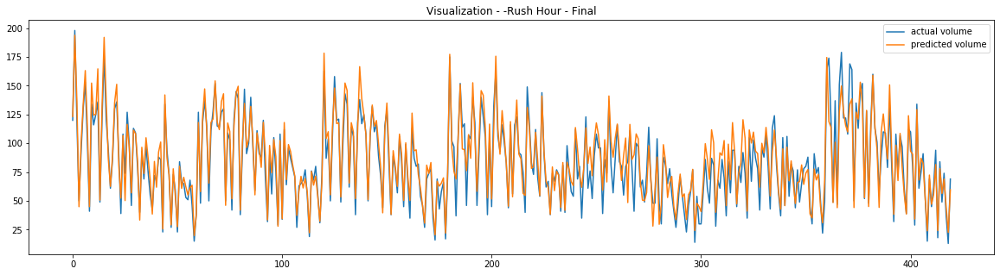

In [161]:
# Checking on the rush hour periods
test_df = avg_volume_test.copy()
test_df = convert_dataframe(test_df)
test_df['preds'] = test_preds

test_df_rush_hour = test_df[((test_df['hour'] >= 8) & (test_df['hour'] < 10)) | ((test_df['hour'] >= 17) & (test_df['hour'] < 19))]

plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour['preds'].values, label='predicted volume')
plt.title('Visualization - -Rush Hour - Final')
plt.legend()
plt.show()

In [162]:
test_err = mape(test_df_rush_hour['volume'].values, test_df_rush_hour['preds'].values)
print ("MAPE: %f" % (test_err))

MAPE: 0.137198


### LightGBM

In [163]:
test_preds_lgb = lgb_reg.predict(test_df_lgb)

In [164]:
test_err_lgb = mape(test_label, test_preds)
print ("MAPE: %f" % (test_err_lgb))

MAPE: 0.202389


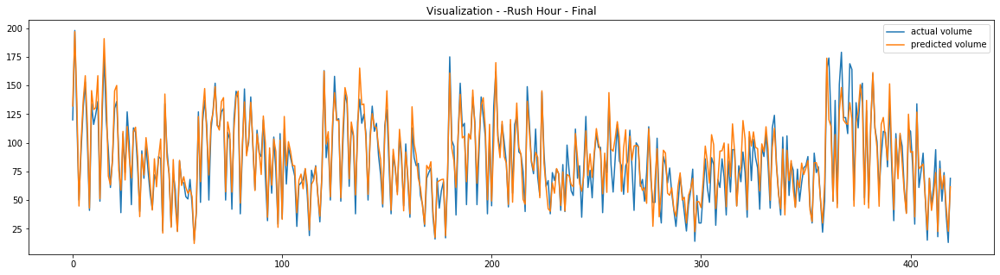

In [165]:
# Checking on the rush hour periods
test_df_lgb = avg_volume_test.copy()
test_df_lgb = convert_dataframe(test_df_lgb)
test_df_lgb['preds'] = test_preds_lgb

test_df_rush_hour_lgb = test_df_lgb[((test_df_lgb['hour'] >= 8) & (test_df_lgb['hour'] < 10)) | ((test_df_lgb['hour'] >= 17) & (test_df_lgb['hour'] < 19))]

plt.figure(figsize=(20,5))

plt.plot(test_df_rush_hour_lgb['volume'].values, label='actual volume')
plt.plot(test_df_rush_hour_lgb['preds'].values, label='predicted volume')
plt.title('Visualization - -Rush Hour - Final')
plt.legend()
plt.show()

In [166]:
test_err_lgb = mape(test_df_rush_hour_lgb['volume'].values, test_df_rush_hour_lgb['preds'].values)
print ("MAPE: %f" % (test_err_lgb))

MAPE: 0.137694
